In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from sklearn.preprocessing import RobustScaler, MinMaxScaler
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score, make_scorer

[link dataset](https://drive.google.com/drive/folders/1RP4NFwG0k3Lo9YF3cYV4jeT2VizpOmxw?usp=sharing)

### **Jakarta**

In [ ]:
jkt_low = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Jakarta_low.csv')
jkt_low_mid = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Jakarta_low_mid.csv')
jkt_up_mid = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Jakarta_Up_mid.csv')
jkt_high = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Jakarta_high.csv')
jkt_luxury = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Jakarta_luxury.csv')

In [ ]:
def convert_harga(row):
  if (row['satuan'] == 'Juta'):
    return row['nominal'] * 1000000
  elif (row['satuan'] == 'Miliar'):
    return row['nominal'] * 1000000000
  else:
    return np.nan

In [ ]:
def convert_pipeline(df):
  new_df = df.copy()
  new_df = new_df.drop_duplicates()
  # new_df = new_df.dropna()
  features = ['Luas Tanah', 'Luas Bangunan', 'Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai', 'Category', 'Harga']
  new_df = new_df[features].copy()

  lt = new_df['Luas Tanah'].str.split().str[0]
  lb = new_df['Luas Bangunan'].str.split().str[0]
  new_df['Luas Tanah'] = lt
  new_df['Luas Bangunan'] = lb
  new_df[['Luas Tanah', 'Luas Bangunan']] = new_df[['Luas Tanah', 'Luas Bangunan']].apply(pd.to_numeric, errors='coerce')

  new_df[['nominal', 'satuan']] = new_df['Harga'].str.split(expand=True)[[1, 2]]
  new_df['nominal'] = new_df['nominal'].str.replace(',', '.')
  new_df['nominal'] = pd.to_numeric(new_df['nominal'], errors='coerce')
  new_df['converted'] = new_df[['nominal', 'satuan']].apply(convert_harga, axis='columns')

  return new_df

In [ ]:
def get_histplot(df, **kwargs):
  features = ['Luas Tanah', 'Luas Bangunan', 'Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai', 'converted']

  for col in features:
    plt.figure()
    sns.histplot(df[col], bins=kwargs.get('bins', 'auto'), kde=True, log_scale=kwargs.get('log_scale', False))
    plt.title(col)
    plt.show()

In [ ]:
def get_boxplot(df):
  features = ['Luas Tanah', 'Luas Bangunan', 'Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai', 'converted']

  for col in features:
    plt.figure()
    sns.boxplot(df[col])
    plt.title(col)
    plt.show()

In [ ]:
def get_iqr(df):
  features = ['Luas Tanah', 'Luas Bangunan', 'Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai', 'converted']
  iqr_dict = {}

  for col in features:
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1

    if col == 'converted':
      lower_bound = q1 - (1.5 * iqr)
      upper_bound = q3 + (1.5 * iqr)
      iqr_dict[col] = [lower_bound, upper_bound]
    else:
      lower_bound = q1 - (1.5 * iqr)
      upper_bound = q3 + (1.5 * iqr)
      iqr_dict[col] = [max(1, np.floor(lower_bound)), np.ceil(upper_bound)]

  return iqr_dict

In [ ]:
def get_outlier(df):
  features = ['Luas Tanah', 'Luas Bangunan', 'Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai', 'converted']
  iqr_dict = get_iqr(df)
  outlier_indices = []

  for col in features:
    lower_bound = iqr_dict[col][0]
    upper_bound = iqr_dict[col][1]
    filt = (df[col] < lower_bound) | (df[col] > upper_bound)
    outlier_indices.extend(df.loc[filt, col].index.tolist())

    num_outliers = df.loc[filt, col].shape[0]
    print(f'{col} -- found outliers: {num_outliers} ')

  outlier_indices = list(set(outlier_indices))

  print('\n\ndf with outliers')
  print(df.loc[outlier_indices, features])


In [ ]:
def remove_outlier(df):
  features = ['Luas Tanah', 'Luas Bangunan', 'Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai', 'converted']
  iqr_dict = get_iqr(df)
  new_df = df.copy()

  for col in features:
    lower_bound = iqr_dict[col][0]
    upper_bound = iqr_dict[col][1]
    filt = (new_df[col] >= lower_bound) & (new_df[col] <= upper_bound)
    new_df = new_df[filt]

  return new_df

In [ ]:
def replace_outlier(df):
  features = ['Luas Tanah', 'Luas Bangunan', 'Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai', 'converted']
  iqr_dict = get_iqr(df)
  new_df = df.copy()

  for col in features:
    lower_bound = iqr_dict[col][0]
    upper_bound = iqr_dict[col][1]
    new_df[col] = new_df[col].clip(lower=lower_bound, upper=upper_bound)

  return new_df

In [ ]:
def replace_zero(df):
  features = ['Luas Tanah', 'Luas Bangunan', 'Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai']
  new_df = df.copy()

  for col in features:
    median = int(new_df[col].median())
    new_df[col] = new_df[col].replace(0, median)

  return new_df

In [ ]:
def get_corr(df):
  features = ['Luas Tanah', 'Luas Bangunan', 'Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai', 'converted']
  return sns.heatmap(df[features].corr(), annot=True)

In [ ]:
def split_scaled(df, scaler_robust, scaler_minmax):
    new_df = df.copy()
    X = new_df.drop(columns=['converted', 'Category', 'Harga', 'nominal', 'satuan'])
    y = new_df['converted']

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    X_train_scaled = X_train.copy()
    X_test_scaled = X_test.copy()

    X_train_scaled[['Luas Tanah', 'Luas Bangunan']] = scaler_robust.fit_transform(X_train[['Luas Tanah', 'Luas Bangunan']])
    X_train_scaled[['Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai']] = scaler_minmax.fit_transform(X_train[['Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai']])

    X_test_scaled[['Luas Tanah', 'Luas Bangunan']] = scaler_robust.transform(X_test[['Luas Tanah', 'Luas Bangunan']])
    X_test_scaled[['Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai']] = scaler_minmax.transform(X_test[['Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai']])

    y_train_log = np.log1p(y_train)
    y_test_log = np.log1p(y_test)

    return X_train_scaled, X_test_scaled, y_train_log, y_test_log

In [ ]:
def scale_feature(scaler_robust, scaler_minmax, list):
  new_list = list.copy()
  series_scaled = pd.DataFrame([new_list])
  series_scaled.columns = ['Luas Tanah', 'Luas Bangunan', 'Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai', 'converted']

  series_scaled[['Luas Tanah', 'Luas Bangunan']] = scaler_robust.transform(series_scaled[['Luas Tanah', 'Luas Bangunan']])
  series_scaled[['Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai']] = scaler_minmax.transform(series_scaled[['Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai']])
  series_scaled['converted'] = np.log1p(series_scaled['converted'])

  return series_scaled

In [ ]:
def inverse_scale_feature(scaler_robust, scaler_minmax, series):
  new_list = series.copy()
  series_inversed = pd.DataFrame([new_list])
  series_inversed.columns = ['Luas Tanah', 'Luas Bangunan', 'Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai']

  series_inversed[['Luas Tanah', 'Luas Bangunan']] = scaler_robust.inverse_transform(series_inversed[['Luas Tanah', 'Luas Bangunan']])
  series_inversed[['Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai']] = scaler_minmax.inverse_transform(series_inversed[['Kamar Tidur', 'Kamar Mandi', 'Jumlah Lantai']])

  return series_inversed

In [ ]:
def get_model_summary(model, X_test, y_test):
  y_pred = model.predict(X_test)
  mae = mean_absolute_error(y_test, y_pred)
  mse = mean_squared_error(y_test, y_pred)
  r2 = r2_score(y_test, y_pred)

  print(f"MAE: {mae}")
  print(f"MSE: {mse}")
  print(f"R-squared: {r2}")
  print("")

  errors = abs(y_test - y_pred)
  print("Error for cheapest house:", np.min(errors))
  print("Error for most expensive house:", np.max(errors))
  print("")

  mape = (abs(y_test - y_pred) / y_test).mean() * 100
  print(f"MAPE: {mape:.2f}%")

In [ ]:
def get_model_summary_scaled(model, X_test, y_test_log):
    y_pred_log = model.predict(X_test)

    # Convert back to original scale
    y_test = np.expm1(y_test_log)
    y_pred = np.expm1(y_pred_log)

    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"MAE: {mae}")
    print(f"MSE: {mse}")
    print(f"R-squared: {r2}")
    print("")

    errors = abs(y_test - y_pred)
    print("Error for cheapest house:", np.min(errors))
    print("Error for most expensive house:", np.max(errors))
    print("")

    mape = (errors / y_test).mean() * 100
    print(f"MAPE: {mape:.2f}%")

#### jkt_low

In [ ]:
jkt_low.shape

(277, 14)

In [ ]:
jkt_low.head()

,Nama,Harga,Kamar Tidur,Kamar Mandi,Luas Tanah,Luas Bangunan,Sertifikat,Daya Listrik,Jumlah Lantai,Kondisi Properti,Carport,Garasi,Kamar Tidur Pembantu,Kamar Mandi Pembantu
0,rumah cantik modern minimalis lokasi strategis...,Rp 422 Juta,2,2,20 m²,31 m²,SHM,Lainnya,2,Bagus,1,1,1,1
1,Rumah 2 Lantai Murah Dan Strategis Dekat Jalan...,Rp 457 Juta,2,2,21 m²,41 m²,SHM,2200 Watt,2,Bagus,1,1,1,1
2,Rumah Murah 2 Lantai Dekat Mangga Besar Shm,,2,2,21 m²,41 m²,SHM,2200 Watt,2,Bagus,1,1,1,1
3,Rumah 2 Lantai Strategis Dekat Stasiun Jatineg...,Rp 278 Juta,1,1,15 m²,29 m²,SHM,Lainnya,2,Bagus,1,1,1,1
4,3 Lantai Rumah Akses Motor Dekat Office Salemba,Rp 470 Juta,3,2,25 m²,75 m²,SHM,2200 Watt,3,Baru,1,1,1,1


In [ ]:
jkt_low['Category'] = 'Low'

In [ ]:
jkt_low2 = convert_pipeline(jkt_low)

In [ ]:
jkt_low2.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,20,31,2,2,2,Low,Rp 422 Juta,422.0,Juta,422000000.0
1,21,41,2,2,2,Low,Rp 457 Juta,457.0,Juta,457000000.0
2,21,41,2,2,2,Low,,NaN,None,NaN
3,15,29,1,1,2,Low,Rp 278 Juta,278.0,Juta,278000000.0
4,25,75,3,2,3,Low,Rp 470 Juta,470.0,Juta,470000000.0


In [ ]:
jkt_low2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 272 entries, 0 to 276
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Luas Tanah     272 non-null    int64  
 1   Luas Bangunan  272 non-null    int64  
 2   Kamar Tidur    272 non-null    int64  
 3   Kamar Mandi    272 non-null    int64  
 4   Jumlah Lantai  272 non-null    int64  
 5   Category       272 non-null    object 
 6   Harga          272 non-null    object 
 7   nominal        262 non-null    float64
 8   satuan         262 non-null    object 
 9   converted      262 non-null    float64
dtypes: float64(2), int64(5), object(3)
memory usage: 23.4+ KB


In [ ]:
jkt_low2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,10
satuan,10
converted,10


In [ ]:
(jkt_low2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,4
Kamar Mandi,3
Jumlah Lantai,18
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
filt = jkt_low2['Jumlah Lantai'] == 0

In [ ]:
jkt_low2.loc[filt]

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
258,50,30,2,1,0,Low,Rp 339 Juta,339.0,Juta,339000000.0
259,50,30,2,1,0,Low,Rp 339 Juta,339.0,Juta,339000000.0
260,114,147,2,1,0,Low,Rp 130 Juta,130.0,Juta,130000000.0
261,50,30,2,1,0,Low,Rp 339 Juta,339.0,Juta,339000000.0
262,50,30,2,1,0,Low,Rp 339 Juta,339.0,Juta,339000000.0
264,50,30,1,1,0,Low,Rp 339 Juta,339.0,Juta,339000000.0
265,50,30,1,1,0,Low,Rp 339 Juta,339.0,Juta,339000000.0
266,60,45,2,1,0,Low,Rp 360 Juta,360.0,Juta,360000000.0
267,60,30,1,1,0,Low,Rp 284 Juta,284.0,Juta,284000000.0
268,40,24,3,1,0,Low,Rp 280 Juta,280.0,Juta,280000000.0


In [ ]:
jkt_low2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,272.000000,272.000000,272.000000,272.000000,272.000000,262.000000,2.620000e+02
mean,50.022059,53.003676,2.077206,1.411765,1.349265,374.122137,3.741221e+08
std,55.943760,63.246224,0.727374,0.702873,0.618950,103.850137,1.038501e+08
min,10.000000,20.000000,0.000000,0.000000,0.000000,110.000000,1.100000e+08
25%,23.000000,36.000000,2.000000,1.000000,1.000000,303.750000,3.037500e+08
50%,40.000000,41.000000,2.000000,1.000000,1.000000,399.000000,3.990000e+08
75%,60.000000,50.000000,2.000000,2.000000,2.000000,467.250000,4.672500e+08
max,713.000000,765.000000,5.000000,5.000000,3.000000,500.000000,5.000000e+08


In [ ]:
jkt_low2.dropna(inplace=True)

In [ ]:
jkt_low2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
(jkt_low2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,4
Kamar Mandi,3
Jumlah Lantai,18
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
jkt_low2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,262.000000,262.000000,262.000000,262.00000,262.000000,262.000000,2.620000e+02
mean,50.950382,53.465649,2.080153,1.40458,1.339695,374.122137,3.741221e+08
std,56.782517,64.390190,0.735829,0.70877,0.621354,103.850137,1.038501e+08
min,10.000000,20.000000,0.000000,0.00000,0.000000,110.000000,1.100000e+08
25%,23.000000,36.000000,2.000000,1.00000,1.000000,303.750000,3.037500e+08
50%,40.000000,41.000000,2.000000,1.00000,1.000000,399.000000,3.990000e+08
75%,60.000000,50.000000,2.000000,2.00000,2.000000,467.250000,4.672500e+08
max,713.000000,765.000000,5.000000,5.00000,3.000000,500.000000,5.000000e+08


In [ ]:
jkt_low2 = replace_zero(jkt_low2)

In [ ]:
(jkt_low2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
jkt_low2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 262 entries, 0 to 276
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Luas Tanah     262 non-null    int64  
 1   Luas Bangunan  262 non-null    int64  
 2   Kamar Tidur    262 non-null    int64  
 3   Kamar Mandi    262 non-null    int64  
 4   Jumlah Lantai  262 non-null    int64  
 5   Category       262 non-null    object 
 6   Harga          262 non-null    object 
 7   nominal        262 non-null    float64
 8   satuan         262 non-null    object 
 9   converted      262 non-null    float64
dtypes: float64(2), int64(5), object(3)
memory usage: 22.5+ KB


In [ ]:
get_iqr(jkt_low2)

{'Luas Tanah': [1, np.float64(116.0)],
 'Luas Bangunan': [np.float64(15.0), np.float64(71.0)],
 'Kamar Tidur': [np.float64(2.0), np.float64(2.0)],
 'Kamar Mandi': [1, np.float64(4.0)],
 'Jumlah Lantai': [1, np.float64(4.0)],
 'converted': [np.float64(58500000.0), np.float64(712500000.0)]}

In [ ]:
get_outlier(jkt_low2)

Luas Tanah -- found outliers: 11 
Luas Bangunan -- found outliers: 23 
Kamar Tidur -- found outliers: 74 
Kamar Mandi -- found outliers: 2 
Jumlah Lantai -- found outliers: 0 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
3            15             29            1            1              2   
4            25             75            3            2              3   
15           72             65            1            1              1   
27           96             77            2            1              2   
28           90             90            3            2              2   
..          ...            ...          ...          ...            ...   
265          50             30            1            1              1   
267          60             30            1            1              1   
268          40             24            3            1              1   
269          40        

In [ ]:
jkt_low_cleaned = remove_outlier(jkt_low2)

In [ ]:
jkt_low_cleaned.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,20,31,2,2,2,Low,Rp 422 Juta,422.0,Juta,422000000.0
1,21,41,2,2,2,Low,Rp 457 Juta,457.0,Juta,457000000.0
5,22,43,2,2,2,Low,Rp 477 Juta,477.0,Juta,477000000.0
6,21,41,2,2,2,Low,Rp 474 Juta,474.0,Juta,474000000.0
8,20,39,2,2,2,Low,Rp 458 Juta,458.0,Juta,458000000.0


In [ ]:
jkt_low_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,175.000000,175.000000,175.0,175.000000,175.000000,175.000000,1.750000e+02
mean,40.274286,40.571429,2.0,1.325714,1.457143,385.965714,3.859657e+08
std,20.274954,11.182102,0.0,0.482059,0.522090,101.106175,1.011062e+08
min,10.000000,20.000000,2.0,1.000000,1.000000,150.000000,1.500000e+08
25%,22.000000,36.000000,2.0,1.000000,1.000000,339.000000,3.390000e+08
50%,30.000000,41.000000,2.0,1.000000,1.000000,405.000000,4.050000e+08
75%,60.000000,45.000000,2.0,2.000000,2.000000,475.000000,4.750000e+08
max,100.000000,62.000000,2.0,3.000000,3.000000,500.000000,5.000000e+08


In [ ]:
corr = ['satuan', 'Harga', 'nominal', 'Category']

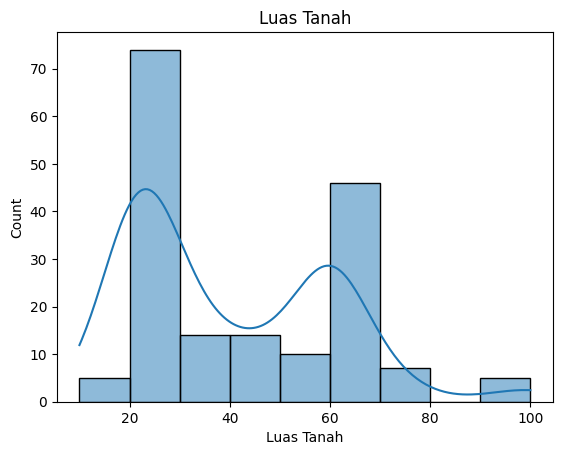

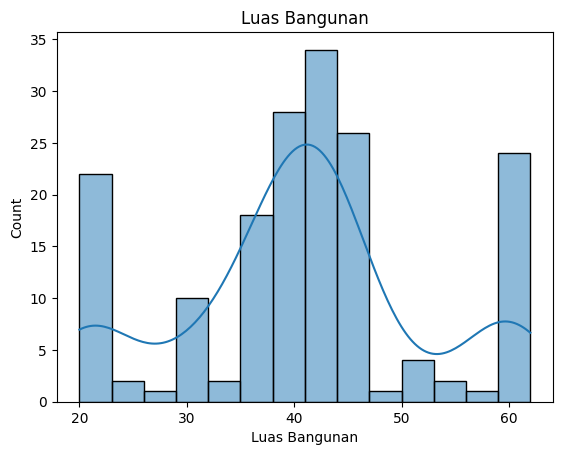

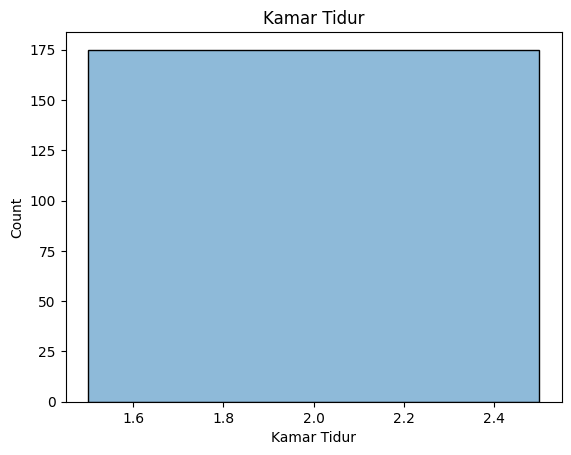

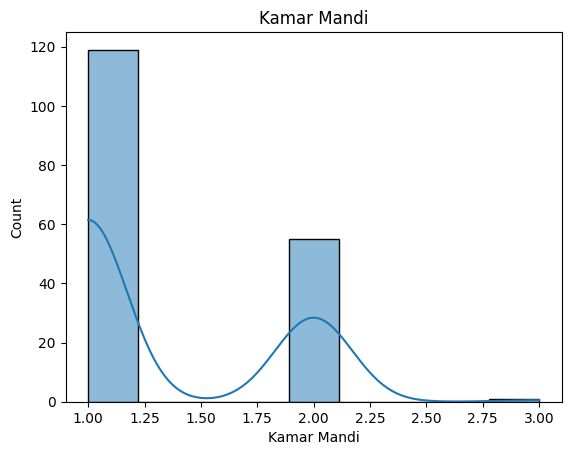

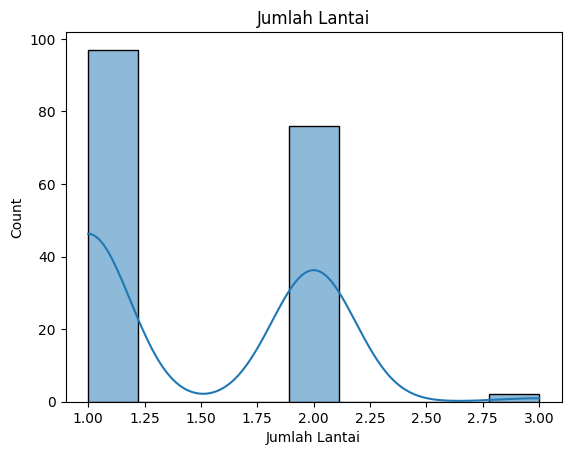

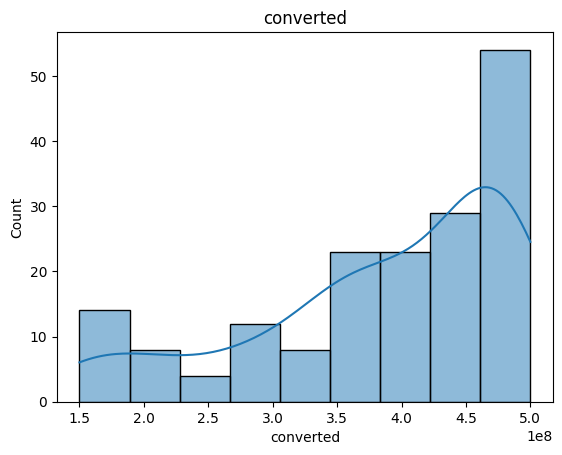

In [ ]:
get_histplot(jkt_low_cleaned)

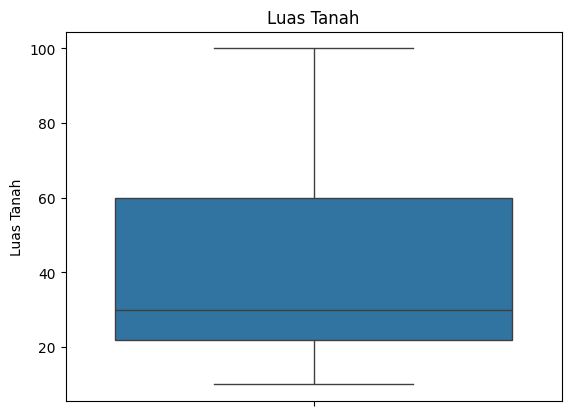

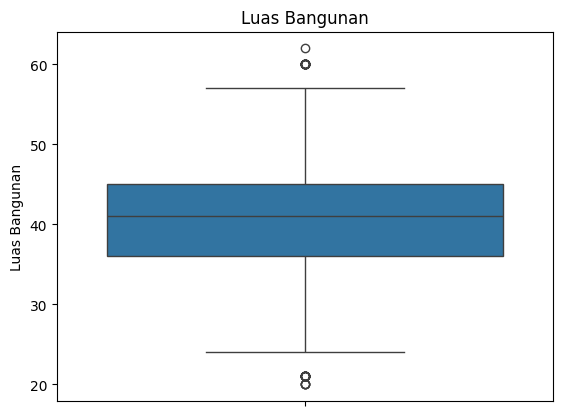

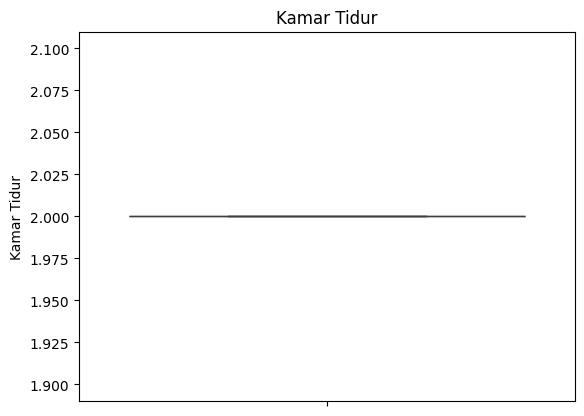

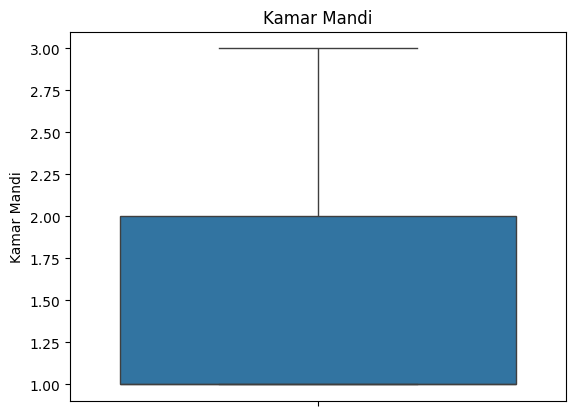

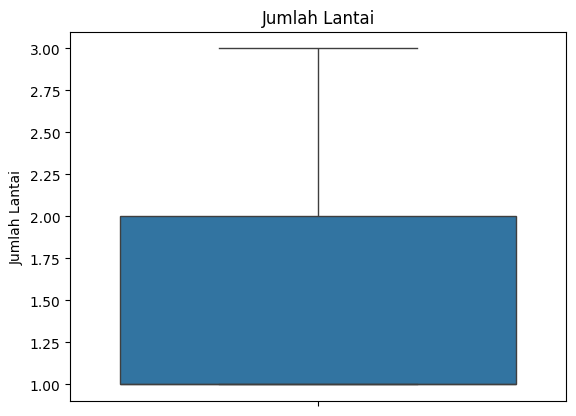

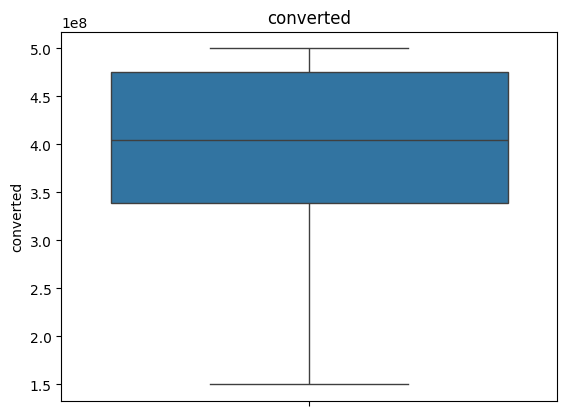

In [ ]:
get_boxplot(jkt_low_cleaned)

<Axes: >

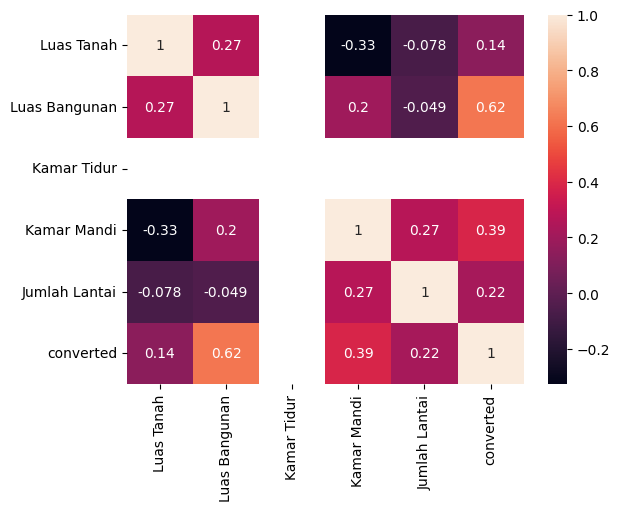

In [ ]:
sns.heatmap(jkt_low_cleaned.drop(columns=corr).corr(), annot=True)

#### jkt_low_mid

In [ ]:
jkt_low_mid2 = convert_pipeline(jkt_low_mid)

In [ ]:
jkt_low_mid.shape

(216, 15)

In [ ]:
jkt_low_mid2.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,24,71,2,2,3,Low-Mid,Rp 780 Juta,780.0,Juta,780000000.0
1,106,70,2,2,1,Low-Mid,Rp 940 Juta,940.0,Juta,940000000.0
2,92,78,2,1,1,Low-Mid,,NaN,None,NaN
3,32,53,2,2,2,Low-Mid,Rp 840 Juta,840.0,Juta,840000000.0
4,76,53,2,1,2,Low-Mid,Rp 550 Juta,550.0,Juta,550000000.0


In [ ]:
jkt_low_mid2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216 entries, 0 to 215
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Luas Tanah     216 non-null    int64  
 1   Luas Bangunan  216 non-null    int64  
 2   Kamar Tidur    216 non-null    int64  
 3   Kamar Mandi    216 non-null    int64  
 4   Jumlah Lantai  216 non-null    int64  
 5   Category       216 non-null    object 
 6   Harga          216 non-null    object 
 7   nominal        191 non-null    float64
 8   satuan         191 non-null    object 
 9   converted      191 non-null    float64
dtypes: float64(2), int64(5), object(3)
memory usage: 17.0+ KB


In [ ]:
jkt_low_mid2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,25
satuan,25
converted,25


In [ ]:
(jkt_low_mid2 == 0).sum()

,0
Luas Tanah,1
Luas Bangunan,0
Kamar Tidur,4
Kamar Mandi,4
Jumlah Lantai,12
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
jkt_low_mid2.dropna(inplace=True)

In [ ]:
jkt_low_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,191.000000,191.000000,191.000000,191.000000,191.000000,191.000000,1.910000e+02
mean,63.801047,76.282723,2.513089,1.795812,1.701571,750.879581,8.293351e+08
std,46.890491,49.091897,0.887686,0.692200,0.680517,252.766735,1.349418e+08
min,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,5.000000e+08
25%,44.000000,54.000000,2.000000,1.000000,1.000000,700.000000,7.500000e+08
50%,60.000000,70.000000,2.000000,2.000000,2.000000,800.000000,8.500000e+08
75%,70.000000,85.000000,3.000000,2.000000,2.000000,900.000000,9.500000e+08
max,600.000000,600.000000,9.000000,6.000000,3.000000,998.000000,1.000000e+09


In [ ]:
jkt_low_mid2 = replace_zero(jkt_low_mid2)

In [ ]:
(jkt_low_mid2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
get_iqr(jkt_low_mid2)

{'Luas Tanah': [np.float64(6.0), np.float64(109.0)],
 'Luas Bangunan': [np.float64(7.0), np.float64(132.0)],
 'Kamar Tidur': [1, np.float64(5.0)],
 'Kamar Mandi': [1, np.float64(4.0)],
 'Jumlah Lantai': [1, np.float64(3.0)],
 'converted': [np.float64(450000000.0), np.float64(1250000000.0)]}

In [ ]:
get_outlier(jkt_low_mid2)

Luas Tanah -- found outliers: 13 
Luas Bangunan -- found outliers: 10 
Kamar Tidur -- found outliers: 3 
Kamar Mandi -- found outliers: 1 
Jumlah Lantai -- found outliers: 0 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
15          122             95            3            2              1   
160         112             60            2            1              3   
34          120             70            2            1              2   
162          90            140            3            2              2   
164          53            140            2            1              2   
41          119            240            1            2              2   
170         150             80            2            2              1   
172         116             83            3            2              3   
176          50            180            2            2              3   
180          90         

In [ ]:
jkt_low_mid_cleaned = replace_outlier(jkt_low_mid2)

In [ ]:
jkt_low_mid2.shape

(191, 10)

In [ ]:
jkt_low_mid_cleaned.shape

(191, 10)

In [ ]:
jkt_low_mid_cleaned.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,24,71,2,2,3,Low-Mid,Rp 780 Juta,780.0,Juta,780000000.0
1,106,70,2,2,1,Low-Mid,Rp 940 Juta,940.0,Juta,940000000.0
3,32,53,2,2,2,Low-Mid,Rp 840 Juta,840.0,Juta,840000000.0
4,76,53,2,1,2,Low-Mid,Rp 550 Juta,550.0,Juta,550000000.0
5,63,76,3,2,2,Low-Mid,Rp 850 Juta,850.0,Juta,850000000.0


In [ ]:
jkt_low_mid_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,191.000000,191.000000,191.000000,191.000000,191.000000,191.000000,1.910000e+02
mean,60.392670,71.910995,2.513089,1.816754,1.816754,750.879581,8.293351e+08
std,22.744988,24.353481,0.663790,0.600817,0.536001,252.766735,1.349418e+08
min,14.000000,7.000000,1.000000,1.000000,1.000000,1.000000,5.000000e+08
25%,44.500000,54.000000,2.000000,1.000000,1.500000,700.000000,7.500000e+08
50%,60.000000,70.000000,2.000000,2.000000,2.000000,800.000000,8.500000e+08
75%,70.000000,85.000000,3.000000,2.000000,2.000000,900.000000,9.500000e+08
max,109.000000,132.000000,5.000000,4.000000,3.000000,998.000000,1.000000e+09


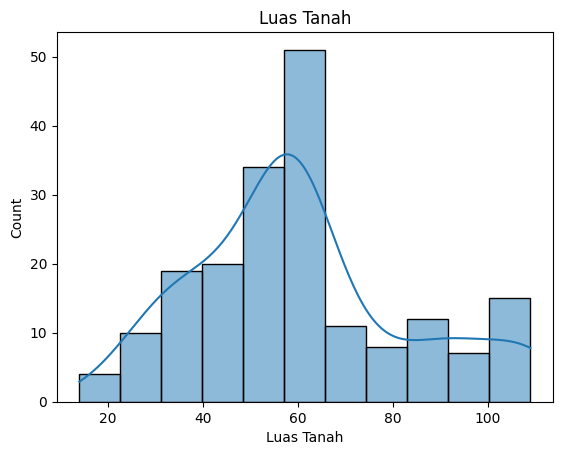

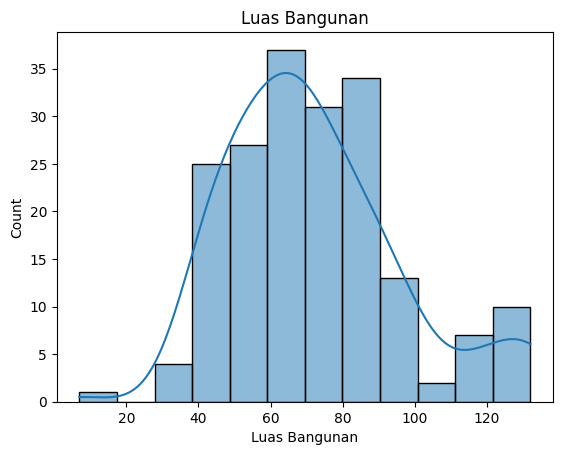

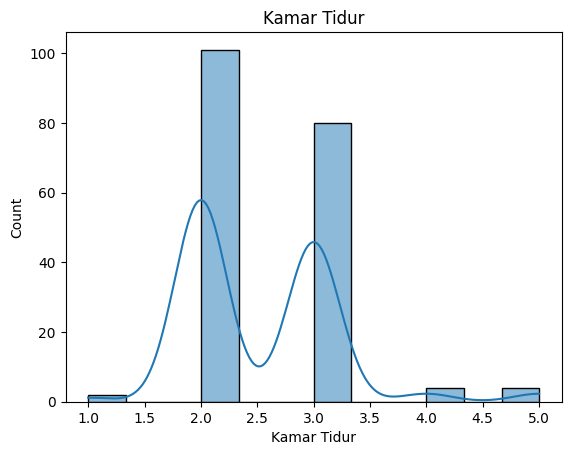

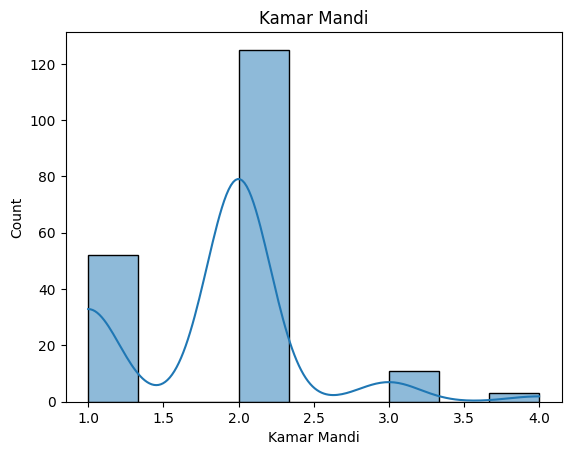

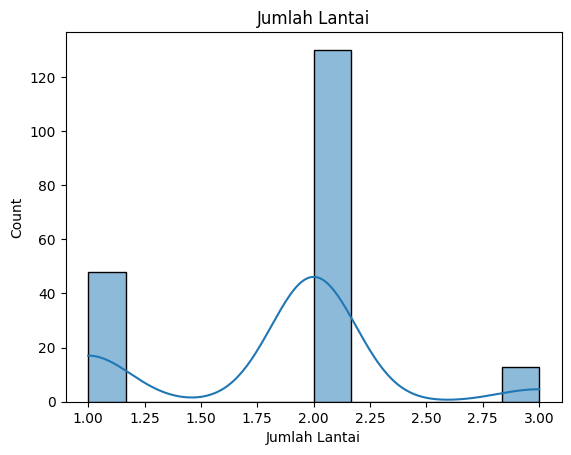

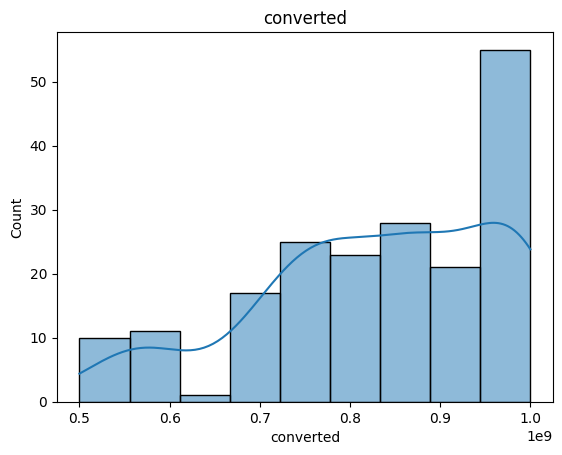

In [ ]:
get_histplot(jkt_low_mid_cleaned)

<Axes: >

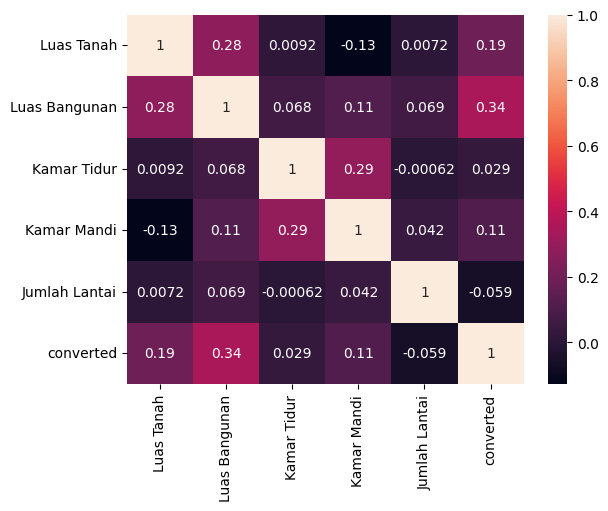

In [ ]:
get_corr(jkt_low_mid_cleaned)

In [ ]:
jkt_low_mid_cleaned.drop(columns=corr).corr()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,converted
Luas Tanah,1.000000,0.276134,0.009244,-0.127965,0.007228,0.186841
Luas Bangunan,0.276134,1.000000,0.067630,0.110747,0.069304,0.343938
Kamar Tidur,0.009244,0.067630,1.000000,0.289780,-0.000620,0.028860
Kamar Mandi,-0.127965,0.110747,0.289780,1.000000,0.042270,0.108718
Jumlah Lantai,0.007228,0.069304,-0.000620,0.042270,1.000000,-0.058743
converted,0.186841,0.343938,0.028860,0.108718,-0.058743,1.000000


#### jkt_up_mid

In [ ]:
jkt_up_mid2 = convert_pipeline(jkt_up_mid)

In [ ]:
jkt_up_mid.shape

(362, 15)

In [ ]:
jkt_up_mid2.shape

(362, 10)

In [ ]:
jkt_up_mid2.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,90,120,3,2,2,Up-Mid,"Rp 2,17 Miliar",2.17,Miliar,2.170000e+09
1,105,120,3,2,2,Up-Mid,"Rp 2,17 Miliar",2.17,Miliar,2.170000e+09
2,178,150,8,4,2,Up-Mid,"Rp 2,05 Miliar",2.05,Miliar,2.050000e+09
3,90,120,3,2,2,Up-Mid,"Rp 1,65 Miliar",1.65,Miliar,1.650000e+09
4,70,80,3,3,2,Up-Mid,"Rp 2,3 Miliar",2.30,Miliar,2.300000e+09


In [ ]:
jkt_up_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,362.000000,362.000000,362.000000,362.000000,362.000000,279.000000,2.790000e+02
mean,123.875691,161.317680,3.259669,2.538674,1.969613,2.081541,2.081541e+09
std,392.027104,495.868366,1.372051,0.886898,0.703505,0.519557,5.195572e+08
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000e+09
25%,73.250000,90.000000,3.000000,2.000000,2.000000,1.650000,1.650000e+09
50%,90.000000,121.500000,3.000000,3.000000,2.000000,2.170000,2.170000e+09
75%,120.000000,165.000000,4.000000,3.000000,2.000000,2.500000,2.500000e+09
max,7500.000000,9500.000000,15.000000,6.000000,4.000000,3.000000,3.000000e+09


In [ ]:
jkt_up_mid2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,83
satuan,83
converted,83


In [ ]:
(jkt_up_mid2 == 0).sum()

,0
Luas Tanah,1
Luas Bangunan,1
Kamar Tidur,5
Kamar Mandi,4
Jumlah Lantai,16
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
jkt_up_mid2.dropna(inplace=True)

In [ ]:
jkt_up_mid2 = replace_zero(jkt_up_mid2)

In [ ]:
jkt_up_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,279.000000,279.000000,279.000000,279.000000,279.000000,279.000000,2.790000e+02
mean,132.465950,171.870968,3.315412,2.569892,2.075269,2.081541,2.081541e+09
std,445.842697,563.968050,1.399182,0.861626,0.579690,0.519557,5.195572e+08
min,35.000000,42.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+09
25%,75.000000,94.000000,3.000000,2.000000,2.000000,1.650000,1.650000e+09
50%,92.000000,124.000000,3.000000,3.000000,2.000000,2.170000,2.170000e+09
75%,120.000000,169.000000,4.000000,3.000000,2.000000,2.500000,2.500000e+09
max,7500.000000,9500.000000,15.000000,6.000000,4.000000,3.000000,3.000000e+09


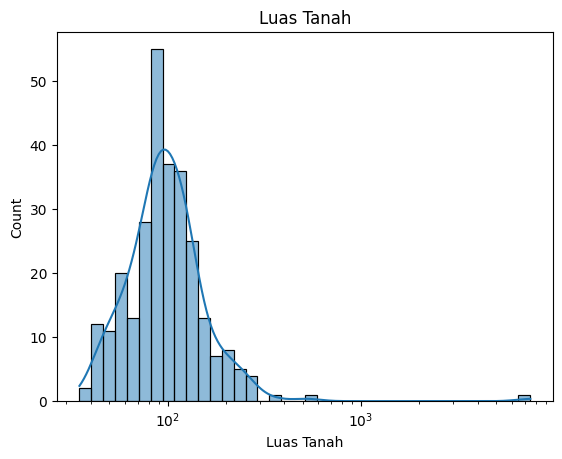

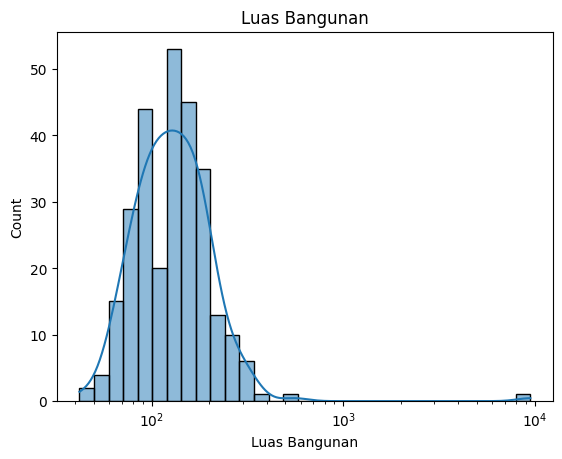

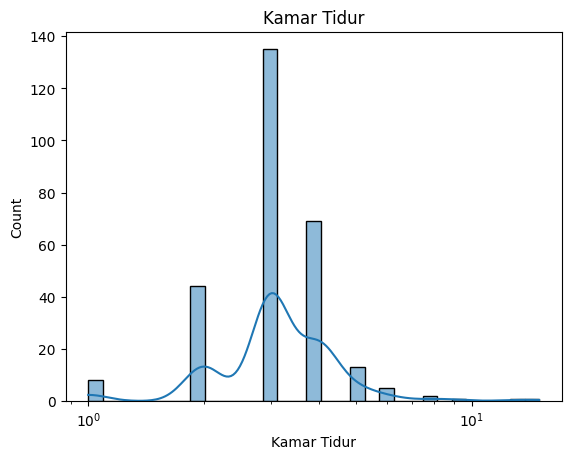

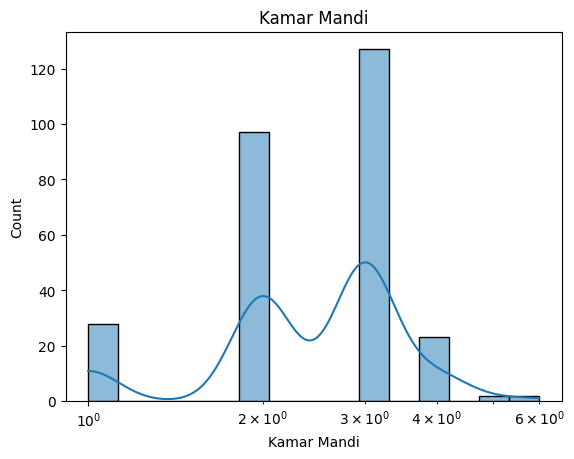

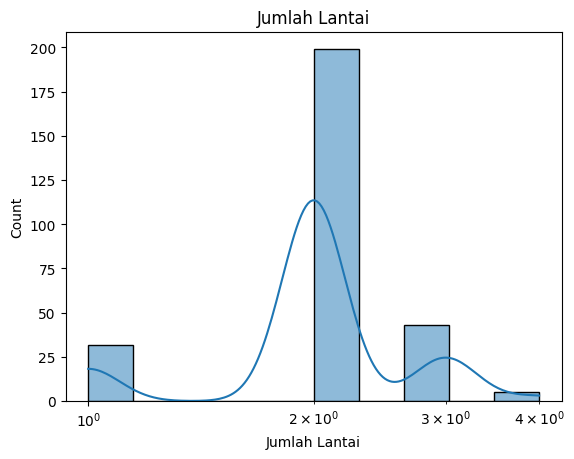

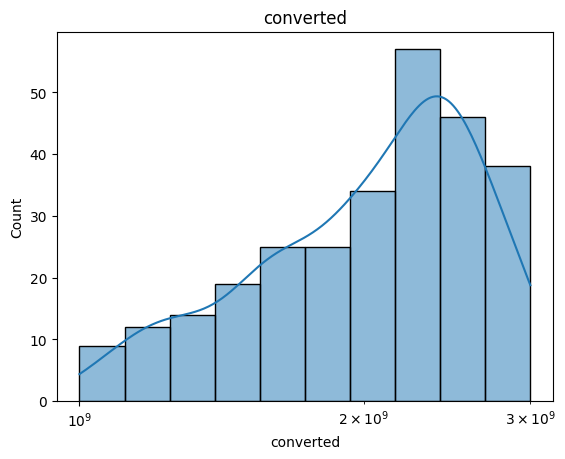

In [ ]:
get_histplot(jkt_up_mid2, log_scale=True)

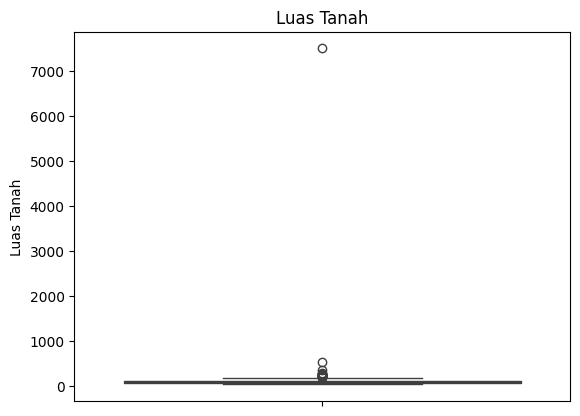

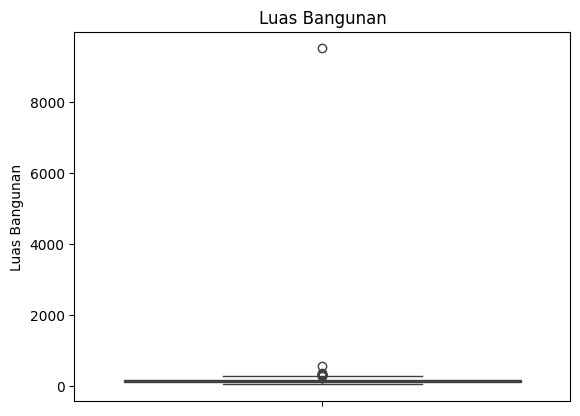

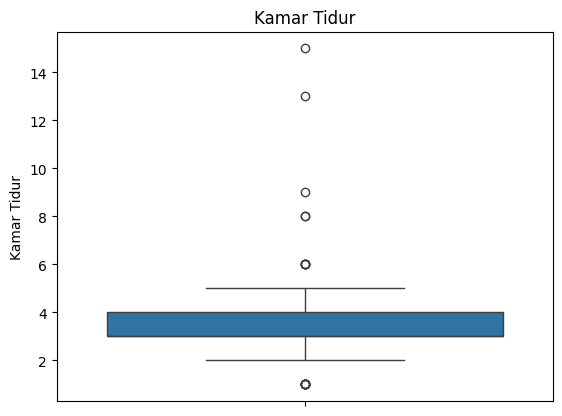

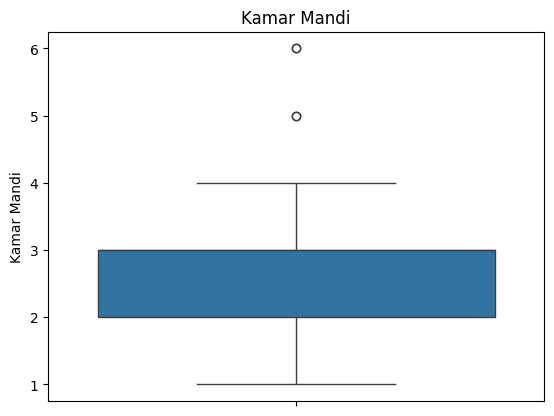

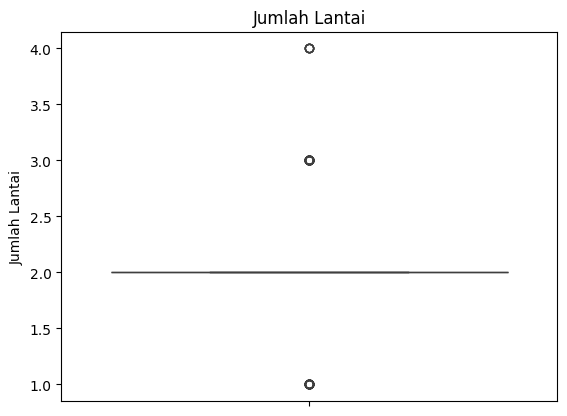

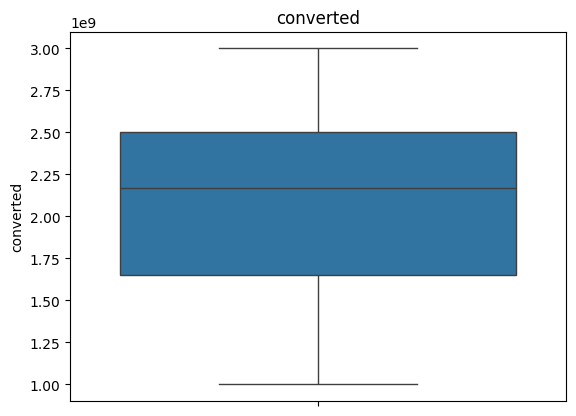

In [ ]:
get_boxplot(jkt_up_mid2)

In [ ]:
get_iqr(jkt_up_mid2)

{'Luas Tanah': [np.float64(7.0), np.float64(188.0)],
 'Luas Bangunan': [1, np.float64(282.0)],
 'Kamar Tidur': [1, np.float64(6.0)],
 'Kamar Mandi': [1, np.float64(5.0)],
 'Jumlah Lantai': [np.float64(2.0), np.float64(2.0)],
 'converted': [np.float64(375000000.0), np.float64(3775000000.0)]}

In [ ]:
get_outlier(jkt_up_mid2)

Luas Tanah -- found outliers: 20 
Luas Bangunan -- found outliers: 11 
Kamar Tidur -- found outliers: 5 
Kamar Mandi -- found outliers: 2 
Jumlah Lantai -- found outliers: 80 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
2           178            150            8            4              2   
8           200            325            2            2              1   
11          120            254            2            1              3   
15          163            150            2            1              1   
17           75            100            3            1              1   
..          ...            ...          ...          ...            ...   
338         120            160            2            3              3   
340         124            163            3            2              3   
343          82            144            2            3              3   
344          63        

In [ ]:
jkt_up_mid_cleaned = remove_outlier(jkt_up_mid2)

In [ ]:
jkt_up_mid_cleaned.shape

(176, 10)

In [ ]:
jkt_up_mid_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,176.000000,176.000000,176.000000,176.000000,176.0,176.00000,1.760000e+02
mean,93.693182,127.005682,3.170455,2.596591,2.0,2.13000,2.130000e+09
std,32.321902,47.793663,0.877940,0.757281,0.0,0.51898,5.189803e+08
min,35.000000,45.000000,1.000000,1.000000,2.0,1.00000,1.000000e+09
25%,71.500000,90.000000,3.000000,2.000000,2.0,1.73750,1.737500e+09
50%,90.000000,120.000000,3.000000,3.000000,2.0,2.20000,2.200000e+09
75%,116.500000,156.250000,4.000000,3.000000,2.0,2.50000,2.500000e+09
max,180.000000,269.000000,6.000000,5.000000,2.0,3.00000,3.000000e+09


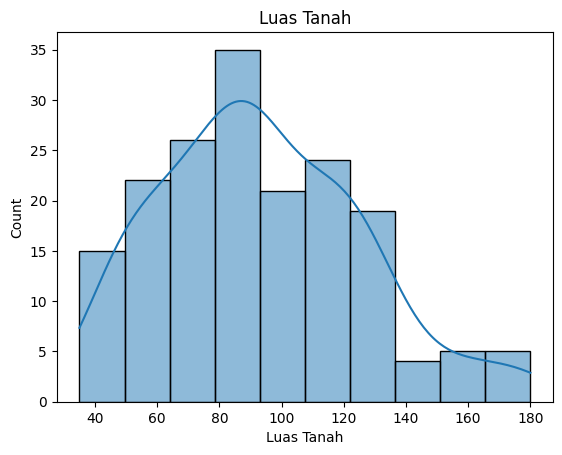

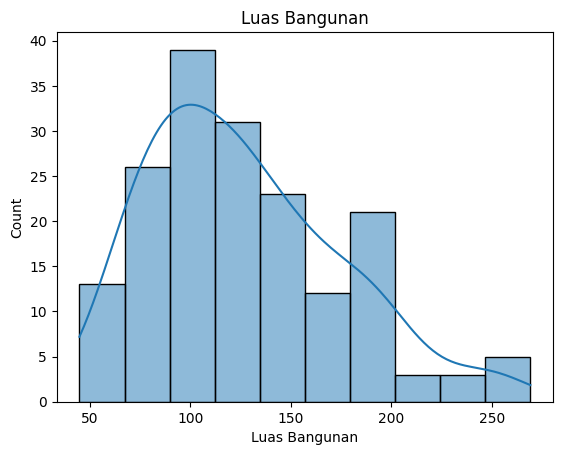

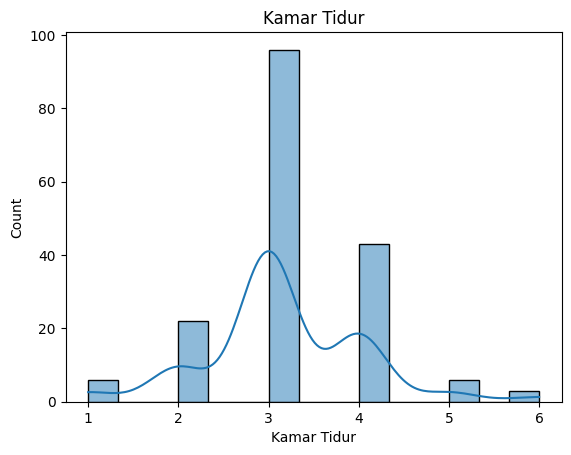

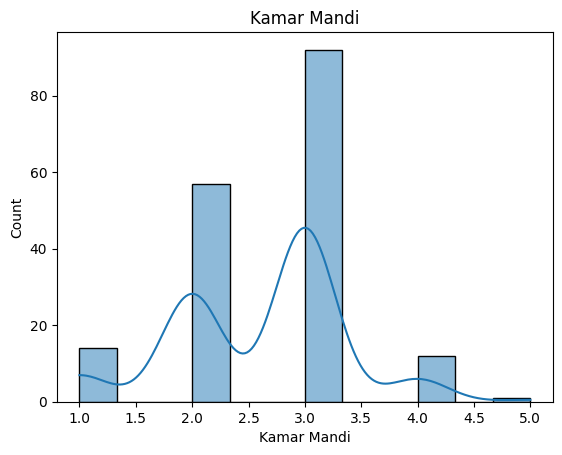

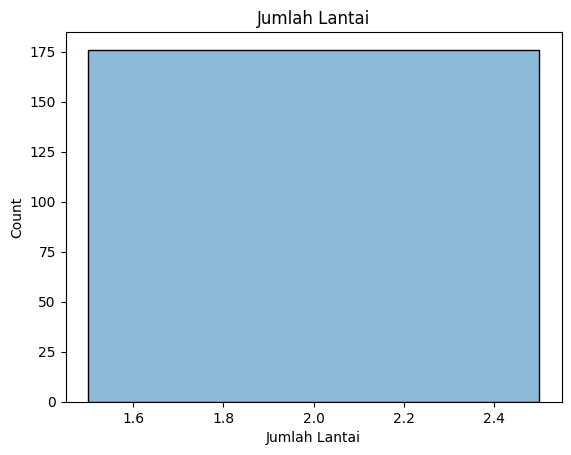

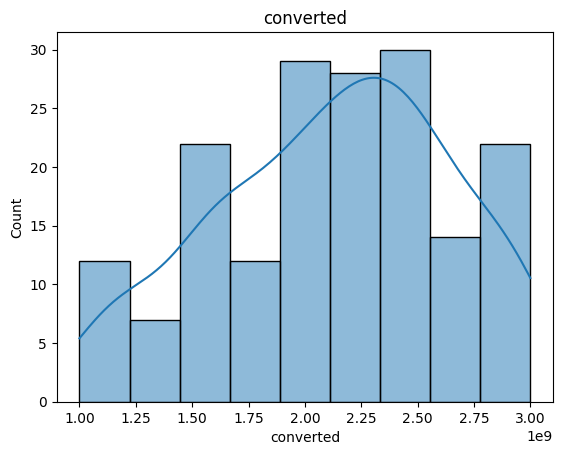

In [ ]:
get_histplot(jkt_up_mid_cleaned)

<Axes: >

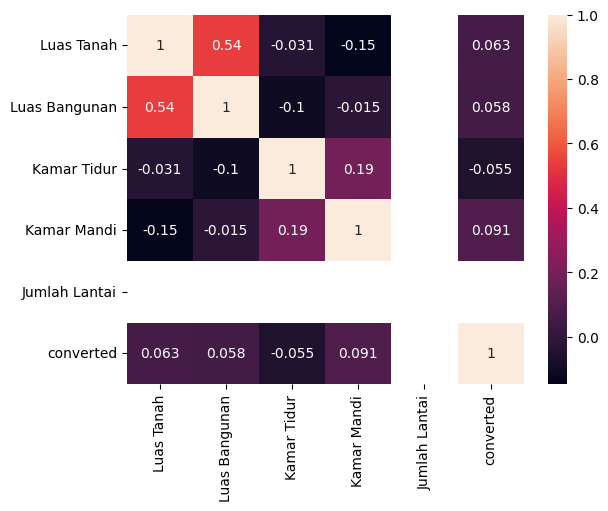

In [ ]:
get_corr(jkt_up_mid_cleaned)

#### jkt_high

In [ ]:
jkt_high2 = convert_pipeline(jkt_high)

In [ ]:
jkt_high.shape

(248, 15)

In [ ]:
jkt_high2.shape

(248, 10)

In [ ]:
jkt_high2.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,190,235,5,4,2,High,"Rp 4,7 Miliar",4.7,Miliar,4.700000e+09
1,200,200,4,4,4,High,"Rp 3,5 Miliar",3.5,Miliar,3.500000e+09
2,180,250,3,3,2,High,,NaN,None,NaN
3,105,108,3,2,2,High,"Rp 3,3 Miliar",3.3,Miliar,3.300000e+09
4,217,320,5,3,2,High,"Rp 5,5 Miliar",5.5,Miliar,5.500000e+09


In [ ]:
jkt_high2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,36
satuan,36
converted,36


In [ ]:
(jkt_high2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,7
Kamar Mandi,6
Jumlah Lantai,11
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
jkt_high2.dropna(inplace=True)

In [ ]:
jkt_high2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,2.120000e+02
mean,195.495283,239.948113,3.839623,3.089623,2.028302,4.645519,4.645519e+09
std,107.543070,95.211574,1.325197,1.158724,0.875767,1.109256,1.109256e+09
min,75.000000,90.000000,0.000000,0.000000,0.000000,3.000000,3.000000e+09
25%,127.750000,168.750000,3.000000,2.000000,2.000000,3.695000,3.695000e+09
50%,160.000000,220.000000,4.000000,3.000000,2.000000,4.475000,4.475000e+09
75%,234.250000,300.000000,4.000000,4.000000,2.000000,5.500000,5.500000e+09
max,1042.000000,645.000000,8.000000,7.000000,5.000000,7.000000,7.000000e+09


In [ ]:
jkt_high2 = replace_zero(jkt_high2)

In [ ]:
jkt_high2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,2.120000e+02
mean,195.495283,239.948113,3.971698,3.174528,2.132075,4.645519,4.645519e+09
std,107.543070,95.211574,1.118204,1.031592,0.736013,1.109256,1.109256e+09
min,75.000000,90.000000,1.000000,1.000000,1.000000,3.000000,3.000000e+09
25%,127.750000,168.750000,3.000000,3.000000,2.000000,3.695000,3.695000e+09
50%,160.000000,220.000000,4.000000,3.000000,2.000000,4.475000,4.475000e+09
75%,234.250000,300.000000,4.000000,4.000000,2.000000,5.500000,5.500000e+09
max,1042.000000,645.000000,8.000000,7.000000,5.000000,7.000000,7.000000e+09


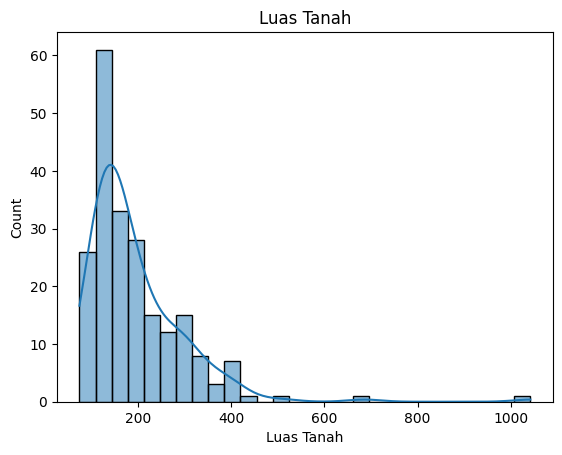

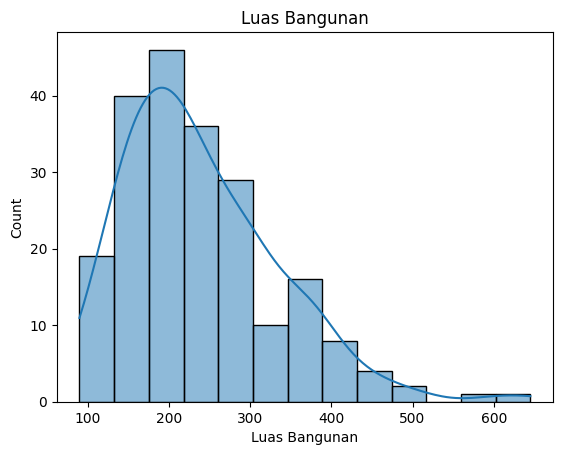

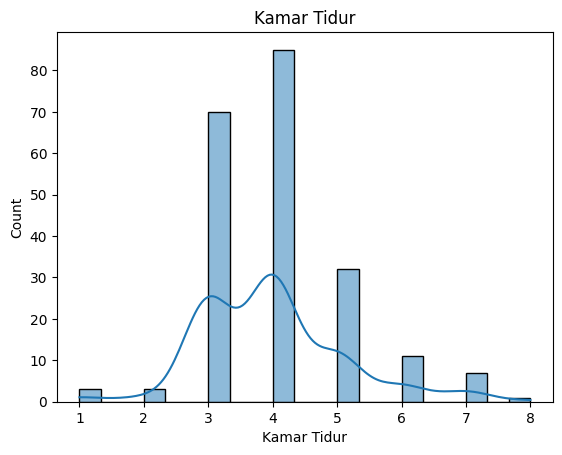

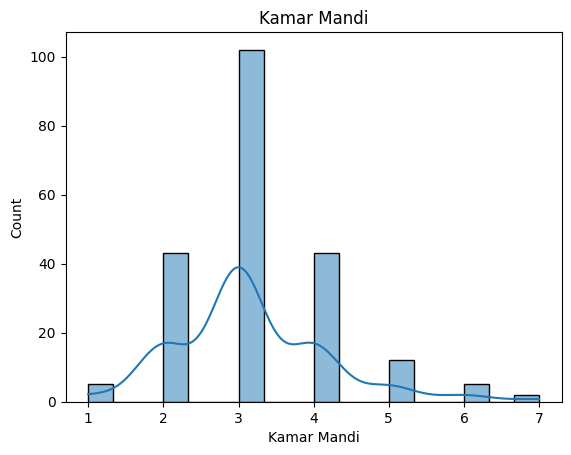

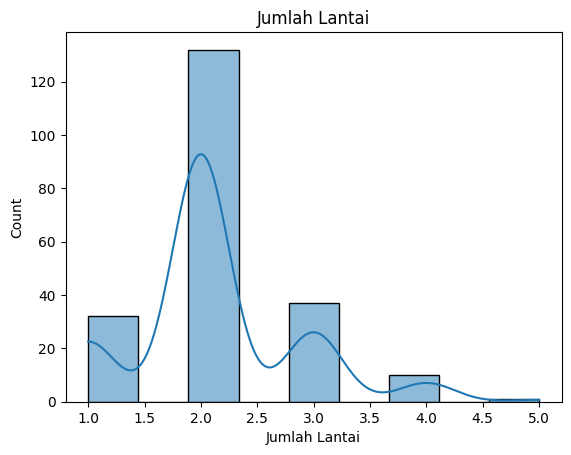

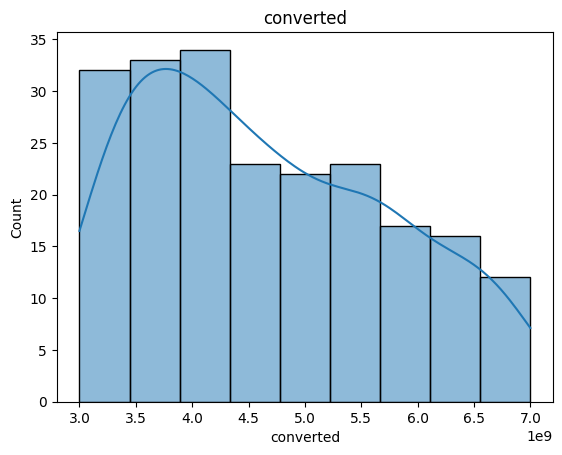

In [ ]:
get_histplot(jkt_high2)

In [ ]:
jkt_high2.shape

(212, 10)

In [ ]:
get_iqr(jkt_high2)

{'Luas Tanah': [1, np.float64(394.0)],
 'Luas Bangunan': [1, np.float64(497.0)],
 'Kamar Tidur': [1, np.float64(6.0)],
 'Kamar Mandi': [1, np.float64(6.0)],
 'Jumlah Lantai': [np.float64(2.0), np.float64(2.0)],
 'converted': [np.float64(987500000.0), np.float64(8207500000.0)]}

In [ ]:
get_outlier(jkt_high2)

Luas Tanah -- found outliers: 7 
Luas Bangunan -- found outliers: 4 
Kamar Tidur -- found outliers: 8 
Kamar Mandi -- found outliers: 2 
Jumlah Lantai -- found outliers: 80 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
1           200            200            4            4              4   
8           220            300            4            3              1   
13          120            140            3            3              3   
19          100            150            4            3              3   
21          144            200            3            3              4   
..          ...            ...          ...          ...            ...   
226         172             90            3            4              1   
235         144            160            4            3              1   
236         686            350            4            3              2   
242         450          

In [ ]:
jkt_high_cleaned = replace_outlier(jkt_high2)

In [ ]:
jkt_high_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,212.000000,212.000000,212.000000,212.000000,212.0,212.000000,2.120000e+02
mean,190.056604,238.735849,3.929245,3.165094,2.0,4.645519,4.645519e+09
std,83.014797,91.013233,1.011635,1.000525,0.0,1.109256,1.109256e+09
min,75.000000,90.000000,1.000000,1.000000,2.0,3.000000,3.000000e+09
25%,127.750000,168.750000,3.000000,3.000000,2.0,3.695000,3.695000e+09
50%,160.000000,220.000000,4.000000,3.000000,2.0,4.475000,4.475000e+09
75%,234.250000,300.000000,4.000000,4.000000,2.0,5.500000,5.500000e+09
max,394.000000,497.000000,6.000000,6.000000,2.0,7.000000,7.000000e+09


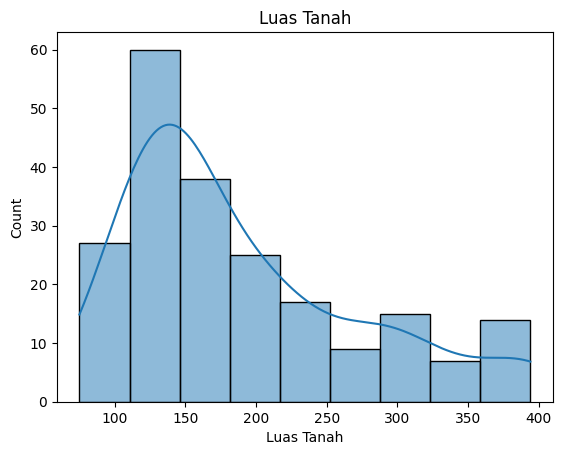

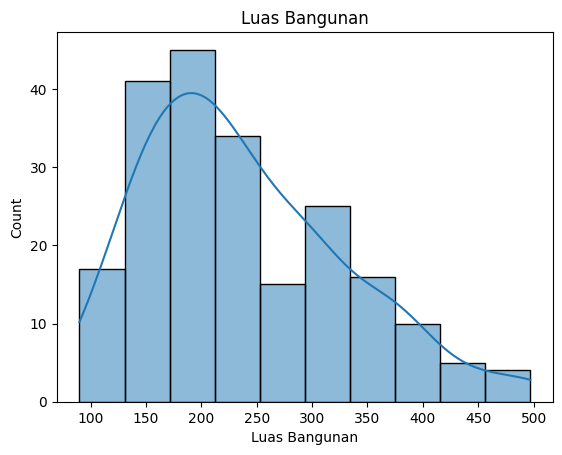

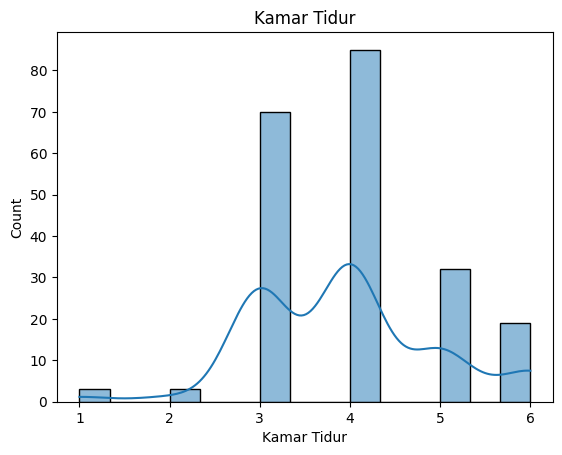

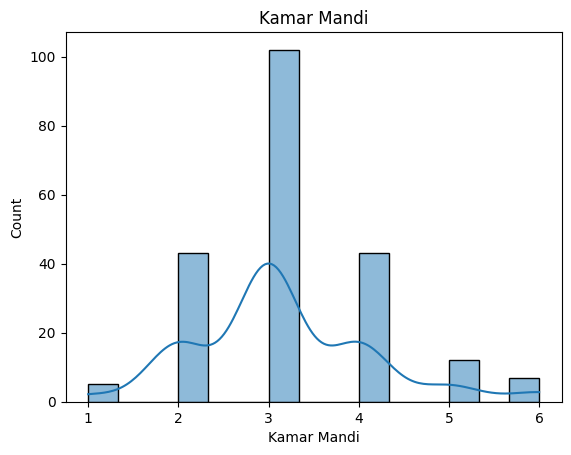

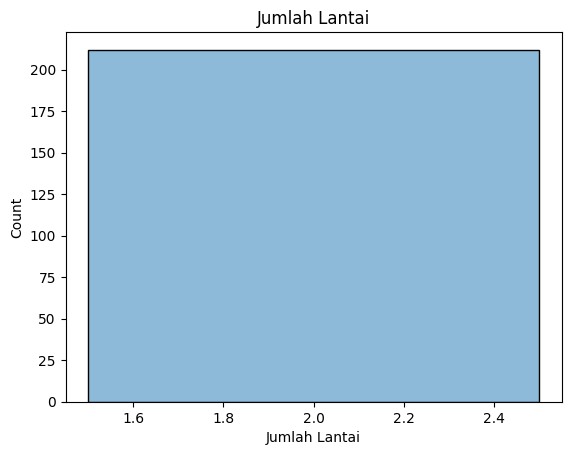

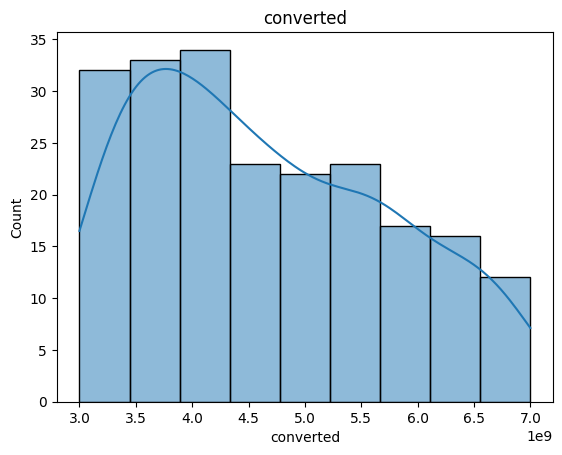

In [ ]:
get_histplot(jkt_high_cleaned)

<Axes: >

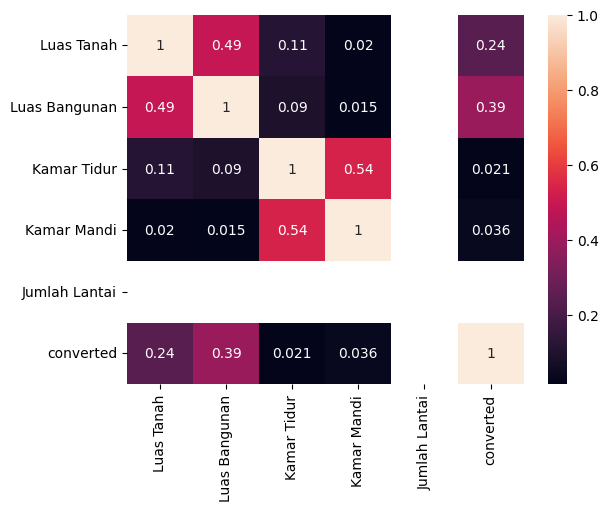

In [ ]:
get_corr(jkt_high_cleaned)

#### jkt_luxury

In [ ]:
jkt_luxury2 = convert_pipeline(jkt_luxury)

In [ ]:
jkt_luxury.shape

(217, 15)

In [ ]:
jkt_luxury2.shape

(217, 10)

In [ ]:
jkt_luxury2.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,433,250,3,2,1,Luxury,"Rp 8,45 Miliar",8.45,Miliar,8.450000e+09
1,327,146,3,2,2,Luxury,,NaN,None,NaN
2,216,375,3,3,1,Luxury,"Rp 7,25 Miliar",7.25,Miliar,7.250000e+09
3,685,481,6,5,2,Luxury,"Rp 17,5 Miliar",17.50,Miliar,1.750000e+10
4,450,600,4,4,2,Luxury,"Rp 9,5 Miliar",9.50,Miliar,9.500000e+09


In [ ]:
jkt_luxury2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,30
satuan,30
converted,30


In [ ]:
jkt_luxury2.dropna(inplace=True)

In [ ]:
(jkt_luxury2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,1
Kamar Tidur,5
Kamar Mandi,5
Jumlah Lantai,6
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
jkt_luxury2 = replace_zero(jkt_luxury2)

In [ ]:
jkt_luxury2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,187.000000,187.000000,187.000000,187.000000,187.000000,187.000000,1.870000e+02
mean,393.352941,434.240642,5.155080,4.139037,2.074866,12.110588,1.211059e+10
std,214.263438,194.761478,4.105139,3.019992,0.714489,3.938568,3.938568e+09
min,120.000000,156.000000,1.000000,1.000000,1.000000,7.000000,7.000000e+09
25%,240.000000,300.000000,4.000000,3.000000,2.000000,8.625000,8.625000e+09
50%,332.000000,400.000000,4.000000,4.000000,2.000000,11.000000,1.100000e+10
75%,471.500000,500.000000,5.000000,4.000000,2.000000,15.500000,1.550000e+10
max,1450.000000,1600.000000,46.000000,32.000000,4.000000,20.000000,2.000000e+10


In [ ]:
jkt_luxury2.shape

(187, 10)

In [ ]:
get_iqr(jkt_luxury2)

{'Luas Tanah': [1, np.float64(819.0)],
 'Luas Bangunan': [1, np.float64(800.0)],
 'Kamar Tidur': [np.float64(2.0), np.float64(7.0)],
 'Kamar Mandi': [1, np.float64(6.0)],
 'Jumlah Lantai': [np.float64(2.0), np.float64(2.0)],
 'converted': [np.float64(-1687500000.0), np.float64(25812500000.0)]}

In [ ]:
get_outlier(jkt_luxury2)

Luas Tanah -- found outliers: 10 
Luas Bangunan -- found outliers: 7 
Kamar Tidur -- found outliers: 16 
Kamar Mandi -- found outliers: 8 
Jumlah Lantai -- found outliers: 75 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
0           433            250            3            2              1   
2           216            375            3            3              1   
7           258            410            5            5              3   
9           442            310            5            4              1   
11          449            500            6            7              2   
..          ...            ...          ...          ...            ...   
198         180            318            3            2              3   
199         360            400            4            4              1   
200         144           1200            6            3              2   
208         336        

In [ ]:
jkt_luxury2['Jumlah Lantai'].value_counts()

,count
Jumlah Lantai,
2,112
1,34
3,34
4,7


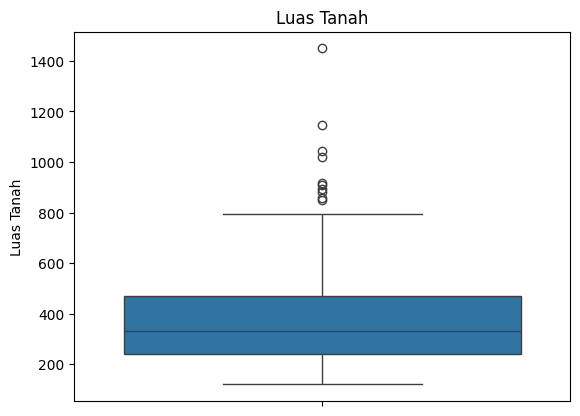

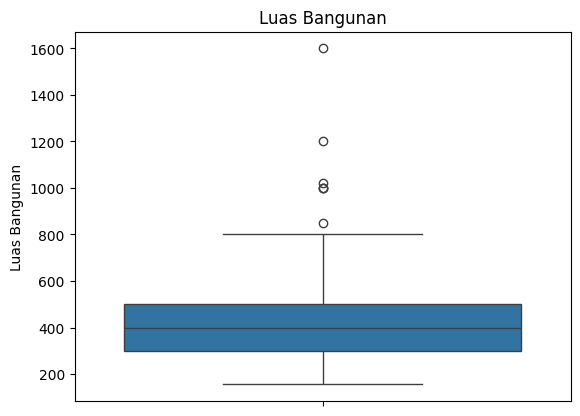

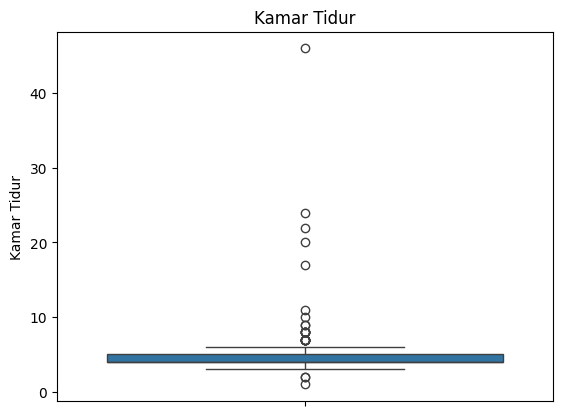

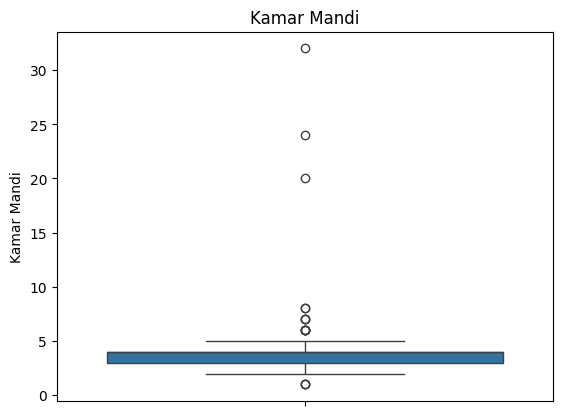

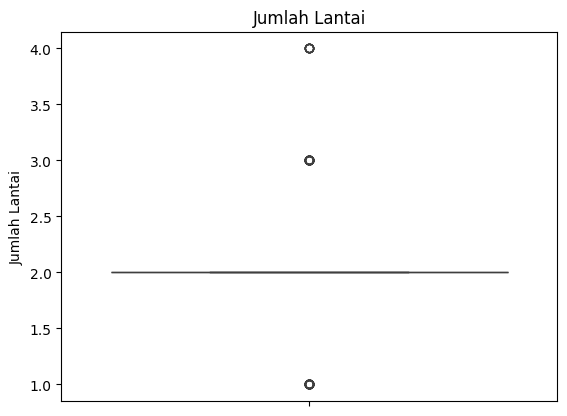

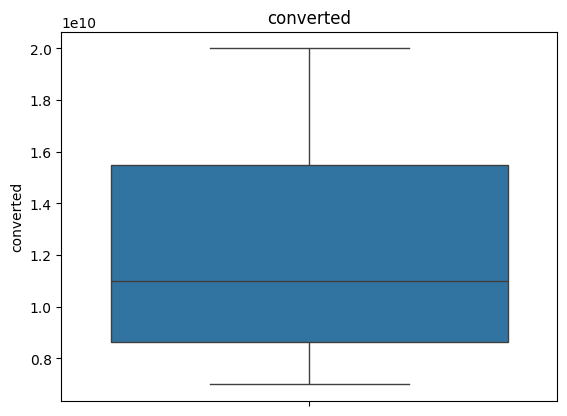

In [ ]:
get_boxplot(jkt_luxury2)

In [ ]:
jkt_luxury_cleaned = replace_outlier(jkt_luxury2)

In [ ]:
jkt_luxury_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,187.00000,187.000000,187.000000,187.000000,187.0,187.000000,1.870000e+02
mean,383.84492,423.171123,4.566845,3.791444,2.0,12.110588,1.211059e+10
std,185.26033,156.358090,1.290816,1.099527,0.0,3.938568,3.938568e+09
min,120.00000,156.000000,2.000000,1.000000,2.0,7.000000,7.000000e+09
25%,240.00000,300.000000,4.000000,3.000000,2.0,8.625000,8.625000e+09
50%,332.00000,400.000000,4.000000,4.000000,2.0,11.000000,1.100000e+10
75%,471.50000,500.000000,5.000000,4.000000,2.0,15.500000,1.550000e+10
max,819.00000,800.000000,7.000000,6.000000,2.0,20.000000,2.000000e+10


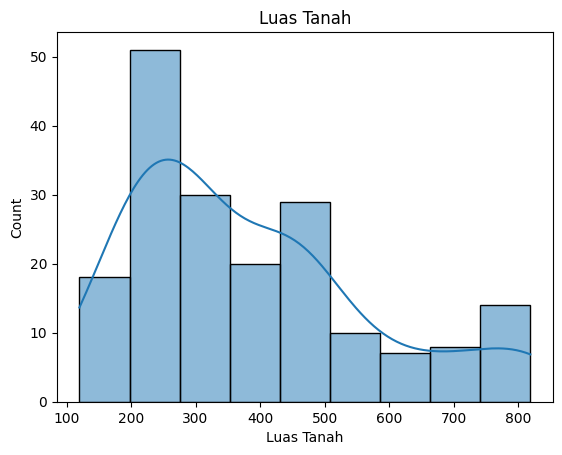

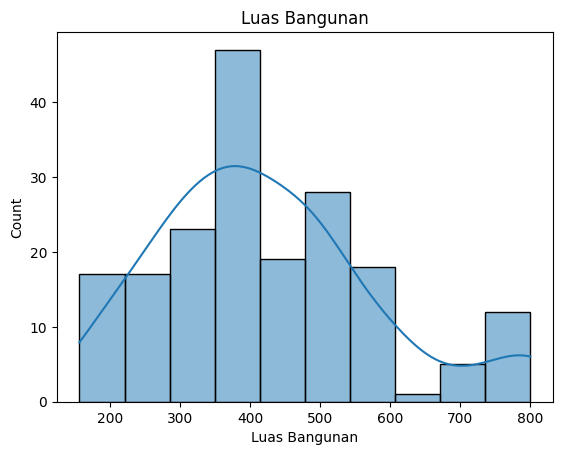

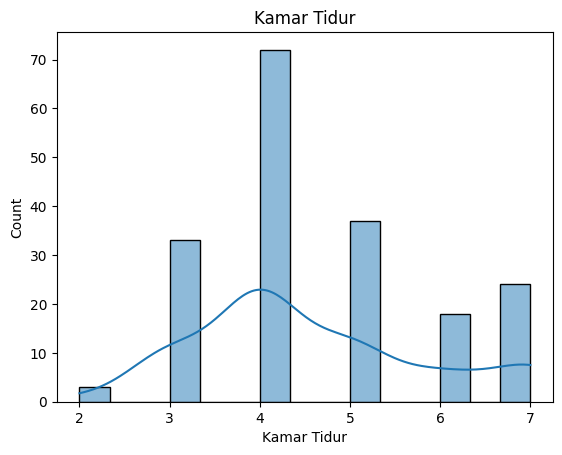

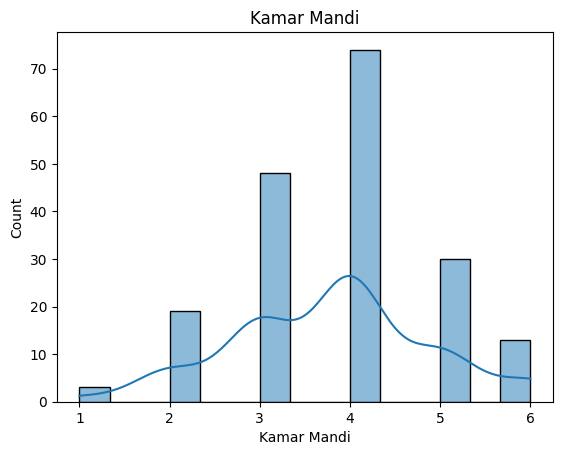

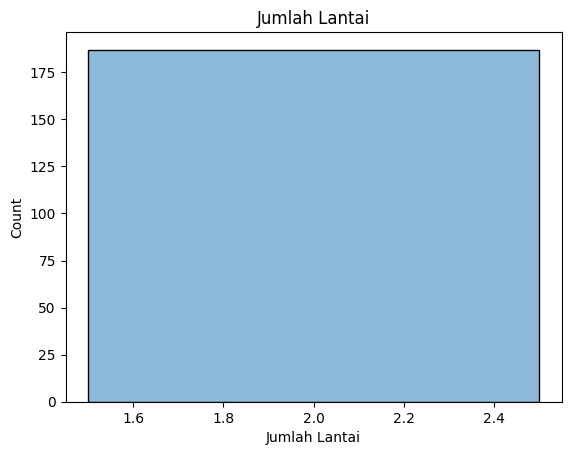

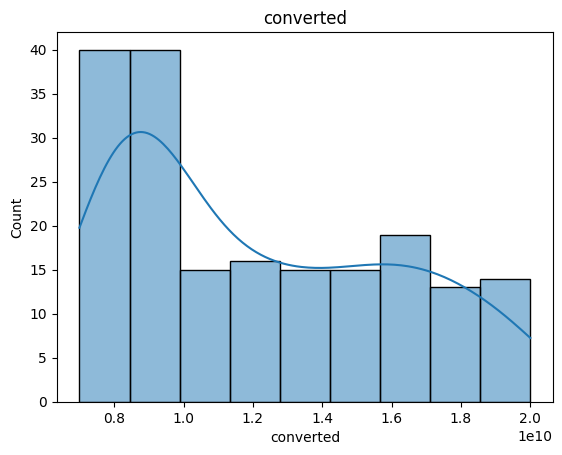

In [ ]:
get_histplot(jkt_luxury_cleaned)

<Axes: >

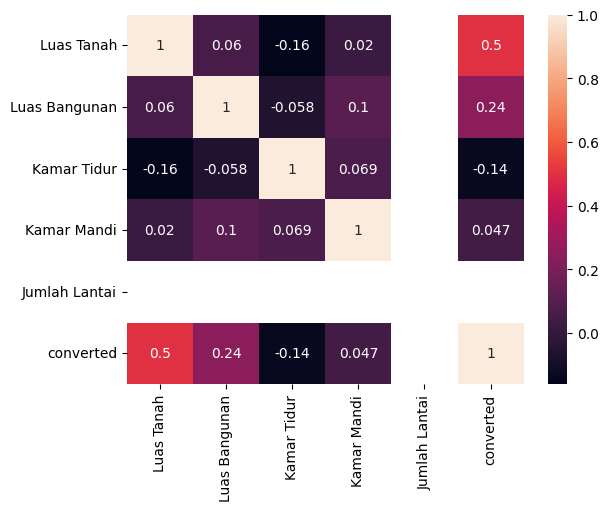

In [ ]:
get_corr(jkt_luxury_cleaned)

#### merged

In [ ]:
jkt_merged = pd.concat([jkt_low_cleaned, jkt_low_mid_cleaned, jkt_up_mid_cleaned, jkt_high_cleaned, jkt_luxury_cleaned])

In [ ]:
jkt_merged

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,20,31,2,2,2,Low,Rp 422 Juta,422.0,Juta,4.220000e+08
1,21,41,2,2,2,Low,Rp 457 Juta,457.0,Juta,4.570000e+08
5,22,43,2,2,2,Low,Rp 477 Juta,477.0,Juta,4.770000e+08
6,21,41,2,2,2,Low,Rp 474 Juta,474.0,Juta,4.740000e+08
8,20,39,2,2,2,Low,Rp 458 Juta,458.0,Juta,4.580000e+08
...,...,...,...,...,...,...,...,...,...,...
212,397,350,4,4,2,Luxury,Rp 17 Miliar,17.0,Miliar,1.700000e+10
213,440,400,4,4,2,Luxury,"Rp 9,6 Miliar",9.6,Miliar,9.600000e+09
214,488,210,4,4,2,Luxury,Rp 16 Miliar,16.0,Miliar,1.600000e+10
215,207,180,4,4,2,Luxury,Rp 12 Miliar,12.0,Miliar,1.200000e+10


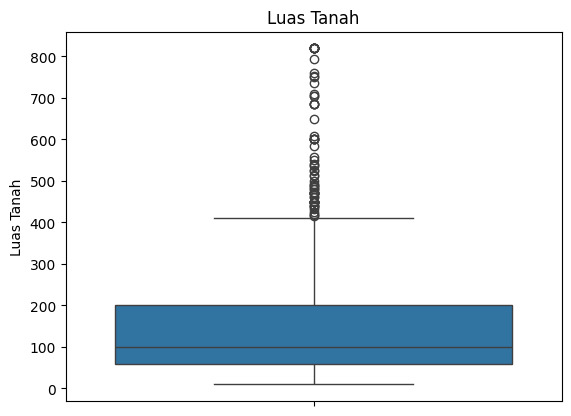

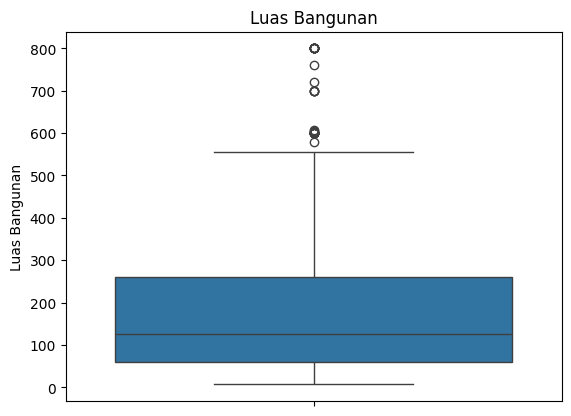

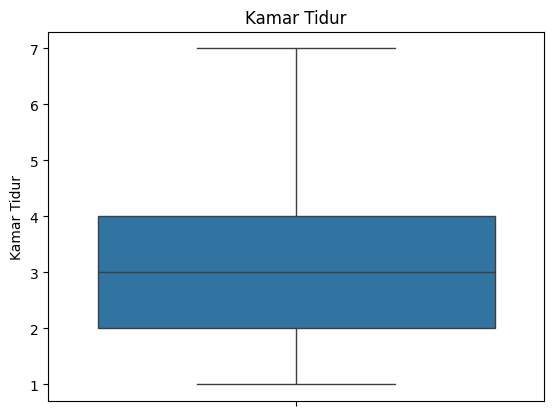

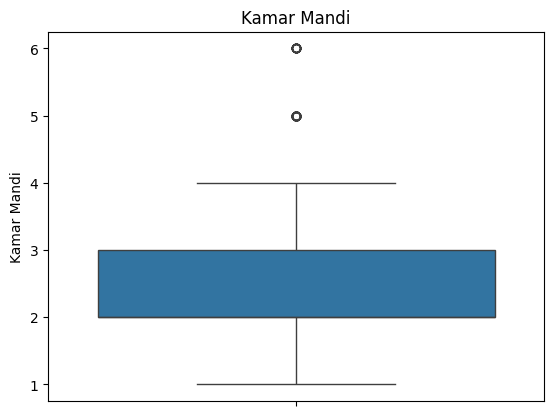

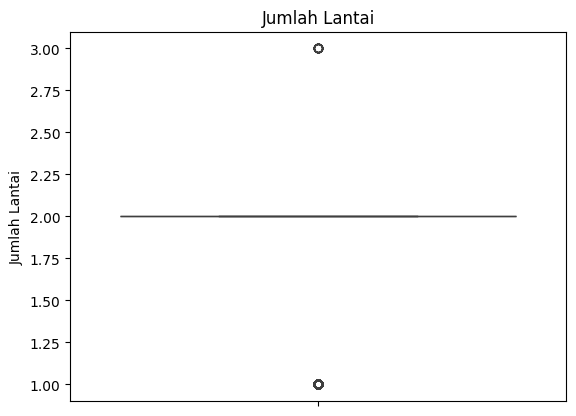

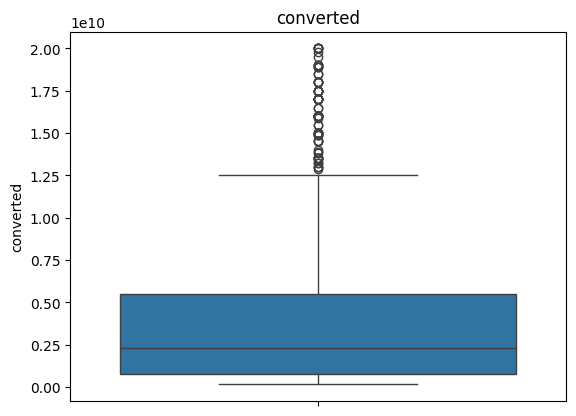

In [ ]:
get_boxplot(jkt_merged)

In [ ]:
jkt_merged.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,941.000000,941.000000,941.000000,941.000000,941.000000,941.000000,9.410000e+02
mean,156.369819,183.775770,3.267800,2.567481,1.861849,228.040818,4.091772e+09
std,156.139897,162.208172,1.281835,1.211191,0.388725,324.166443,4.658576e+09
min,10.000000,7.000000,1.000000,1.000000,1.000000,1.000000,1.500000e+08
25%,60.000000,60.000000,2.000000,2.000000,2.000000,3.600000,7.600000e+08
50%,100.000000,125.000000,3.000000,2.000000,2.000000,9.500000,2.300000e+09
75%,200.000000,260.000000,4.000000,3.000000,2.000000,458.000000,5.500000e+09
max,819.000000,800.000000,7.000000,6.000000,3.000000,998.000000,2.000000e+10


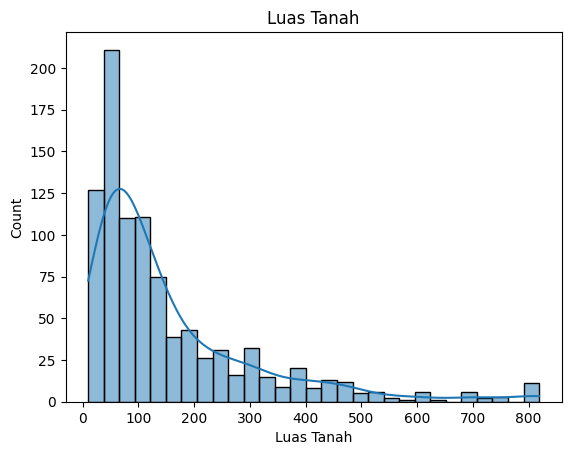

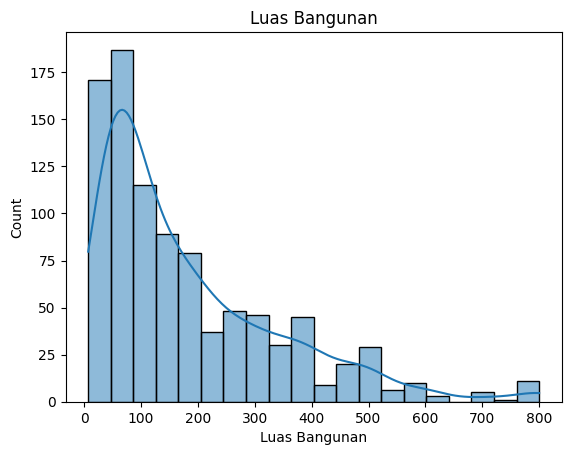

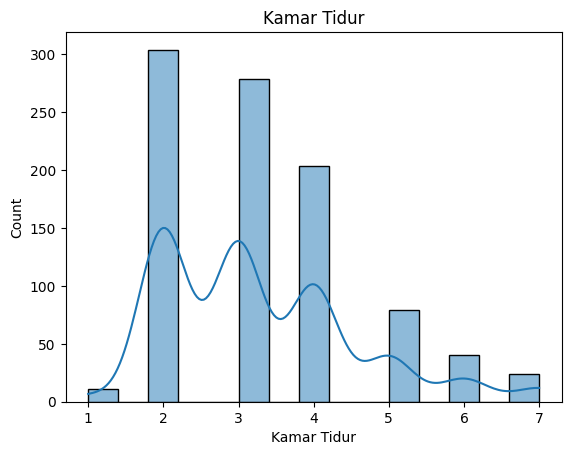

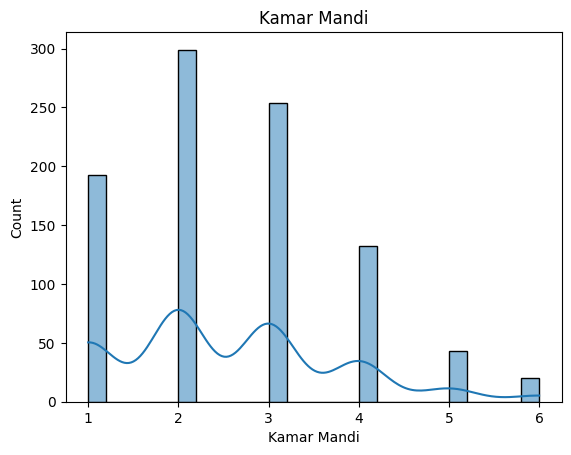

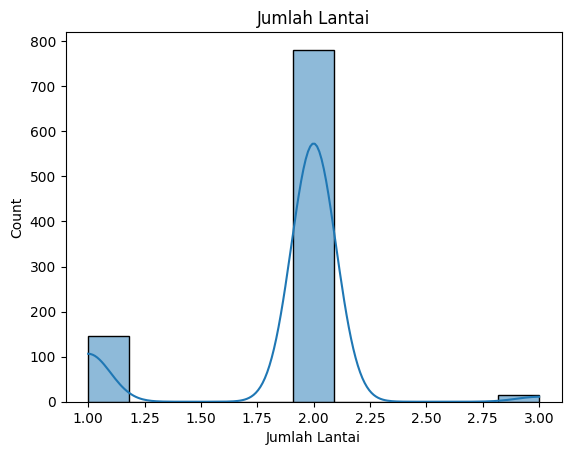

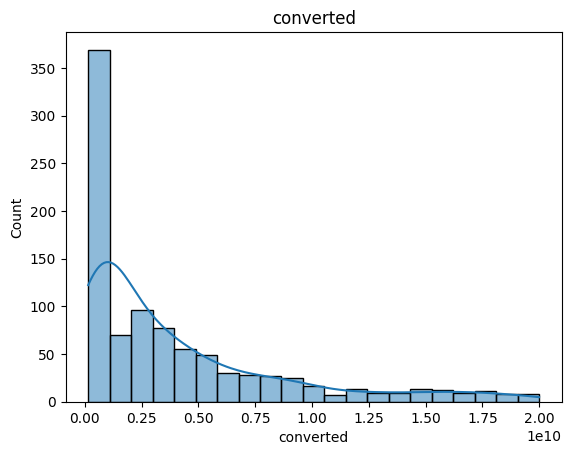

In [ ]:
get_histplot(jkt_merged)

<Axes: >

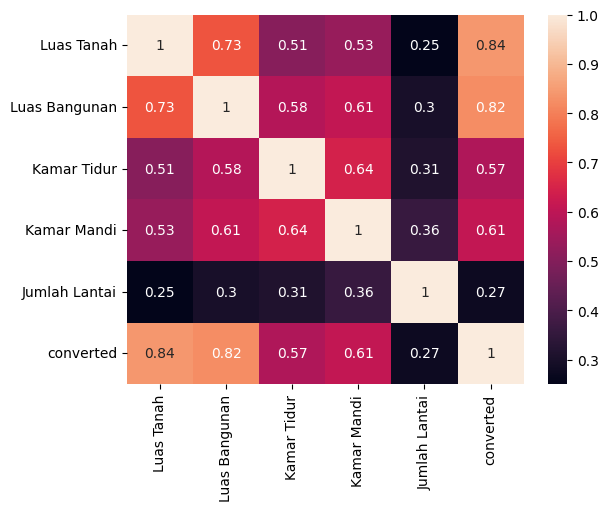

In [ ]:
get_corr(jkt_merged)

In [ ]:
get_outlier(jkt_merged)

Luas Tanah -- found outliers: 72 
Luas Bangunan -- found outliers: 30 
Kamar Tidur -- found outliers: 0 
Kamar Mandi -- found outliers: 20 
Jumlah Lantai -- found outliers: 160 
converted -- found outliers: 76 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
0            20             31            2            2              2   
0            24             71            2            2              3   
0            90            120            3            2              2   
0           190            235            5            4              2   
0           433            250            3            2              2   
..          ...            ...          ...          ...            ...   
274          66             36            2            1              1   
275          50             40            2            1              1   
275         114            140            3            2              2   
276          50     

In [ ]:
get_iqr(jkt_merged)

{'Luas Tanah': [1, np.float64(410.0)],
 'Luas Bangunan': [1, np.float64(560.0)],
 'Kamar Tidur': [1, np.float64(7.0)],
 'Kamar Mandi': [1, np.float64(5.0)],
 'Jumlah Lantai': [np.float64(2.0), np.float64(2.0)],
 'converted': [np.float64(-6350000000.0), np.float64(12610000000.0)]}

In [ ]:
jkt_merged.to_csv('Jakarta_merged.csv', index=False)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

In [ ]:
X = jkt_merged.drop(columns=['converted', 'Category', 'Harga', 'nominal', 'satuan'])
y = jkt_merged['converted']

In [ ]:
X.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai
0,20,31,2,2,2
1,21,41,2,2,2
5,22,43,2,2,2
6,21,41,2,2,2
8,20,39,2,2,2


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
xgb = XGBRegressor(random_state=42)

In [ ]:
xgb.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
xgb.score(X_test, y_test)

0.7156886533380824

In [ ]:
y_pred = xgb.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"R-squared: {r2}")

MAE: 1479656480.084656
MSE: 6.876282206543175e+18
R-squared: 0.7156886533380824


In [ ]:
jkt_merged.sample(3)

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
58,96,70,3,2,2,Up-Mid,"Rp 1,55 Miliar",1.55,Miliar,1.550000e+09
42,60,60,2,2,2,Low-Mid,Rp 895 Juta,895.00,Juta,8.950000e+08
101,109,60,2,1,2,Low-Mid,Rp 900 Juta,900.00,Juta,9.000000e+08


In [ ]:
test = [[60, 60, 2, 2, 2]]
xgb.predict(test)[0]

np.float32(757439740.0)

<Axes: xlabel='Luas Tanah', ylabel='converted'>

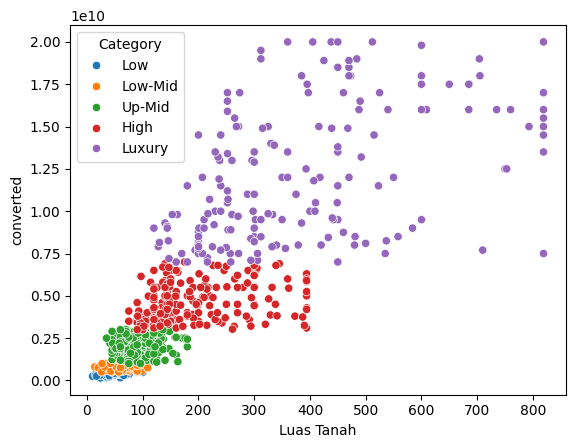

In [ ]:
sns.scatterplot(data=jkt_merged, x='Luas Tanah', y='converted', hue='Category')

In [ ]:
get_model_summary(xgb, X_test, y_test)

MAE: 1479656480.084656
MSE: 6.876282206543175e+18
R-squared: 0.7156886533380824

Error for cheapest house: 121728.0
Error for most expensive house: 12665549440.0

MAPE: 35.32%


In [ ]:
jkt_scaled = jkt_merged.copy()

In [ ]:
jkt_robust = RobustScaler()
jkt_minmax = MinMaxScaler()

In [ ]:
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = split_scaled(jkt_scaled, jkt_robust, jkt_minmax)

In [ ]:
X_train_scaled.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai
109,-0.553571,-0.425197,0.166667,0.2,0.5
163,-0.196429,-0.367454,0.166667,0.2,0.0
189,4.967857,0.367454,0.666667,0.6,0.5
71,1.675000,0.314961,0.500000,0.2,0.5
191,-0.375000,-0.104987,0.166667,0.0,0.0


In [ ]:
# y_pred_actual = np.expm1(y_pred_log)

In [ ]:
xgb_scaled = XGBRegressor(random_state=42)

In [ ]:
xgb_scaled.fit(X_train_scaled, y_train_scaled)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
xgb_scaled.score(X_test_scaled, y_test_scaled)

0.8779899546310871

In [ ]:
get_model_summary_scaled(xgb_scaled, X_test_scaled, y_test_scaled)

MAE: 1499138444.867725
MSE: 7.319837851357094e+18
R-squared: 0.6973491060494994

Error for cheapest house: 403360.0000003576
Error for most expensive house: 12933871232.000002

MAPE: 33.22%


In [ ]:
jkt_merged.sample(3)

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
339,78,140,4,1,2,Up-Mid,"Rp 1,61 Miliar",1.61,Miliar,1.610000e+09
63,42,90,3,2,2,Low-Mid,Rp 860 Juta,860.00,Juta,8.600000e+08
276,60,119,2,3,2,Up-Mid,"Rp 2,1 Miliar",2.10,Miliar,2.100000e+09


In [ ]:
juta = 1000000
miliar = 1000000000

test = [42,	90,	3,	2,	2	, 8.60*juta	]
scaled_test = scale_feature(jkt_robust, jkt_minmax, test)

In [ ]:
scaled_test

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,converted
0,-0.396429,-0.15748,0.333333,0.2,0.5,15.967273


In [ ]:
scaled_test.drop(columns=['converted'], inplace=True)
xgb_scaled.predict(scaled_test)[0]

np.float32(20.580664)

In [ ]:
y_pred_log = xgb_scaled.predict(scaled_test)[0]
np.expm1(y_pred_log)

np.float32(867099000.0)

##### feature engineerng

In [ ]:
jkt_merged.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,20,31,2,2,2,Low,Rp 422 Juta,422.0,Juta,422000000.0
1,21,41,2,2,2,Low,Rp 457 Juta,457.0,Juta,457000000.0
5,22,43,2,2,2,Low,Rp 477 Juta,477.0,Juta,477000000.0
6,21,41,2,2,2,Low,Rp 474 Juta,474.0,Juta,474000000.0
8,20,39,2,2,2,Low,Rp 458 Juta,458.0,Juta,458000000.0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
xgb = XGBRegressor(
      objective='reg:squarederror',
      max_depth=3,
      learning_rate=0.1,
      n_estimators=100,
      random_state=42
      )

In [ ]:
scores = cross_val_score(xgb, X, y, cv=5, scoring='neg_mean_squared_error')

In [ ]:
mse_scores = -scores
print("MSE Scores:", mse_scores)
print("Mean MSE:", mse_scores.mean())

MSE Scores: [1.33602530e+17 5.35983307e+17 2.04855644e+18 1.42978556e+19
 6.21942724e+19]
Mean MSE: 1.5842054055029584e+19


In [ ]:
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = split_scaled(jkt_merged, jkt_robust, jkt_minmax)

In [ ]:
xgb_model_scaled = XGBRegressor(objective='reg:squarederror', random_state=42)

In [ ]:
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 1]
}

In [ ]:
grid_search_scaled = GridSearchCV(estimator=xgb_model_scaled,
                           param_grid=param_grid,
                           cv=10,
                           scoring='neg_mean_squared_error',
                           n_jobs=-1,
                           verbose=2)

In [ ]:
grid_search_scaled.fit(X_train_scaled, y_train_scaled)

Fitting 10 folds for each of 24 candidates, totalling 240 fits


GridSearchCV(cv=10,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None,...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=42, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1], 'max_depth': [3, 5, 7],
                         'n_estimators': [100, 200], 'subsample': [0.8, 1]},
             scoring='neg_mean_squared_error', verbose=2)

In [ ]:
print("Best Params:", grid_search_scaled.best_params_)
print("Best Score (negative MSE):", grid_search_scaled.best_score_)

Best Params: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}
Best Score (negative MSE): -0.1373253343417787


In [ ]:
best_model_scaled = grid_search_scaled.best_estimator_

In [ ]:
get_model_summary_scaled(best_model_scaled, X_test_scaled, y_test_scaled)

MAE: 1282438361.9047616
MSE: 5.459775352665478e+18
R-squared: 0.7742564897189954

Error for cheapest house: 2206783.999999225
Error for most expensive house: 10524464127.999992

MAPE: 28.63%


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in expm1
  result = getattr(ufunc, method)(*inputs, **kwargs)


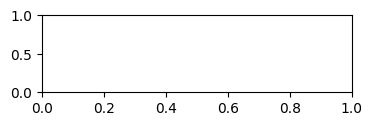

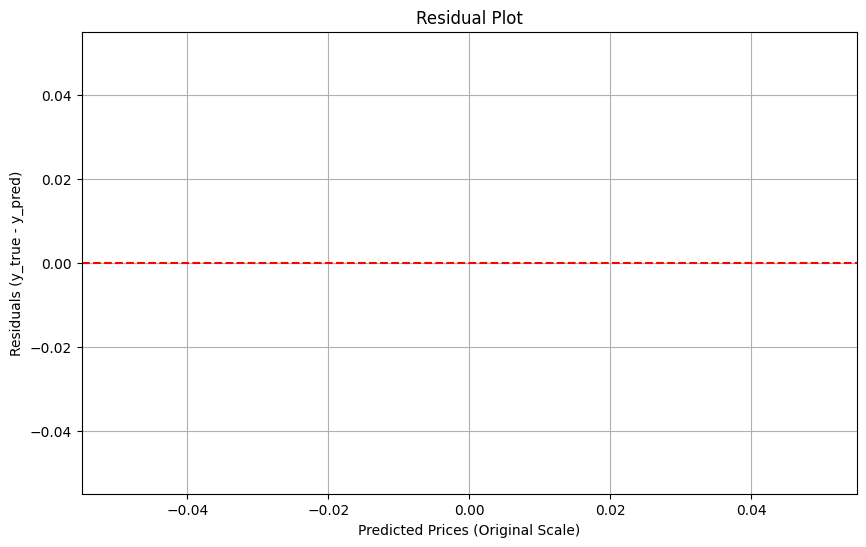

In [ ]:
# Predict log values
y_pred_log = best_model_scaled.predict(X_test)

# Convert to original scale
y_test_conv = np.expm1(y_test)
y_pred = np.expm1(y_pred_log)

# Residuals
residuals = y_test_conv - y_pred

# Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_pred, y=residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Predicted Prices (Original Scale)')
plt.ylabel('Residuals (y_true - y_pred)')
plt.title('Residual Plot')
plt.grid(True)
plt.show()

In [ ]:
for true_val, pred_val in zip(y_test_conv[:10], y_pred[:10]):
    print(f"True: {true_val:.2f}, Pred: {pred_val:.2f}")

True: inf, Pred: 19604934656.00
True: inf, Pred: 19604934656.00
True: inf, Pred: 19604934656.00
True: inf, Pred: 19604934656.00
True: inf, Pred: 19604934656.00
True: inf, Pred: 19604934656.00
True: inf, Pred: 19604934656.00
True: inf, Pred: 19604934656.00
True: inf, Pred: 19604934656.00
True: inf, Pred: 19604934656.00


### **Bandung**

In [ ]:
bdg_low = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Bandung_low.csv')
bdg_low_mid = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Bandung_low_mid.csv')
bdg_up_mid = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Bandung_up_mid.csv')
bdg_high = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Bandung_high.csv')
bdg_luxury = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Bandung_luxury.csv')

#### bdg_low

In [ ]:
bdg_low2 = convert_pipeline(bdg_low)

In [ ]:
bdg_low.shape

(305, 15)

In [ ]:
bdg_low2.shape

(296, 10)

In [ ]:
bdg_low2.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,60,36,2,1,1,Low,Rp 175 Juta,175.0,Juta,175000000.0
1,40,30,2,1,1,Low,Rp 100 Juta,100.0,Juta,100000000.0
2,70,50,2,1,0,Low,Rp 305 Juta,305.0,Juta,305000000.0
3,70,45,2,1,0,Low,Rp 285 Juta,285.0,Juta,285000000.0
4,68,36,2,1,1,Low,Rp 105 Juta,105.0,Juta,105000000.0


In [ ]:
bdg_low2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,13
satuan,13
converted,13


In [ ]:
(bdg_low2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,9
Kamar Mandi,9
Jumlah Lantai,31
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
bdg_low2.dropna(inplace=True)

In [ ]:
bdg_low2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000,2.830000e+02
mean,73.229682,53.625442,2.151943,1.176678,1.031802,354.501767,3.545018e+08
std,32.750728,32.897018,0.847329,0.722403,0.514726,109.982377,1.099824e+08
min,30.000000,21.000000,0.000000,0.000000,0.000000,100.000000,1.000000e+08
25%,60.000000,36.000000,2.000000,1.000000,1.000000,265.000000,2.650000e+08
50%,70.000000,45.000000,2.000000,1.000000,1.000000,353.000000,3.530000e+08
75%,77.000000,58.000000,2.000000,1.000000,1.000000,451.000000,4.510000e+08
max,400.000000,300.000000,10.000000,10.000000,3.000000,500.000000,5.000000e+08


In [ ]:
bdg_low2 = replace_zero(bdg_low2)

In [ ]:
(bdg_low2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
bdg_low2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000,2.830000e+02
mean,73.229682,53.625442,2.215548,1.208481,1.137809,354.501767,3.545018e+08
std,32.750728,32.897018,0.752894,0.691128,0.374854,109.982377,1.099824e+08
min,30.000000,21.000000,1.000000,1.000000,1.000000,100.000000,1.000000e+08
25%,60.000000,36.000000,2.000000,1.000000,1.000000,265.000000,2.650000e+08
50%,70.000000,45.000000,2.000000,1.000000,1.000000,353.000000,3.530000e+08
75%,77.000000,58.000000,2.000000,1.000000,1.000000,451.000000,4.510000e+08
max,400.000000,300.000000,10.000000,10.000000,3.000000,500.000000,5.000000e+08


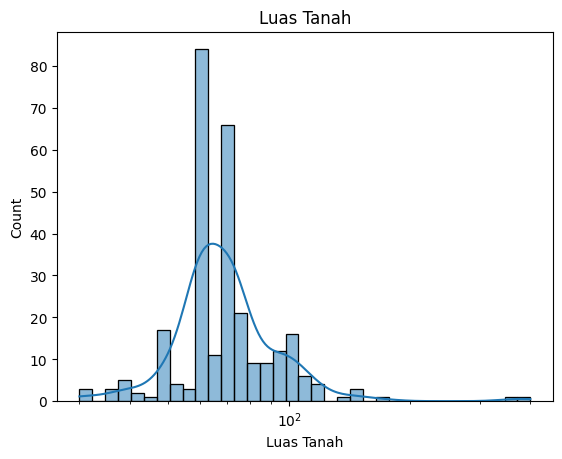

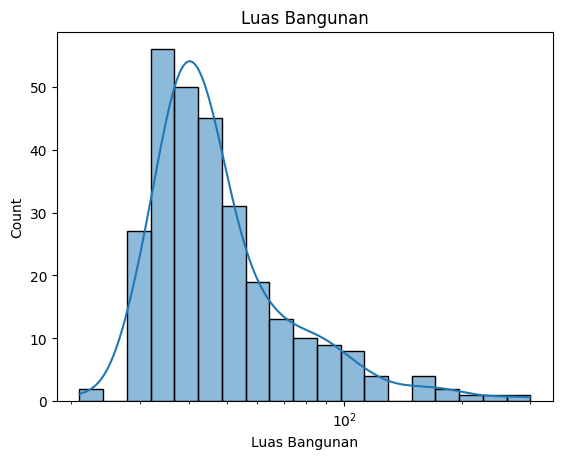

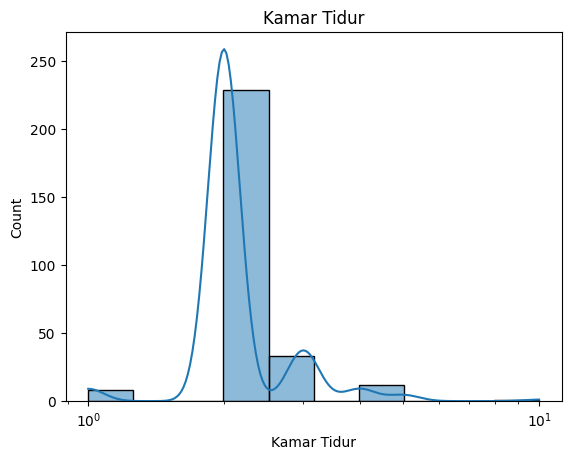

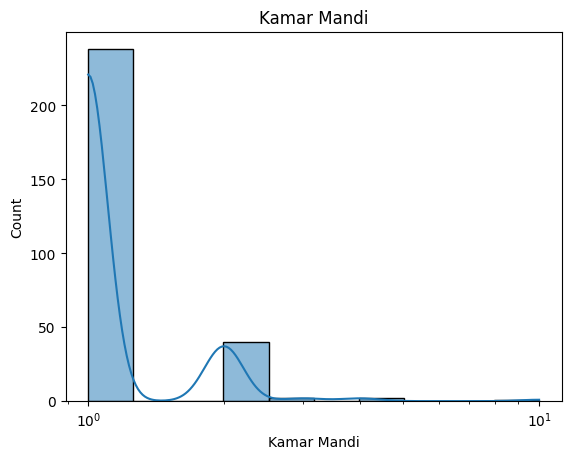

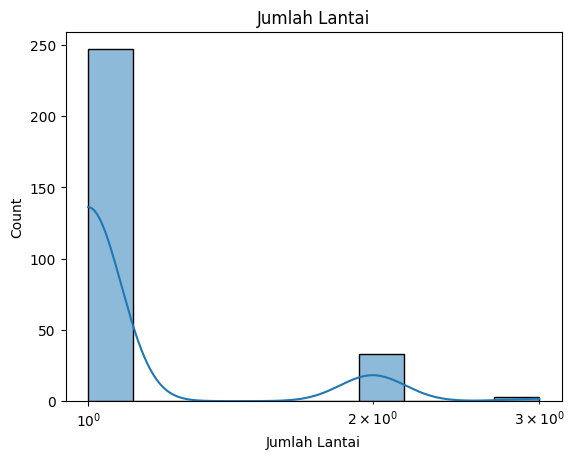

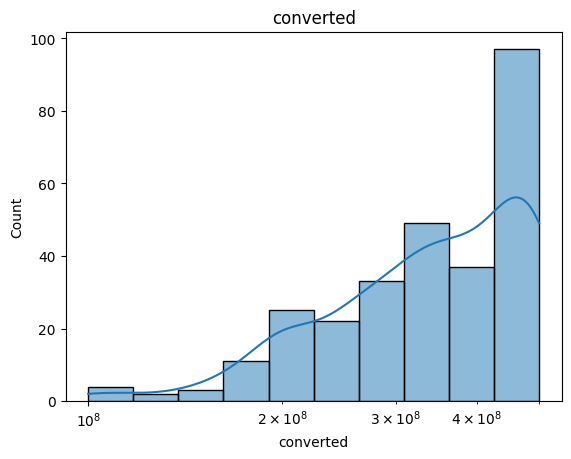

In [ ]:
get_histplot(bdg_low2, log_scale=True)

In [ ]:
get_iqr(bdg_low2)

{'Luas Tanah': [np.float64(34.0), np.float64(103.0)],
 'Luas Bangunan': [np.float64(3.0), np.float64(91.0)],
 'Kamar Tidur': [np.float64(2.0), np.float64(2.0)],
 'Kamar Mandi': [1, np.float64(1.0)],
 'Jumlah Lantai': [1, np.float64(1.0)],
 'converted': [np.float64(-14000000.0), np.float64(730000000.0)]}

In [ ]:
get_outlier(bdg_low2)

Luas Tanah -- found outliers: 23 
Luas Bangunan -- found outliers: 22 
Kamar Tidur -- found outliers: 54 
Kamar Mandi -- found outliers: 45 
Jumlah Lantai -- found outliers: 36 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
10          132             68            2            1              1   
11           70             90            3            2              1   
12           98            190            3            2              1   
13           92            180            4            2              1   
15          173            250            5            3              1   
..          ...            ...          ...          ...            ...   
287          90             82            2            2              1   
289         100            150            3            2              2   
295          60             40            3            1              1   
297         119      

In [ ]:
bdg_low_cleaned = remove_outlier(bdg_low2)

In [ ]:
bdg_low_cleaned.shape

(199, 10)

In [ ]:
bdg_low_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,199.000000,199.000000,199.0,199.0,199.0,199.000000,1.990000e+02
mean,67.060302,42.095477,2.0,1.0,1.0,335.733668,3.357337e+08
std,12.834076,10.475365,0.0,0.0,0.0,106.836770,1.068368e+08
min,36.000000,21.000000,2.0,1.0,1.0,100.000000,1.000000e+08
25%,60.000000,36.000000,2.0,1.0,1.0,253.500000,2.535000e+08
50%,66.000000,40.000000,2.0,1.0,1.0,331.000000,3.310000e+08
75%,72.000000,45.000000,2.0,1.0,1.0,432.000000,4.320000e+08
max,103.000000,90.000000,2.0,1.0,1.0,500.000000,5.000000e+08


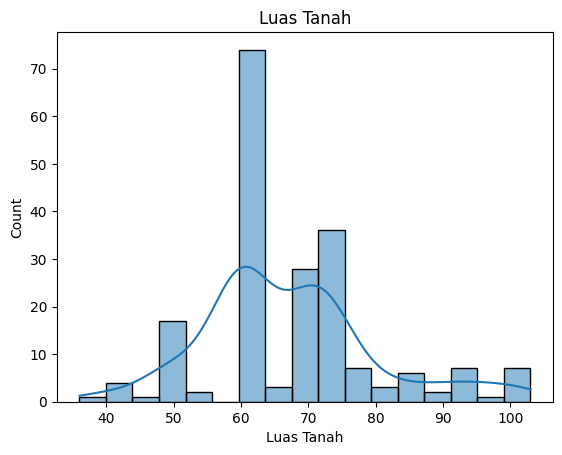

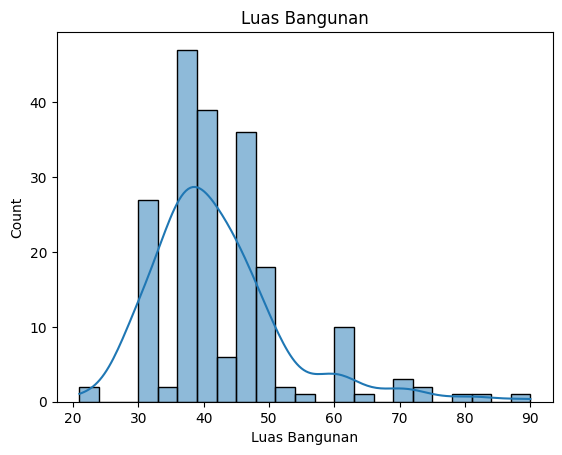

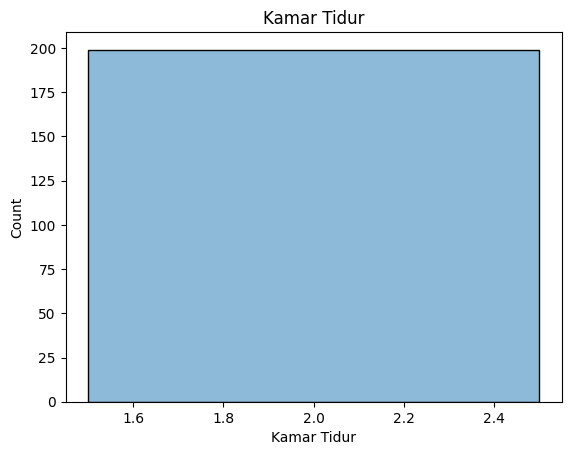

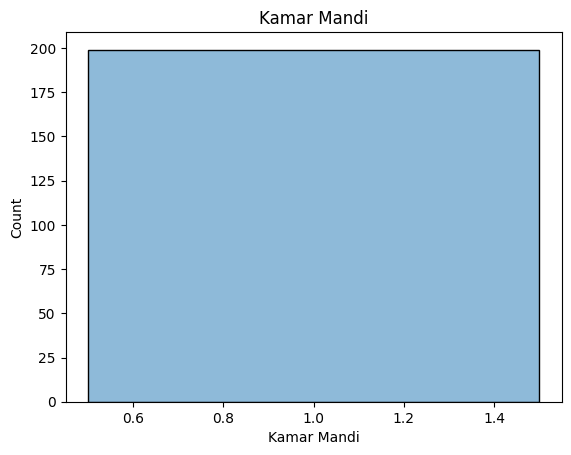

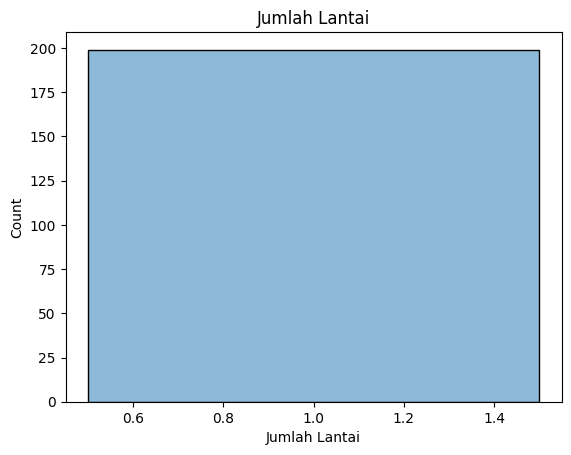

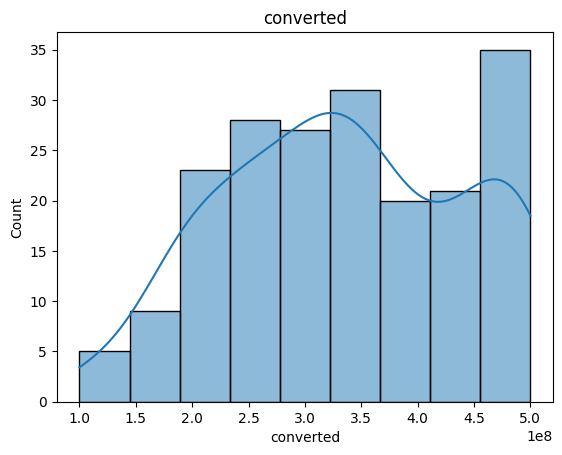

In [ ]:
get_histplot(bdg_low_cleaned)

<Axes: >

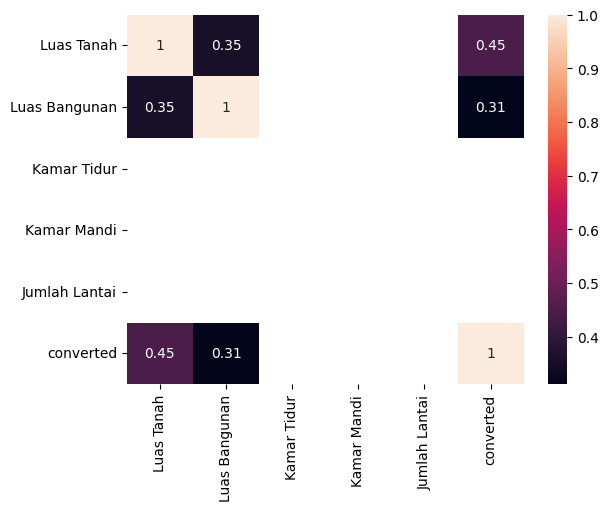

In [ ]:
get_corr(bdg_low_cleaned)

#### bdg_low_mid

In [ ]:
bdg_low_mid2 = convert_pipeline(bdg_low_mid)

In [ ]:
bdg_low_mid2.shape

(282, 10)

In [ ]:
bdg_low_mid2.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,165,101,3,2,1,Low-Mid,Rp 989 Juta,989.0,Juta,989000000.0
1,84,80,3,1,2,Low-Mid,Rp 710 Juta,710.0,Juta,710000000.0
2,120,124,3,2,1,Low-Mid,Rp 999 Juta,999.0,Juta,999000000.0
3,95,45,2,1,1,Low-Mid,Rp 600 Juta,600.0,Juta,600000000.0
4,72,45,0,2,1,Low-Mid,Rp 675 Juta,675.0,Juta,675000000.0


In [ ]:
bdg_low_mid2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,21
satuan,21
converted,21


In [ ]:
(bdg_low_mid2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,4
Kamar Mandi,2
Jumlah Lantai,21
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
bdg_low_mid2.dropna(inplace=True)

In [ ]:
bdg_low_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,261.000000,261.000000,261.000000,261.000000,261.000000,261.000000,2.610000e+02
mean,99.130268,84.279693,2.590038,1.593870,1.268199,715.199234,7.573027e+08
std,45.923078,43.811071,0.978881,0.847962,0.598800,207.948067,1.526898e+08
min,38.000000,1.000000,0.000000,0.000000,0.000000,1.000000,5.000000e+08
25%,72.000000,55.000000,2.000000,1.000000,1.000000,600.000000,6.500000e+08
50%,90.000000,72.000000,2.000000,1.000000,1.000000,725.000000,7.500000e+08
75%,112.000000,100.000000,3.000000,2.000000,2.000000,865.000000,8.850000e+08
max,548.000000,330.000000,6.000000,10.000000,3.000000,999.000000,1.000000e+09


In [ ]:
bdg_low_mid2 = replace_zero(bdg_low_mid2)

In [ ]:
bdg_low_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,261.000000,261.000000,261.000000,261.000000,261.000000,261.000000,2.610000e+02
mean,99.130268,84.279693,2.620690,1.601533,1.337165,715.199234,7.573027e+08
std,45.923078,43.811071,0.927047,0.837945,0.497414,207.948067,1.526898e+08
min,38.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000e+08
25%,72.000000,55.000000,2.000000,1.000000,1.000000,600.000000,6.500000e+08
50%,90.000000,72.000000,2.000000,1.000000,1.000000,725.000000,7.500000e+08
75%,112.000000,100.000000,3.000000,2.000000,2.000000,865.000000,8.850000e+08
max,548.000000,330.000000,6.000000,10.000000,3.000000,999.000000,1.000000e+09


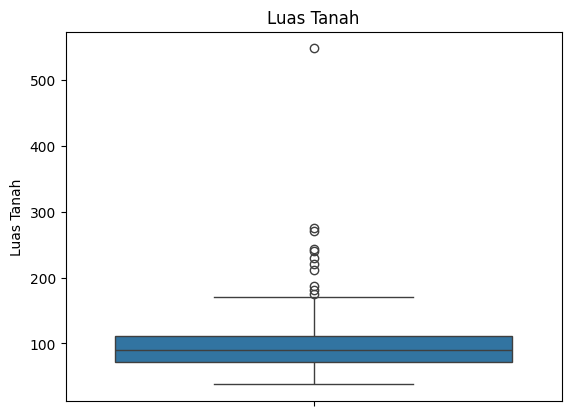

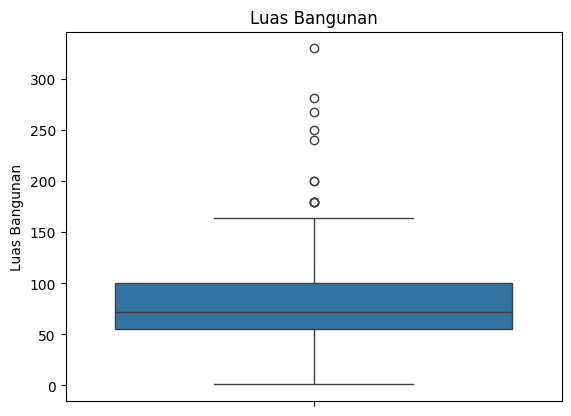

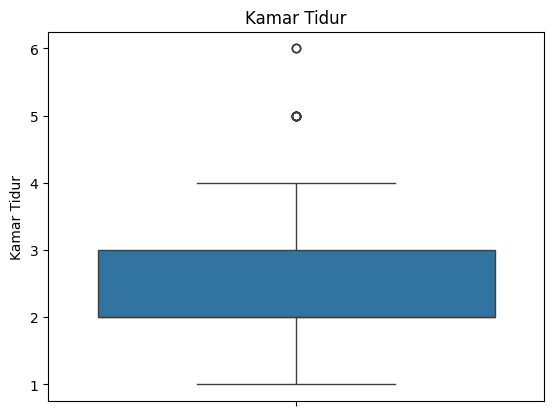

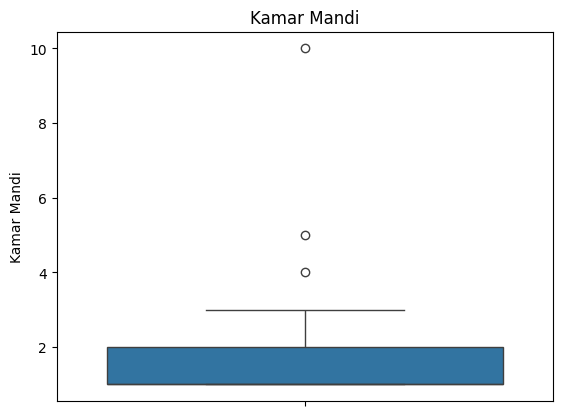

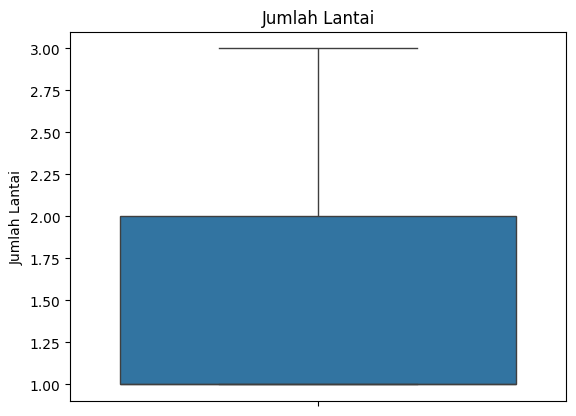

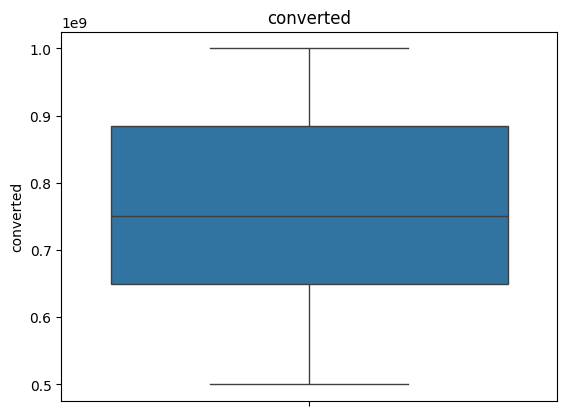

In [ ]:
get_boxplot(bdg_low_mid2)

In [ ]:
get_iqr(bdg_low_mid2)

{'Luas Tanah': [np.float64(12.0), np.float64(172.0)],
 'Luas Bangunan': [1, np.float64(168.0)],
 'Kamar Tidur': [1, np.float64(5.0)],
 'Kamar Mandi': [1, np.float64(4.0)],
 'Jumlah Lantai': [1, np.float64(4.0)],
 'converted': [np.float64(297500000.0), np.float64(1237500000.0)]}

In [ ]:
get_outlier(bdg_low_mid2)

Luas Tanah -- found outliers: 11 
Luas Bangunan -- found outliers: 11 
Kamar Tidur -- found outliers: 3 
Kamar Mandi -- found outliers: 2 
Jumlah Lantai -- found outliers: 0 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
132         220            150            5            2              1   
8           275            124            2            1              2   
10          271            330            5            3              1   
270         211            268            4            3              1   
151          38              1            1           10              1   
154         139            250            3            2              2   
31          548            281            5            3              1   
33          244            200            6            1              1   
168         155            180            5            2              2   
176          60         

In [ ]:
bdg_low_mid_cleaned = remove_outlier(bdg_low_mid2)

In [ ]:
bdg_low_mid_cleaned.shape

(240, 10)

In [ ]:
bdg_low_mid_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,240.000000,240.000000,240.000000,240.00000,240.000000,240.000000,2.400000e+02
mean,91.983333,76.545833,2.479167,1.51250,1.316667,714.137500,7.516000e+08
std,25.407798,29.606025,0.731525,0.59973,0.483767,201.169036,1.516110e+08
min,38.000000,12.000000,1.000000,1.00000,1.000000,1.000000,5.000000e+08
25%,72.000000,54.250000,2.000000,1.00000,1.000000,600.000000,6.300000e+08
50%,90.000000,70.000000,2.000000,1.00000,1.000000,725.000000,7.500000e+08
75%,105.250000,100.000000,3.000000,2.00000,2.000000,856.250000,8.800000e+08
max,171.000000,164.000000,5.000000,4.00000,3.000000,999.000000,1.000000e+09


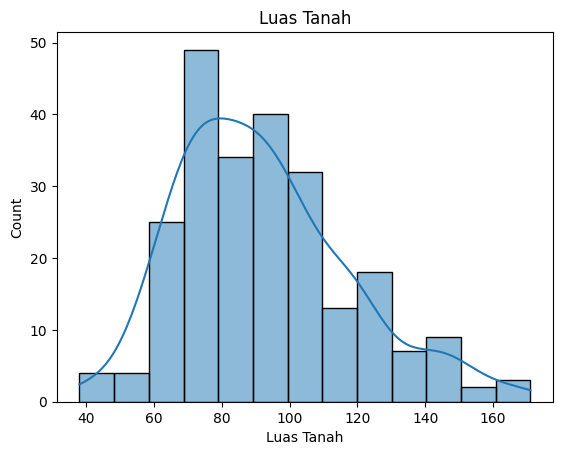

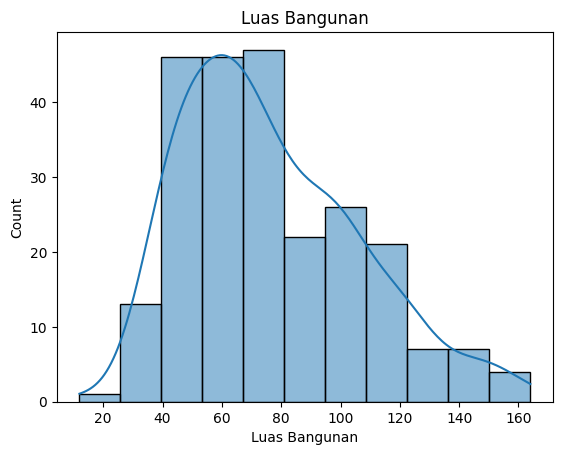

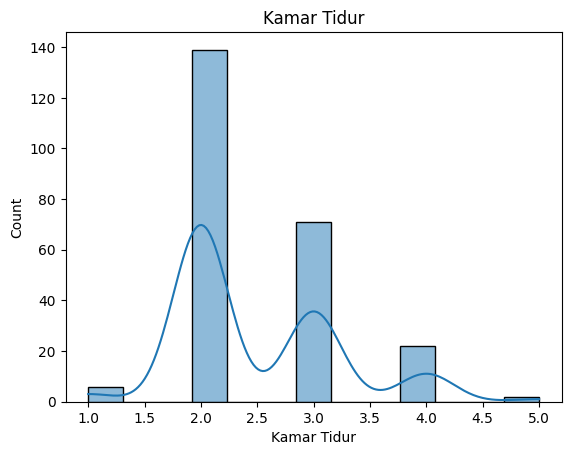

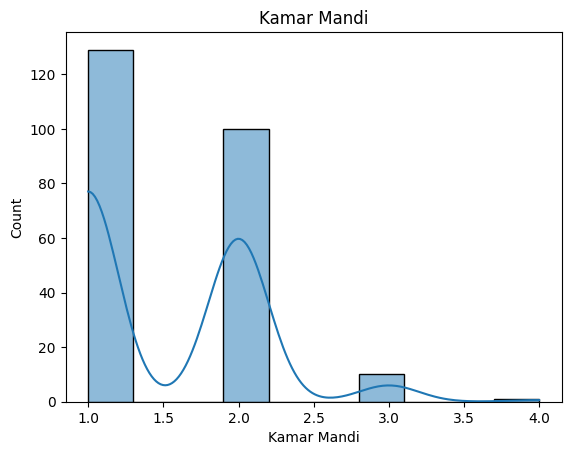

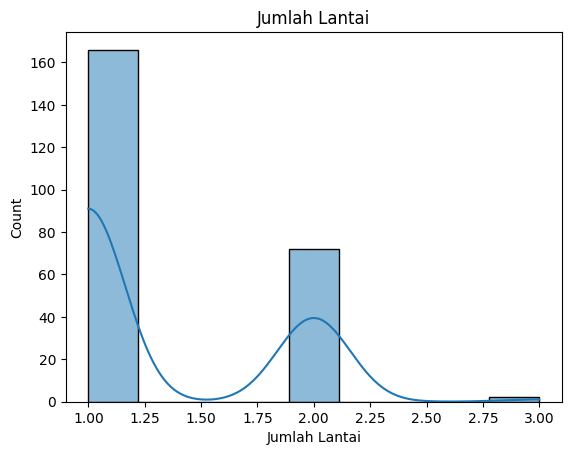

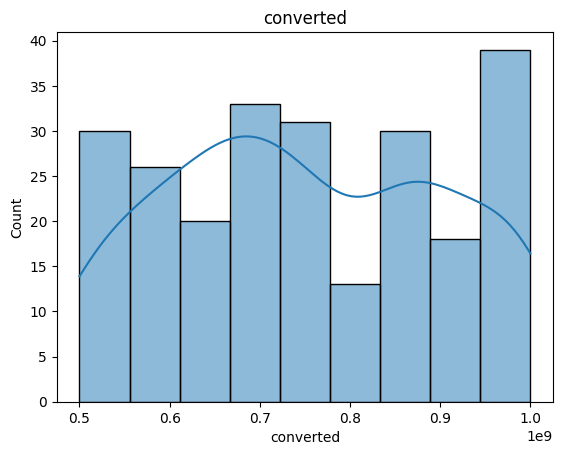

In [ ]:
get_histplot(bdg_low_mid_cleaned)

<Axes: >

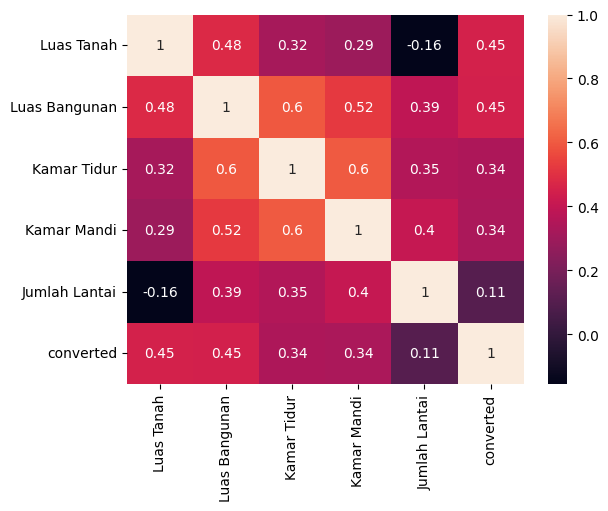

In [ ]:
get_corr(bdg_low_mid_cleaned)

#### bdg_up_mid

In [ ]:
bdg_up_mid2 = convert_pipeline(bdg_up_mid)

In [ ]:
bdg_up_mid.shape

(331, 15)

In [ ]:
bdg_up_mid2.shape

(322, 10)

In [ ]:
bdg_up_mid2.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,84,74,2,2,2,Up-Mid,"Rp 1,6 Miliar",1.60,Miliar,1.600000e+09
1,108,100,3,2,2,Up-Mid,"Rp 2,49 Miliar",2.49,Miliar,2.490000e+09
2,120,140,3,3,2,Up-Mid,"Rp 2,45 Miliar",2.45,Miliar,2.450000e+09
3,102,120,3,3,2,Up-Mid,"Rp 1,5 Miliar",1.50,Miliar,1.500000e+09
4,120,98,3,2,3,Up-Mid,"Rp 1,9 Miliar",1.90,Miliar,1.900000e+09


In [ ]:
bdg_up_mid2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,32
satuan,32
converted,32


In [ ]:
(bdg_up_mid2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,19
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
bdg_up_mid2.dropna(inplace=True)

In [ ]:
bdg_up_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,2.900000e+02
mean,171.375862,192.931034,3.427586,2.500000,1.644828,1.934414,1.934414e+09
std,495.441260,786.985318,1.332297,1.138353,0.706904,0.574145,5.741446e+08
min,38.000000,36.000000,1.000000,1.000000,0.000000,1.000000,1.000000e+09
25%,105.000000,100.000000,3.000000,2.000000,1.000000,1.400000,1.400000e+09
50%,121.500000,132.500000,3.000000,2.000000,2.000000,1.900000,1.900000e+09
75%,160.000000,180.000000,4.000000,3.000000,2.000000,2.450000,2.450000e+09
max,8500.000000,13500.000000,14.000000,14.000000,4.000000,3.000000,3.000000e+09


In [ ]:
bdg_up_mid2 = replace_zero(bdg_up_mid2)

In [ ]:
bdg_up_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,2.900000e+02
mean,171.375862,192.931034,3.427586,2.500000,1.768966,1.934414,1.934414e+09
std,495.441260,786.985318,1.332297,1.138353,0.568859,0.574145,5.741446e+08
min,38.000000,36.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+09
25%,105.000000,100.000000,3.000000,2.000000,1.000000,1.400000,1.400000e+09
50%,121.500000,132.500000,3.000000,2.000000,2.000000,1.900000,1.900000e+09
75%,160.000000,180.000000,4.000000,3.000000,2.000000,2.450000,2.450000e+09
max,8500.000000,13500.000000,14.000000,14.000000,4.000000,3.000000,3.000000e+09


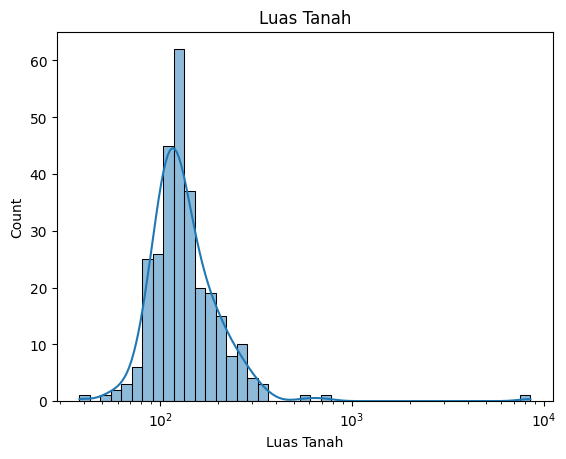

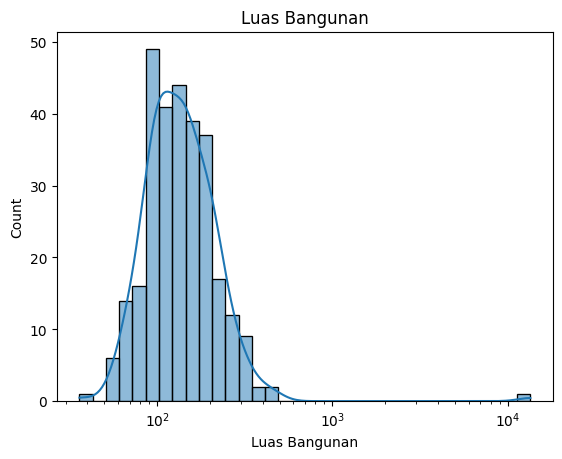

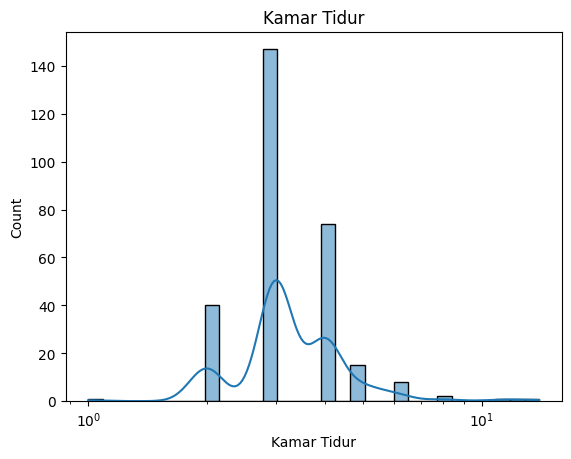

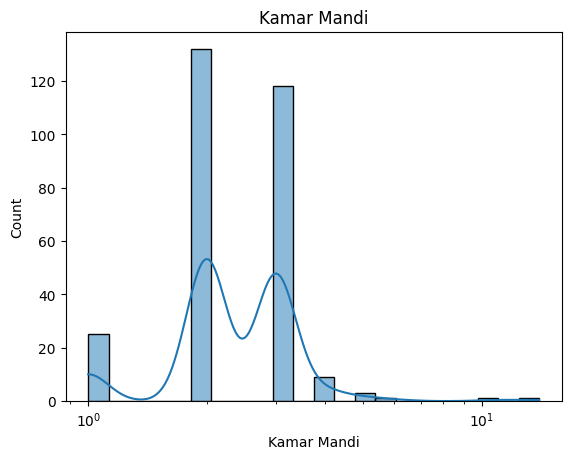

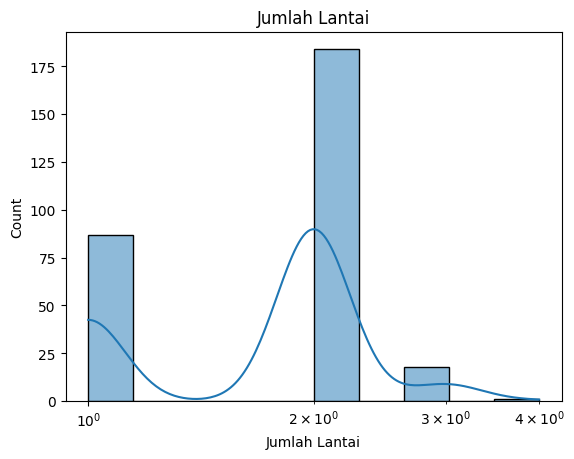

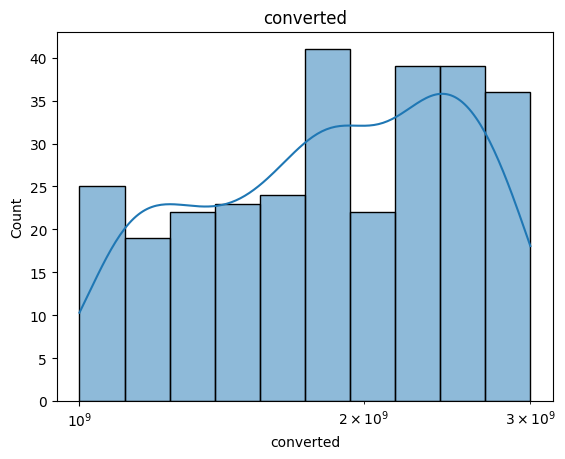

In [ ]:
get_histplot(bdg_up_mid2, log_scale=True)

In [ ]:
get_iqr(bdg_up_mid2)

{'Luas Tanah': [np.float64(22.0), np.float64(243.0)],
 'Luas Bangunan': [1, np.float64(300.0)],
 'Kamar Tidur': [1, np.float64(6.0)],
 'Kamar Mandi': [1, np.float64(5.0)],
 'Jumlah Lantai': [1, np.float64(4.0)],
 'converted': [np.float64(-175000000.0), np.float64(4025000000.0)]}

In [ ]:
get_outlier(bdg_up_mid2)

Luas Tanah -- found outliers: 20 
Luas Bangunan -- found outliers: 9 
Kamar Tidur -- found outliers: 5 
Kamar Mandi -- found outliers: 3 
Jumlah Lantai -- found outliers: 0 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
258         257            137            5            2              2   
259         252            170            4            3              2   
11          310            161            4            3              2   
141         336             70            3            2              1   
13          144            320            4            3              3   
16          254            475            6            5              2   
275         266            210            3            2              1   
19          200            400            6            3              2   
277         272            221            4            2              1   
156         105          

In [ ]:
bdg_up_mid_cleaned = remove_outlier(bdg_up_mid2)

In [ ]:
bdg_up_mid_cleaned.shape

(261, 10)

In [ ]:
bdg_up_mid_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,261.000000,261.000000,261.000000,261.000000,261.000000,261.000000,2.610000e+02
mean,128.597701,135.651341,3.237548,2.379310,1.766284,1.898161,1.898161e+09
std,38.380221,51.100176,0.830366,0.694617,0.550326,0.572485,5.724849e+08
min,38.000000,36.000000,2.000000,1.000000,1.000000,1.000000,1.000000e+09
25%,104.000000,98.000000,3.000000,2.000000,1.000000,1.400000,1.400000e+09
50%,120.000000,125.000000,3.000000,2.000000,2.000000,1.850000,1.850000e+09
75%,150.000000,170.000000,4.000000,3.000000,2.000000,2.400000,2.400000e+09
max,243.000000,300.000000,6.000000,4.000000,3.000000,3.000000,3.000000e+09


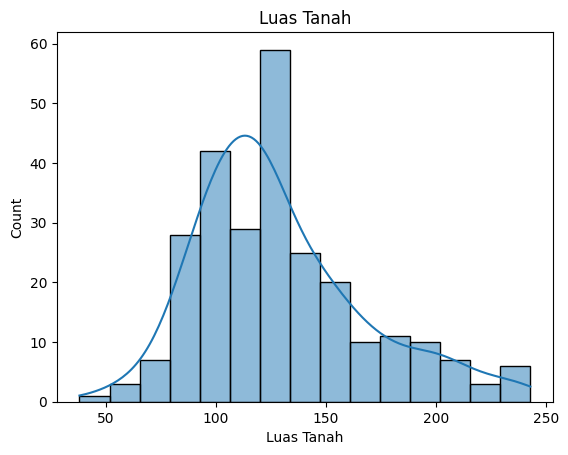

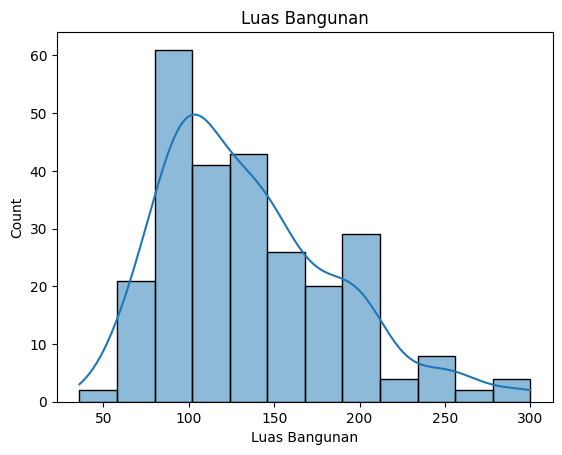

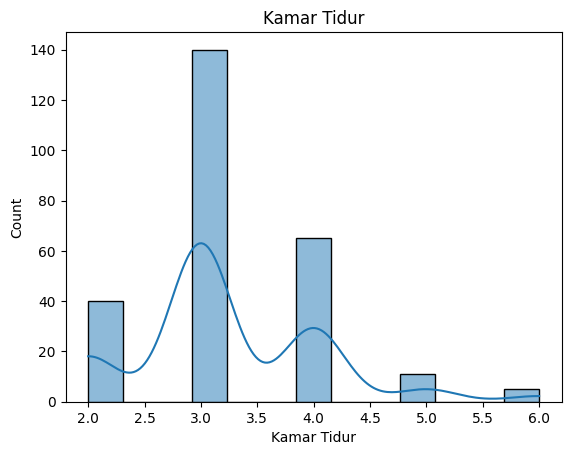

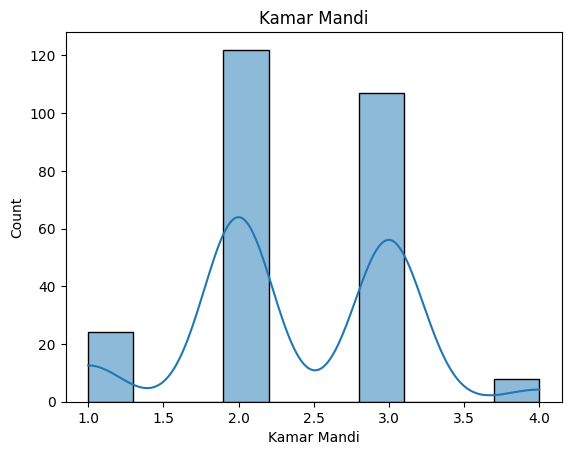

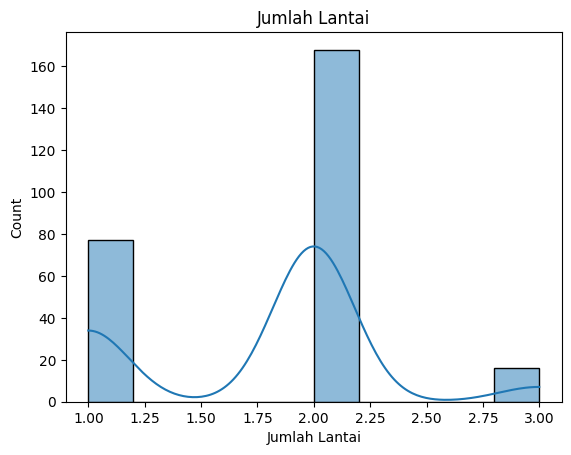

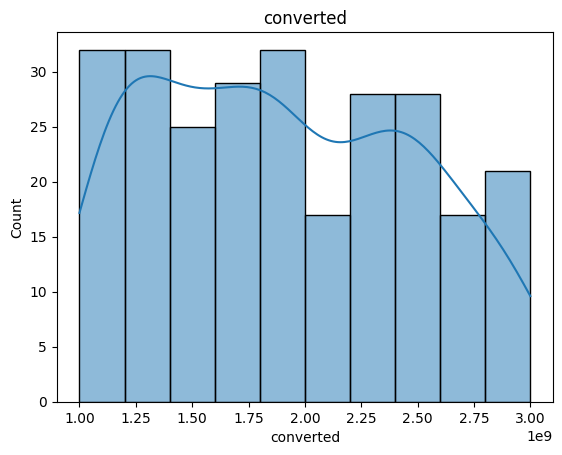

In [ ]:
get_histplot(bdg_up_mid_cleaned)

<Axes: >

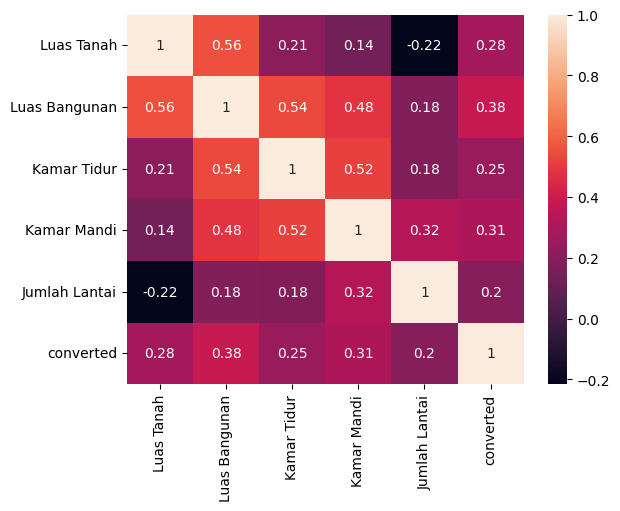

In [ ]:
get_corr(bdg_up_mid_cleaned)

#### bdg_high

In [ ]:
bdg_high2 = convert_pipeline(bdg_high)

In [ ]:
bdg_high.shape

(309, 15)

In [ ]:
bdg_high2.shape

(298, 10)

In [ ]:
bdg_high2.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,182,235,3,3,2,High,,NaN,None,NaN
1,187,176,3,3,3,High,"Rp 3,5 Miliar",3.5,Miliar,3.500000e+09
2,106,195,3,3,4,High,Rp 4 Miliar,4.0,Miliar,4.000000e+09
3,150,200,4,3,2,High,Rp 3 Miliar,3.0,Miliar,3.000000e+09
4,512,300,3,3,2,High,,NaN,None,NaN


In [ ]:
bdg_high2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,38
satuan,38
converted,38


In [ ]:
(bdg_high2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,3
Kamar Mandi,3
Jumlah Lantai,8
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
bdg_high2.dropna(inplace=True)

In [ ]:
bdg_high2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,2.600000e+02
mean,373.346154,340.200000,4.180769,3.273077,1.776923,4.511654,4.511654e+09
std,1189.292634,1045.043864,1.742611,1.734959,0.694884,1.164619,1.164619e+09
min,89.000000,54.000000,0.000000,0.000000,0.000000,3.000000,3.000000e+09
25%,189.750000,199.500000,3.000000,3.000000,1.000000,3.500000,3.500000e+09
50%,240.000000,250.000000,4.000000,3.000000,2.000000,4.420000,4.420000e+09
75%,333.000000,324.000000,5.000000,4.000000,2.000000,5.200000,5.200000e+09
max,18900.000000,17000.000000,24.000000,25.000000,4.000000,7.000000,7.000000e+09


In [ ]:
bdg_high2 = replace_zero(bdg_high2)

In [ ]:
bdg_high2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,2.600000e+02
mean,373.346154,340.200000,4.226923,3.307692,1.823077,4.511654,4.511654e+09
std,1189.292634,1045.043864,1.682996,1.698722,0.639321,1.164619,1.164619e+09
min,89.000000,54.000000,2.000000,1.000000,1.000000,3.000000,3.000000e+09
25%,189.750000,199.500000,3.000000,3.000000,1.000000,3.500000,3.500000e+09
50%,240.000000,250.000000,4.000000,3.000000,2.000000,4.420000,4.420000e+09
75%,333.000000,324.000000,5.000000,4.000000,2.000000,5.200000,5.200000e+09
max,18900.000000,17000.000000,24.000000,25.000000,4.000000,7.000000,7.000000e+09


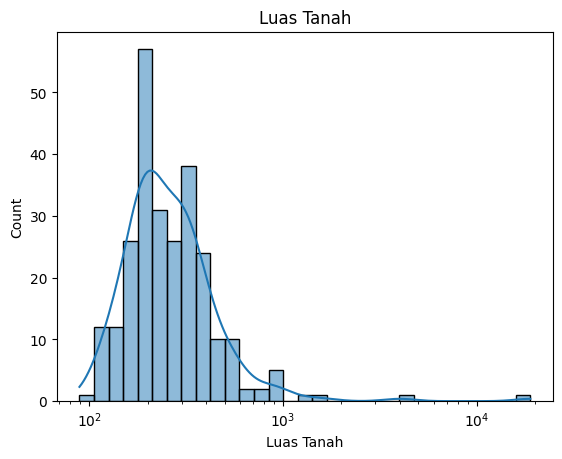

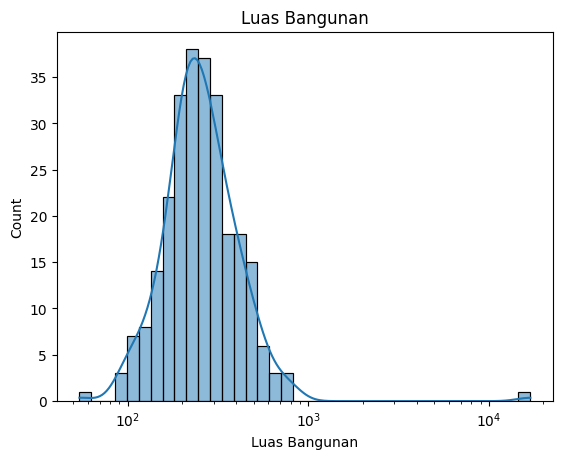

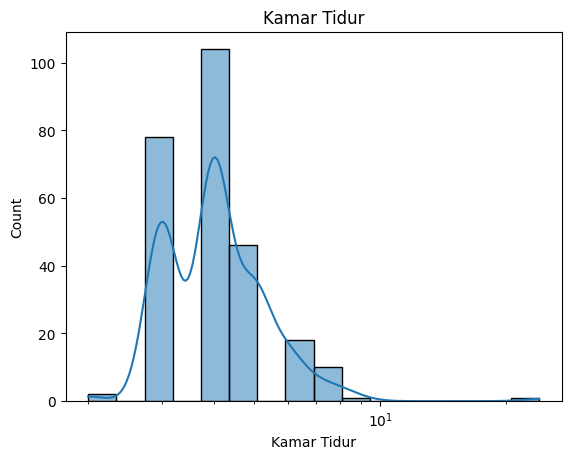

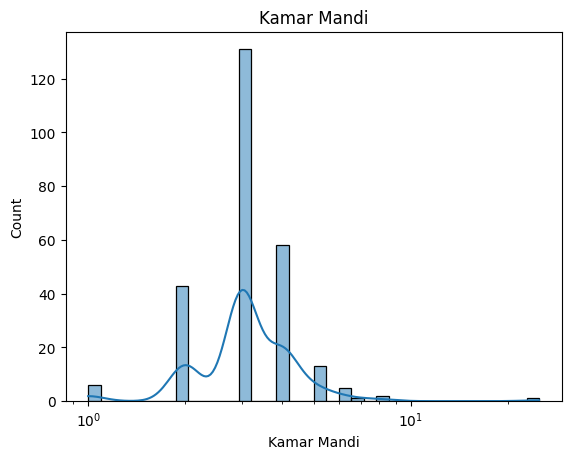

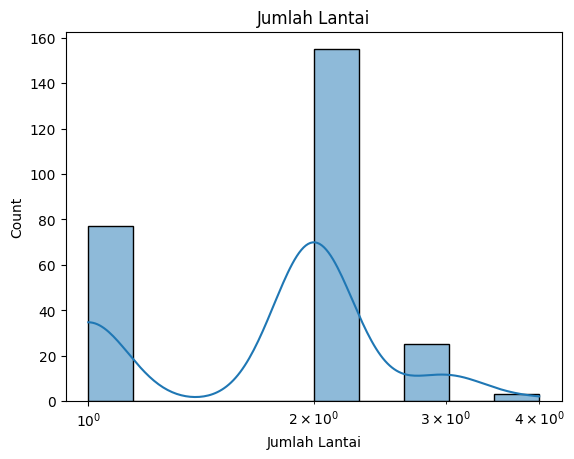

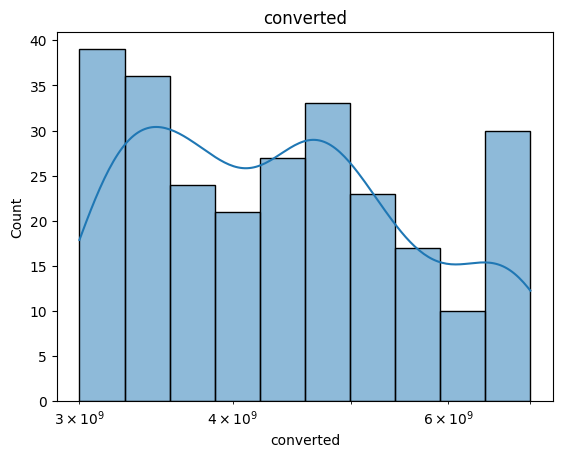

In [ ]:
get_histplot(bdg_high2, log_scale=True)

In [ ]:
get_iqr(bdg_high2)

{'Luas Tanah': [1, np.float64(548.0)],
 'Luas Bangunan': [np.float64(12.0), np.float64(511.0)],
 'Kamar Tidur': [1, np.float64(8.0)],
 'Kamar Mandi': [1, np.float64(6.0)],
 'Jumlah Lantai': [1, np.float64(4.0)],
 'converted': [np.float64(950000000.0), np.float64(7750000000.0)]}

In [ ]:
get_outlier(bdg_high2)

Luas Tanah -- found outliers: 17 
Luas Bangunan -- found outliers: 13 
Kamar Tidur -- found outliers: 2 
Kamar Mandi -- found outliers: 4 
Jumlah Lantai -- found outliers: 0 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
129         363            550            7            5              2   
133         241            485            8            8              3   
134         600            800            6            3              2   
277         877            400            3            2              1   
149         241            400            7            7              1   
279         376            700            5            4              3   
280         387            560            6            8              3   
162       18900          17000            3            2              1   
292         728            225            3            3              2   
172         450         

In [ ]:
bdg_high_cleaned = remove_outlier(bdg_high2)

In [ ]:
bdg_high_cleaned.shape

(232, 10)

In [ ]:
bdg_high_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,232.000000,232.000000,232.000000,232.000000,232.000000,232.000000,2.320000e+02
mean,248.413793,253.254310,4.038793,3.125000,1.827586,4.406422,4.406422e+09
std,94.564169,96.509067,1.003567,0.881201,0.634858,1.105194,1.105194e+09
min,89.000000,54.000000,2.000000,1.000000,1.000000,3.000000,3.000000e+09
25%,181.500000,190.000000,3.000000,3.000000,1.000000,3.500000,3.500000e+09
50%,220.000000,234.500000,4.000000,3.000000,2.000000,4.250000,4.250000e+09
75%,309.500000,300.000000,4.250000,4.000000,2.000000,5.000000,5.000000e+09
max,540.000000,500.000000,8.000000,6.000000,4.000000,7.000000,7.000000e+09


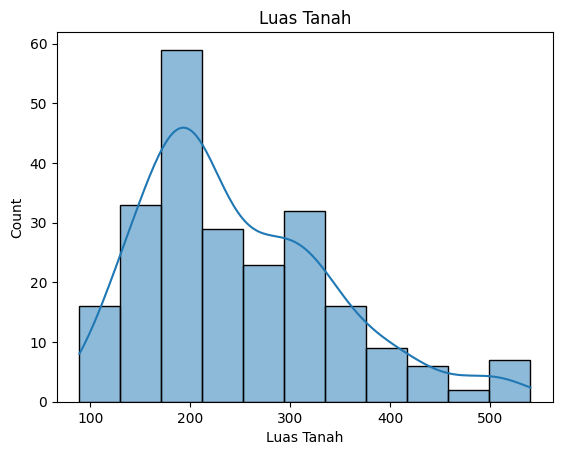

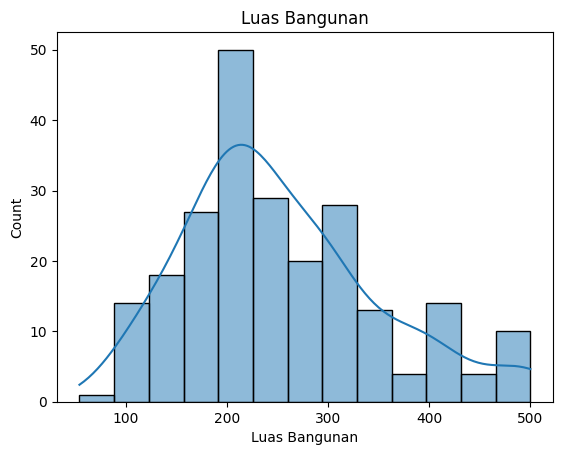

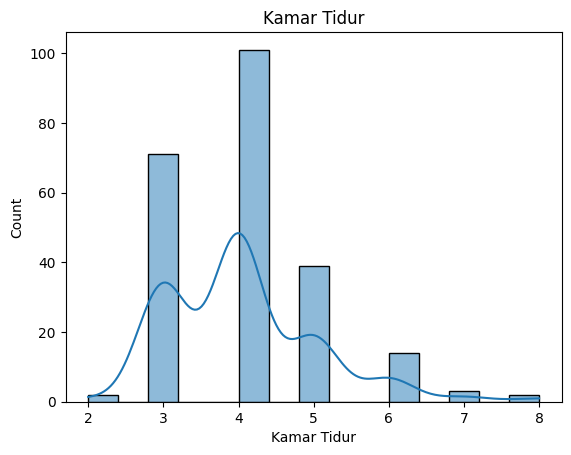

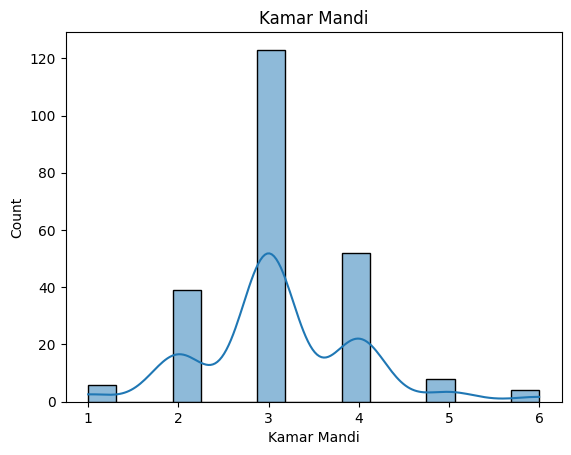

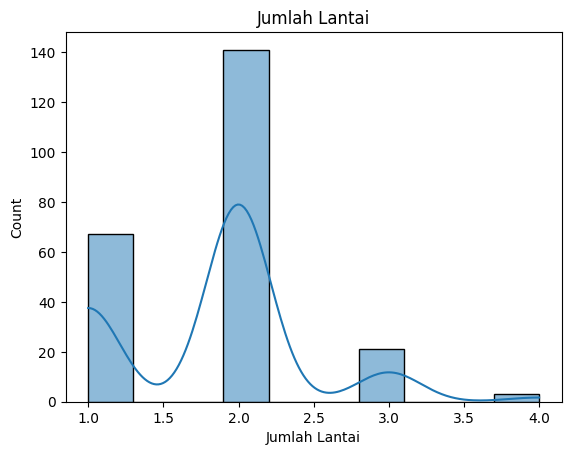

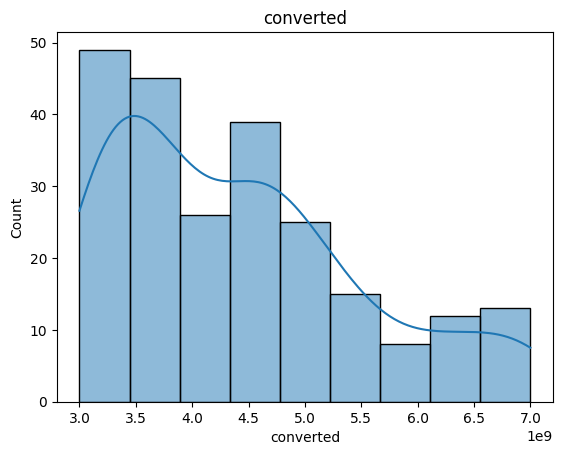

In [ ]:
get_histplot(bdg_high_cleaned)

<Axes: >

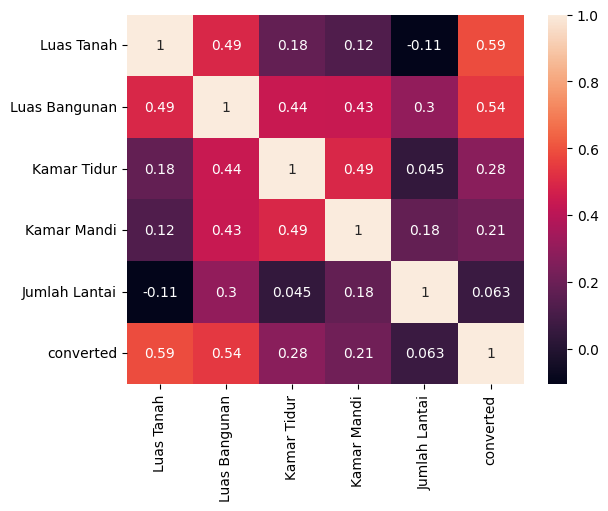

In [ ]:
get_corr(bdg_high_cleaned)

#### bdg_luxury

In [ ]:
bdg_luxury2 = convert_pipeline(bdg_luxury)

In [ ]:
bdg_luxury.shape

(273, 15)

In [ ]:
bdg_luxury2.shape

(271, 10)

In [ ]:
bdg_luxury2.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,580,280,4,3,1,Luxury,"Rp 15,4 Miliar",15.40,Miliar,1.540000e+10
1,349,300,4,4,2,Luxury,"Rp 7,25 Miliar",7.25,Miliar,7.250000e+09
2,559,440,16,18,2,Luxury,"Rp 7,3 Miliar",7.30,Miliar,7.300000e+09
3,407,400,4,3,2,Luxury,Rp 9 Miliar,9.00,Miliar,9.000000e+09
4,228,400,3,4,2,Luxury,"Rp 7,8 Miliar",7.80,Miliar,7.800000e+09


In [ ]:
bdg_luxury2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,12
satuan,12
converted,12


In [ ]:
(bdg_luxury2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,2
Kamar Mandi,4
Jumlah Lantai,10
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
bdg_luxury2.dropna(inplace=True)

In [ ]:
bdg_luxury2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,2.590000e+02
mean,1212.324324,776.741313,6.092664,4.822394,1.837838,10.807761,1.080776e+10
std,9586.135571,4635.280231,5.663625,4.790102,0.760429,3.639492,3.639492e+09
min,169.000000,1.000000,0.000000,0.000000,0.000000,7.000000,7.000000e+09
25%,399.500000,350.000000,4.000000,3.000000,1.000000,8.000000,8.000000e+09
50%,500.000000,450.000000,5.000000,4.000000,2.000000,9.200000,9.200000e+09
75%,675.000000,600.000000,6.000000,5.000000,2.000000,13.000000,1.300000e+10
max,154700.000000,75000.000000,48.000000,44.000000,5.000000,20.000000,2.000000e+10


In [ ]:
bdg_luxury2 = replace_zero(bdg_luxury2)

In [ ]:
bdg_luxury2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,2.590000e+02
mean,1212.324324,776.741313,6.131274,4.884170,1.907336,10.807761,1.080776e+10
std,9586.135571,4635.280231,5.638852,4.753018,0.675645,3.639492,3.639492e+09
min,169.000000,1.000000,1.000000,1.000000,1.000000,7.000000,7.000000e+09
25%,399.500000,350.000000,4.000000,3.000000,1.000000,8.000000,8.000000e+09
50%,500.000000,450.000000,5.000000,4.000000,2.000000,9.200000,9.200000e+09
75%,675.000000,600.000000,6.000000,5.000000,2.000000,13.000000,1.300000e+10
max,154700.000000,75000.000000,48.000000,44.000000,5.000000,20.000000,2.000000e+10


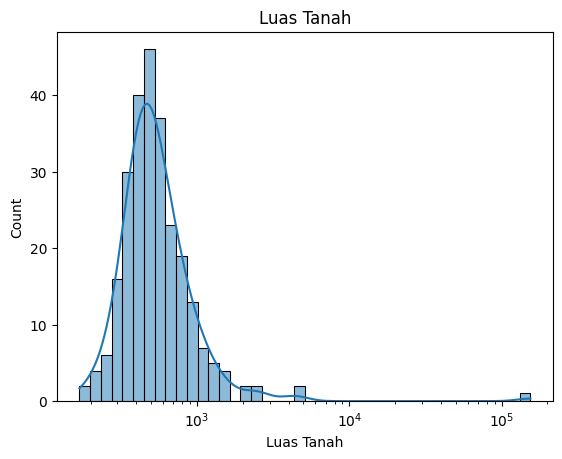

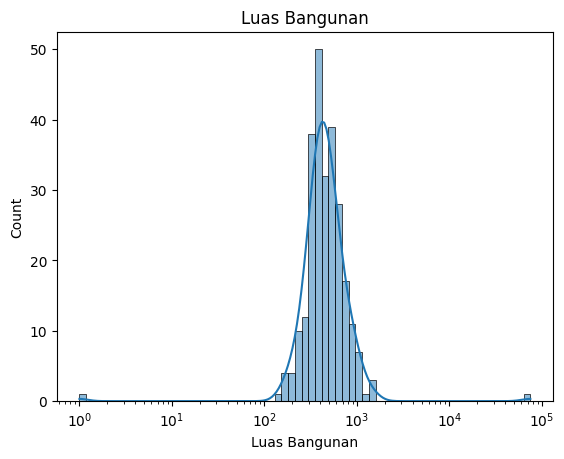

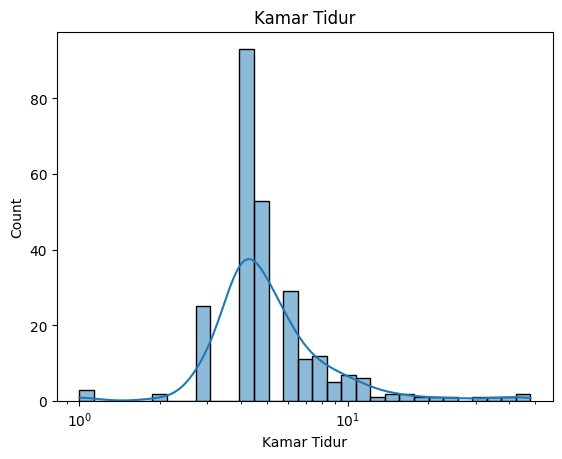

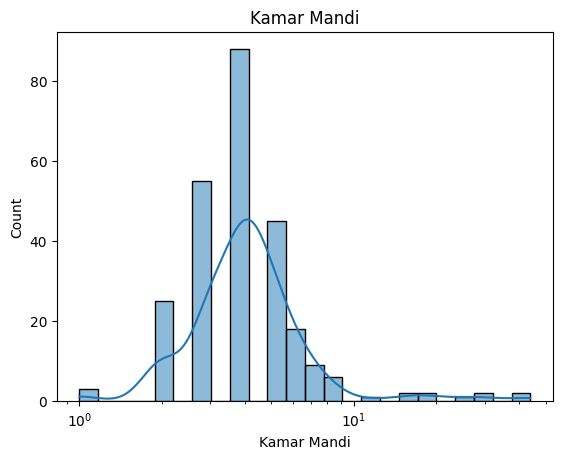

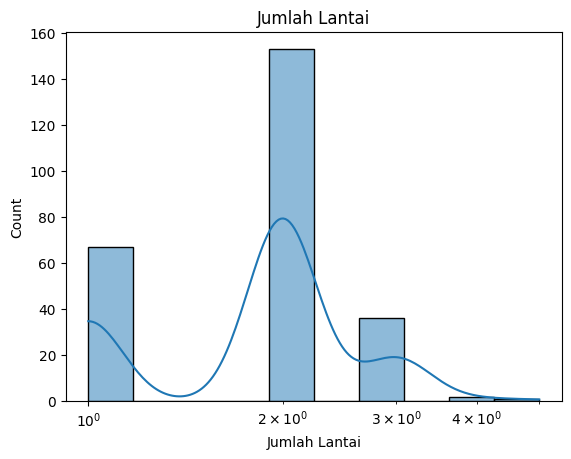

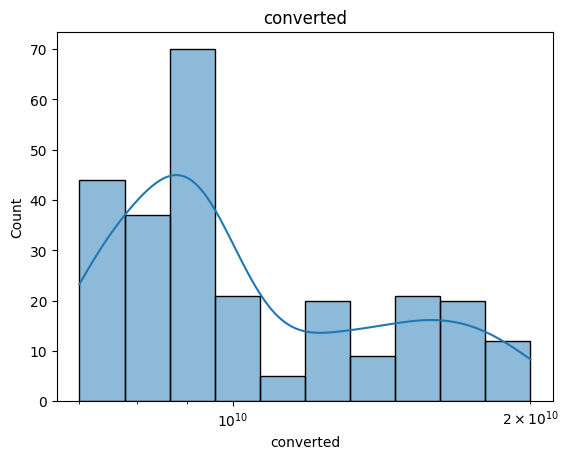

In [ ]:
get_histplot(bdg_luxury2, log_scale=True)

In [ ]:
get_iqr(bdg_luxury2)

{'Luas Tanah': [1, np.float64(1089.0)],
 'Luas Bangunan': [1, np.float64(975.0)],
 'Kamar Tidur': [1, np.float64(9.0)],
 'Kamar Mandi': [1, np.float64(8.0)],
 'Jumlah Lantai': [1, np.float64(4.0)],
 'converted': [np.float64(500000000.0), np.float64(20500000000.0)]}

In [ ]:
get_outlier(bdg_luxury2)

Luas Tanah -- found outliers: 19 
Luas Bangunan -- found outliers: 12 
Kamar Tidur -- found outliers: 26 
Kamar Mandi -- found outliers: 11 
Jumlah Lantai -- found outliers: 1 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
128        1135            500            3            4              3   
257         639           1000            6            7              3   
2           559            440           16           18              2   
260        1545            750            5            4              2   
134        1130            500            5            4              2   
7          1586           1000           44           44              2   
266        4368            173            1            2              2   
138        1059            800            9            2              5   
268         386            850           12            7              2   
13          800       

In [ ]:
bdg_luxury_cleaned = remove_outlier(bdg_luxury2)

In [ ]:
bdg_luxury_cleaned.shape

(216, 10)

In [ ]:
bdg_luxury_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,216.000000,216.000000,216.000000,216.000000,216.000000,216.000000,2.160000e+02
mean,509.750000,442.476852,4.726852,3.884259,1.870370,10.291713,1.029171e+10
std,183.637642,163.294169,1.399143,1.212544,0.662519,3.289203,3.289203e+09
min,169.000000,1.000000,1.000000,1.000000,1.000000,7.000000,7.000000e+09
25%,378.750000,348.750000,4.000000,3.000000,1.000000,8.000000,8.000000e+09
50%,478.000000,400.000000,4.000000,4.000000,2.000000,9.000000,9.000000e+09
75%,600.000000,519.750000,5.000000,5.000000,2.000000,12.000000,1.200000e+10
max,1040.000000,954.000000,9.000000,8.000000,4.000000,20.000000,2.000000e+10


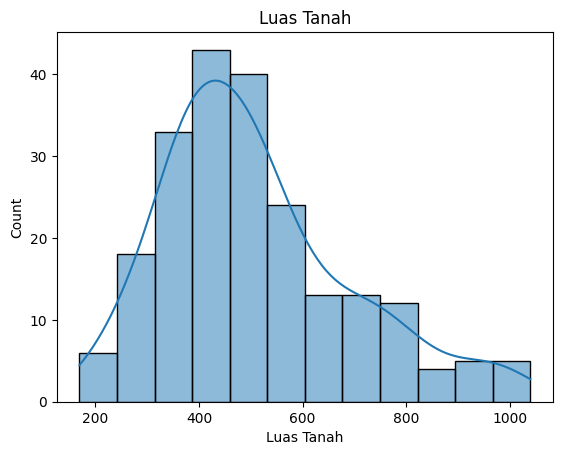

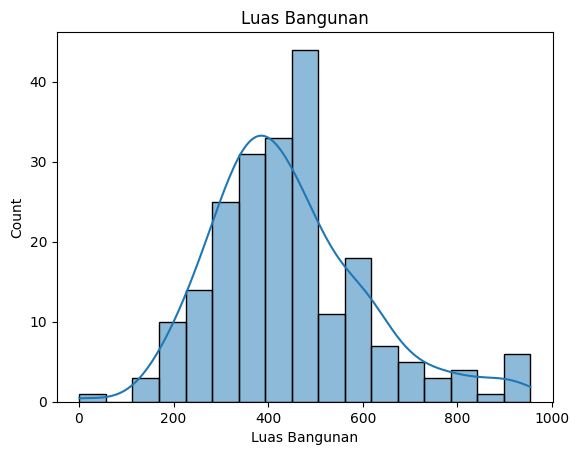

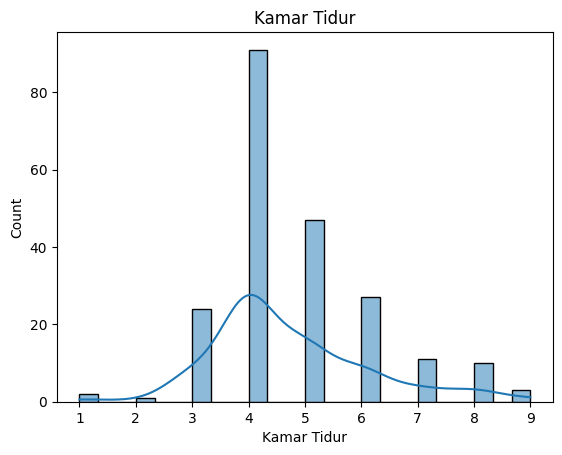

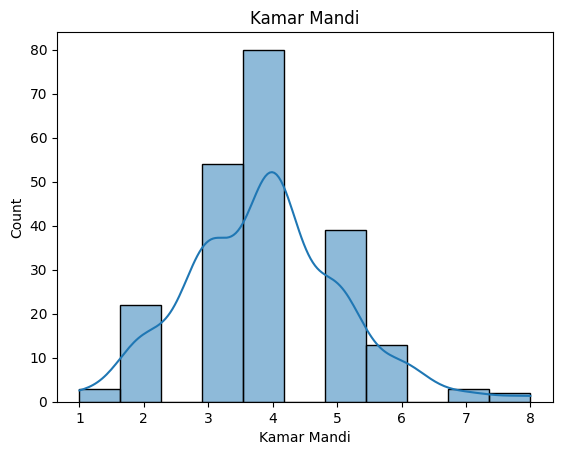

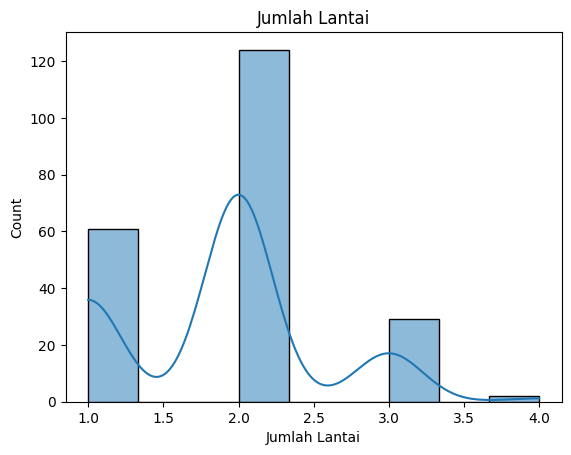

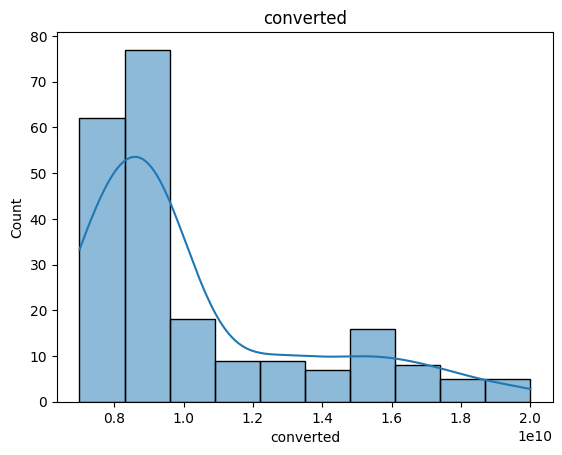

In [ ]:
get_histplot(bdg_luxury_cleaned)

<Axes: >

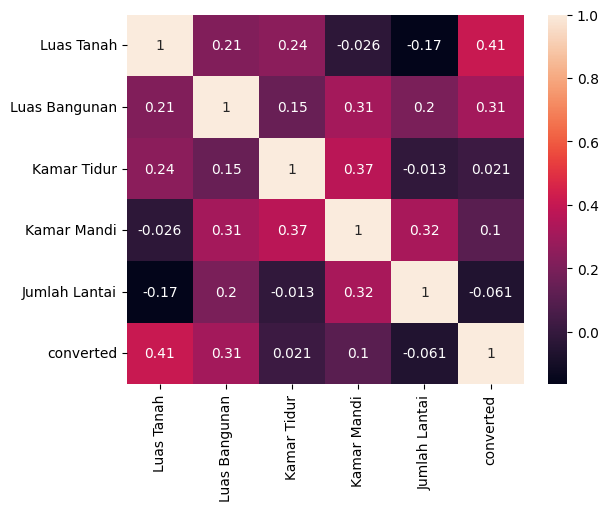

In [ ]:
get_corr(bdg_luxury_cleaned)

#### merged

In [ ]:
bdg_merged = pd.concat([bdg_low_cleaned, bdg_low_mid_cleaned, bdg_up_mid_cleaned, bdg_high_cleaned, bdg_luxury_cleaned])

In [ ]:
bdg_merged.shape

(1148, 10)

In [ ]:
bdg_merged.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,60,36,2,1,1,Low,Rp 175 Juta,175.0,Juta,175000000.0
1,40,30,2,1,1,Low,Rp 100 Juta,100.0,Juta,100000000.0
2,70,50,2,1,1,Low,Rp 305 Juta,305.0,Juta,305000000.0
3,70,45,2,1,1,Low,Rp 285 Juta,285.0,Juta,285000000.0
4,68,36,2,1,1,Low,Rp 105 Juta,105.0,Juta,105000000.0


In [ ]:
bdg_merged.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,1148.000000,1148.000000,1148.000000,1148.000000,1148.000000,1148.000000,1.148000e+03
mean,206.204704,188.574042,3.306620,2.392857,1.571429,210.753240,3.473794e+09
std,183.821439,166.252192,1.329063,1.281558,0.624369,303.713333,3.886982e+09
min,36.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+08
25%,83.000000,60.000000,2.000000,1.000000,1.000000,3.100000,6.750000e+08
50%,124.000000,127.000000,3.000000,2.000000,2.000000,8.500000,1.900000e+09
75%,270.250000,265.750000,4.000000,3.000000,2.000000,404.500000,4.812500e+09
max,1040.000000,954.000000,9.000000,8.000000,4.000000,999.000000,2.000000e+10


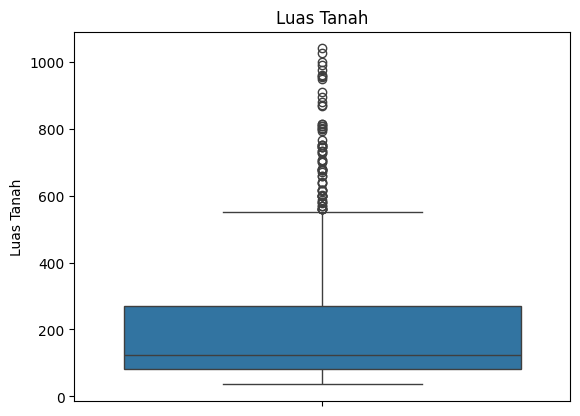

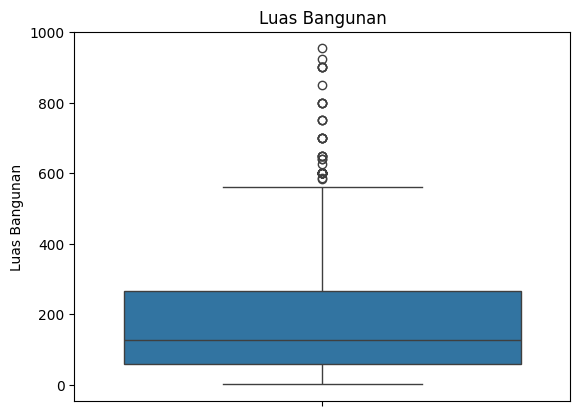

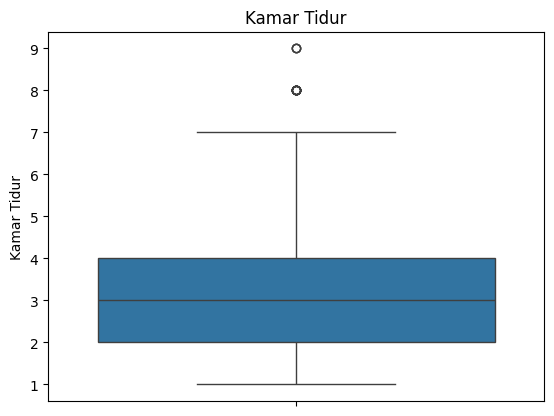

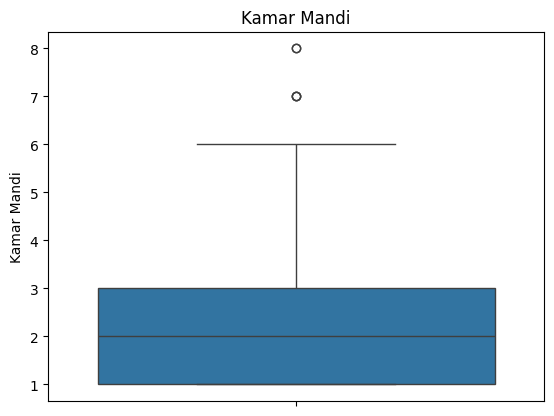

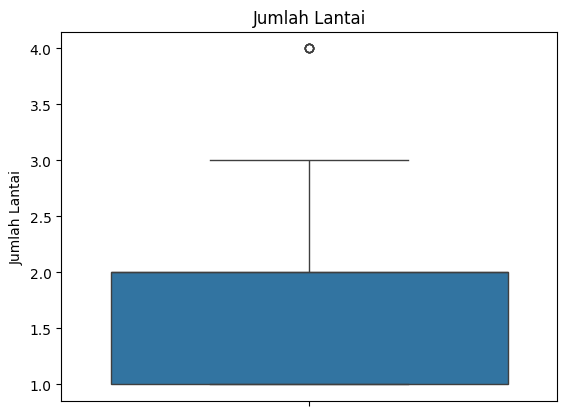

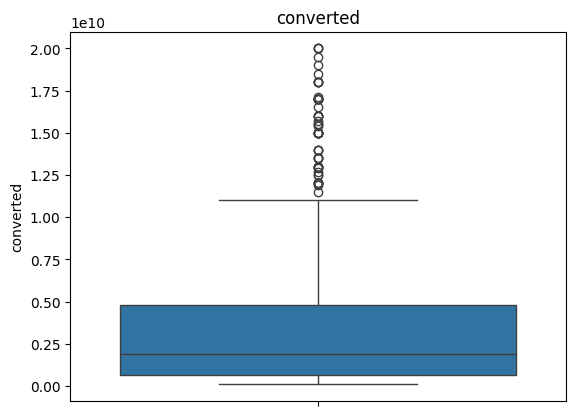

In [ ]:
get_boxplot(bdg_merged)

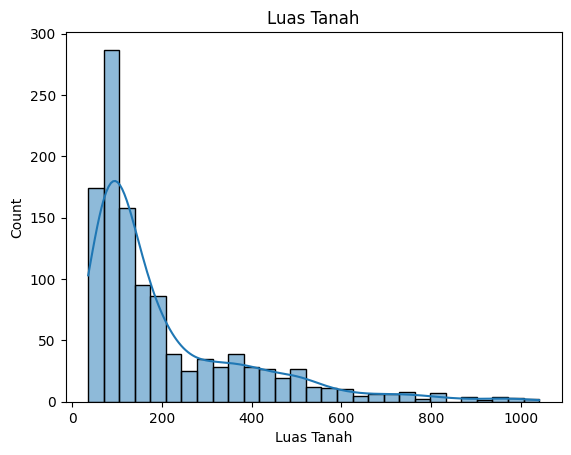

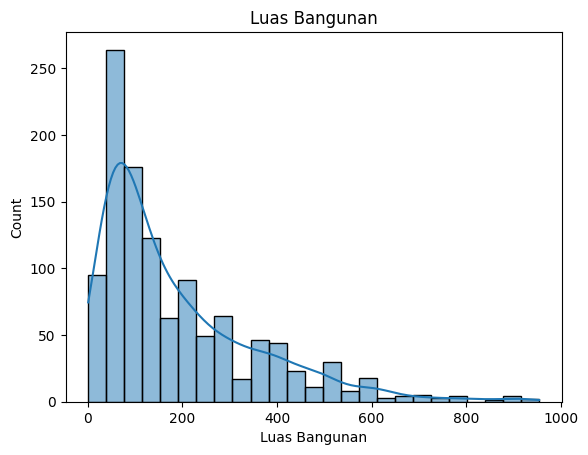

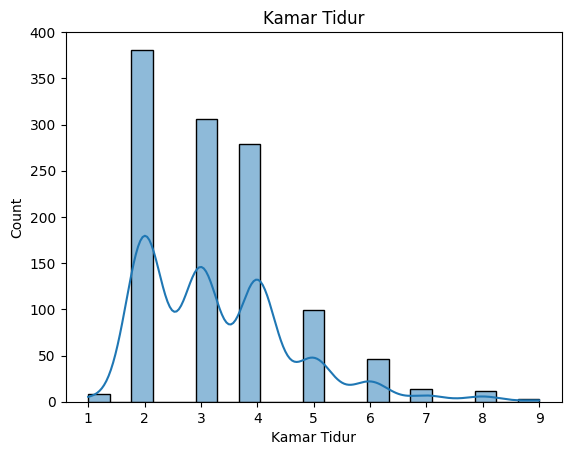

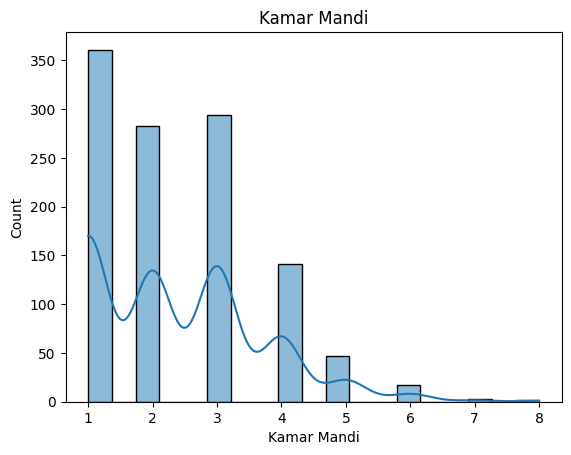

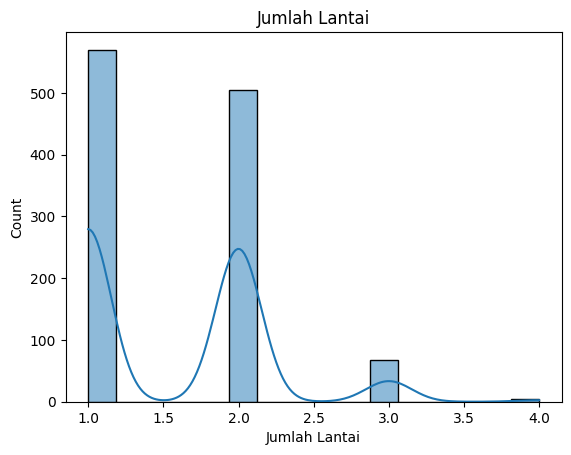

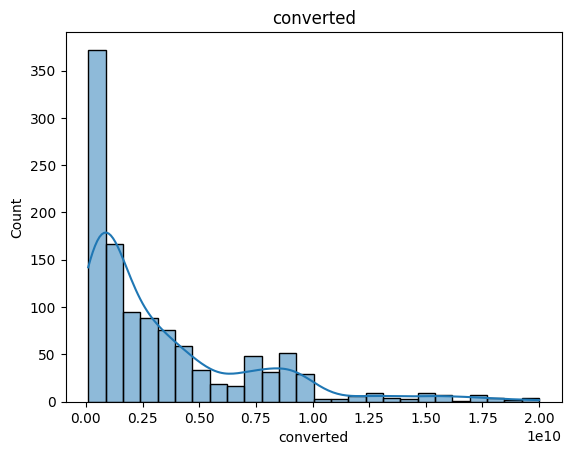

In [ ]:
get_histplot(bdg_merged)

In [ ]:
get_outlier(bdg_merged)

Luas Tanah -- found outliers: 69 
Luas Bangunan -- found outliers: 44 
Kamar Tidur -- found outliers: 15 
Kamar Mandi -- found outliers: 5 
Jumlah Lantai -- found outliers: 0 
converted -- found outliers: 57 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
0            60             36            2            1              1   
0           165            101            3            2              1   
0            84             74            2            2              2   
0           580            280            4            3              1   
5            60             36            2            1              1   
..          ...            ...          ...          ...            ...   
270         190            119            3            1              1   
270         911            400            5            5              1   
272         100             80            3            1              1   
272         162       

<Axes: >

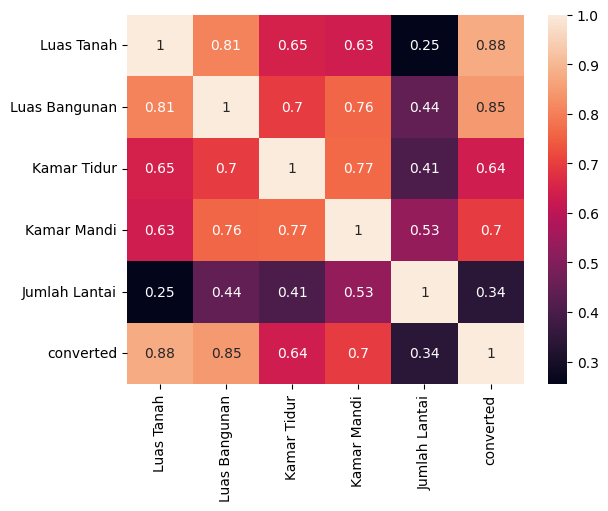

In [ ]:
get_corr(bdg_merged)

In [ ]:
bdg_merged.to_csv('Bandung_merged.csv', index=False)

In [ ]:
bdg_merged.columns

Index(['Luas Tanah', 'Luas Bangunan', 'Kamar Tidur', 'Kamar Mandi',
       'Jumlah Lantai', 'Category', 'Harga', 'nominal', 'satuan', 'converted'],
      dtype='object')

In [ ]:
X = bdg_merged.drop(columns=['converted', 'Category', 'Harga', 'nominal', 'satuan'])
y = bdg_merged['converted']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
xgb_bdg = XGBRegressor(objective='reg:squarederror', eval_metric='mae')

# xgb_bdg = XGBRegressor(random_state=42)

In [ ]:
xgb_bdg.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric='mae', feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
xgb_bdg.score(X_test, y_test)

0.7847285602815791

In [ ]:
bdg_merged.sample(3)

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
1,349,300,4,4,2,Luxury,"Rp 7,25 Miliar",7.25,Miliar,7.250000e+09
44,282,282,1,4,2,Luxury,Rp 17 Miliar,17.00,Miliar,1.700000e+10
47,118,60,2,2,1,Low-Mid,Rp 725 Juta,725.00,Juta,7.250000e+08


In [ ]:
test = [[118,	60,	2,	3,	1]]

xgb_bdg.predict(test)[0]

np.float32(878869760.0)

In [ ]:
get_model_summary(xgb_bdg, X_test, y_test)

MAE: 898780988.9391304
MSE: 3.079060901413801e+18
R-squared: 0.7847285602815791

Error for cheapest house: 2443264.0
Error for most expensive house: 12052505088.0

MAPE: 31.80%


In [ ]:
bdg_robust = RobustScaler()
bdg_minmax = MinMaxScaler()

In [ ]:
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = split_scaled(bdg_merged, bdg_robust, bdg_minmax)

In [ ]:
xgb_bdg_scaled = XGBRegressor(random_state=42)

In [ ]:
xgb_bdg_scaled.fit(X_train_scaled, y_train_scaled)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
xgb_bdg_scaled.score(X_test_scaled, y_test_scaled)

0.895367735007306

In [ ]:
get_model_summary_scaled(xgb_bdg_scaled, X_test_scaled, y_test_scaled)

MAE: 894508327.9999989
MSE: 3.014641416601029e+18
R-squared: 0.7892324254812562

Error for cheapest house: 87040.00000047684
Error for most expensive house: 10843892224.00001

MAPE: 31.01%


In [ ]:
np.expm1( 1.4933588879361146)

np.float64(3.4520242836018054)

In [ ]:
X_train_scaled.sample()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai
186,-0.083551,0.033654,0.25,0.142857,0.333333


In [ ]:
bdg_merged.sample(3)

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
67,313,175,5,2,1,High,Rp 7 Miliar,7.0,Miliar,7.000000e+09
220,306,200,5,4,1,High,"Rp 3,5 Miliar",3.5,Miliar,3.500000e+09
64,118,140,5,3,2,Low-Mid,Rp 975 Juta,975.0,Juta,9.750000e+08


In [ ]:
test_scaled = [118,	140,	5,	3,	2, 975000000	]
test_scaled = scale_feature(bdg_robust, bdg_minmax, test_scaled)

In [ ]:
test_scaled

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,converted
0,-0.010444,0.072115,0.5,0.285714,0.333333,20.697948


In [ ]:
test_scaled.drop(columns=['converted'], inplace=True)
xgb_bdg_scaled.predict(test_scaled)[0]

np.float32(20.716768)

In [ ]:
y_pred_log = xgb_bdg_scaled.predict(test_scaled)[0]
np.expm1(y_pred_log)

np.float32(993523460.0)

In [ ]:
xgb_bdg.predict([[472,	400,	3,	3,	2]])[0]

np.float32(5068849000.0)

In [ ]:
xgb_bdg.score(X_test, y_test)

0.7847285602815791

In [ ]:
xgb_bdg.predict([[84,	65,	3,	1,	1	]])[0]

np.float32(897474240.0)

In [ ]:
bdg_robust = RobustScaler()
bdg_minmax = MinMaxScaler()

In [ ]:
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = split_scaled(bdg_merged, bdg_robust, bdg_minmax)

In [ ]:
xgb_bdg_scaled = XGBRegressor(objective='reg:squarederror', random_state=42)

In [ ]:
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 1]
}

In [ ]:
bdg_grid_search_scaled = GridSearchCV(estimator=xgb_bdg_scaled,
                           param_grid=param_grid,
                           cv=10,
                           scoring='neg_mean_squared_error',
                           n_jobs=-1,
                           verbose=2)

In [ ]:
bdg_grid_search_scaled.fit(X_train_scaled, y_train_scaled)

Fitting 10 folds for each of 24 candidates, totalling 240 fits


GridSearchCV(cv=10,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None,...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=42, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1], 'max_depth': [3, 5, 7],
                         'n_estimators': [100, 200], 'subsample': [0.8, 1]},
             scoring='neg_mean_squared_error', verbose=2)

In [ ]:
bdg_best_model = bdg_grid_search_scaled.best_estimator_

In [ ]:
get_model_summary_scaled(bdg_best_model, X_test_scaled, y_test_scaled)

MAE: 941186408.3478254
MSE: 3.1062173265138243e+18
R-squared: 0.7828299285506498

Error for cheapest house: 384447.9999990463
Error for most expensive house: 9774864383.999992

MAPE: 30.48%


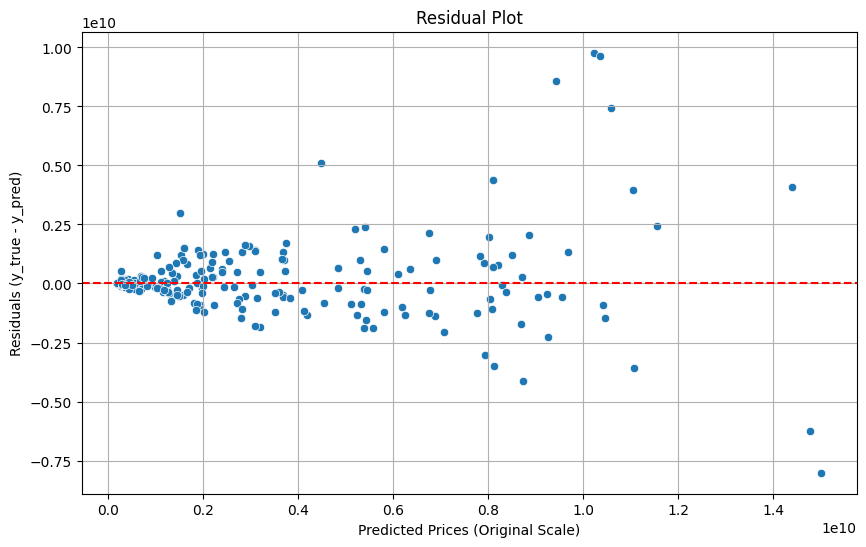

In [ ]:
# Predict log values
y_pred_log = bdg_best_model.predict(X_test_scaled)

# Convert to original scale
y_test_conv = np.expm1(y_test_scaled)
y_pred = np.expm1(y_pred_log)

# Residuals
residuals = y_test_conv - y_pred

# Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_pred, y=residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Predicted Prices (Original Scale)')
plt.ylabel('Residuals (y_true - y_pred)')
plt.title('Residual Plot')
plt.grid(True)
plt.show()

In [ ]:
for true_val, pred_val in zip(y_test_conv[:10], y_pred[:10]):
    print(f"True: {true_val:.2f}, Pred: {pred_val:.2f}")

True: 450000000.00, Pred: 698749824.00
True: 2300000000.00, Pred: 3506393088.00
True: 3500000000.00, Pred: 5390971392.00
True: 550000000.00, Pred: 523369376.00
True: 381000000.00, Pred: 434980576.00
True: 750000000.00, Pred: 742454592.00
True: 590000000.00, Pred: 436341696.00
True: 4680000000.00, Pred: 3657537024.00
True: 1790000000.00, Pred: 1455861376.00
True: 7900000000.00, Pred: 6903144960.00


### **Yogya**

In [ ]:
ygy_low = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Yogya_low.csv')
ygy_low_mid = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Yogya_low_mid.csv')
ygy_up_mid = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Yogya_Up_mid.csv')
ygy_high = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Yogya_high.csv')
ygy_luxury = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Yogya_luxury.csv')

#### ygy_low

In [ ]:
ygy_low['Category'] = 'Low'

In [ ]:
ygy_low2 = convert_pipeline(ygy_low)

In [ ]:
ygy_low.shape

(213, 15)

In [ ]:
ygy_low2.shape

(212, 10)

In [ ]:
ygy_low2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,2
satuan,2
converted,2


In [ ]:
(ygy_low2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,3
Kamar Mandi,2
Jumlah Lantai,21
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
ygy_low2.dropna(inplace=True)

In [ ]:
ygy_low2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000,2.100000e+02
mean,126.480952,71.580952,2.095238,1.061905,0.904762,369.866667,3.698667e+08
std,560.798860,411.352322,0.448790,0.295057,0.310080,90.761064,9.076106e+07
min,20.000000,27.000000,0.000000,0.000000,0.000000,162.000000,1.620000e+08
25%,71.250000,34.250000,2.000000,1.000000,1.000000,300.000000,3.000000e+08
50%,80.500000,40.000000,2.000000,1.000000,1.000000,380.000000,3.800000e+08
75%,100.000000,49.500000,2.000000,1.000000,1.000000,450.000000,4.500000e+08
max,8200.000000,6000.000000,3.000000,3.000000,2.000000,500.000000,5.000000e+08


In [ ]:
ygy_low2 = replace_zero(ygy_low2)

In [ ]:
ygy_low2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,210.000000,210.000000,210.00000,210.000000,210.000000,210.000000,2.100000e+02
mean,126.480952,71.580952,2.12381,1.071429,1.004762,369.866667,3.698667e+08
std,560.798860,411.352322,0.37109,0.276067,0.069007,90.761064,9.076106e+07
min,20.000000,27.000000,1.00000,1.000000,1.000000,162.000000,1.620000e+08
25%,71.250000,34.250000,2.00000,1.000000,1.000000,300.000000,3.000000e+08
50%,80.500000,40.000000,2.00000,1.000000,1.000000,380.000000,3.800000e+08
75%,100.000000,49.500000,2.00000,1.000000,1.000000,450.000000,4.500000e+08
max,8200.000000,6000.000000,3.00000,3.000000,2.000000,500.000000,5.000000e+08


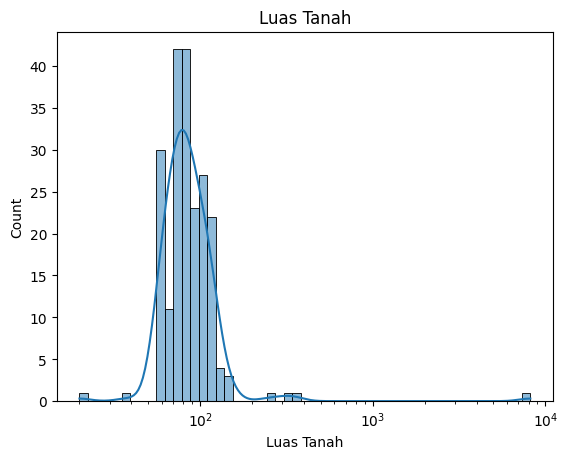

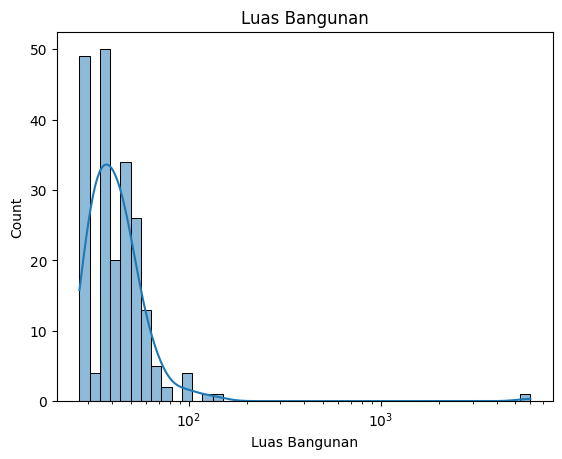

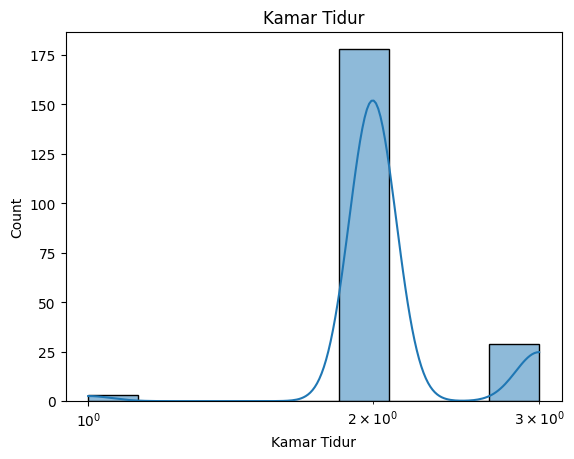

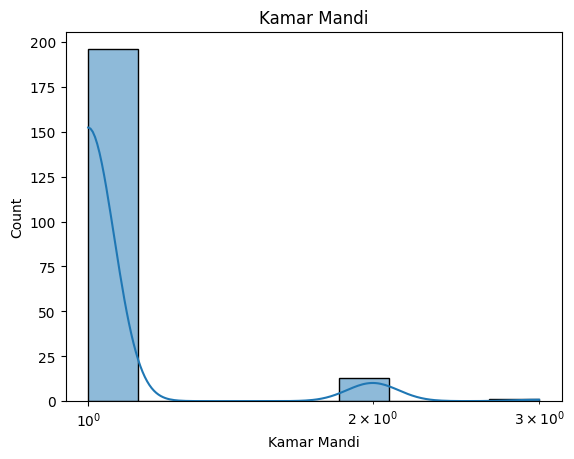

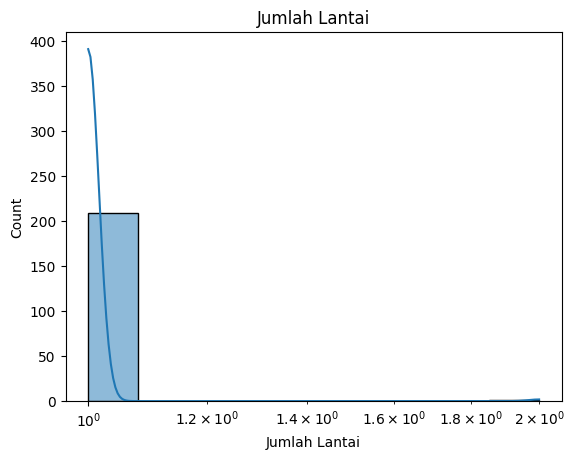

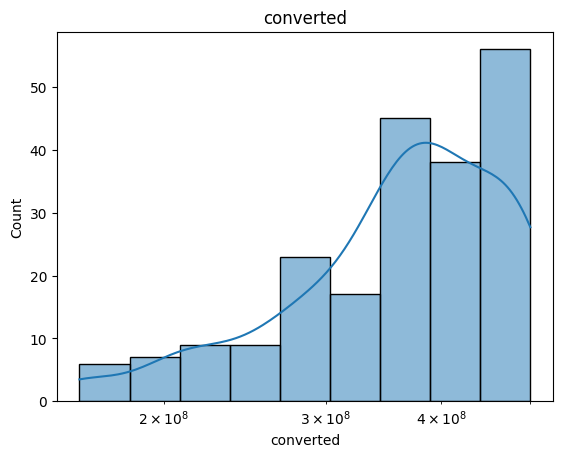

In [ ]:
get_histplot(ygy_low2, log_scale=True)

In [ ]:
get_iqr(ygy_low2)

{'Luas Tanah': [np.float64(28.0), np.float64(144.0)],
 'Luas Bangunan': [np.float64(11.0), np.float64(73.0)],
 'Kamar Tidur': [np.float64(2.0), np.float64(2.0)],
 'Kamar Mandi': [1, np.float64(1.0)],
 'Jumlah Lantai': [1, np.float64(1.0)],
 'converted': [np.float64(75000000.0), np.float64(675000000.0)]}

In [ ]:
get_outlier(ygy_low2)

Luas Tanah -- found outliers: 8 
Luas Bangunan -- found outliers: 9 
Kamar Tidur -- found outliers: 32 
Kamar Mandi -- found outliers: 14 
Jumlah Lantai -- found outliers: 1 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
4           314            100            3            2              1   
5           352            100            3            1              1   
134          63             30            3            1              1   
135        8200           6000            2            1              1   
11           90             60            3            2              1   
19          125             40            3            1              1   
153          94             94            2            1              1   
154         109             75            3            1              1   
163         108             38            3            1              1   
167         119         

In [ ]:
ygy_low_cleaned = replace_outlier(ygy_low2)

In [ ]:
ygy_low_cleaned.shape

(210, 10)

In [ ]:
ygy_low_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,210.000000,210.000000,210.0,210.0,210.0,210.000000,2.100000e+02
mean,85.804762,42.309524,2.0,1.0,1.0,369.866667,3.698667e+08
std,21.662593,11.736925,0.0,0.0,0.0,90.761064,9.076106e+07
min,28.000000,27.000000,2.0,1.0,1.0,162.000000,1.620000e+08
25%,71.250000,34.250000,2.0,1.0,1.0,300.000000,3.000000e+08
50%,80.500000,40.000000,2.0,1.0,1.0,380.000000,3.800000e+08
75%,100.000000,49.500000,2.0,1.0,1.0,450.000000,4.500000e+08
max,144.000000,73.000000,2.0,1.0,1.0,500.000000,5.000000e+08


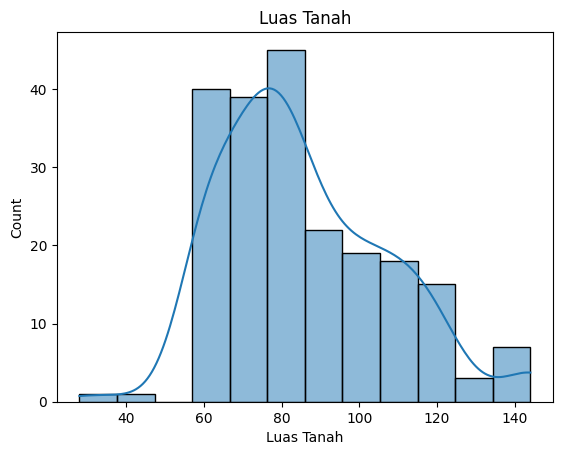

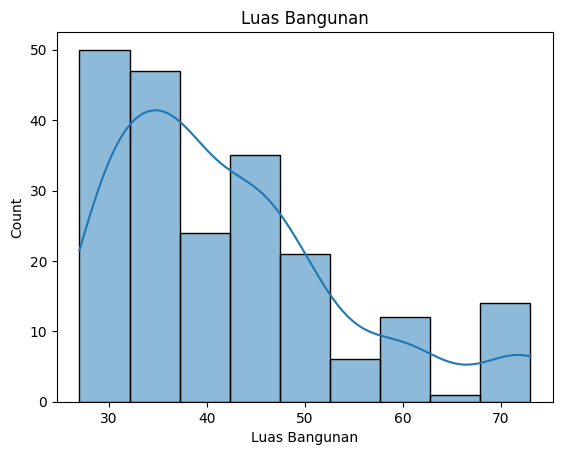

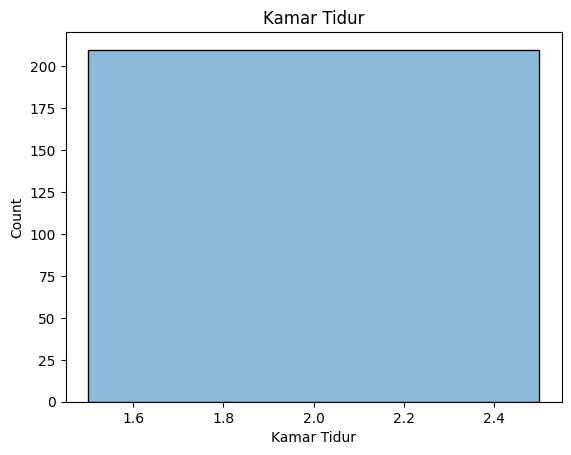

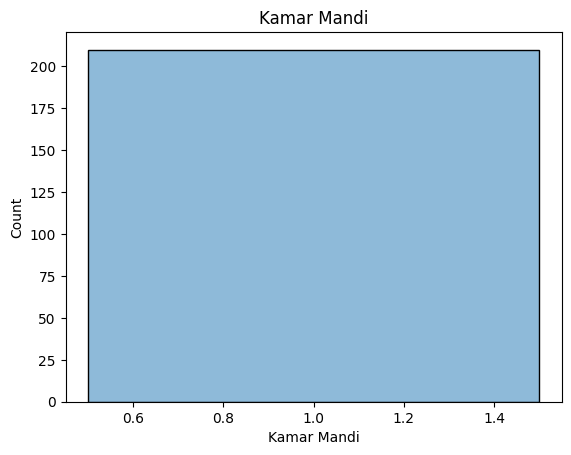

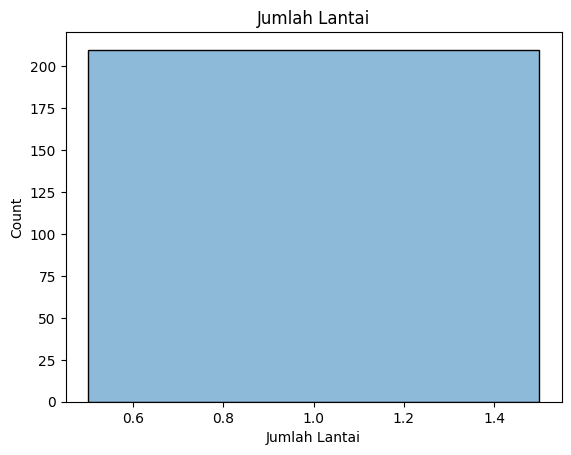

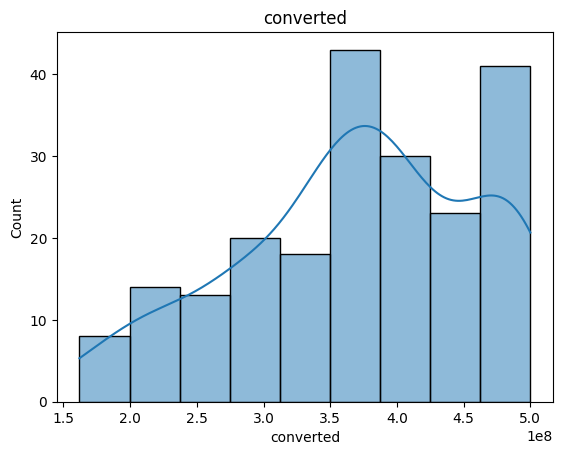

In [ ]:
get_histplot(ygy_low_cleaned)

<Axes: >

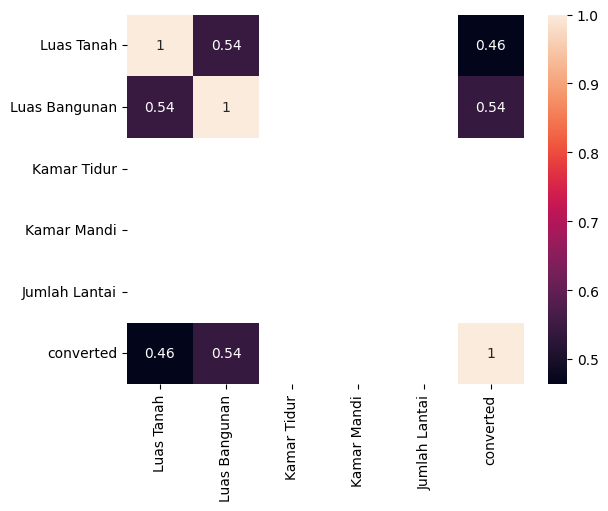

In [ ]:
get_corr(ygy_low_cleaned)

#### ygy_low_mid

In [ ]:
ygy_low_mid2 = convert_pipeline(ygy_low_mid)

In [ ]:
ygy_low_mid.shape

(227, 15)

In [ ]:
ygy_low_mid2.shape

(227, 10)

In [ ]:
ygy_low_mid2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,7
satuan,7
converted,7


In [ ]:
(ygy_low_mid2 == 0).sum()

,0
Luas Tanah,1
Luas Bangunan,1
Kamar Tidur,0
Kamar Mandi,1
Jumlah Lantai,24
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
ygy_low_mid2.dropna(inplace=True)

In [ ]:
ygy_low_mid2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
ygy_low_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,220.000000,220.000000,220.000000,220.000000,220.000000,220.000000,2.200000e+02
mean,118.609091,77.613636,2.690909,1.640909,1.086364,726.077273,7.442409e+08
std,93.481578,43.152070,0.767436,0.684572,0.546300,171.692697,1.446200e+08
min,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,5.000000e+08
25%,92.000000,55.750000,2.000000,1.000000,1.000000,615.000000,6.222500e+08
50%,107.000000,70.000000,3.000000,2.000000,1.000000,732.000000,7.500000e+08
75%,120.000000,86.500000,3.000000,2.000000,1.000000,850.000000,8.715000e+08
max,1237.000000,463.000000,9.000000,5.000000,2.000000,999.000000,1.000000e+09


In [ ]:
ygy_low_mid2 = replace_zero(ygy_low_mid2)

In [ ]:
ygy_low_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,220.000000,220.000000,220.000000,220.000000,220.000000,220.000000,2.200000e+02
mean,119.095455,77.931818,2.690909,1.650000,1.195455,726.077273,7.442409e+08
std,93.139386,42.834074,0.767436,0.675906,0.397455,171.692697,1.446200e+08
min,28.000000,28.000000,1.000000,1.000000,1.000000,1.000000,5.000000e+08
25%,92.750000,56.000000,2.000000,1.000000,1.000000,615.000000,6.222500e+08
50%,107.000000,70.000000,3.000000,2.000000,1.000000,732.000000,7.500000e+08
75%,120.000000,86.500000,3.000000,2.000000,1.000000,850.000000,8.715000e+08
max,1237.000000,463.000000,9.000000,5.000000,2.000000,999.000000,1.000000e+09


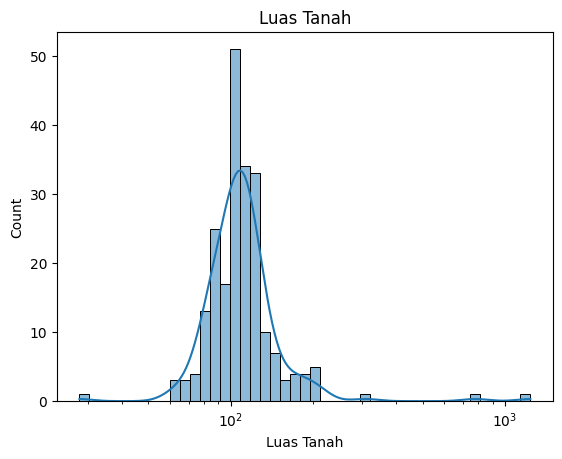

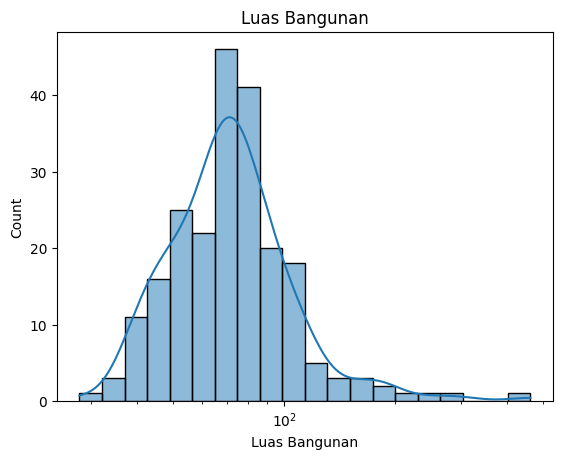

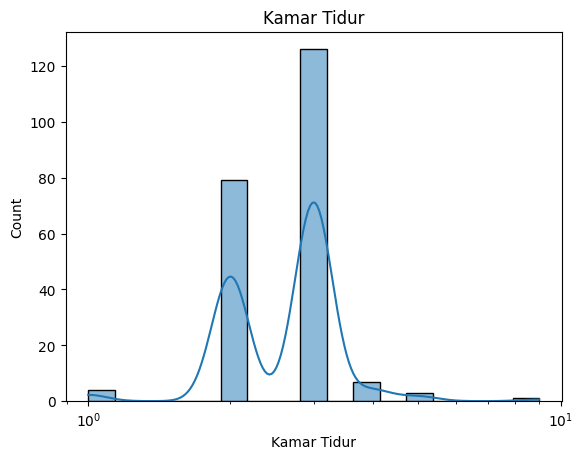

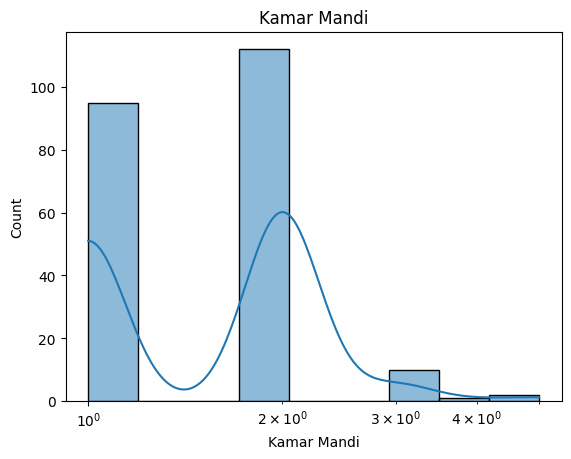

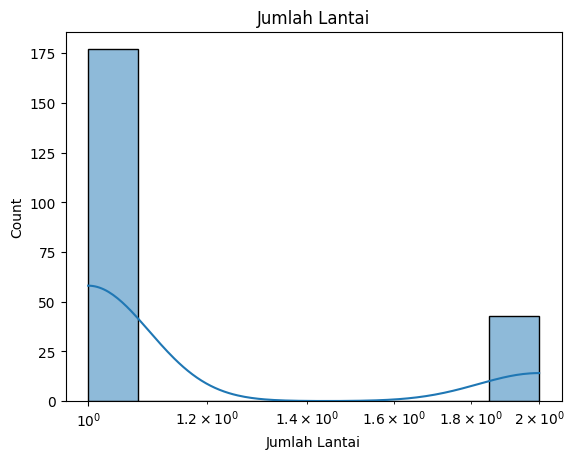

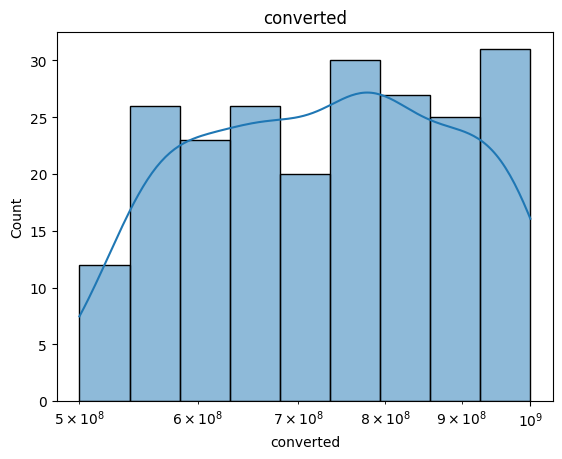

In [ ]:
get_histplot(ygy_low_mid2, log_scale=True)

In [ ]:
get_iqr(ygy_low_mid2)

{'Luas Tanah': [np.float64(51.0), np.float64(161.0)],
 'Luas Bangunan': [np.float64(10.0), np.float64(133.0)],
 'Kamar Tidur': [1, np.float64(5.0)],
 'Kamar Mandi': [1, np.float64(4.0)],
 'Jumlah Lantai': [1, np.float64(1.0)],
 'converted': [np.float64(248375000.0), np.float64(1245375000.0)]}

In [ ]:
get_outlier(ygy_low_mid2)

Luas Tanah -- found outliers: 18 
Luas Bangunan -- found outliers: 12 
Kamar Tidur -- found outliers: 1 
Kamar Mandi -- found outliers: 2 
Jumlah Lantai -- found outliers: 43 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
0           210            170            3            1              1   
134         172            100            3            1              1   
6           109             65            2            2              2   
8           183             50            2            1              1   
9          1237            170            2            1              1   
10          197            190            3            1              1   
11          107             80            3            1              2   
12          180            150            3            2              1   
140         168             98            2            2              1   
135          89        

In [ ]:
ygy_low_mid_cleaned = remove_outlier(ygy_low_mid2)

In [ ]:
ygy_low_mid_cleaned.shape

(160, 10)

In [ ]:
ygy_low_mid_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,160.000000,160.000000,160.000000,160.00000,160.0,160.000000,1.600000e+02
mean,105.056250,69.825000,2.625000,1.62500,1.0,728.668750,7.349125e+08
std,17.569358,18.918744,0.601361,0.59081,0.0,147.355631,1.371396e+08
min,60.000000,36.000000,1.000000,1.00000,1.0,1.000000,5.000000e+08
25%,92.000000,55.750000,2.000000,1.00000,1.0,622.500000,6.250000e+08
50%,106.000000,70.000000,3.000000,2.00000,1.0,729.000000,7.400000e+08
75%,118.000000,80.000000,3.000000,2.00000,1.0,817.500000,8.300000e+08
max,151.000000,120.000000,5.000000,3.00000,1.0,999.000000,1.000000e+09


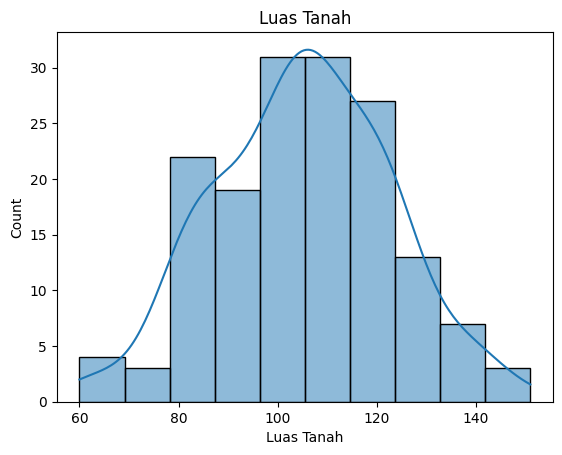

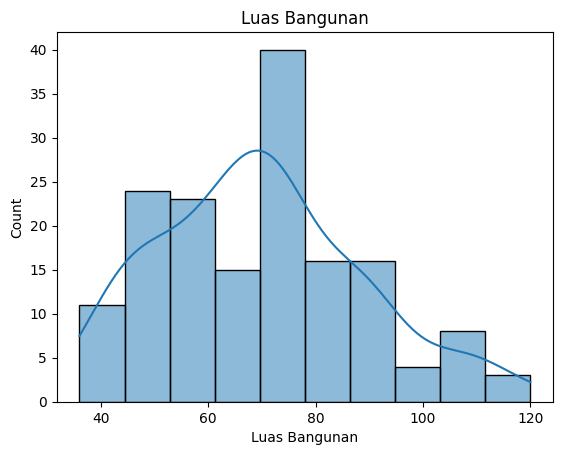

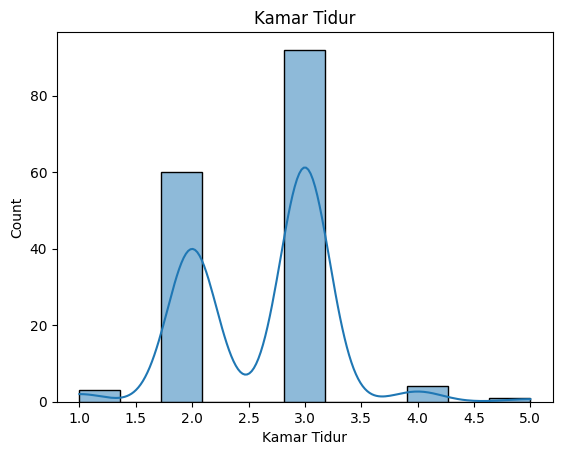

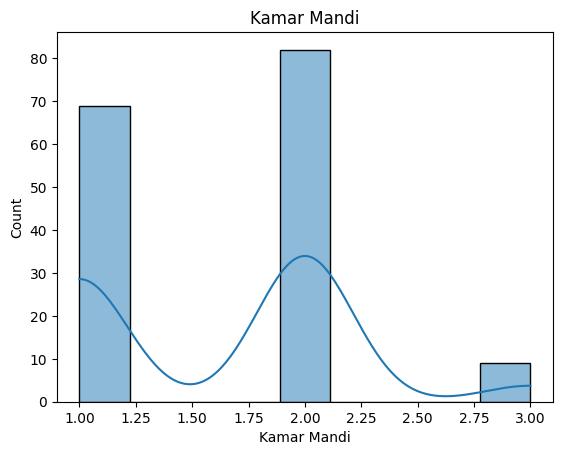

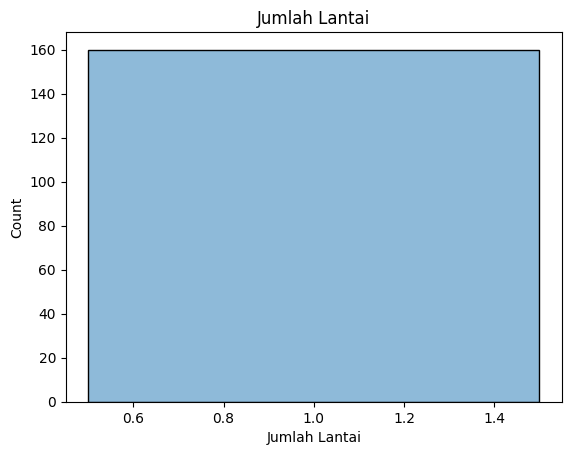

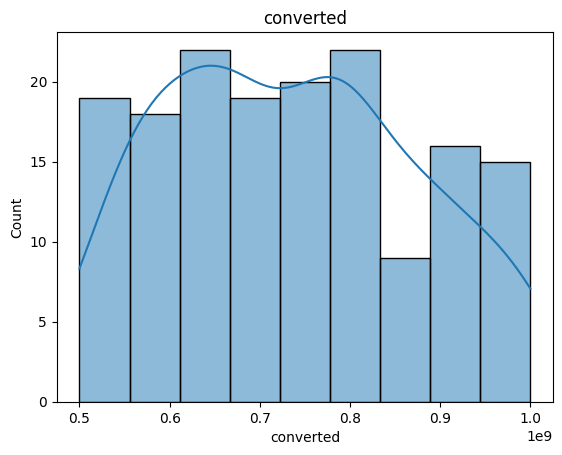

In [ ]:
get_histplot(ygy_low_mid_cleaned)

<Axes: >

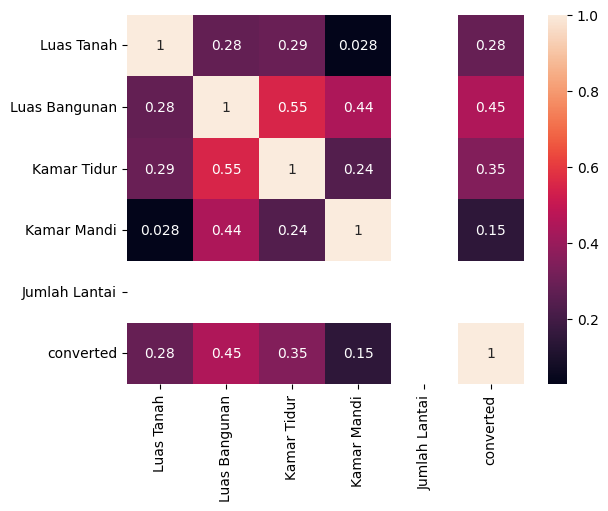

In [ ]:
get_corr(ygy_low_mid_cleaned)

#### ygy_up_mid

In [ ]:
ygy_up_mid2 = convert_pipeline(ygy_up_mid)

In [ ]:
ygy_up_mid.shape

(238, 15)

In [ ]:
ygy_up_mid2.shape

(238, 10)

In [ ]:
ygy_up_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,238.000000,238.000000,238.000000,238.000000,238.000000,222.000000,2.220000e+02
mean,165.836134,148.936975,3.953782,2.941176,1.596639,1.800901,1.800901e+09
std,96.431795,68.196293,2.344301,1.605865,0.571021,0.492516,4.925160e+08
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000e+09
25%,113.250000,108.000000,3.000000,2.000000,1.000000,1.400000,1.400000e+09
50%,136.000000,135.000000,3.000000,3.000000,2.000000,1.700000,1.700000e+09
75%,172.750000,180.000000,4.000000,3.000000,2.000000,2.200000,2.200000e+09
max,683.000000,600.000000,28.000000,14.000000,2.000000,3.000000,3.000000e+09


In [ ]:
ygy_up_mid2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,16
satuan,16
converted,16


In [ ]:
(ygy_up_mid2 == 0).sum()

,0
Luas Tanah,1
Luas Bangunan,1
Kamar Tidur,1
Kamar Mandi,1
Jumlah Lantai,10
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
ygy_up_mid2.dropna(inplace=True)

In [ ]:
ygy_up_mid2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
ygy_up_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,2.220000e+02
mean,165.873874,149.954955,3.941441,2.927928,1.585586,1.800901,1.800901e+09
std,98.390727,69.929426,2.355545,1.532228,0.578162,0.492516,4.925160e+08
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000e+09
25%,113.000000,108.000000,3.000000,2.000000,1.000000,1.400000,1.400000e+09
50%,135.000000,135.000000,3.000000,3.000000,2.000000,1.700000,1.700000e+09
75%,172.750000,180.000000,4.000000,3.000000,2.000000,2.200000,2.200000e+09
max,683.000000,600.000000,28.000000,14.000000,2.000000,3.000000,3.000000e+09


In [ ]:
ygy_up_mid2 = replace_zero(ygy_up_mid2)

In [ ]:
ygy_up_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,2.220000e+02
mean,166.481982,150.563063,3.954955,2.941441,1.675676,1.800901,1.800901e+09
std,97.776165,69.202719,2.341394,1.519465,0.469180,0.492516,4.925160e+08
min,72.000000,64.000000,2.000000,1.000000,1.000000,1.000000,1.000000e+09
25%,113.250000,108.000000,3.000000,2.000000,1.000000,1.400000,1.400000e+09
50%,135.000000,135.000000,3.000000,3.000000,2.000000,1.700000,1.700000e+09
75%,172.750000,180.000000,4.000000,3.000000,2.000000,2.200000,2.200000e+09
max,683.000000,600.000000,28.000000,14.000000,2.000000,3.000000,3.000000e+09


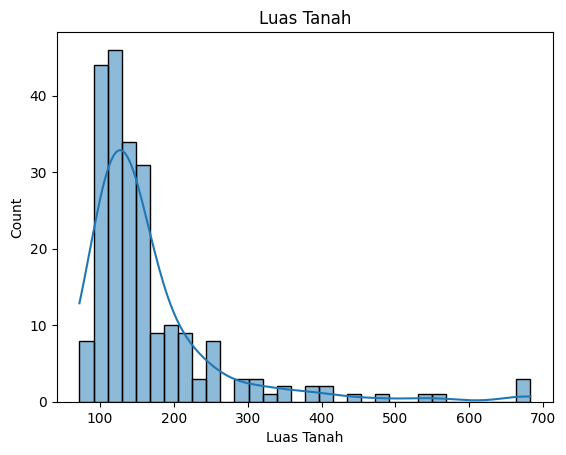

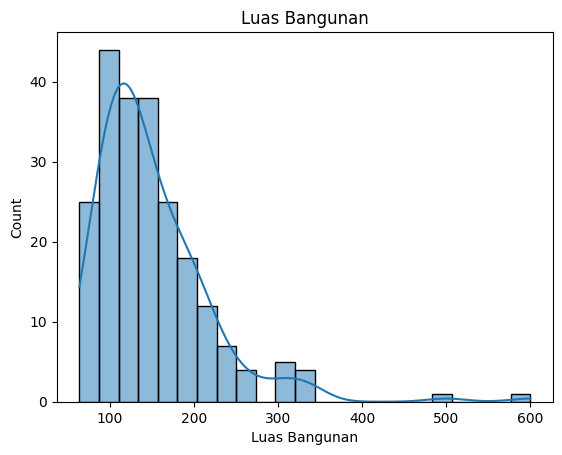

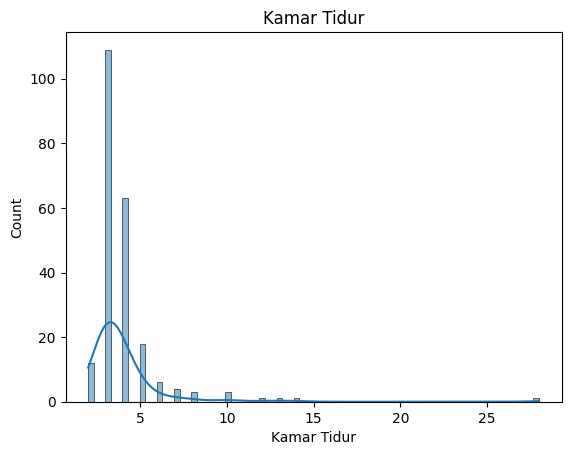

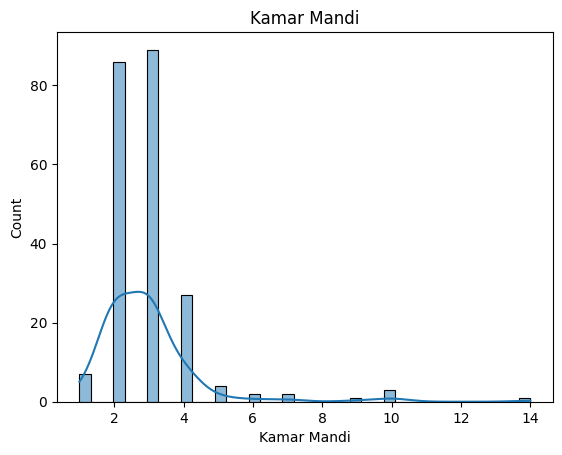

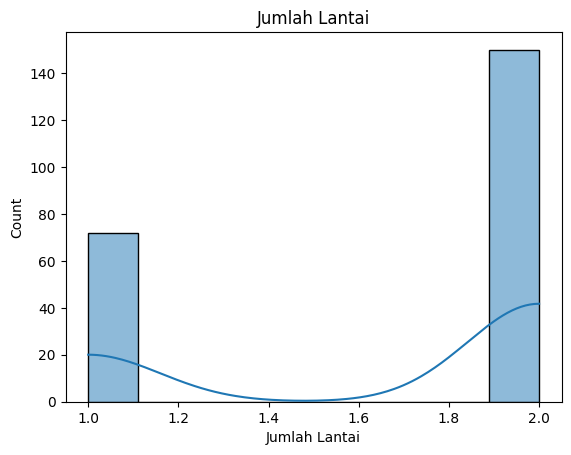

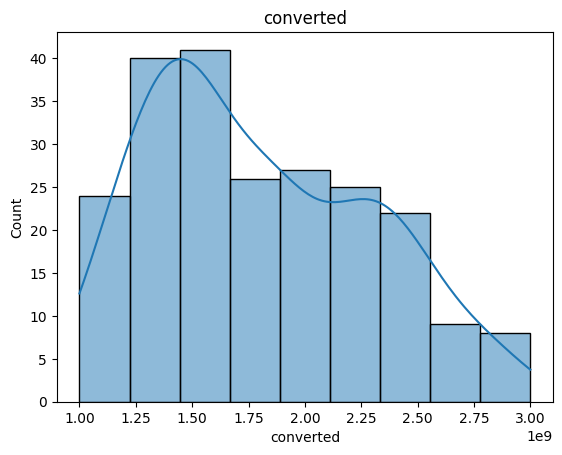

In [ ]:
get_histplot(ygy_up_mid2)

In [ ]:
get_iqr(ygy_up_mid2)

{'Luas Tanah': [np.float64(24.0), np.float64(262.0)],
 'Luas Bangunan': [1, np.float64(288.0)],
 'Kamar Tidur': [1, np.float64(6.0)],
 'Kamar Mandi': [1, np.float64(5.0)],
 'Jumlah Lantai': [1, np.float64(4.0)],
 'converted': [np.float64(200000000.0), np.float64(3400000000.0)]}

In [ ]:
get_outlier(ygy_up_mid2)

Luas Tanah -- found outliers: 20 
Luas Bangunan -- found outliers: 11 
Kamar Tidur -- found outliers: 14 
Kamar Mandi -- found outliers: 9 
Jumlah Lantai -- found outliers: 0 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
133         142            210            7            9              1   
140         560            150            3            4              1   
27          314            125            6            4              2   
29          246            270           10            6              2   
158         123            200            6            6              2   
160         110            114            7            3              2   
161         300            335            4            3              1   
35           90            120            7            3              1   
36          340            600            4            3              2   
166         538        

In [ ]:
ygy_up_mid_cleaned = remove_outlier(ygy_up_mid2)

In [ ]:
ygy_up_mid_cleaned.shape

(186, 10)

In [ ]:
ygy_up_mid_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,186.000000,186.000000,186.000000,186.000000,186.000000,186.000000,1.860000e+02
mean,139.252688,134.580645,3.435484,2.650538,1.672043,1.777796,1.777796e+09
std,38.453280,43.412870,0.777125,0.779067,0.470736,0.478214,4.782140e+08
min,72.000000,64.000000,2.000000,1.000000,1.000000,1.000000,1.000000e+09
25%,110.000000,100.500000,3.000000,2.000000,1.000000,1.400000,1.400000e+09
50%,128.500000,125.000000,3.000000,3.000000,2.000000,1.700000,1.700000e+09
75%,153.250000,160.000000,4.000000,3.000000,2.000000,2.200000,2.200000e+09
max,259.000000,262.000000,6.000000,5.000000,2.000000,2.900000,2.900000e+09


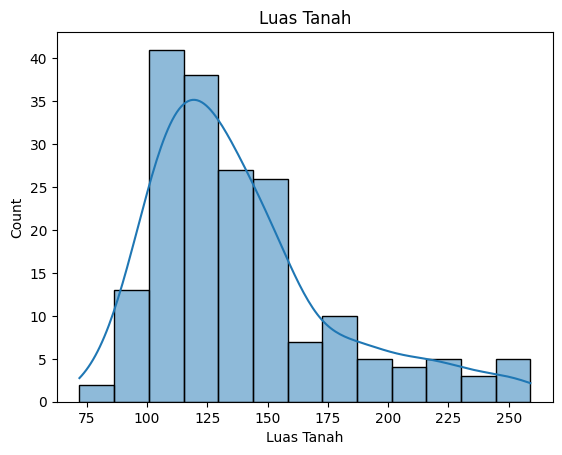

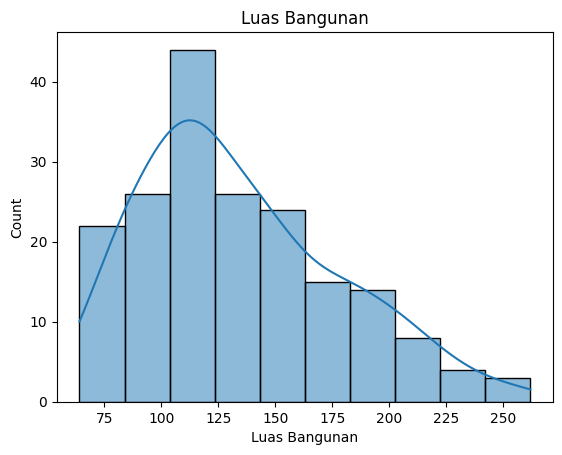

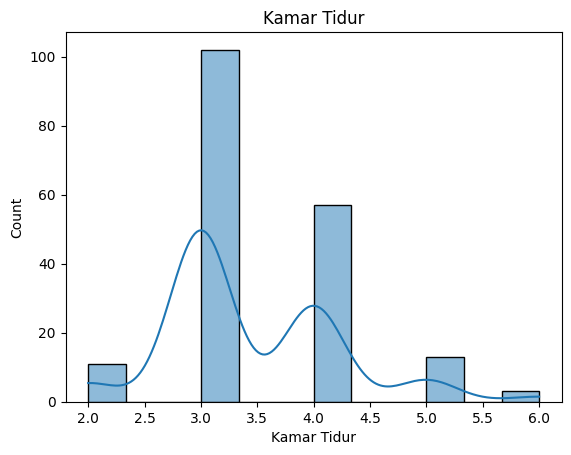

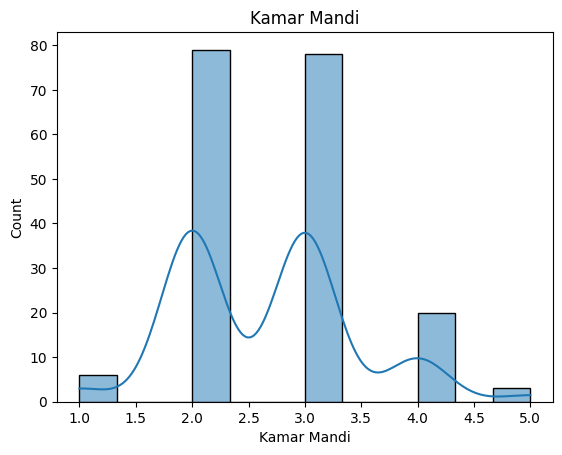

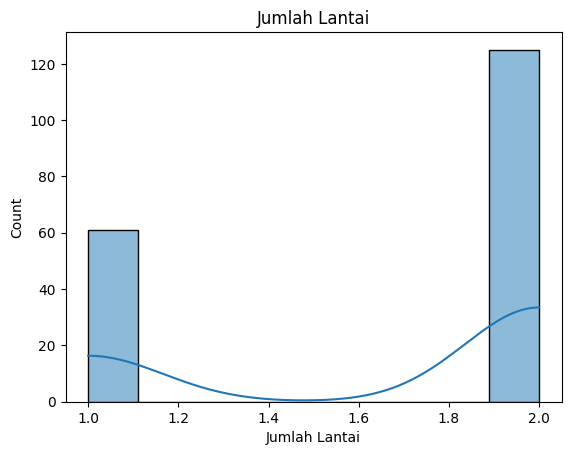

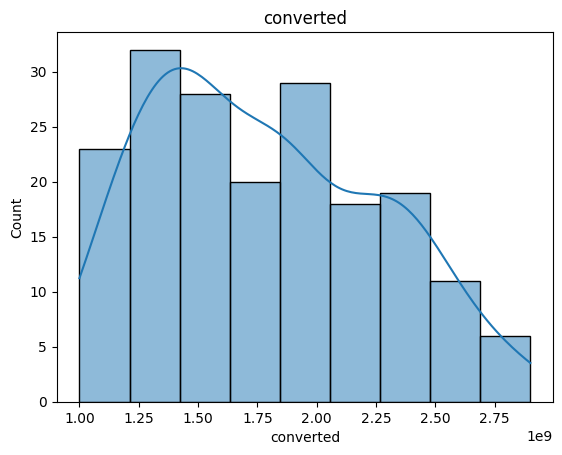

In [ ]:
get_histplot(ygy_up_mid_cleaned)

<Axes: >

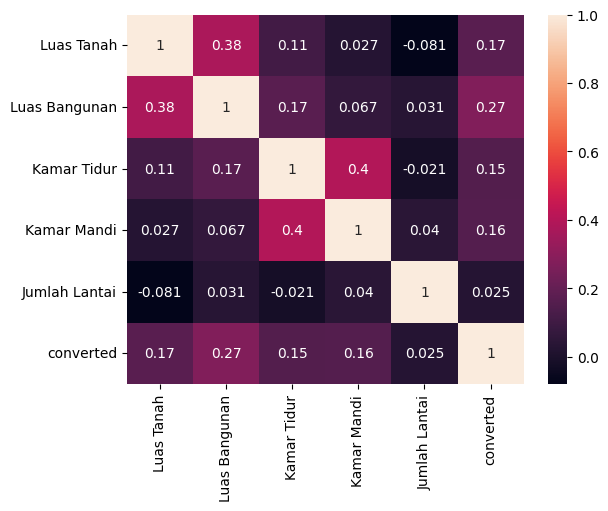

In [ ]:
get_corr(ygy_up_mid_cleaned)

#### ygy_high

In [ ]:
ygy_high2 = convert_pipeline(ygy_high)

In [ ]:
ygy_high.shape

(244, 15)

In [ ]:
ygy_high2.shape

(244, 10)

In [ ]:
ygy_high2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,3
satuan,3
converted,3


In [ ]:
(ygy_high2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,3
Kamar Mandi,2
Jumlah Lantai,40
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
ygy_high2.dropna(inplace=True)

In [ ]:
ygy_high2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
ygy_high2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,241.000000,241.000000,241.000000,241.000000,241.000000,241.000000,2.410000e+02
mean,455.099585,373.825726,6.929461,5.377593,1.402490,4.543983,4.543983e+09
std,333.843986,253.478506,5.477150,4.843655,0.763649,1.095279,1.095279e+09
min,127.000000,90.000000,0.000000,0.000000,0.000000,3.000000,3.000000e+09
25%,280.000000,240.000000,4.000000,3.000000,1.000000,3.600000,3.600000e+09
50%,365.000000,308.000000,5.000000,4.000000,2.000000,4.250000,4.250000e+09
75%,525.000000,419.000000,7.000000,5.000000,2.000000,5.250000,5.250000e+09
max,2623.000000,3169.000000,40.000000,30.000000,3.000000,7.000000,7.000000e+09


In [ ]:
ygy_high2 = replace_zero(ygy_high2)

In [ ]:
ygy_high2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,241.000000,241.000000,241.000000,241.000000,241.000000,241.000000,2.410000e+02
mean,455.099585,373.825726,6.991701,5.410788,1.717842,4.543983,4.543983e+09
std,333.843986,253.478506,5.426011,4.820240,0.477900,1.095279,1.095279e+09
min,127.000000,90.000000,2.000000,1.000000,1.000000,3.000000,3.000000e+09
25%,280.000000,240.000000,4.000000,3.000000,1.000000,3.600000,3.600000e+09
50%,365.000000,308.000000,5.000000,4.000000,2.000000,4.250000,4.250000e+09
75%,525.000000,419.000000,7.000000,5.000000,2.000000,5.250000,5.250000e+09
max,2623.000000,3169.000000,40.000000,30.000000,3.000000,7.000000,7.000000e+09


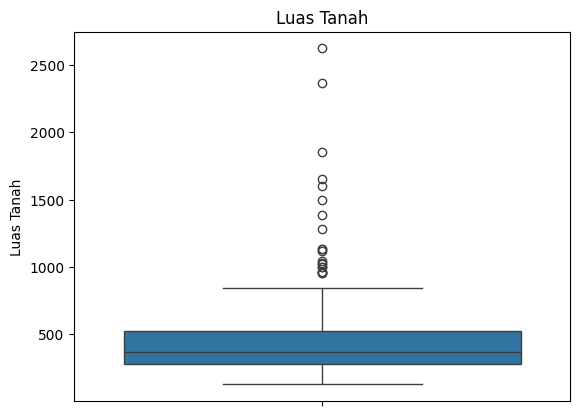

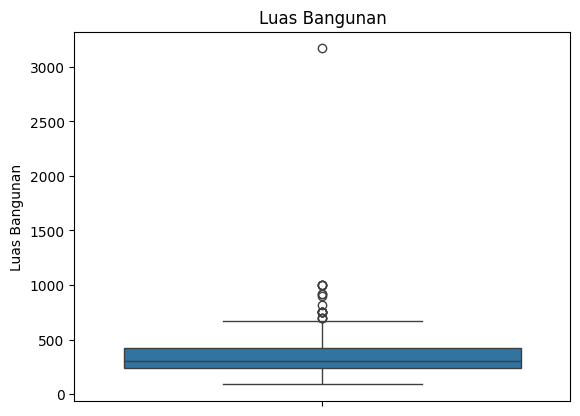

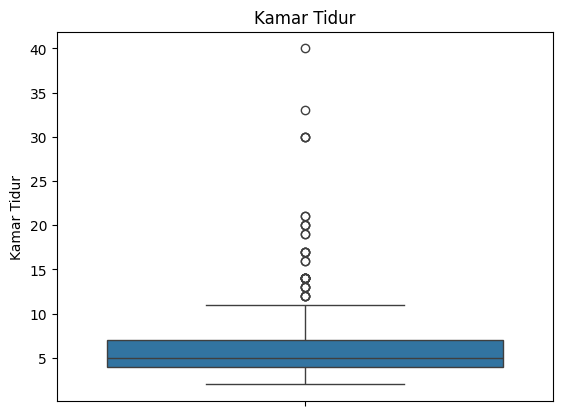

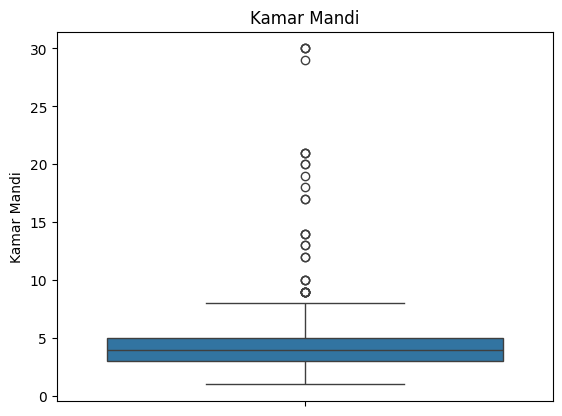

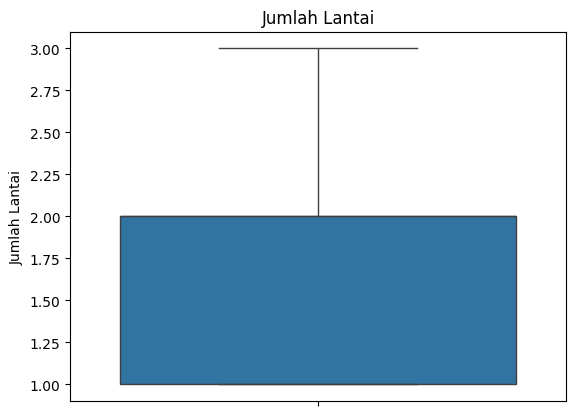

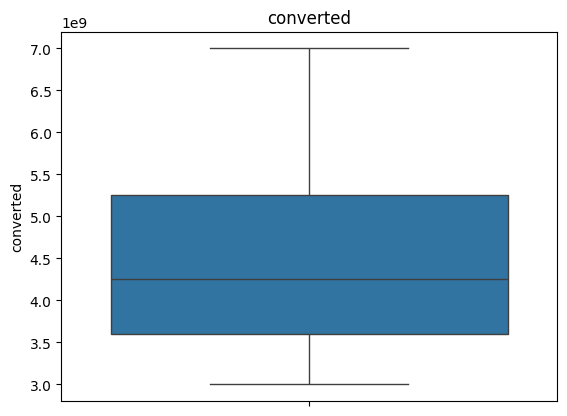

In [ ]:
get_boxplot(ygy_high2)

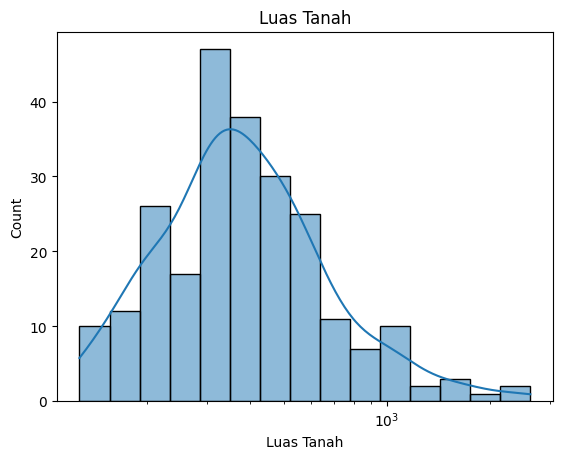

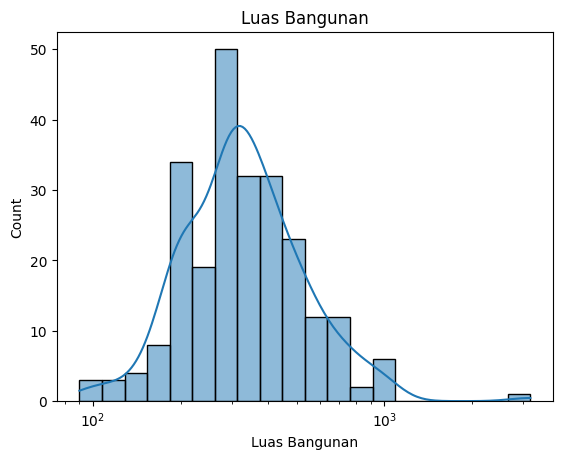

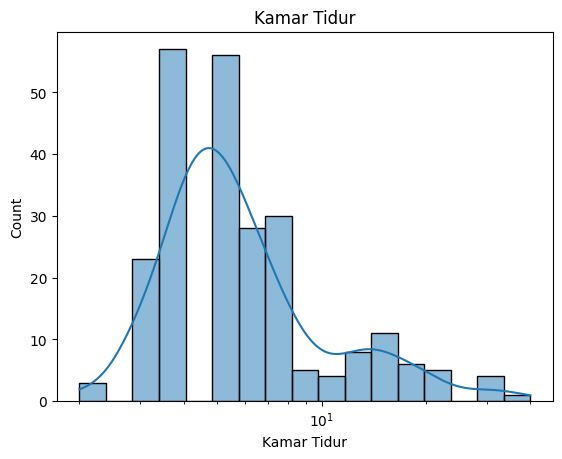

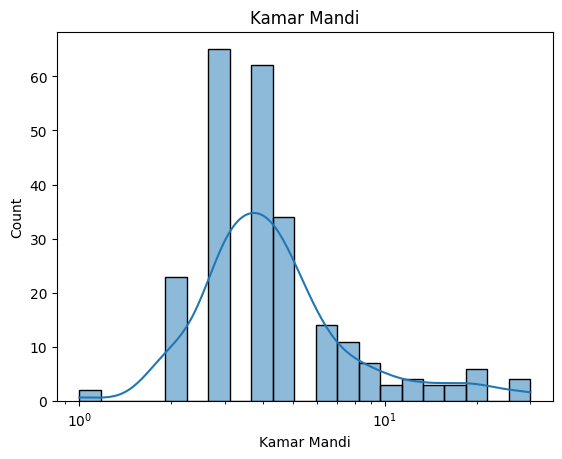

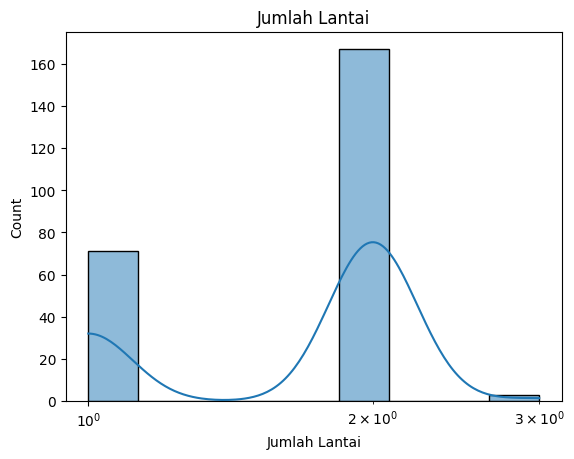

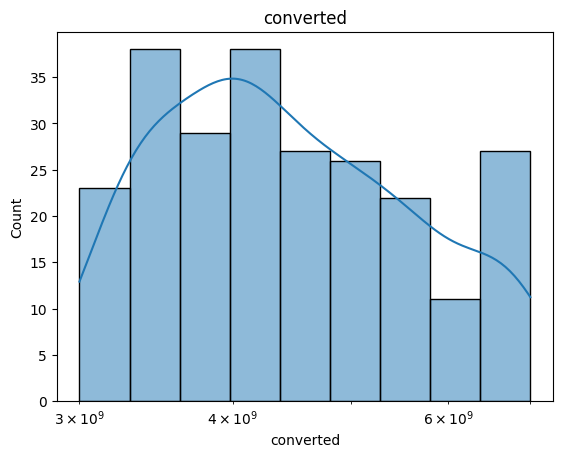

In [ ]:
get_histplot(ygy_high2, log_scale=True)

In [ ]:
get_iqr(ygy_high2)

{'Luas Tanah': [1, np.float64(893.0)],
 'Luas Bangunan': [1, np.float64(688.0)],
 'Kamar Tidur': [1, np.float64(12.0)],
 'Kamar Mandi': [1, np.float64(8.0)],
 'Jumlah Lantai': [1, np.float64(4.0)],
 'converted': [np.float64(1125000000.0), np.float64(7725000000.0)]}

In [ ]:
get_outlier(ygy_high2)

Luas Tanah -- found outliers: 20 
Luas Bangunan -- found outliers: 18 
Kamar Tidur -- found outliers: 31 
Kamar Mandi -- found outliers: 30 
Jumlah Lantai -- found outliers: 0 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
4           291            250           19            3              2   
5           290            500           10           19              2   
6           137            200           14           10              2   
7           347            290            4            9              2   
13          700            700            7            4              2   
..          ...            ...          ...          ...            ...   
220         295            400           16            6              2   
228         713            920            6            5              2   
229        1130            400            4            4              2   
231        1030       

In [ ]:
ygy_high_cleaned = remove_outlier(ygy_high2)

In [ ]:
ygy_high_cleaned.shape

(160, 10)

In [ ]:
ygy_high_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,160.000000,160.000000,160.000000,160.000000,160.000000,160.000000,1.600000e+02
mean,376.368750,316.400000,5.331250,4.012500,1.743750,4.525250,4.525250e+09
std,160.657048,125.230263,1.983333,1.368962,0.452065,1.042064,1.042064e+09
min,129.000000,90.000000,2.000000,1.000000,1.000000,3.000000,3.000000e+09
25%,256.500000,217.250000,4.000000,3.000000,1.000000,3.787500,3.787500e+09
50%,355.000000,300.000000,5.000000,4.000000,2.000000,4.300000,4.300000e+09
75%,463.000000,392.500000,6.000000,5.000000,2.000000,5.000000,5.000000e+09
max,844.000000,672.000000,12.000000,8.000000,3.000000,7.000000,7.000000e+09


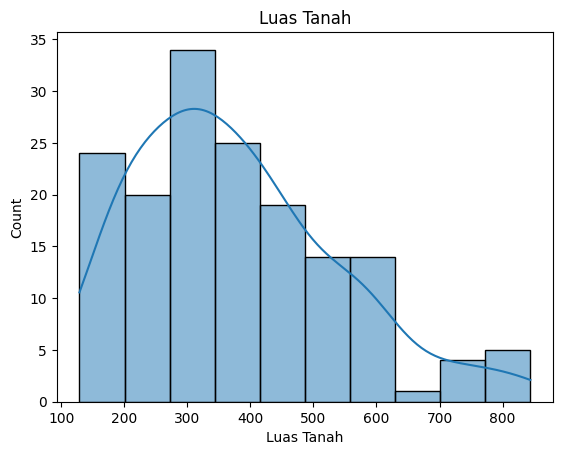

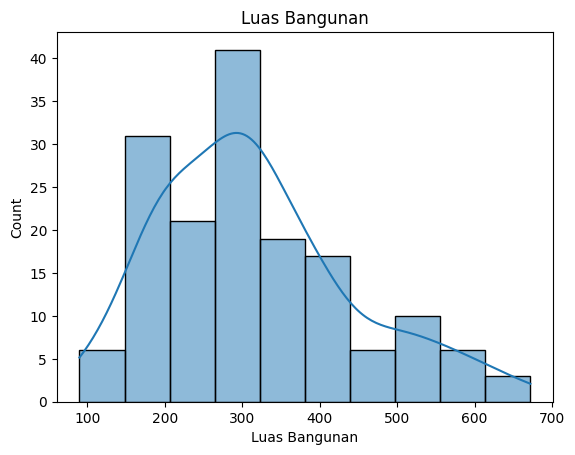

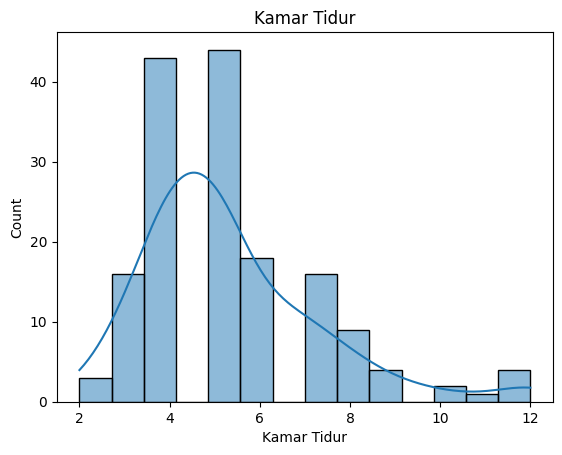

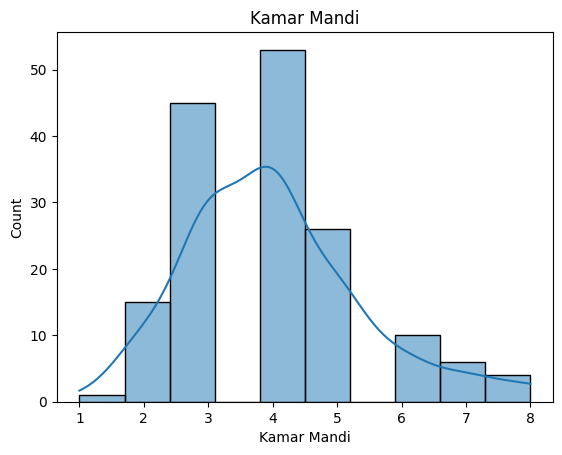

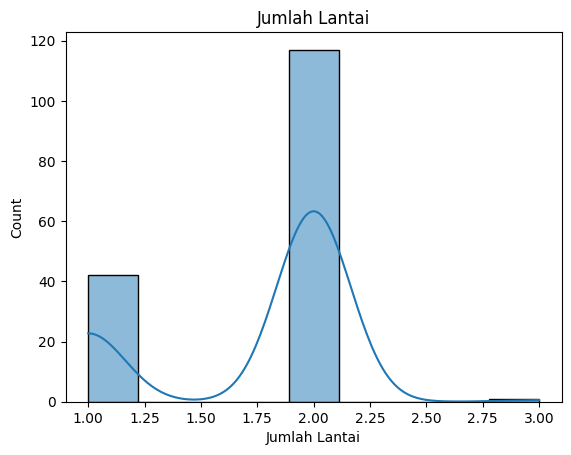

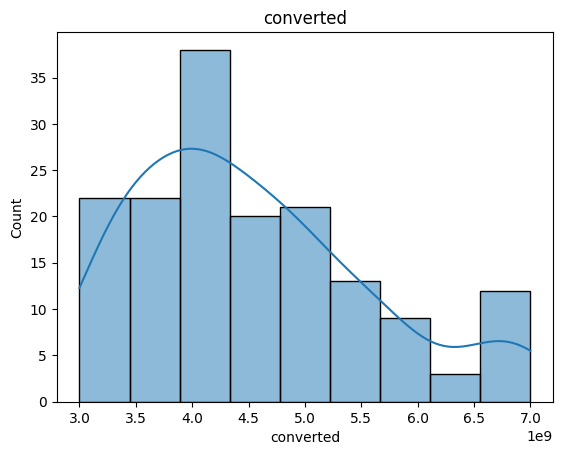

In [ ]:
get_histplot(ygy_high_cleaned)

<Axes: >

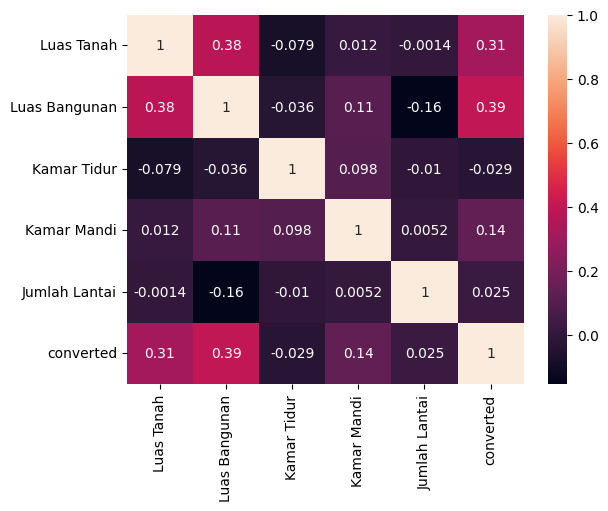

In [ ]:
get_corr(ygy_high_cleaned)

#### ygy_luxury

In [ ]:
ygy_luxury2 = convert_pipeline(ygy_luxury)

In [ ]:
ygy_luxury.shape

(218, 15)

In [ ]:
ygy_luxury2.shape

(218, 10)

In [ ]:
ygy_luxury2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,3
satuan,3
converted,3


In [ ]:
(ygy_luxury2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,5
Kamar Mandi,5
Jumlah Lantai,26
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
ygy_luxury2.dropna(inplace=True)

In [ ]:
ygy_luxury2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
ygy_luxury2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,2.150000e+02
mean,1022.409302,570.334884,9.106977,8.125581,1.595349,10.968419,1.096842e+10
std,895.895532,264.314241,8.204894,8.447089,2.237943,3.395012,3.395012e+09
min,200.000000,1.000000,0.000000,0.000000,0.000000,7.000000,7.000000e+09
25%,580.000000,400.000000,5.000000,4.000000,1.000000,8.000000,8.000000e+09
50%,819.000000,518.000000,6.000000,5.000000,2.000000,10.000000,1.000000e+10
75%,1200.000000,700.000000,9.000000,8.500000,2.000000,13.000000,1.300000e+10
max,7692.000000,2000.000000,41.000000,41.000000,32.000000,20.000000,2.000000e+10


In [ ]:
ygy_luxury2 = replace_zero(ygy_luxury2)

In [ ]:
ygy_luxury2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,2.150000e+02
mean,1022.409302,570.334884,9.246512,8.241860,1.837209,10.968419,1.096842e+10
std,895.895532,264.314241,8.098672,8.368115,2.158771,3.395012,3.395012e+09
min,200.000000,1.000000,2.000000,1.000000,1.000000,7.000000,7.000000e+09
25%,580.000000,400.000000,5.000000,4.000000,1.000000,8.000000,8.000000e+09
50%,819.000000,518.000000,6.000000,5.000000,2.000000,10.000000,1.000000e+10
75%,1200.000000,700.000000,9.000000,8.500000,2.000000,13.000000,1.300000e+10
max,7692.000000,2000.000000,41.000000,41.000000,32.000000,20.000000,2.000000e+10


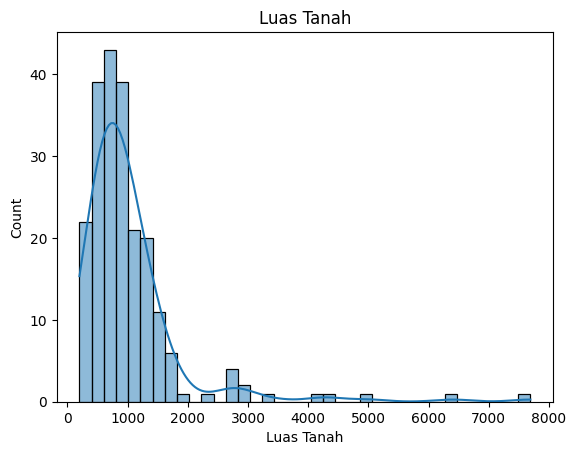

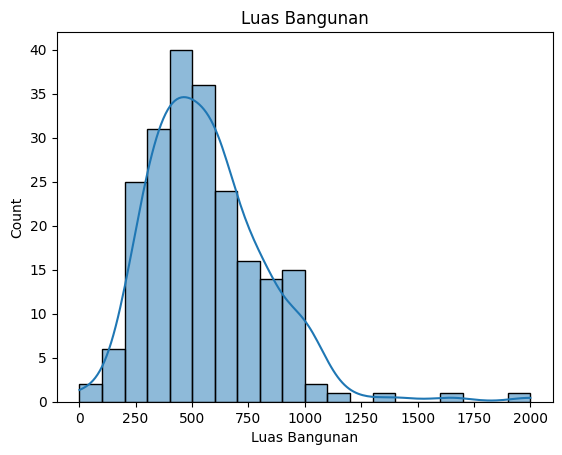

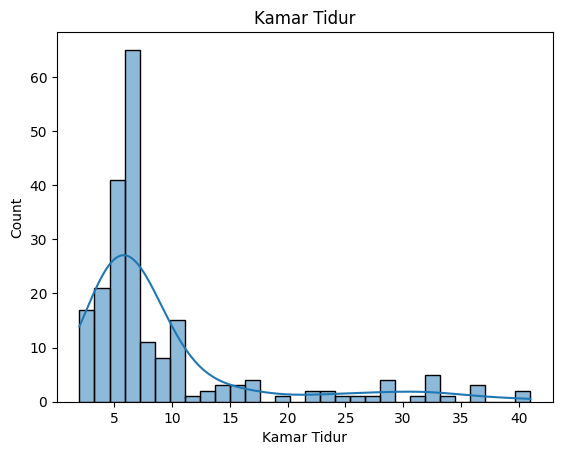

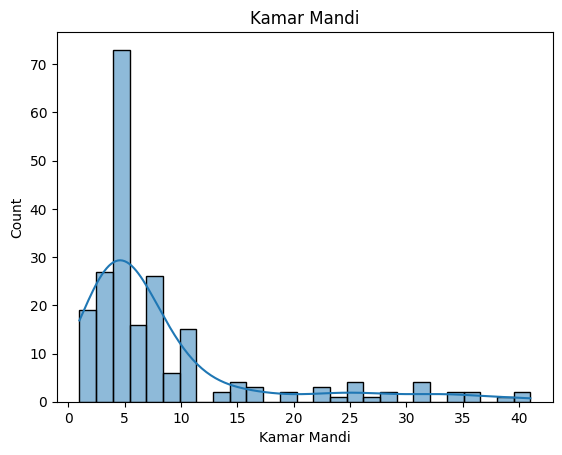

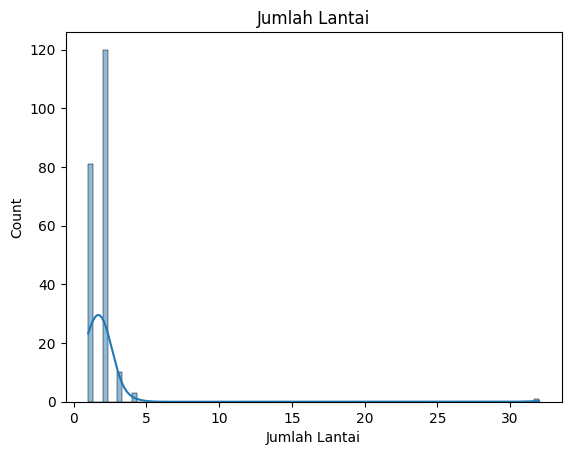

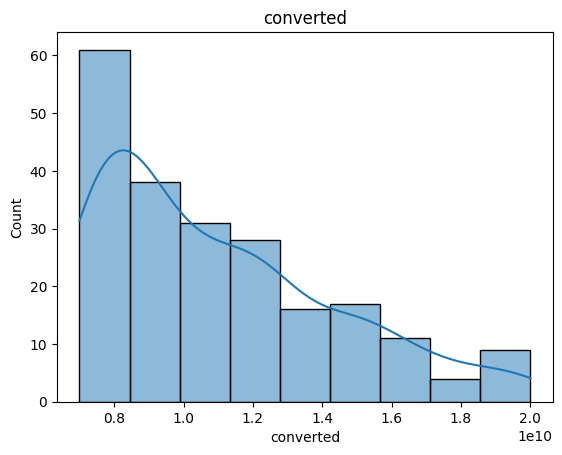

In [ ]:
get_histplot(ygy_luxury2)

In [ ]:
get_iqr(ygy_luxury2)

{'Luas Tanah': [1, np.float64(2130.0)],
 'Luas Bangunan': [1, np.float64(1150.0)],
 'Kamar Tidur': [1, np.float64(15.0)],
 'Kamar Mandi': [1, np.float64(16.0)],
 'Jumlah Lantai': [1, np.float64(4.0)],
 'converted': [np.float64(500000000.0), np.float64(20500000000.0)]}

In [ ]:
get_outlier(ygy_high2)

Luas Tanah -- found outliers: 20 
Luas Bangunan -- found outliers: 18 
Kamar Tidur -- found outliers: 31 
Kamar Mandi -- found outliers: 30 
Jumlah Lantai -- found outliers: 0 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
4           291            250           19            3              2   
5           290            500           10           19              2   
6           137            200           14           10              2   
7           347            290            4            9              2   
13          700            700            7            4              2   
..          ...            ...          ...          ...            ...   
220         295            400           16            6              2   
228         713            920            6            5              2   
229        1130            400            4            4              2   
231        1030       

In [ ]:
ygy_luxury_cleaned = remove_outlier(ygy_luxury2)

In [ ]:
ygy_luxury_cleaned.shape

(170, 10)

In [ ]:
ygy_luxury_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,1.700000e+02
mean,834.694118,531.400000,6.376471,5.341176,1.717647,10.726529,1.072653e+10
std,375.318942,211.512793,2.544173,2.841172,0.627039,3.200293,3.200293e+09
min,200.000000,1.000000,2.000000,1.000000,1.000000,7.000000,7.000000e+09
25%,535.750000,374.750000,5.000000,3.250000,1.000000,8.025000,8.025000e+09
50%,779.000000,500.000000,6.000000,5.000000,2.000000,9.900000,9.900000e+09
75%,1059.000000,673.250000,7.000000,7.000000,2.000000,12.000000,1.200000e+10
max,1927.000000,1069.000000,15.000000,15.000000,4.000000,20.000000,2.000000e+10


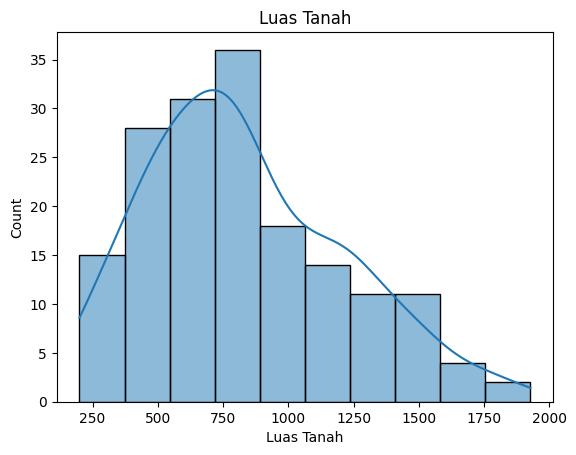

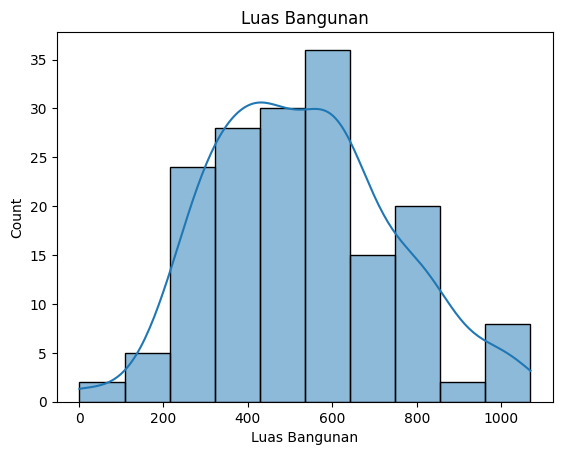

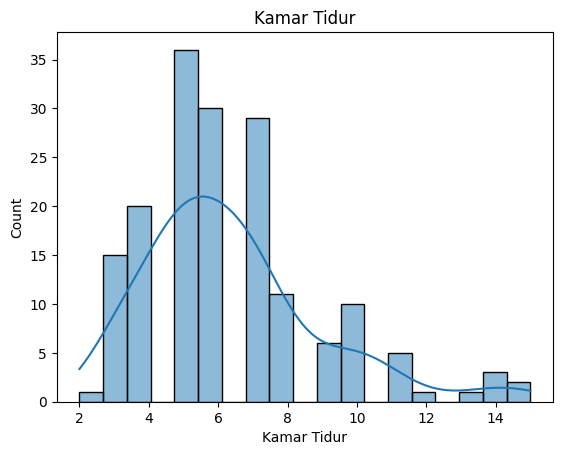

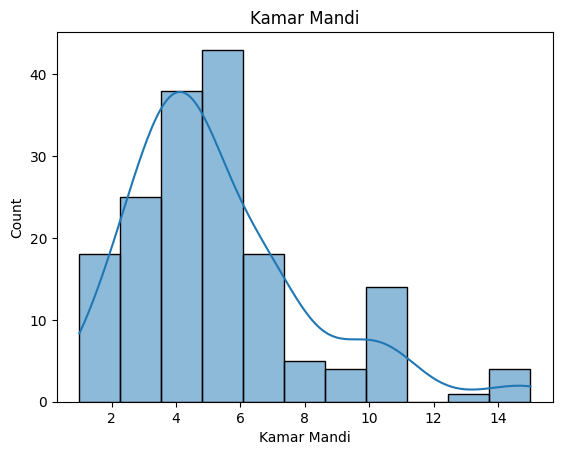

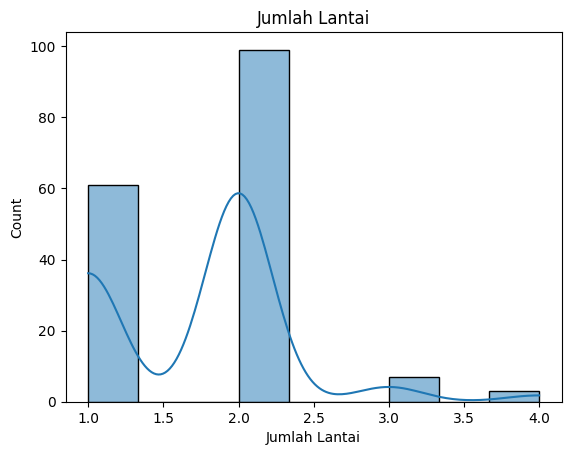

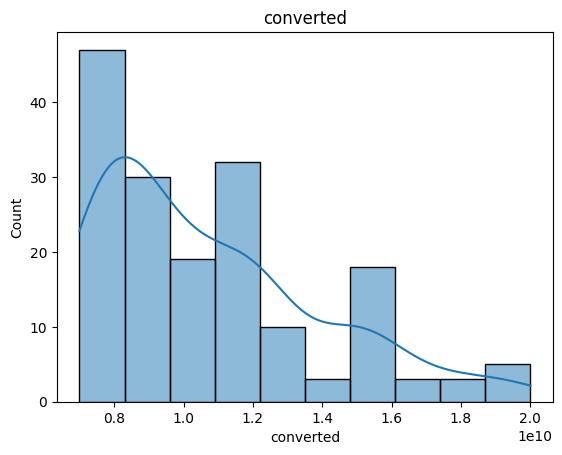

In [ ]:
get_histplot(ygy_luxury_cleaned)

<Axes: >

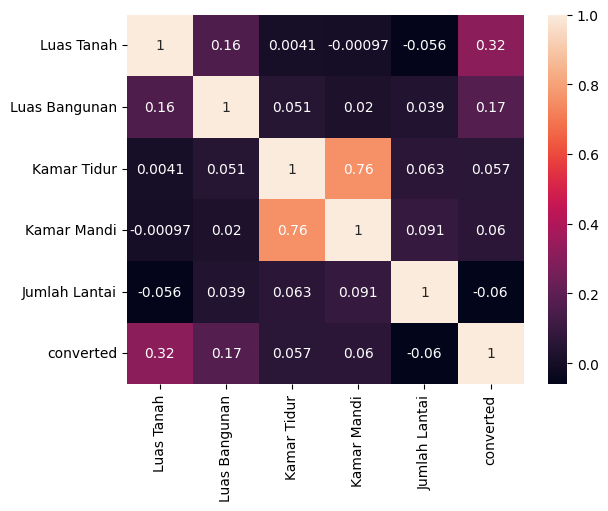

In [ ]:
get_corr(ygy_luxury_cleaned)

#### merged

In [ ]:
ygy_merged = pd.concat([ygy_low_cleaned, ygy_low_mid_cleaned, ygy_up_mid_cleaned, ygy_high_cleaned, ygy_luxury_cleaned])

In [ ]:
ygy_merged.shape

(886, 10)

In [ ]:
ygy_merged['converted'].isna().sum()

np.int64(0)

In [ ]:
ygy_merged.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,73,38,2,1,1,Low,Rp 411 Juta,411.0,Juta,411000000.0
1,72,38,2,1,1,Low,Rp 411 Juta,411.0,Juta,411000000.0
2,125,45,2,1,1,Low,Rp 500 Juta,500.0,Juta,500000000.0
3,87,36,2,1,1,Low,Rp 350 Juta,350.0,Juta,350000000.0
4,144,73,2,1,1,Low,Rp 350 Juta,350.0,Juta,350000000.0


In [ ]:
ygy_merged.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,886.000000,886.000000,886.00000,886.000000,886.000000,886.000000,8.860000e+02
mean,296.665914,209.989842,3.85553,2.836343,1.413093,222.502506,3.468937e+09
std,333.409019,212.511537,2.20823,2.143778,0.530226,291.145332,4.093298e+09
min,28.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.620000e+08
25%,100.000000,55.000000,2.00000,1.000000,1.000000,3.562500,5.500000e+08
50%,128.000000,114.000000,3.00000,2.000000,1.000000,10.650000,1.550000e+09
75%,384.750000,300.000000,5.00000,4.000000,2.000000,425.000000,4.900000e+09
max,1927.000000,1069.000000,15.00000,15.000000,4.000000,999.000000,2.000000e+10


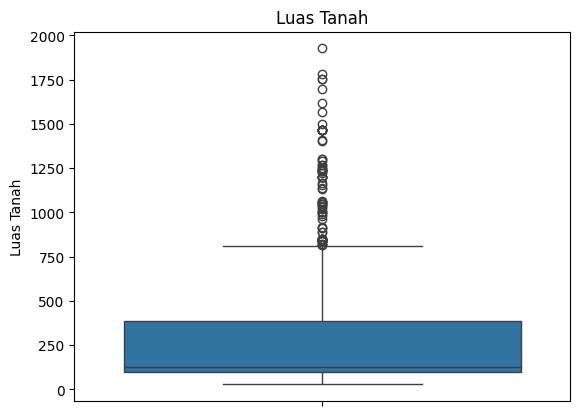

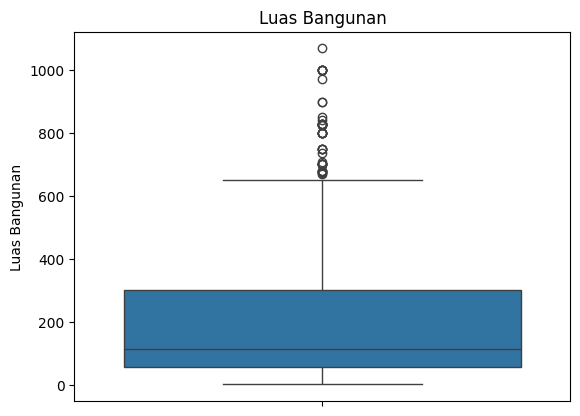

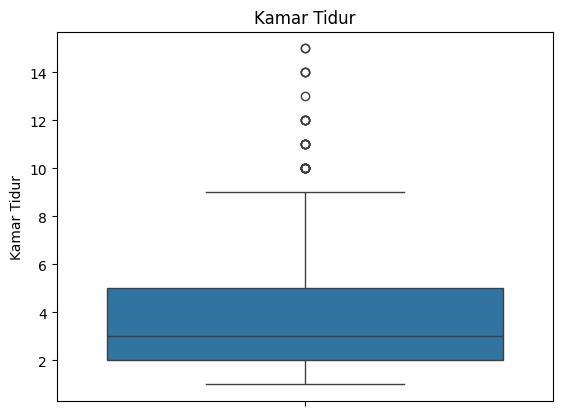

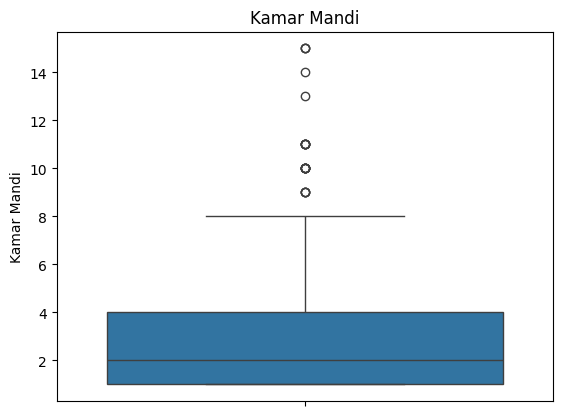

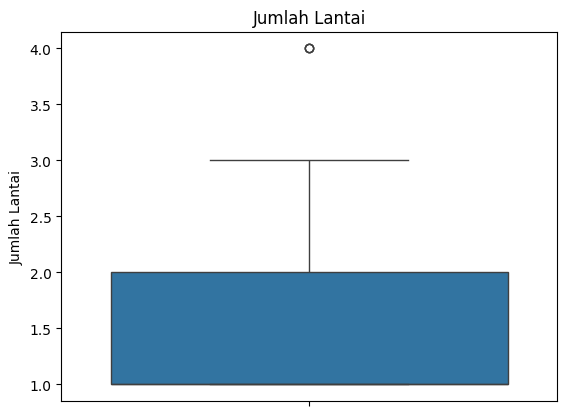

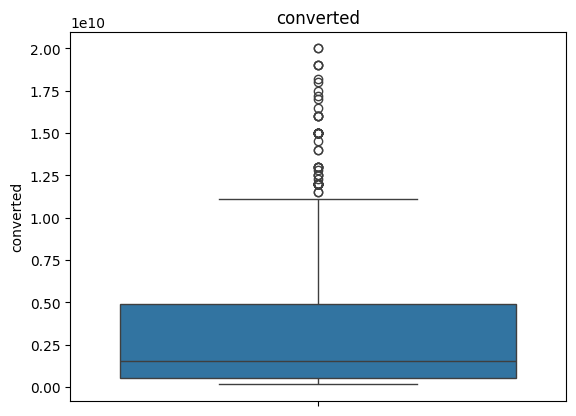

In [ ]:
get_boxplot(ygy_merged)

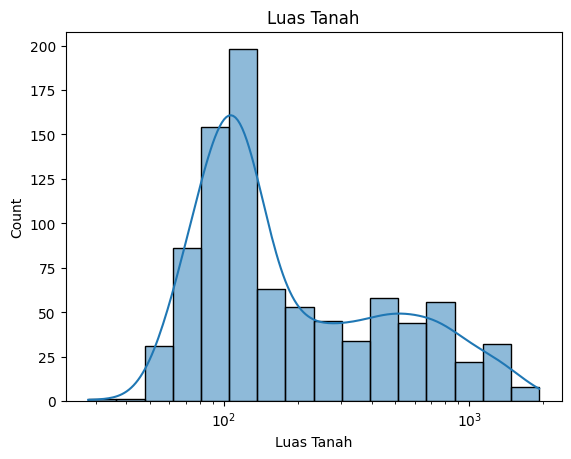

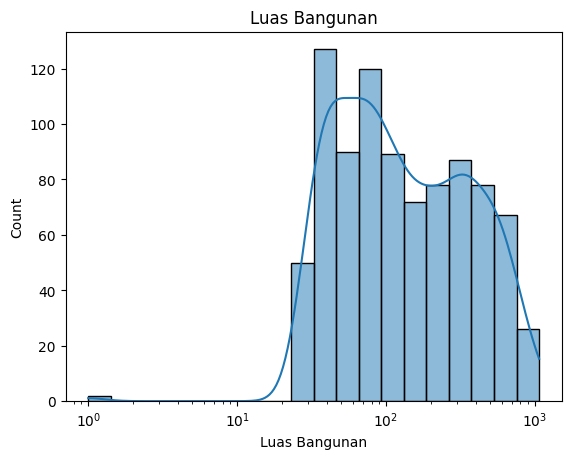

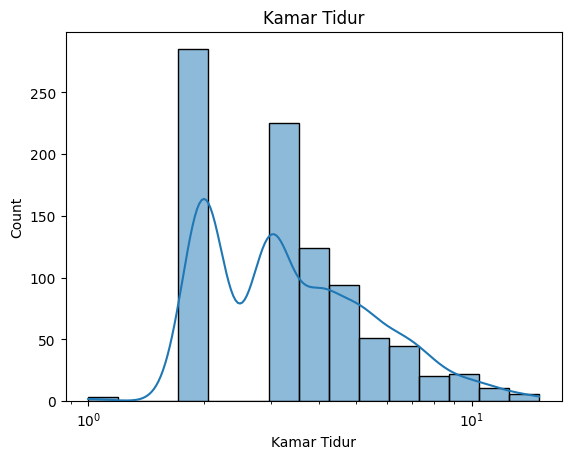

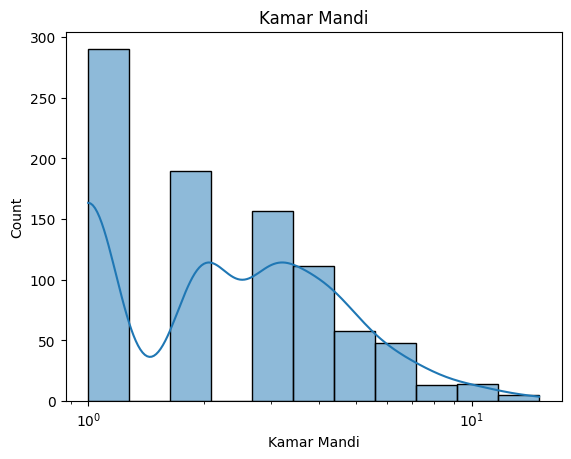

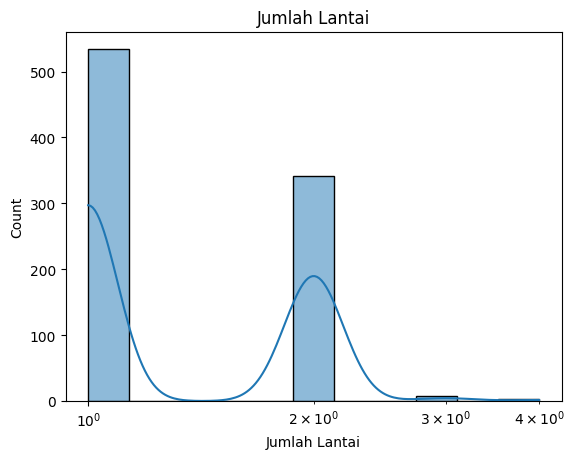

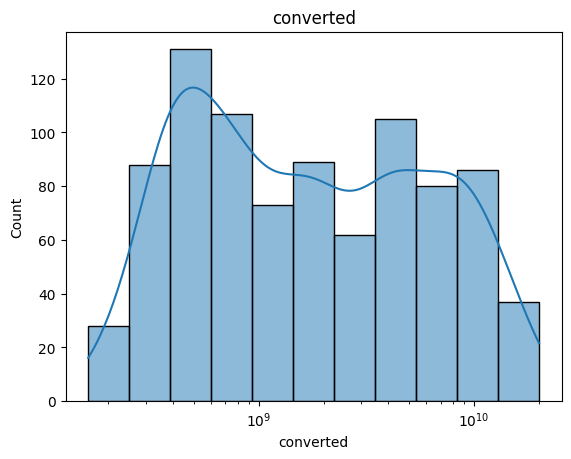

In [ ]:
get_histplot(ygy_merged, log_scale=True)

<Axes: >

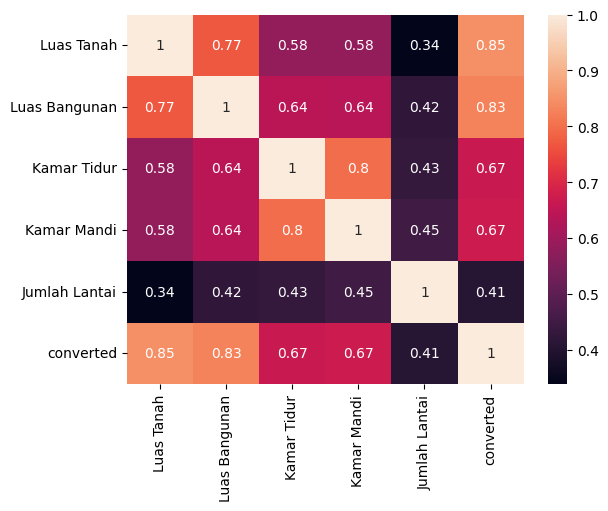

In [ ]:
get_corr(ygy_merged)

In [ ]:
ygy_merged.to_csv('Yogya_merged.csv', index=False)

In [ ]:
X = ygy_merged.drop(columns=['converted', 'Category', 'Harga', 'nominal', 'satuan'])
y = ygy_merged['converted']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
xgb_ygy = XGBRegressor(random_state=42)

In [ ]:
xgb_ygy.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
xgb_ygy.score(X_test, y_test)

0.787121551289375

In [ ]:
get_model_summary(xgb_ygy, X_test, y_test)

MAE: 908436340.1348314
MSE: 3.490311234239285e+18
R-squared: 0.787121551289375

Error for cheapest house: 889184.0
Error for most expensive house: 11193481472.0

MAPE: 27.87%


In [ ]:
ygy_merged.sample(3)

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
196,1466,450,6,3,2,Luxury,Rp 12 Miliar,12.00,Miliar,1.200000e+10
139,103,125,3,1,1,Up-Mid,"Rp 1,7 Miliar",1.70,Miliar,1.700000e+09
210,93,135,3,2,1,Up-Mid,"Rp 1,98 Miliar",1.98,Miliar,1.980000e+09


In [ ]:
xgb_ygy.predict([[103,	125,	3,	1,	1	]])[0]

np.float32(1557915600.0)

In [ ]:
ygy_robust = RobustScaler()
ygy_minmax = MinMaxScaler()

In [ ]:
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = split_scaled(ygy_merged, ygy_robust, ygy_minmax)

In [ ]:
X_train_scaled.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai
87,-0.033306,0.131552,0.214286,0.071429,0.0
217,-0.049958,-0.217883,0.142857,0.000000,0.0
211,-0.116570,-0.032888,0.142857,0.142857,0.0
83,0.046628,-0.320658,0.071429,0.000000,0.0
158,1.835137,1.159301,0.285714,0.071429,0.0


In [ ]:
xgb_ygy_scaled = XGBRegressor(random_state=42)

In [ ]:
xgb_ygy_scaled.fit(X_train_scaled, y_train_scaled)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
xgb_ygy_scaled.score(X_test_scaled, y_test_scaled)

0.9303151911634744

In [ ]:
get_model_summary_scaled(xgb_ygy_scaled, X_test_scaled, y_test_scaled)

MAE: 903193150.2022465
MSE: 3.0974107945038915e+18
R-squared: 0.8110850406447367

Error for cheapest house: 470208.0
Error for most expensive house: 8813845759.999992

MAPE: 27.14%


In [ ]:
ygy_merged.sample(3)

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
132,138,80,3,2,1,Low-Mid,Rp 625 Juta,625.0,Juta,625000000.0
182,80,30,2,1,1,Low,Rp 350 Juta,350.0,Juta,350000000.0
41,121,65,3,2,1,Low-Mid,Rp 895 Juta,895.0,Juta,895000000.0


In [ ]:
test_scaled = [121,	65,	3,	3,	1	, 895000000]
test_scaled = scale_feature(ygy_robust, ygy_minmax, test_scaled)

In [ ]:
test_scaled

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,converted
0,-0.029975,-0.217883,0.142857,0.142857,0.0,20.612334


In [ ]:
test_scaled.drop(columns=['converted'], inplace=True)
xgb_ygy_scaled.predict(test_scaled)[0]

np.float32(20.910154)

In [ ]:
y_pred_log = xgb_ygy_scaled.predict(test_scaled)[0]
np.expm1(y_pred_log)

np.float32(1205492900.0)

In [ ]:
ygy_robust = RobustScaler()
ygy_minmax = MinMaxScaler()

In [ ]:
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = split_scaled(ygy_merged, ygy_robust, ygy_minmax)

In [ ]:
xgb_ygy_scaled = XGBRegressor(objective='reg:squarederror', random_state=42)

In [ ]:
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 1]
}

In [ ]:
ygy_grid_search_scaled = GridSearchCV(estimator=xgb_ygy_scaled,
                           param_grid=param_grid,
                           cv=10,
                           scoring='neg_mean_squared_error',
                           n_jobs=-1,
                           verbose=2)

In [ ]:
ygy_grid_search_scaled.fit(X_train_scaled, y_train_scaled)

Fitting 10 folds for each of 24 candidates, totalling 240 fits


GridSearchCV(cv=10,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None,...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=42, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1], 'max_depth': [3, 5, 7],
                         'n_estimators': [100, 200], 'subsample': [0.8, 1]},
             scoring='neg_mean_squared_error', verbose=2)

In [ ]:
ygy_best_model_scaled = ygy_grid_search_scaled.best_estimator_

In [ ]:
get_model_summary_scaled(ygy_best_model_scaled, X_test_scaled, y_test_scaled)

MAE: 877312054.1123592
MSE: 2.8083953168743224e+18
R-squared: 0.8287124561965629

Error for cheapest house: 2672832.0000000596
Error for most expensive house: 8926072319.999985

MAPE: 26.12%


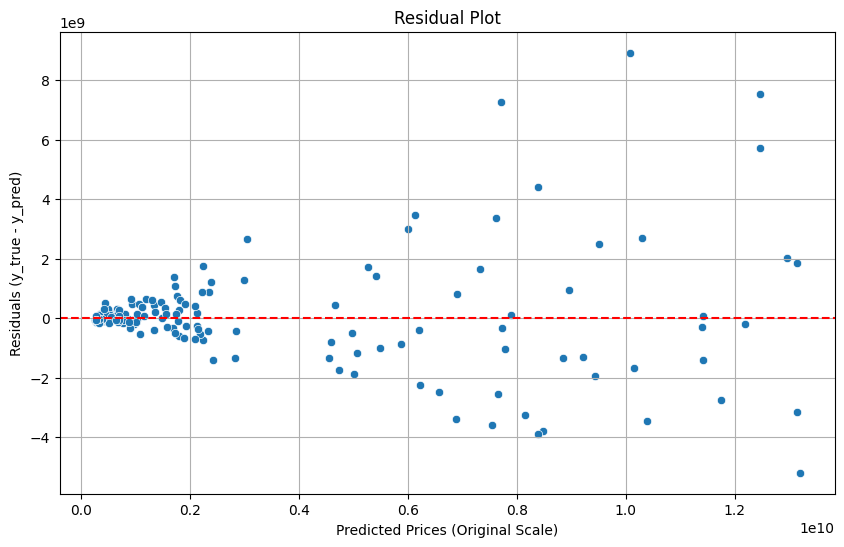

In [ ]:
# Predict log values
y_pred_log = ygy_best_model_scaled.predict(X_test_scaled)

# Convert to original scale
y_test_conv = np.expm1(y_test_scaled)
y_pred = np.expm1(y_pred_log)

# Residuals
residuals = y_test_conv - y_pred

# Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_pred, y=residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Predicted Prices (Original Scale)')
plt.ylabel('Residuals (y_true - y_pred)')
plt.title('Residual Plot')
plt.grid(True)
plt.show()

In [ ]:
for true_val, pred_val in zip(y_test_conv[:10], y_pred[:10]):
    print(f"True: {true_val:.2f}, Pred: {pred_val:.2f}")

True: 475000000.00, Pred: 415738784.00
True: 2100000000.00, Pred: 1809973248.00
True: 5700000000.00, Pred: 3043590400.00
True: 6950000000.00, Pred: 10388634624.00
True: 12800000000.00, Pred: 8399648256.00
True: 4500000000.00, Pred: 4980710400.00
True: 549000000.00, Pred: 425368064.00
True: 971000000.00, Pred: 654844032.00
True: 162000000.00, Pred: 278074976.00
True: 8000000000.00, Pred: 7903376896.00


In [ ]:
X_test_scaled.sample(3)

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai
126,-0.076603,-0.156218,0.142857,0.071429,0.000000
213,1.891757,1.940391,0.357143,0.285714,0.333333
143,-0.089925,-0.094553,0.142857,0.071429,0.000000


In [ ]:
y_test_scaled.loc[41]

np.float64(19.48539148439307)

In [ ]:
ygy_merged.loc[41]

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
41,76,30,2,1,1,Low,Rp 290 Juta,290.00,Juta,2.900000e+08
41,121,65,3,2,1,Low-Mid,Rp 895 Juta,895.00,Juta,8.950000e+08
41,90,120,2,2,1,Up-Mid,"Rp 1,35 Miliar",1.35,Miliar,1.350000e+09
41,306,298,3,5,1,High,"Rp 4,25 Miliar",4.25,Miliar,4.250000e+09
41,289,600,4,5,1,Luxury,"Rp 7,7 Miliar",7.70,Miliar,7.700000e+09


In [ ]:
input = [[-0.130000,	0.008333,	0.071429,	0.071429,	0.000000]]

ygy_best_model_scaled.predict(input)

array([20.904339], dtype=float32)

In [ ]:
np.expm1(20.904339)

np.float64(1198502861.2147202)

In [ ]:
inverse_scale_feature(ygy_robust, ygy_minmax, [-0.130000,	0.008333,	0.071429,	0.071429,	0.000000])

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai
0,90.0,119.99992,2.000006,2.000006,1.0


### **Surabaya**

In [ ]:
sby_low = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Surabaya_low.csv')
sby_low_mid = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Surabaya_low_mid.csv')
sby_up_mid = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Surabaya_up_mid.csv')
sby_high = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Surabaya_high.csv')
sby_luxury = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Surabaya_luxury.csv')

#### sby_low

In [ ]:
sby_low2 = convert_pipeline(sby_low)

In [ ]:
sby_low.shape

(237, 15)

In [ ]:
sby_low2.shape

(224, 10)

In [ ]:
sby_low2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,5
satuan,5
converted,5


In [ ]:
(sby_low2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,1
Kamar Tidur,9
Kamar Mandi,10
Jumlah Lantai,32
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
sby_low2.dropna(inplace=True)

In [ ]:
sby_low2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,219.00000,219.000000,219.000000,219.000000,219.000000,219.000000,2.190000e+02
mean,71.52968,57.716895,1.894977,1.150685,1.109589,383.273973,3.832740e+08
std,65.85237,61.262649,0.755969,0.533413,0.603392,101.041902,1.010419e+08
min,16.00000,0.000000,0.000000,0.000000,0.000000,120.000000,1.200000e+08
25%,36.00000,33.000000,2.000000,1.000000,1.000000,300.000000,3.000000e+08
50%,60.00000,42.000000,2.000000,1.000000,1.000000,400.000000,4.000000e+08
75%,90.00000,60.000000,2.000000,1.000000,1.000000,470.000000,4.700000e+08
max,624.00000,550.000000,6.000000,4.000000,2.000000,500.000000,5.000000e+08


In [ ]:
sby_low2 = replace_zero(sby_low2)

In [ ]:
sby_low2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,219.00000,219.000000,219.000000,219.000000,219.000000,219.000000,2.190000e+02
mean,71.52968,57.908676,1.977169,1.196347,1.242009,383.273973,3.832740e+08
std,65.85237,61.146769,0.645684,0.471952,0.429281,101.041902,1.010419e+08
min,16.00000,10.000000,1.000000,1.000000,1.000000,120.000000,1.200000e+08
25%,36.00000,33.500000,2.000000,1.000000,1.000000,300.000000,3.000000e+08
50%,60.00000,42.000000,2.000000,1.000000,1.000000,400.000000,4.000000e+08
75%,90.00000,60.000000,2.000000,1.000000,1.000000,470.000000,4.700000e+08
max,624.00000,550.000000,6.000000,4.000000,2.000000,500.000000,5.000000e+08


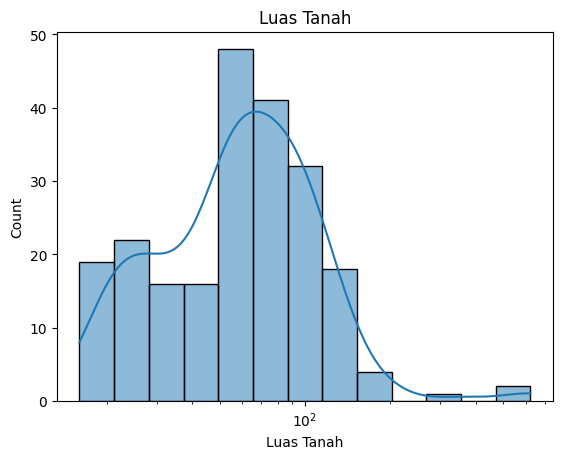

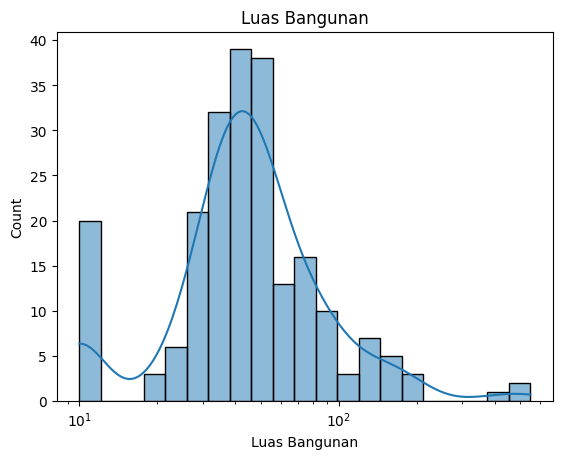

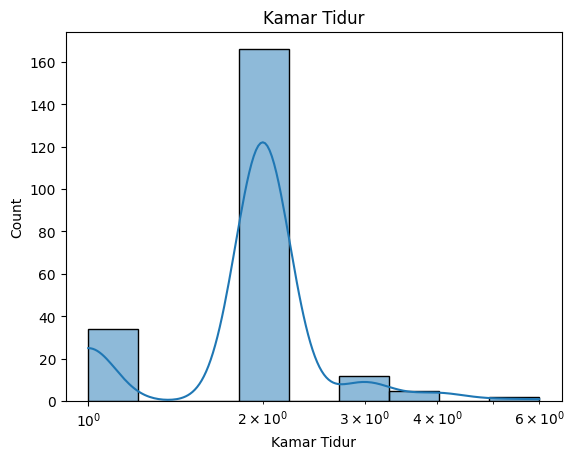

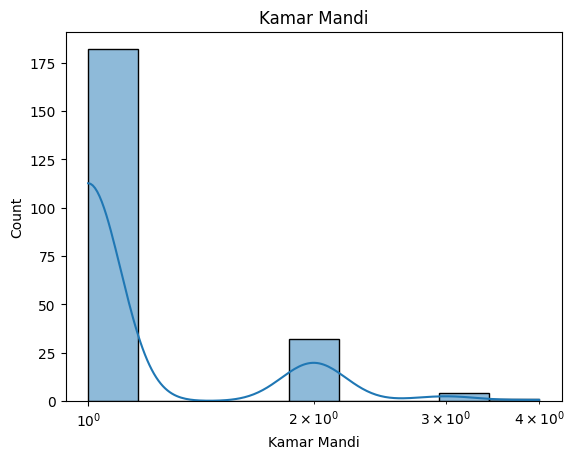

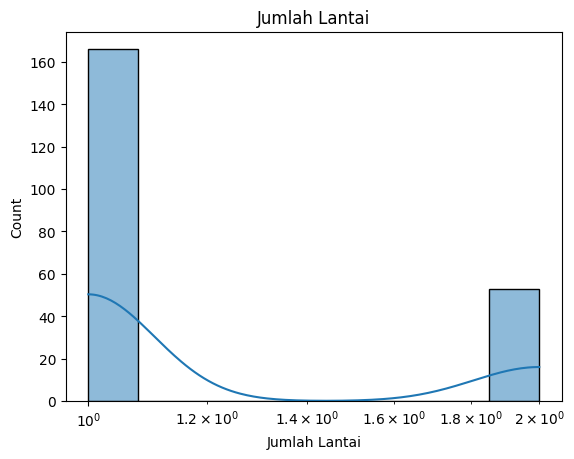

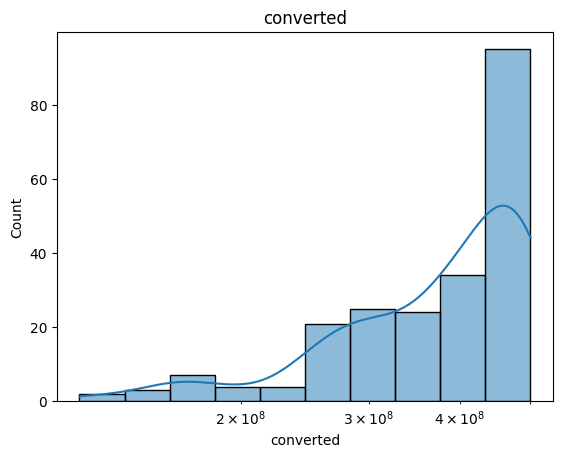

In [ ]:
get_histplot(sby_low2, log_scale=True)

In [ ]:
get_iqr(sby_low2)

{'Luas Tanah': [1, np.float64(171.0)],
 'Luas Bangunan': [1, np.float64(100.0)],
 'Kamar Tidur': [np.float64(2.0), np.float64(2.0)],
 'Kamar Mandi': [1, np.float64(1.0)],
 'Jumlah Lantai': [1, np.float64(1.0)],
 'converted': [np.float64(45000000.0), np.float64(725000000.0)]}

In [ ]:
get_outlier(sby_low2)

Luas Tanah -- found outliers: 5 
Luas Bangunan -- found outliers: 19 
Kamar Tidur -- found outliers: 53 
Kamar Mandi -- found outliers: 37 
Jumlah Lantai -- found outliers: 53 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
2           120             10            1            1              1   
3           120             90            3            1              1   
9            21             30            2            2              2   
10           72             45            3            1              1   
15           18             24            2            1              2   
..          ...            ...          ...          ...            ...   
229          90            180            3            3              2   
230          50             90            2            1              2   
234          50             50            2            1              2   
235          22       

In [ ]:
sby_low_cleaned = replace_outlier(sby_low2)

In [ ]:
sby_low_cleaned.shape

(219, 10)

In [ ]:
sby_low_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,219.000000,219.000000,219.0,219.0,219.0,219.000000,2.190000e+02
mean,66.429224,49.013699,2.0,1.0,1.0,383.273973,3.832740e+08
std,36.721969,25.180537,0.0,0.0,0.0,101.041902,1.010419e+08
min,16.000000,10.000000,2.0,1.0,1.0,120.000000,1.200000e+08
25%,36.000000,33.500000,2.0,1.0,1.0,300.000000,3.000000e+08
50%,60.000000,42.000000,2.0,1.0,1.0,400.000000,4.000000e+08
75%,90.000000,60.000000,2.0,1.0,1.0,470.000000,4.700000e+08
max,171.000000,100.000000,2.0,1.0,1.0,500.000000,5.000000e+08


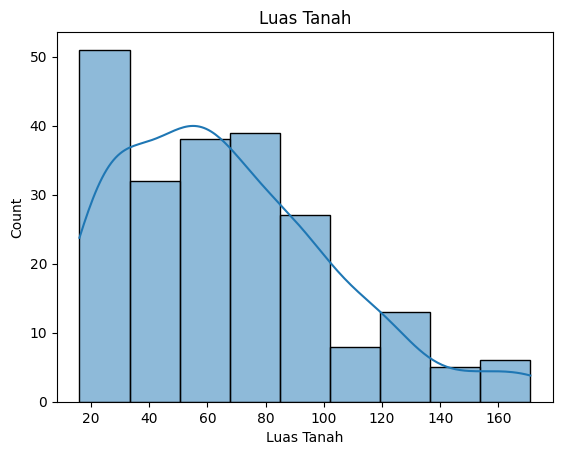

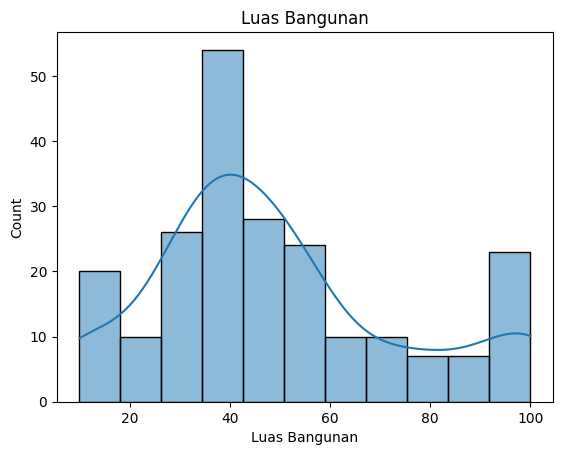

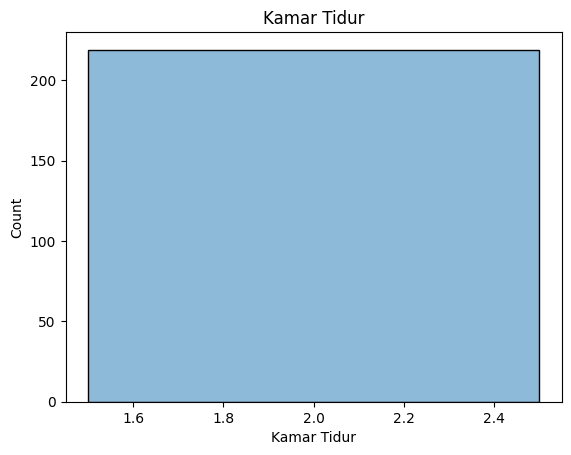

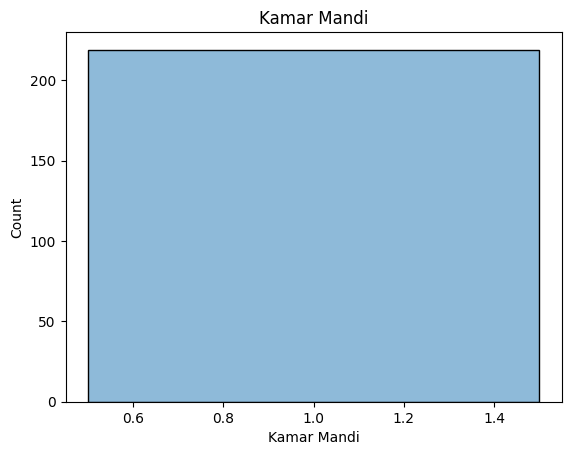

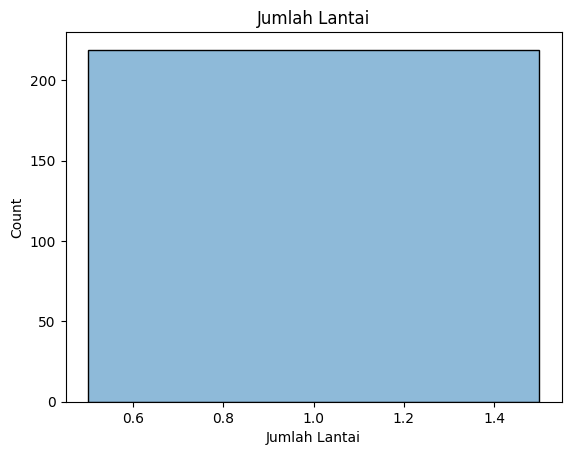

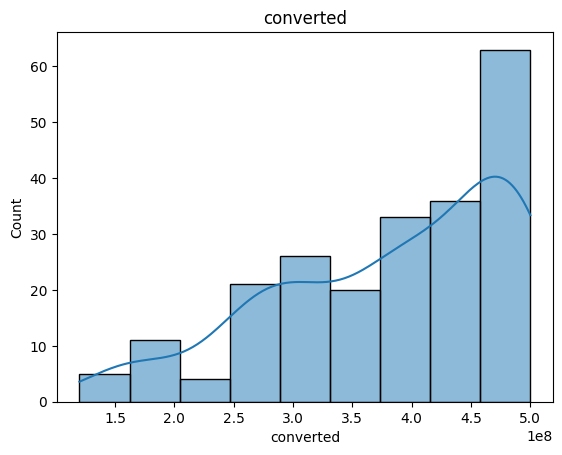

In [ ]:
get_histplot(sby_low_cleaned)

<Axes: >

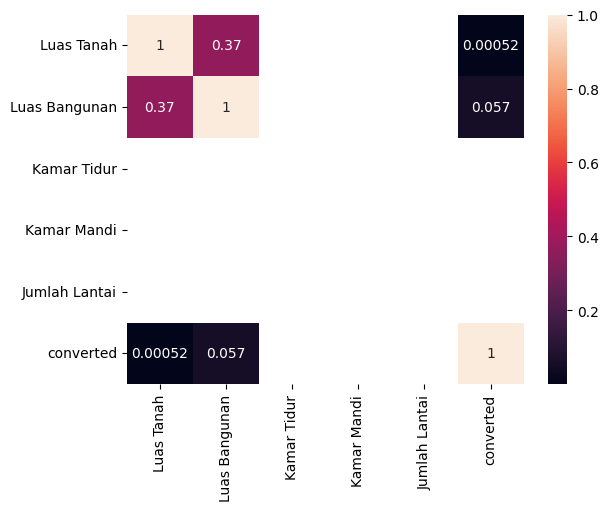

In [ ]:
get_corr(sby_low_cleaned)

#### sby_low_mid

In [ ]:
sby_low_mid2 = convert_pipeline(sby_low_mid)

In [ ]:
sby_low_mid.shape

(263, 15)

In [ ]:
sby_low_mid2.shape

(258, 10)

In [ ]:
sby_low_mid2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,18
satuan,18
converted,18


In [ ]:
(sby_low_mid2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,1
Kamar Mandi,1
Jumlah Lantai,37
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
sby_low_mid2.dropna(inplace=True)

In [ ]:
sby_low_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,2.400000e+02
mean,84.425000,77.479167,2.441667,1.529167,1.183333,688.800000,7.887000e+08
std,31.168636,41.627753,0.779398,0.633103,0.659445,265.375871,1.504089e+08
min,32.000000,10.000000,0.000000,0.000000,0.000000,1.000000,5.000000e+08
25%,60.000000,50.000000,2.000000,1.000000,1.000000,595.000000,6.807500e+08
50%,84.000000,68.500000,2.000000,1.000000,1.000000,750.000000,8.000000e+08
75%,100.000000,95.250000,3.000000,2.000000,2.000000,871.250000,9.000000e+08
max,232.000000,272.000000,5.000000,4.000000,3.000000,999.000000,1.000000e+09


In [ ]:
sby_low_mid2 = replace_zero(sby_low_mid2)

In [ ]:
sby_low_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,2.400000e+02
mean,84.425000,77.479167,2.450000,1.533333,1.320833,688.800000,7.887000e+08
std,31.168636,41.627753,0.763717,0.626250,0.476633,265.375871,1.504089e+08
min,32.000000,10.000000,1.000000,1.000000,1.000000,1.000000,5.000000e+08
25%,60.000000,50.000000,2.000000,1.000000,1.000000,595.000000,6.807500e+08
50%,84.000000,68.500000,2.000000,1.000000,1.000000,750.000000,8.000000e+08
75%,100.000000,95.250000,3.000000,2.000000,2.000000,871.250000,9.000000e+08
max,232.000000,272.000000,5.000000,4.000000,3.000000,999.000000,1.000000e+09


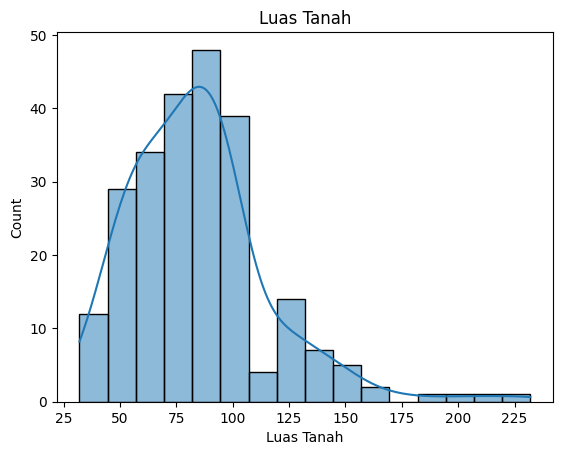

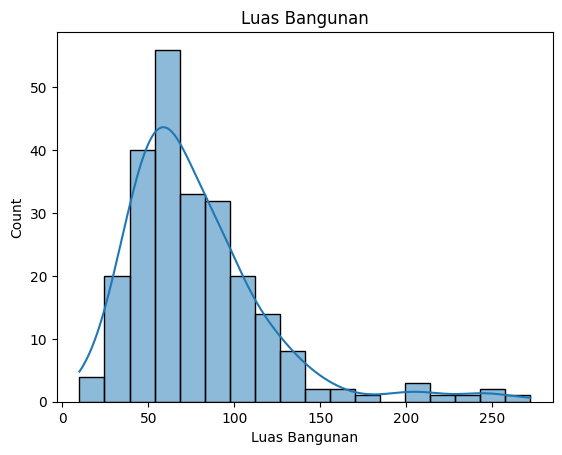

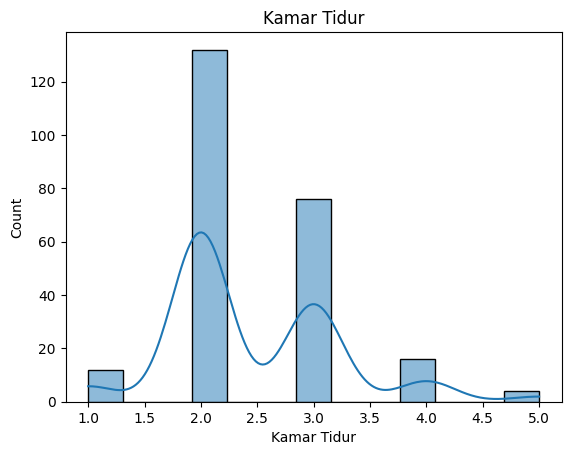

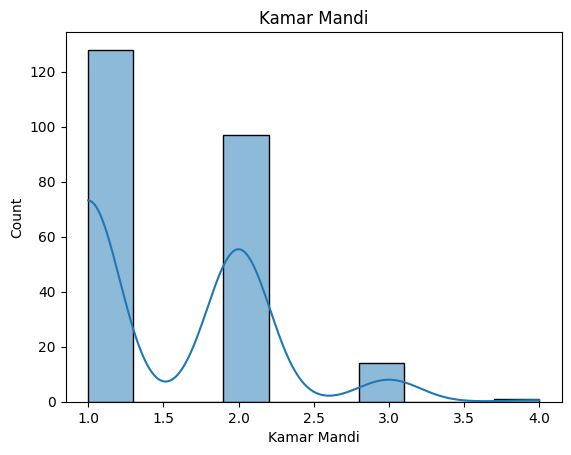

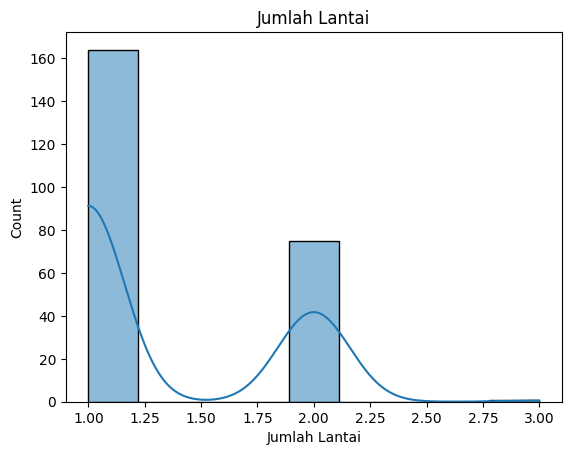

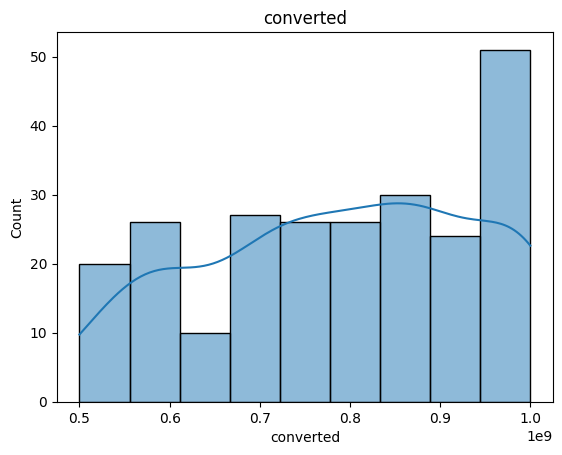

In [ ]:
get_histplot(sby_low_mid2)

In [ ]:
get_iqr(sby_low_mid2)

{'Luas Tanah': [1, np.float64(160.0)],
 'Luas Bangunan': [1, np.float64(164.0)],
 'Kamar Tidur': [1, np.float64(5.0)],
 'Kamar Mandi': [1, np.float64(4.0)],
 'Jumlah Lantai': [1, np.float64(4.0)],
 'converted': [np.float64(351875000.0), np.float64(1228875000.0)]}

In [ ]:
get_outlier(sby_low_mid2)

Luas Tanah -- found outliers: 6 
Luas Bangunan -- found outliers: 9 
Kamar Tidur -- found outliers: 0 
Kamar Mandi -- found outliers: 0 
Jumlah Lantai -- found outliers: 0 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
41          167            200            3            3              2   
234         232            250            2            1              1   
169         135            200            4            3              1   
109         216            218            3            2              1   
207         130            182            4            2              2   
243         182            240            2            1              1   
22          200            245            3            2              1   
26          144            272            3            2              2   
29          162            210            3            2              1   

        converted  
41   

In [ ]:
sby_low_mid_cleaned = replace_outlier(sby_low_mid2)

In [ ]:
sby_low_mid_cleaned.shape

(240, 10)

In [ ]:
sby_low_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,219.000000,219.000000,219.0,219.0,219.0,219.000000,2.190000e+02
mean,66.429224,49.013699,2.0,1.0,1.0,383.273973,3.832740e+08
std,36.721969,25.180537,0.0,0.0,0.0,101.041902,1.010419e+08
min,16.000000,10.000000,2.0,1.0,1.0,120.000000,1.200000e+08
25%,36.000000,33.500000,2.0,1.0,1.0,300.000000,3.000000e+08
50%,60.000000,42.000000,2.0,1.0,1.0,400.000000,4.000000e+08
75%,90.000000,60.000000,2.0,1.0,1.0,470.000000,4.700000e+08
max,171.000000,100.000000,2.0,1.0,1.0,500.000000,5.000000e+08


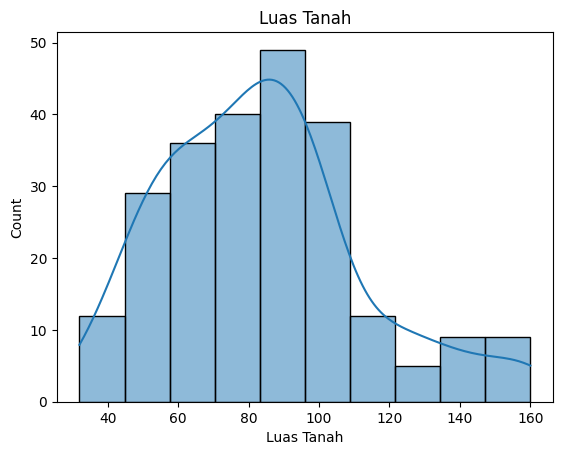

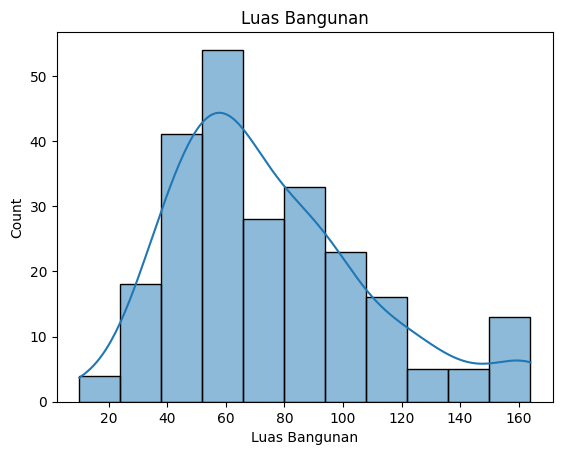

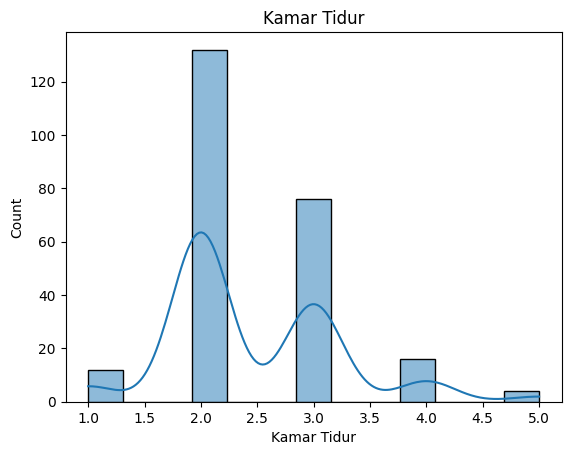

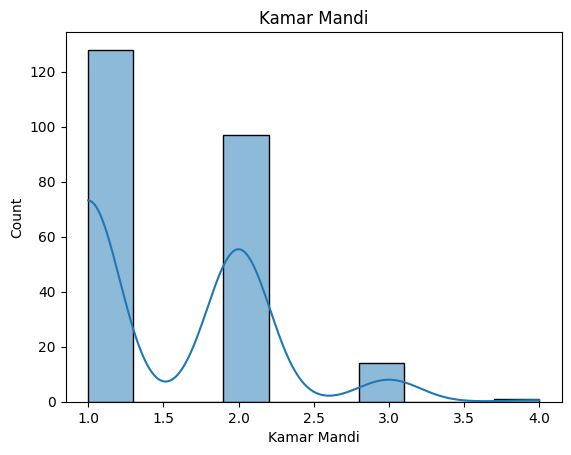

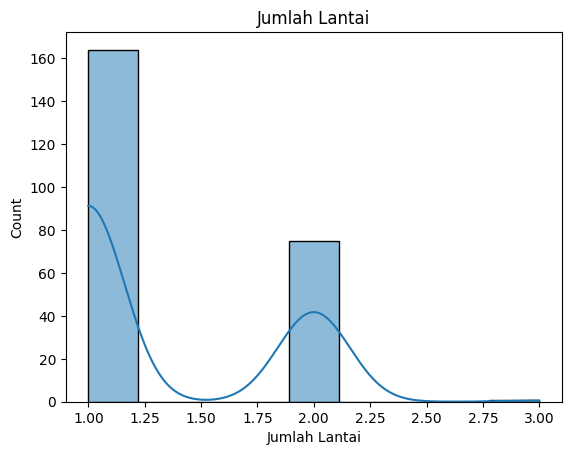

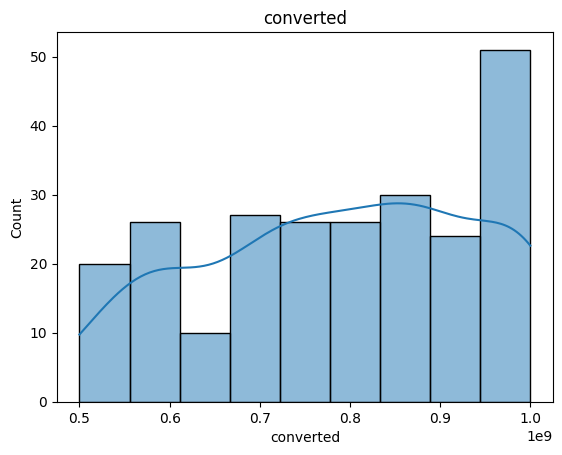

In [ ]:
get_histplot(sby_low_mid_cleaned)

<Axes: >

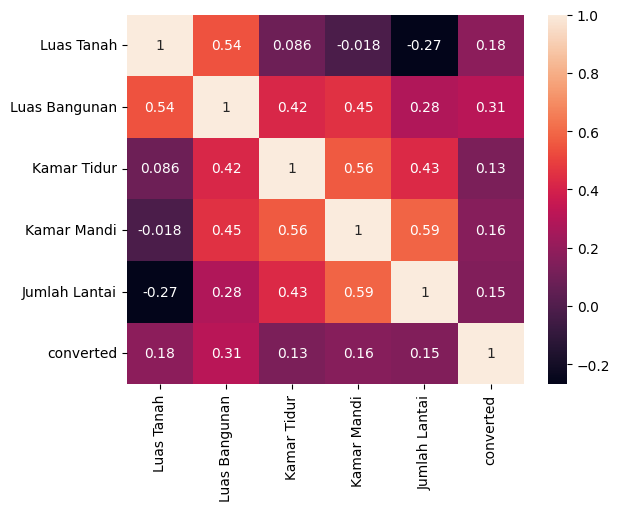

In [ ]:
get_corr(sby_low_mid_cleaned)

#### sby_up_mid

In [ ]:
sby_up_mid2 = convert_pipeline(sby_up_mid)

In [ ]:
sby_up_mid.shape

(284, 15)

In [ ]:
sby_up_mid2.shape

(280, 10)

In [ ]:
sby_up_mid2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,25
satuan,25
converted,25


In [ ]:
(sby_up_mid2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,3
Kamar Mandi,3
Jumlah Lantai,13
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
sby_up_mid2.dropna(inplace=True)

In [ ]:
sby_up_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,2.550000e+02
mean,128.545098,154.078431,3.525490,2.631373,1.674510,1.907137,1.907137e+09
std,59.488940,63.661334,1.586836,1.074671,0.627407,0.543904,5.439040e+08
min,50.000000,55.000000,0.000000,0.000000,0.000000,1.000000,1.000000e+09
25%,90.000000,110.000000,3.000000,2.000000,1.000000,1.500000,1.500000e+09
50%,112.000000,145.000000,3.000000,3.000000,2.000000,1.800000,1.800000e+09
75%,156.500000,190.000000,4.000000,3.000000,2.000000,2.335000,2.335000e+09
max,465.000000,400.000000,15.000000,9.000000,4.000000,3.000000,3.000000e+09


In [ ]:
sby_up_mid2 = replace_zero(sby_up_mid2)

In [ ]:
sby_up_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,2.550000e+02
mean,128.545098,154.078431,3.560784,2.666667,1.768627,1.907137,1.907137e+09
std,59.488940,63.661334,1.540539,1.036094,0.507227,0.543904,5.439040e+08
min,50.000000,55.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+09
25%,90.000000,110.000000,3.000000,2.000000,1.000000,1.500000,1.500000e+09
50%,112.000000,145.000000,3.000000,3.000000,2.000000,1.800000,1.800000e+09
75%,156.500000,190.000000,4.000000,3.000000,2.000000,2.335000,2.335000e+09
max,465.000000,400.000000,15.000000,9.000000,4.000000,3.000000,3.000000e+09


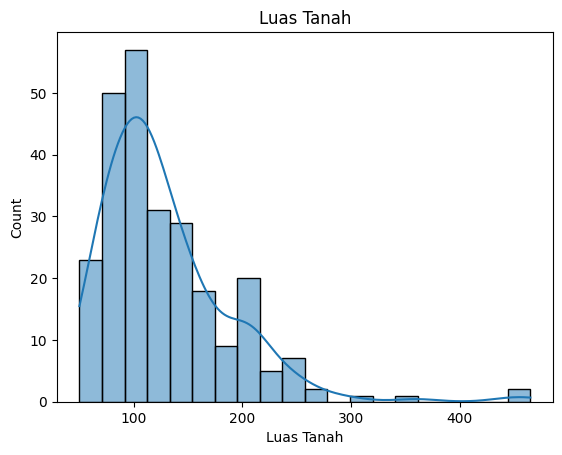

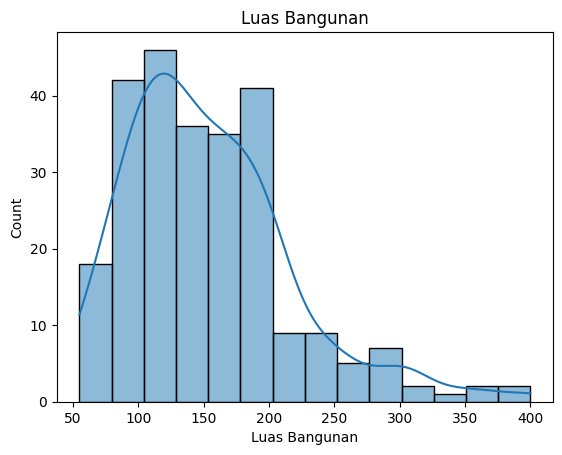

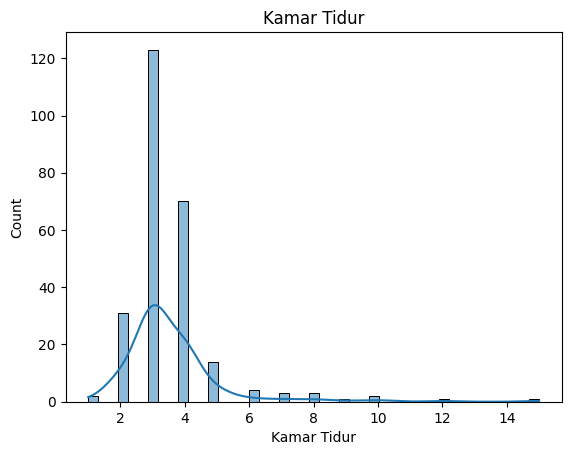

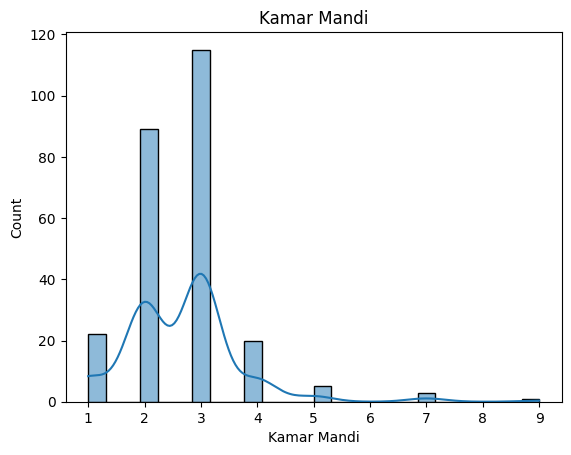

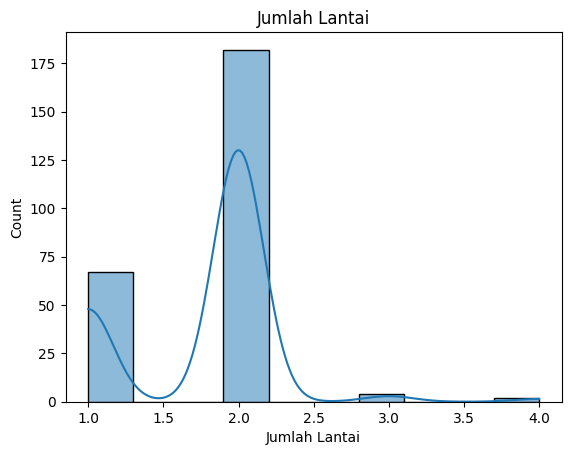

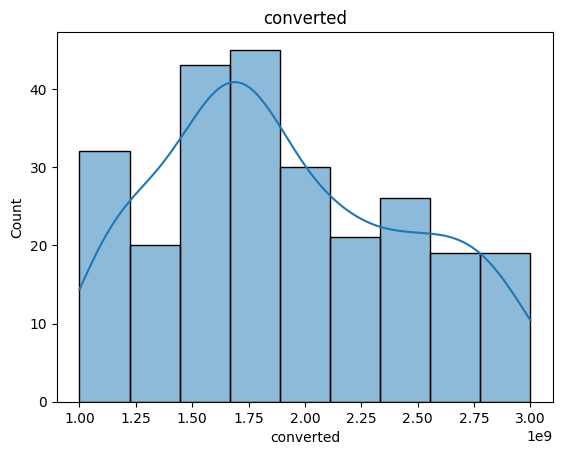

In [ ]:
get_histplot(sby_up_mid2)

In [ ]:
get_iqr(sby_up_mid2)

{'Luas Tanah': [1, np.float64(257.0)],
 'Luas Bangunan': [1, np.float64(310.0)],
 'Kamar Tidur': [1, np.float64(6.0)],
 'Kamar Mandi': [1, np.float64(5.0)],
 'Jumlah Lantai': [1, np.float64(4.0)],
 'converted': [np.float64(247500000.0), np.float64(3587500000.0)]}

In [ ]:
get_outlier(sby_up_mid2)

Luas Tanah -- found outliers: 6 
Luas Bangunan -- found outliers: 7 
Kamar Tidur -- found outliers: 11 
Kamar Mandi -- found outliers: 4 
Jumlah Lantai -- found outliers: 0 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
129         198            360            7            3              2   
259         181            355            5            3              2   
13          360            300            6            5              2   
270         445            400           10            7              1   
145         160            240            8            2              1   
274         204            273           10            2              2   
154         145            216           15            4              2   
48          160            240            8            2              2   
186         200            350            4            3              2   
70          120          

In [ ]:
sby_up_mid_cleaned = remove_outlier(sby_up_mid2)

In [ ]:
sby_up_mid_cleaned.shape

(236, 10)

In [ ]:
sby_up_mid_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,2.360000e+02
mean,120.724576,144.762712,3.279661,2.567797,1.775424,1.891483,1.891483e+09
std,45.515632,51.039272,0.834221,0.819744,0.509891,0.542579,5.425793e+08
min,50.000000,55.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+09
25%,90.000000,100.000000,3.000000,2.000000,1.000000,1.500000,1.500000e+09
50%,110.000000,137.500000,3.000000,3.000000,2.000000,1.800000,1.800000e+09
75%,144.000000,180.000000,4.000000,3.000000,2.000000,2.300000,2.300000e+09
max,251.000000,300.000000,6.000000,5.000000,4.000000,3.000000,3.000000e+09


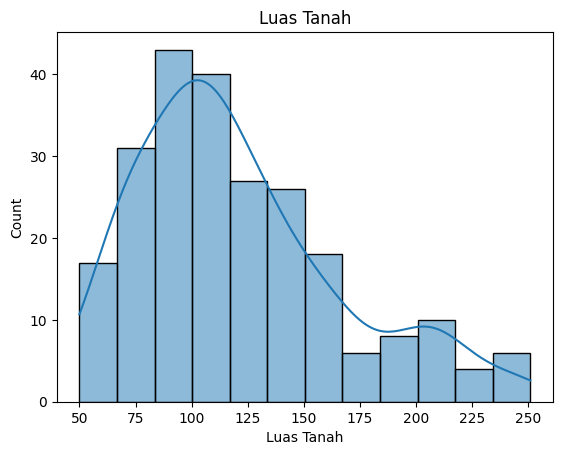

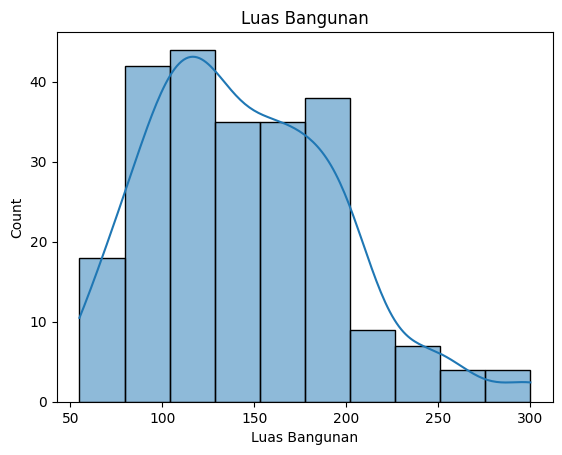

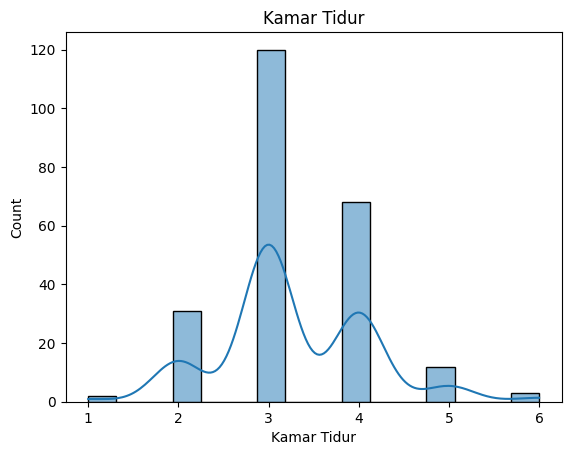

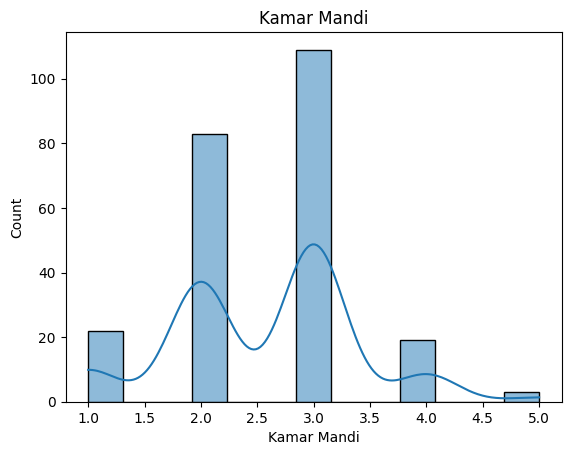

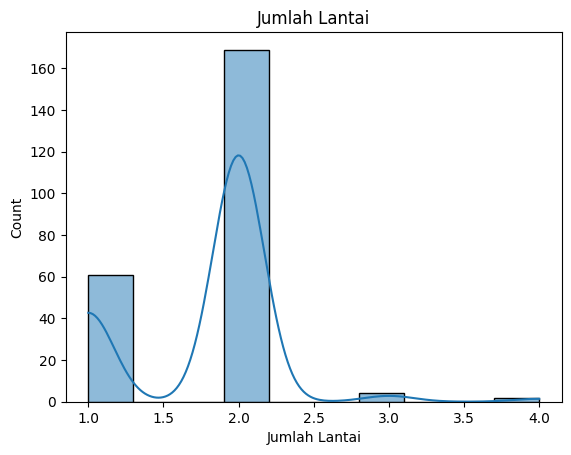

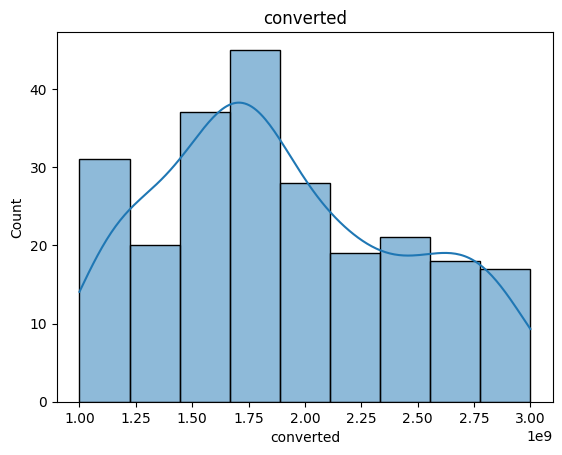

In [ ]:
get_histplot(sby_up_mid_cleaned)

<Axes: >

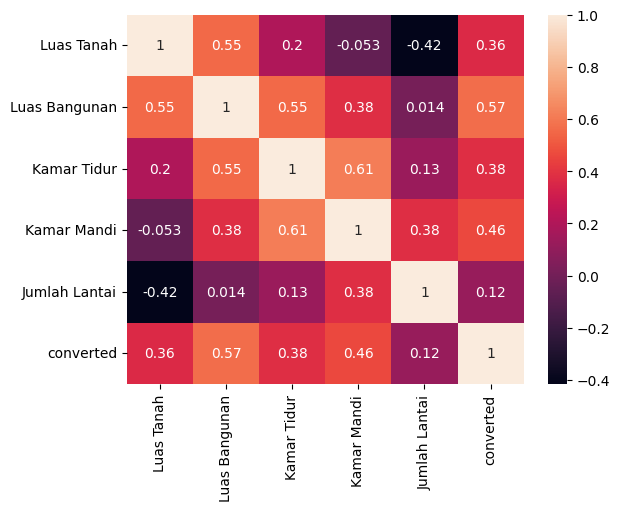

In [ ]:
get_corr(sby_up_mid_cleaned)

#### sby_high

In [ ]:
sby_high2 = convert_pipeline(sby_high)

In [ ]:
sby_high.shape

(269, 15)

In [ ]:
sby_high2.shape

(269, 10)

In [ ]:
sby_high2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,22
satuan,22
converted,22


In [ ]:
(sby_high2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,5
Kamar Mandi,3
Jumlah Lantai,17
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
sby_high2.dropna(inplace=True)

In [ ]:
sby_high2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,2.470000e+02
mean,262.040486,323.740891,4.631579,3.736842,1.736842,4.616113,4.616113e+09
std,120.741941,239.484265,2.914412,2.647206,0.873956,1.229650,1.229650e+09
min,105.000000,10.000000,0.000000,0.000000,0.000000,3.000000,3.000000e+09
25%,172.000000,212.500000,4.000000,3.000000,1.000000,3.500000,3.500000e+09
50%,240.000000,298.000000,4.000000,3.000000,2.000000,4.400000,4.400000e+09
75%,318.500000,360.000000,5.000000,4.000000,2.000000,5.550000,5.550000e+09
max,900.000000,3257.000000,34.000000,34.000000,11.000000,7.000000,7.000000e+09


In [ ]:
sby_high2 = replace_zero(sby_high2)

In [ ]:
sby_high2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,247.000000,247.000000,247.000000,247.000000,247.0000,247.000000,2.470000e+02
mean,262.040486,323.740891,4.680162,3.761134,1.8583,4.616113,4.616113e+09
std,120.741941,239.484265,2.869614,2.626404,0.7545,1.229650,1.229650e+09
min,105.000000,10.000000,1.000000,1.000000,1.0000,3.000000,3.000000e+09
25%,172.000000,212.500000,4.000000,3.000000,2.0000,3.500000,3.500000e+09
50%,240.000000,298.000000,4.000000,3.000000,2.0000,4.400000,4.400000e+09
75%,318.500000,360.000000,5.000000,4.000000,2.0000,5.550000,5.550000e+09
max,900.000000,3257.000000,34.000000,34.000000,11.0000,7.000000,7.000000e+09


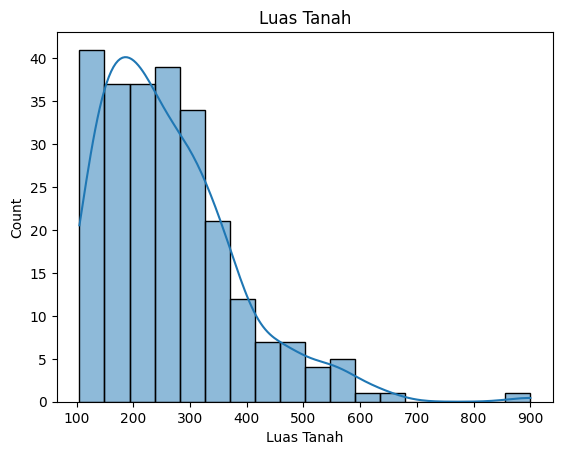

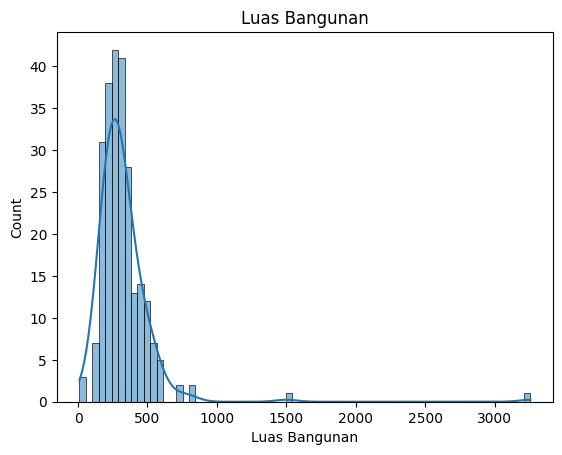

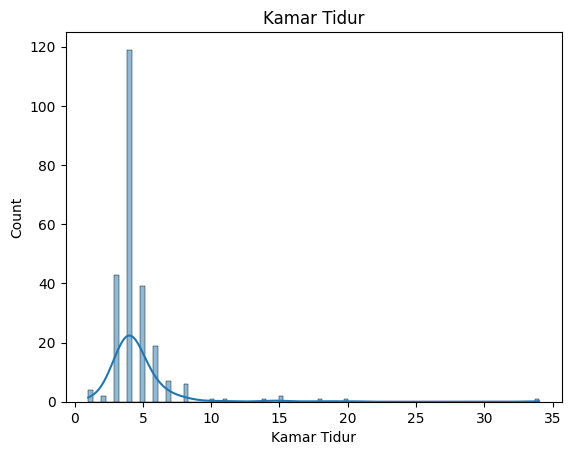

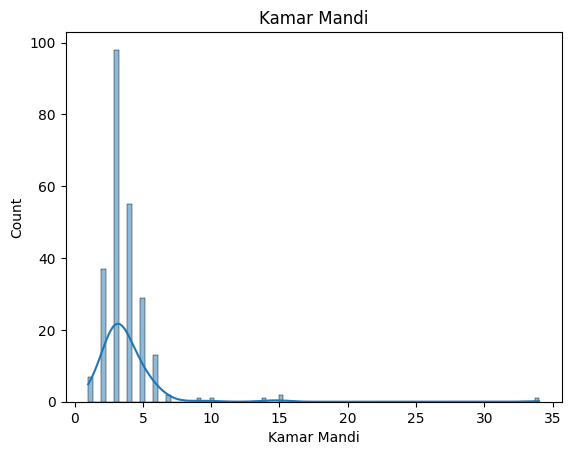

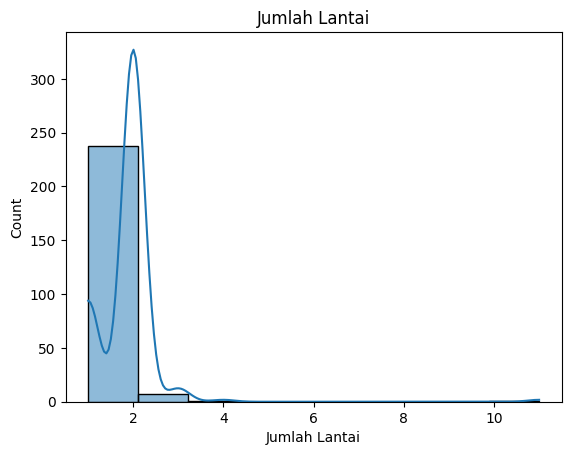

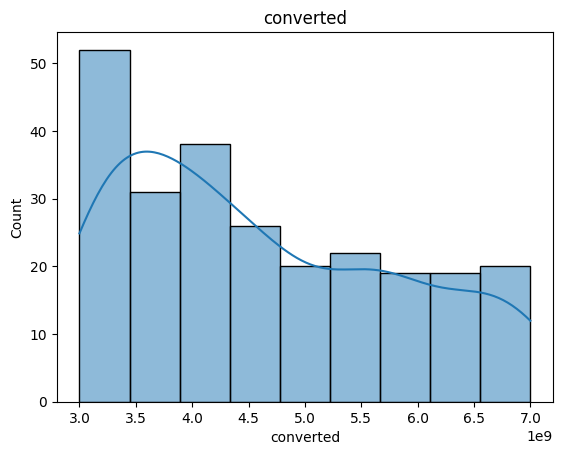

In [ ]:
get_histplot(sby_high2)

In [ ]:
get_iqr(sby_high2)

{'Luas Tanah': [1, np.float64(539.0)],
 'Luas Bangunan': [1, np.float64(582.0)],
 'Kamar Tidur': [np.float64(2.0), np.float64(7.0)],
 'Kamar Mandi': [1, np.float64(6.0)],
 'Jumlah Lantai': [np.float64(2.0), np.float64(2.0)],
 'converted': [np.float64(425000000.0), np.float64(8625000000.0)]}

In [ ]:
get_outlier(sby_high2)

Luas Tanah -- found outliers: 10 
Luas Bangunan -- found outliers: 11 
Kamar Tidur -- found outliers: 18 
Kamar Mandi -- found outliers: 8 
Jumlah Lantai -- found outliers: 62 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
0           372            250            3            2              1   
8           200            325            4            5              3   
18          480            541            4            2              3   
20          210            350            5            4              1   
22          636            450            6            5              2   
..          ...            ...          ...          ...            ...   
254         360            360            1            1              1   
257         300            250           10            6              1   
258         150            213            5            4              1   
264         240       

In [ ]:
sby_high_cleaned = remove_outlier(sby_high2)

In [ ]:
sby_high_cleaned.shape

(165, 10)

In [ ]:
sby_high_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,165.000000,165.000000,165.000000,165.000000,165.0,165.000000,1.650000e+02
mean,232.581818,294.793939,4.248485,3.533333,2.0,4.606303,4.606303e+09
std,92.221107,101.679044,0.913357,1.003247,0.0,1.255905,1.255905e+09
min,105.000000,117.000000,2.000000,2.000000,2.0,3.000000,3.000000e+09
25%,154.000000,210.000000,4.000000,3.000000,2.0,3.500000,3.500000e+09
50%,210.000000,280.000000,4.000000,3.000000,2.0,4.300000,4.300000e+09
75%,300.000000,350.000000,5.000000,4.000000,2.0,5.500000,5.500000e+09
max,525.000000,550.000000,7.000000,6.000000,2.0,7.000000,7.000000e+09


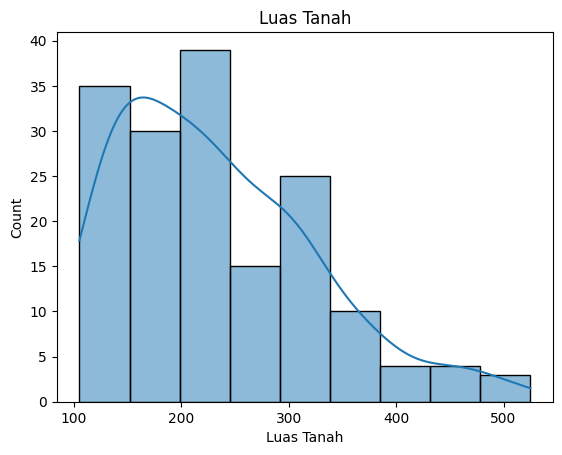

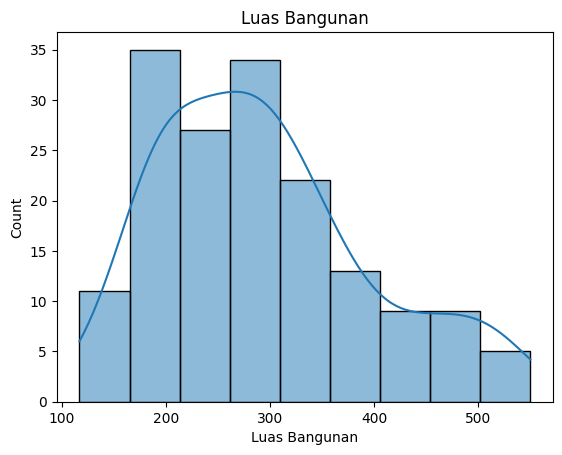

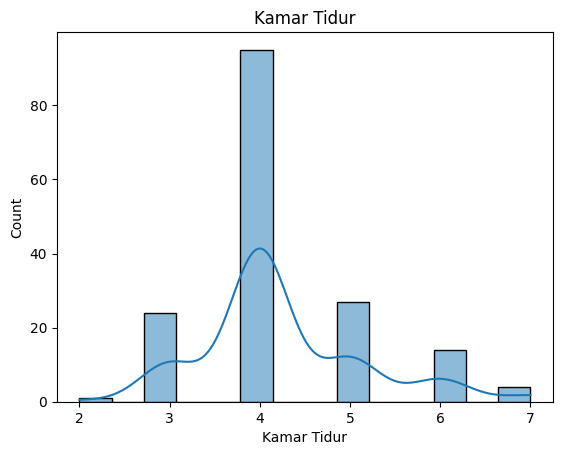

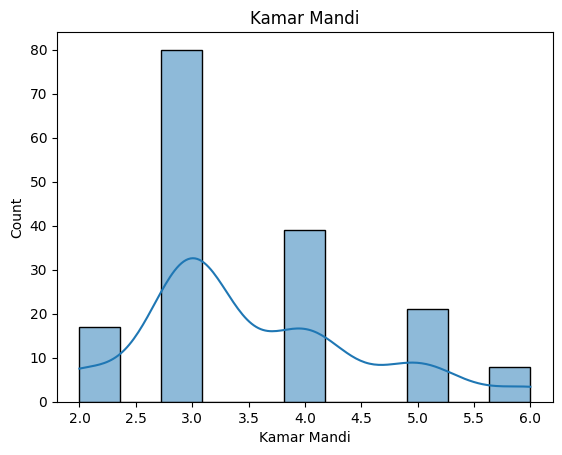

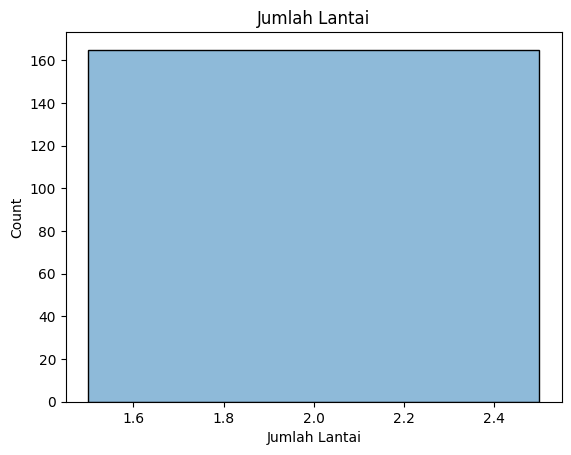

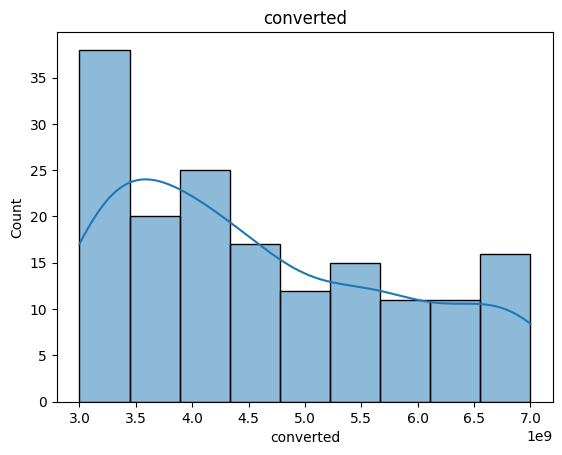

In [ ]:
get_histplot(sby_high_cleaned)

<Axes: >

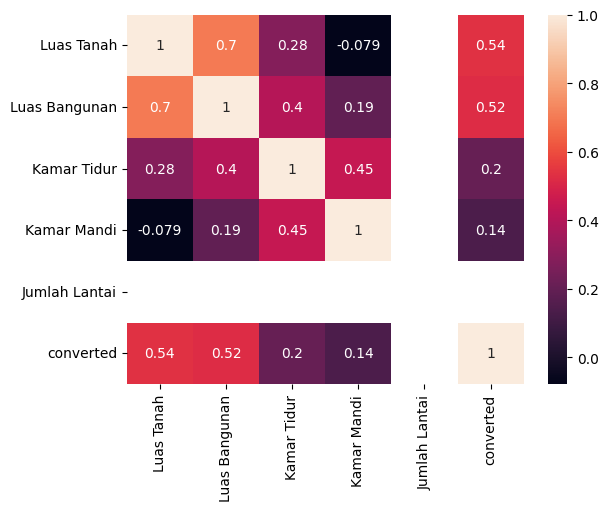

In [ ]:
get_corr(sby_high_cleaned)

#### sby_luxury

In [ ]:
sby_luxury2 = convert_pipeline(sby_luxury)

In [ ]:
sby_luxury.shape

(285, 15)

In [ ]:
sby_luxury2.shape

(281, 10)

In [ ]:
sby_luxury2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,12
satuan,12
converted,12


In [ ]:
(sby_luxury2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,8
Kamar Mandi,7
Jumlah Lantai,18
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
sby_luxury2.dropna(inplace=True)

In [ ]:
sby_luxury2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,2.690000e+02
mean,458.267658,540.427509,5.639405,4.892193,1.754647,10.991747,1.096538e+10
std,207.557821,269.931762,6.748140,6.695363,0.957700,3.181865,3.243036e+09
min,126.000000,10.000000,0.000000,0.000000,0.000000,7.000000,7.100000e+06
25%,340.000000,400.000000,4.000000,3.000000,1.000000,8.500000,8.500000e+09
50%,400.000000,500.000000,5.000000,4.000000,2.000000,10.000000,1.000000e+10
75%,525.000000,600.000000,6.000000,5.000000,2.000000,13.000000,1.300000e+10
max,1800.000000,2500.000000,72.000000,72.000000,11.000000,20.000000,2.000000e+10


In [ ]:
sby_luxury2 = replace_zero(sby_luxury2)

In [ ]:
sby_luxury2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,2.690000e+02
mean,458.267658,540.427509,5.788104,4.996283,1.888476,10.991747,1.096538e+10
std,207.557821,269.931762,6.676681,6.649261,0.834548,3.181865,3.243036e+09
min,126.000000,10.000000,1.000000,1.000000,1.000000,7.000000,7.100000e+06
25%,340.000000,400.000000,4.000000,3.000000,1.000000,8.500000,8.500000e+09
50%,400.000000,500.000000,5.000000,4.000000,2.000000,10.000000,1.000000e+10
75%,525.000000,600.000000,6.000000,5.000000,2.000000,13.000000,1.300000e+10
max,1800.000000,2500.000000,72.000000,72.000000,11.000000,20.000000,2.000000e+10


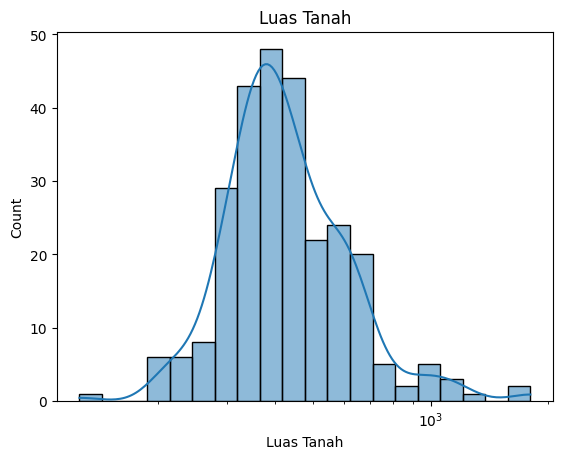

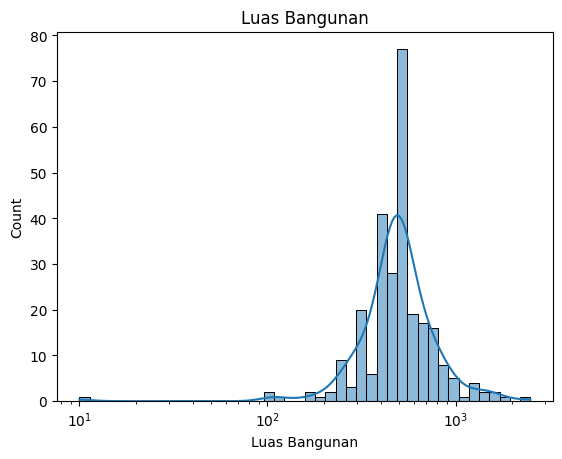

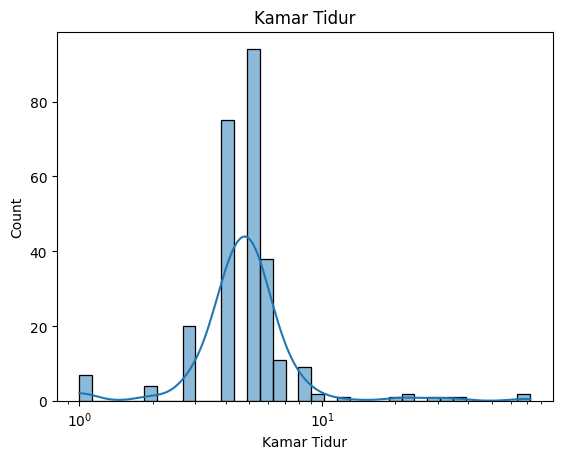

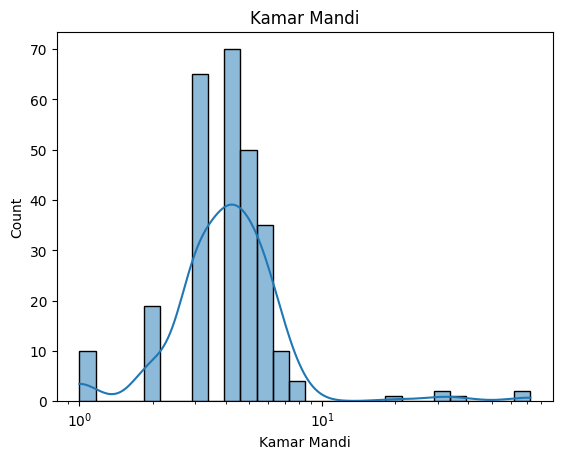

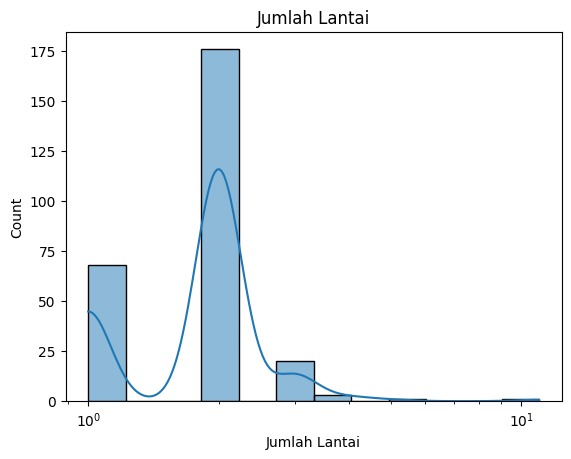

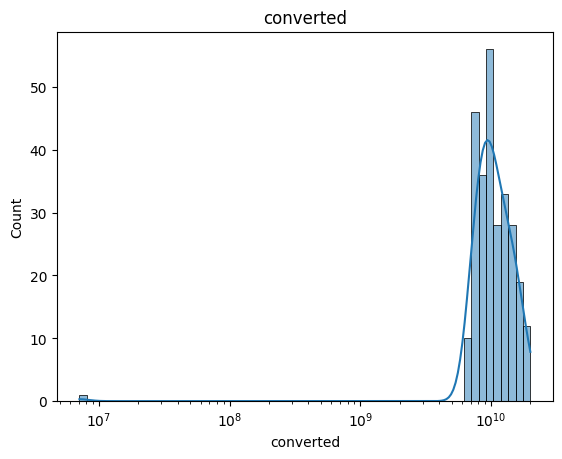

In [ ]:
get_histplot(sby_luxury2, log_scale=True)

In [ ]:
get_iqr(sby_luxury2)

{'Luas Tanah': [np.float64(62.0), np.float64(803.0)],
 'Luas Bangunan': [np.float64(100.0), np.float64(900.0)],
 'Kamar Tidur': [1, np.float64(9.0)],
 'Kamar Mandi': [1, np.float64(8.0)],
 'Jumlah Lantai': [1, np.float64(4.0)],
 'converted': [np.float64(1750000000.0), np.float64(19750000000.0)]}

In [ ]:
get_outlier(sby_luxury2)

Luas Tanah -- found outliers: 13 
Luas Bangunan -- found outliers: 17 
Kamar Tidur -- found outliers: 11 
Kamar Mandi -- found outliers: 6 
Jumlah Lantai -- found outliers: 2 
converted -- found outliers: 6 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
1           365            534           22            8              2   
258         420            950            6            4              4   
131         600            337            4            4              1   
132         538           2500           72           72              2   
140         700           1200            4            5              2   
13          365            534           22            8              2   
268         370            650           20           20              1   
272         930            500            5            4              2   
147         858            780            8            6              2   
150         600        

In [ ]:
sby_luxury_cleaned = replace_outlier(sby_luxury2)

In [ ]:
sby_luxury_cleaned.shape

(269, 10)

In [ ]:
sby_luxury_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,2.690000e+02
mean,441.657993,514.553903,4.914498,4.211896,1.858736,10.991747,1.096796e+10
std,145.734508,179.293769,1.553803,1.568013,0.618834,3.181865,3.211912e+09
min,126.000000,100.000000,1.000000,1.000000,1.000000,7.000000,1.750000e+09
25%,340.000000,400.000000,4.000000,3.000000,1.000000,8.500000,8.500000e+09
50%,400.000000,500.000000,5.000000,4.000000,2.000000,10.000000,1.000000e+10
75%,525.000000,600.000000,6.000000,5.000000,2.000000,13.000000,1.300000e+10
max,803.000000,900.000000,9.000000,8.000000,4.000000,20.000000,1.975000e+10


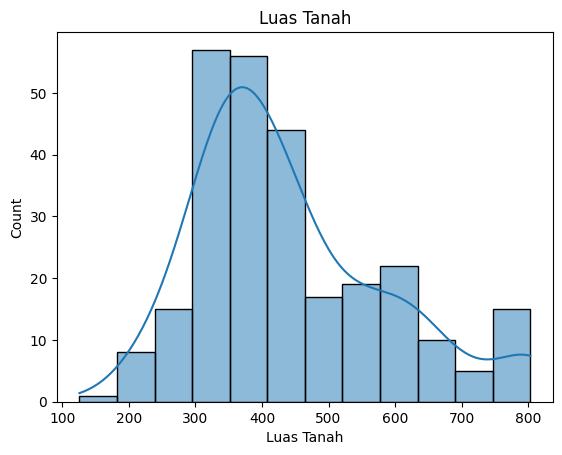

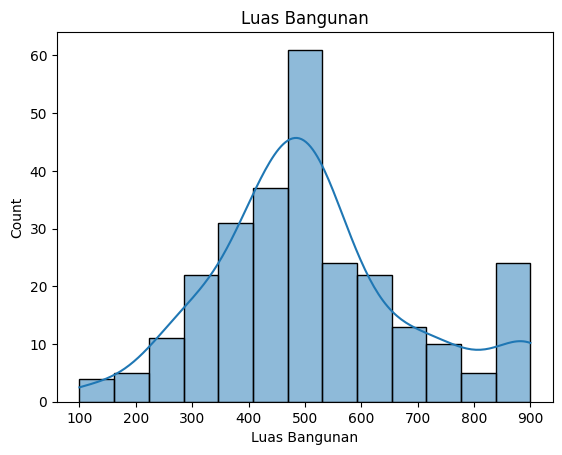

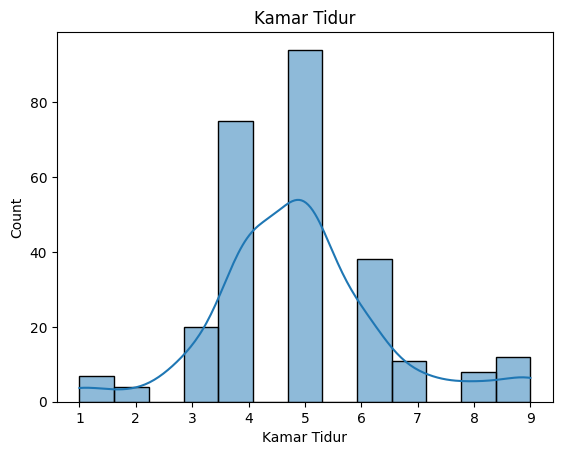

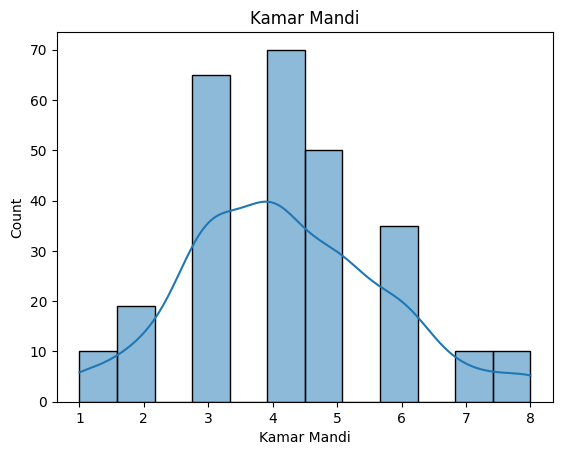

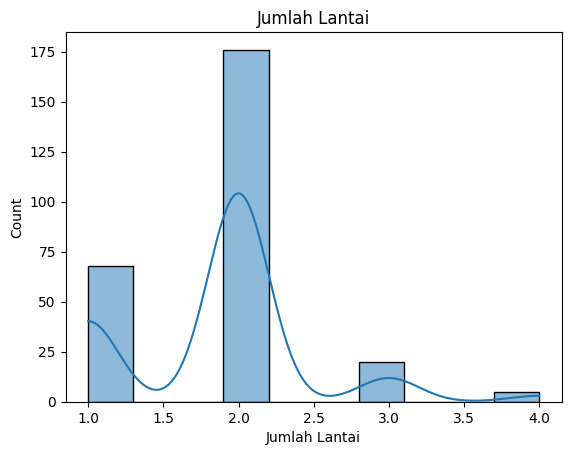

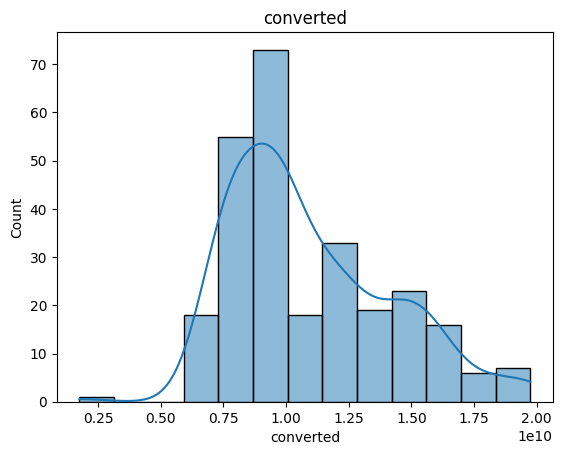

In [ ]:
get_histplot(sby_luxury_cleaned)

<Axes: >

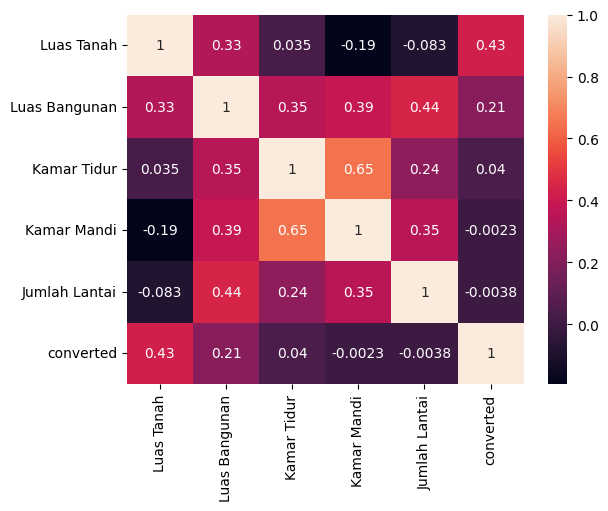

In [ ]:
get_corr(sby_luxury_cleaned)

<Axes: >

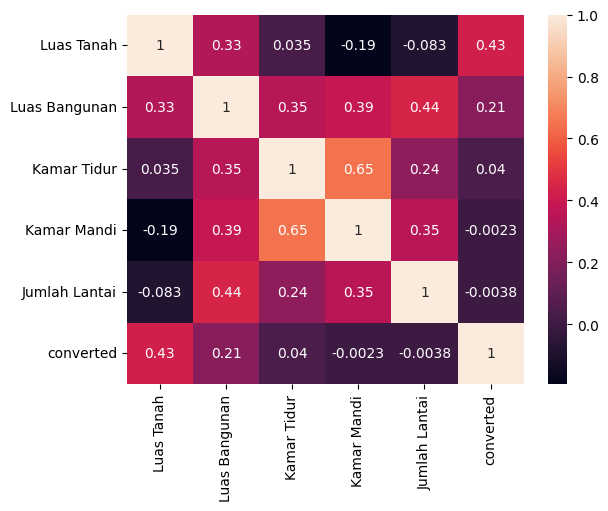

In [ ]:
get_corr(sby_luxury_cleaned)

#### merged

In [ ]:
sby_merged = pd.concat([sby_low_cleaned, sby_low_mid_cleaned, sby_up_mid_cleaned, sby_high_cleaned, sby_luxury_cleaned])

In [ ]:
sby_merged.shape

(1129, 10)

In [ ]:
sby_merged.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,120,100,2,1,1,Low,Rp 150 Juta,150.0,Juta,150000000.0
1,120,90,2,1,1,Low,Rp 254 Juta,254.0,Juta,254000000.0
2,120,10,2,1,1,Low,Rp 482 Juta,482.0,Juta,482000000.0
3,120,90,2,1,1,Low,Rp 254 Juta,254.0,Juta,254000000.0
4,24,19,2,1,1,Low,Rp 335 Juta,335.0,Juta,335000000.0


In [ ]:
sby_merged.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,1129.000000,1129.000000,1129.000000,1129.000000,1129.000000,1129.000000,1.129000e+03
mean,195.114260,221.441984,3.386182,2.576616,1.581045,224.457228,3.923857e+09
std,169.894618,207.077328,1.480256,1.561852,0.570270,309.790798,4.476482e+09
min,16.000000,10.000000,1.000000,1.000000,1.000000,1.000000,1.200000e+08
25%,75.000000,63.000000,2.000000,1.000000,1.000000,3.250000,6.930000e+08
50%,120.000000,135.000000,3.000000,2.000000,2.000000,10.000000,1.750000e+09
75%,300.000000,325.000000,4.000000,3.000000,2.000000,450.000000,6.800000e+09
max,803.000000,900.000000,9.000000,8.000000,4.000000,999.000000,1.975000e+10


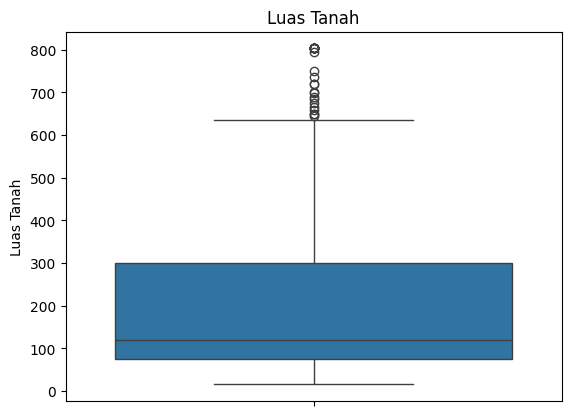

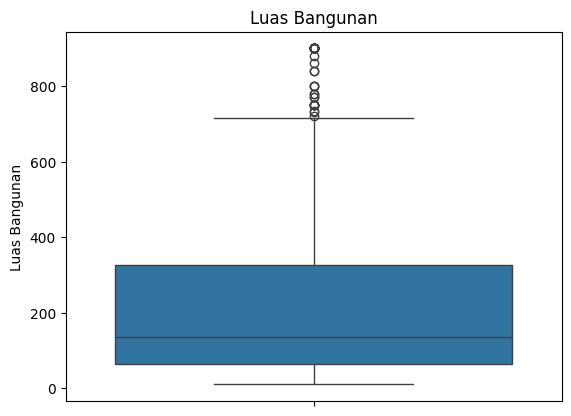

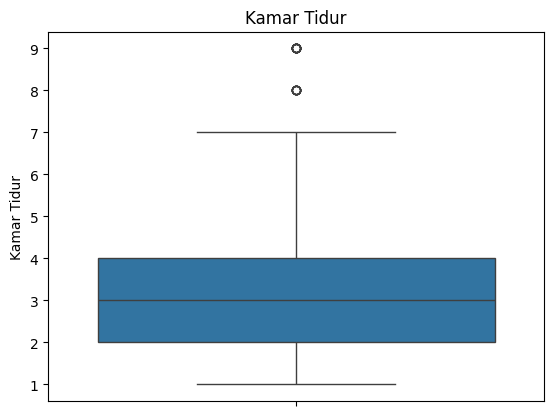

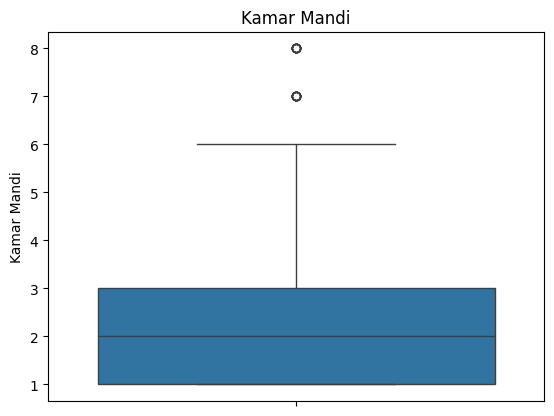

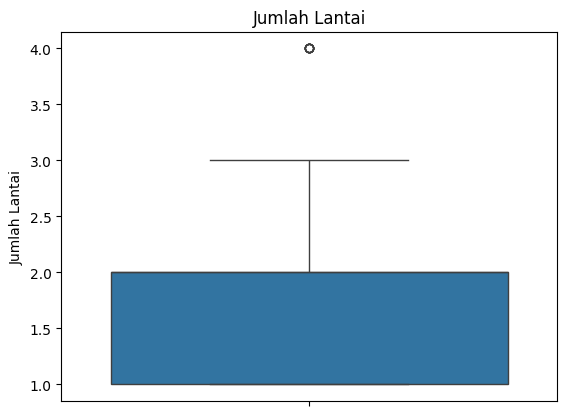

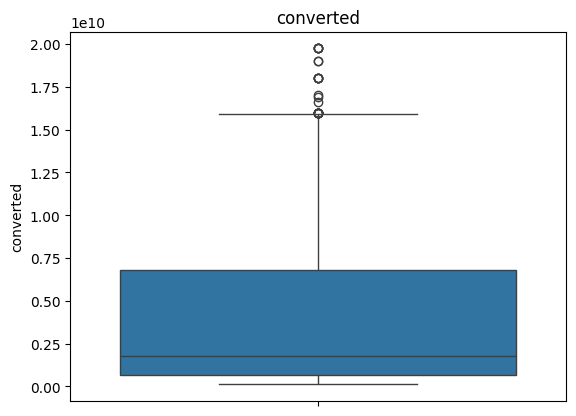

In [ ]:
get_boxplot(sby_merged)

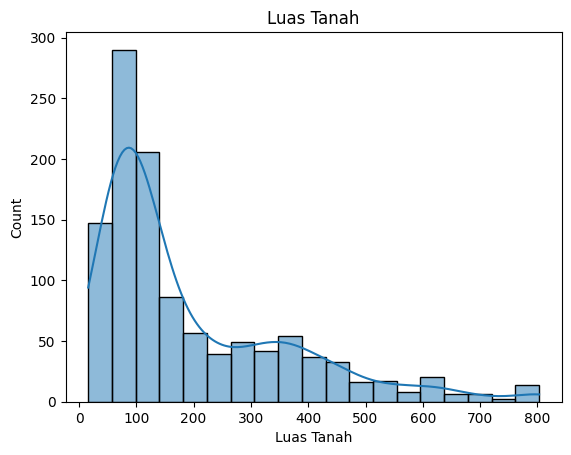

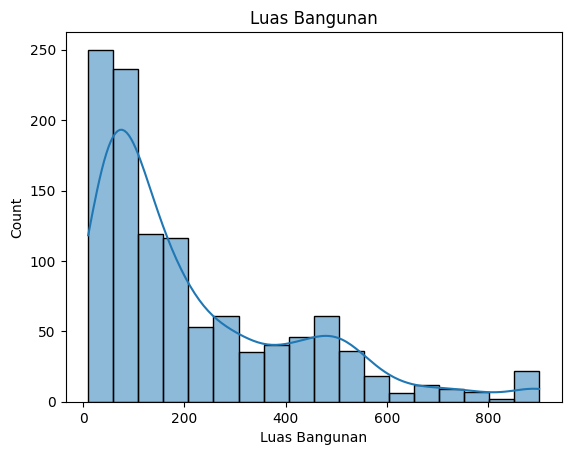

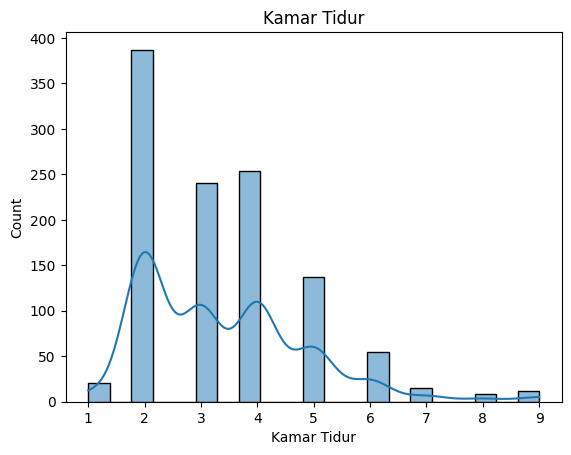

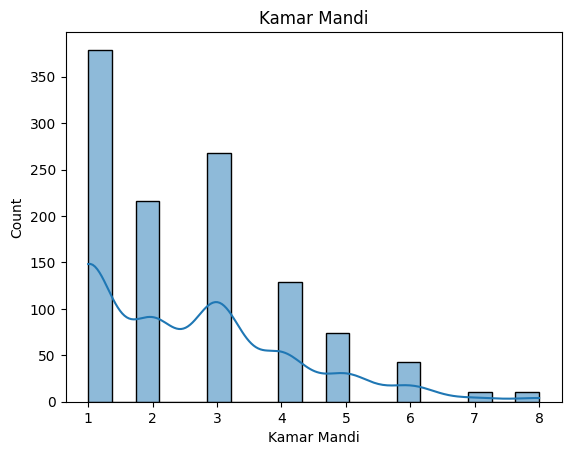

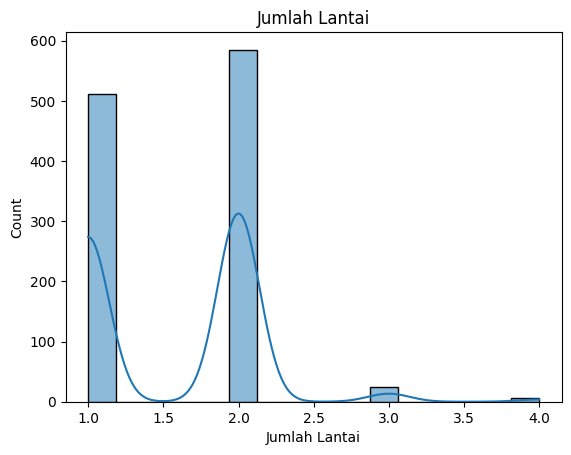

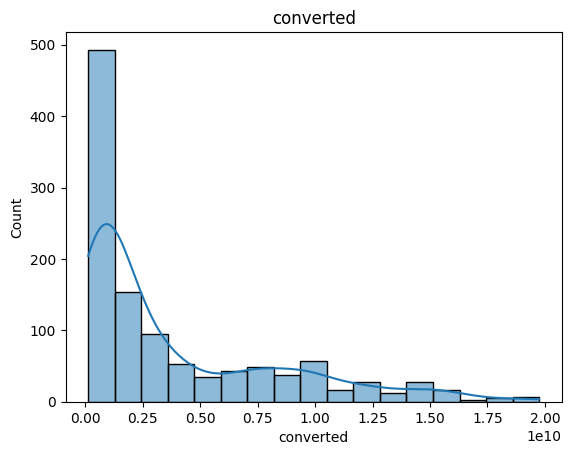

In [ ]:
get_histplot(sby_merged)

<Axes: >

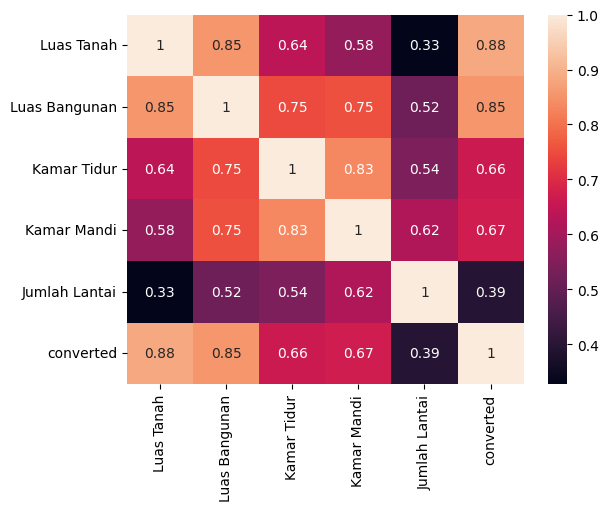

In [ ]:
get_corr(sby_merged)

In [ ]:
sby_merged.to_csv('Surabaya_merged.csv', index=False)

In [ ]:
X = sby_merged.drop(columns=['converted', 'Category', 'Harga', 'nominal', 'satuan'])
y = sby_merged['converted']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
xgb_sby = XGBRegressor(random_state=42)

In [ ]:
xgb_sby.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
xgb_sby.score(X_test, y_test)

0.8601809964940674

In [ ]:
get_model_summary(xgb_sby, X_test, y_test)

MAE: 898451188.6725664
MSE: 2.9370765678356946e+18
R-squared: 0.8601809964940674

Error for cheapest house: 734016.0
Error for most expensive house: 8960491520.0

MAPE: 29.40%


In [ ]:
sby_merged.sample(3)

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
33,177,110,3,2,1,Up-Mid,"Rp 1,85 Miliar",1.85,Miliar,1.850000e+09
125,450,600,5,3,2,Luxury,Rp 7 Miliar,7.00,Miliar,7.000000e+09
272,803,500,5,4,2,Luxury,Rp 19 Miliar,19.00,Miliar,1.900000e+10


In [ ]:
xgb_sby.predict([[240,	300,	4,	4,	2]])[0]

np.float32(5659919000.0)

In [ ]:
sby_robust = RobustScaler()
sby_minmax = MinMaxScaler()

In [ ]:
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = split_scaled(sby_merged, sby_robust, sby_minmax)

In [ ]:
xgb_sby_scaled = XGBRegressor(random_state=42)

In [ ]:
xgb_sby_scaled.fit(X_train_scaled, y_train_scaled)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
get_model_summary_scaled(xgb_sby_scaled, X_test_scaled, y_test_scaled)

MAE: 955336876.8849552
MSE: 3.508831649501422e+18
R-squared: 0.8329626983252649

Error for cheapest house: 2978144.0000008345
Error for most expensive house: 11210338560.00002

MAPE: 28.46%


In [ ]:
sby_merged.sample(3)

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
32,200,325,4,3,2,High,"Rp 5,7 Miliar",5.70,Miliar,5.700000e+09
176,81,120,4,3,2,Low-Mid,Rp 895 Juta,895.00,Juta,8.950000e+08
28,210,300,4,2,1,Up-Mid,"Rp 2,75 Miliar",2.75,Miliar,2.750000e+09


In [ ]:
test_scaled = [50,	63,	3,	2,	2, 875000000		]
test_scaled = scale_feature(sby_robust, sby_minmax, test_scaled)

In [ ]:
test_scaled

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,converted
0,-0.311111,-0.285171,0.25,0.142857,0.333333,20.589734


In [ ]:
test_scaled.drop(columns=['converted'], inplace=True)
xgb_sby_scaled.predict(test_scaled)[0]

np.float32(20.337868)

In [ ]:
y_pred_log = xgb_sby_scaled.predict(test_scaled)[0]
np.expm1(y_pred_log)

np.float32(680179840.0)

In [ ]:
sby_robust = RobustScaler()
sby_minmax = MinMaxScaler()

In [ ]:
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = split_scaled(sby_merged, sby_robust, sby_minmax)

In [ ]:
xgb_sby_scaled = XGBRegressor(objective='reg:squarederror', random_state=42)

In [ ]:
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 1]
}

In [ ]:
sby_grid_search_scaled = GridSearchCV(estimator=xgb_sby_scaled,
                           param_grid=param_grid,
                           cv=10,
                           scoring='neg_mean_squared_error',
                           n_jobs=-1,
                           verbose=2)

In [ ]:
sby_grid_search_scaled.fit(X_train_scaled, y_train_scaled)

Fitting 10 folds for each of 24 candidates, totalling 240 fits


GridSearchCV(cv=10,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None,...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=42, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1], 'max_depth': [3, 5, 7],
                         'n_estimators': [100, 200], 'subsample': [0.8, 1]},
             scoring='neg_mean_squared_error', verbose=2)

In [ ]:
sby_best_model_scaled = sby_grid_search_scaled.best_estimator_

In [ ]:
get_model_summary_scaled(sby_best_model_scaled, X_test_scaled, y_test_scaled)

MAE: 944603908.9557512
MSE: 3.2711597384734515e+18
R-squared: 0.8442770270442364

Error for cheapest house: 428735.9999990463
Error for most expensive house: 11662000128.00002

MAPE: 29.38%


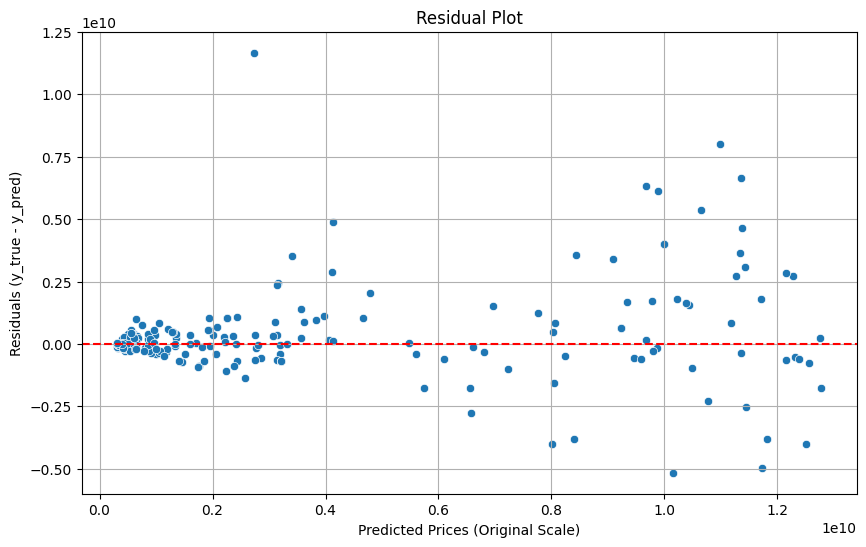

In [ ]:
# Predict log values
y_pred_log = sby_best_model_scaled.predict(X_test_scaled)

# Convert to original scale
y_test_conv = np.expm1(y_test_scaled)
y_pred = np.expm1(y_pred_log)

# Residuals
residuals = y_test_conv - y_pred

# Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_pred, y=residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Predicted Prices (Original Scale)')
plt.ylabel('Residuals (y_true - y_pred)')
plt.title('Residual Plot')
plt.grid(True)
plt.show()

In [ ]:
for true_val, pred_val in zip(y_test_conv[:10], y_pred[:10]):
    print(f"True: {true_val:.2f}, Pred: {pred_val:.2f}")

True: 4950000000.00, Pred: 3564268032.00
True: 9000000000.00, Pred: 7765367808.00
True: 8000000000.00, Pred: 11820464128.00
True: 450000000.00, Pred: 466238080.00
True: 2350000000.00, Pred: 2002418688.00
True: 761000000.00, Pred: 645514816.00
True: 4800000000.00, Pred: 3837293824.00
True: 4500000000.00, Pred: 3626409728.00
True: 11800000000.00, Pred: 12313511936.00
True: 6500000000.00, Pred: 6618953216.00


### **Bali**

In [ ]:
bali_low = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Bali_low.csv')
bali_low_mid = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Bali_low_mid.csv')
bali_up_mid = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Bali_up_mid.csv')
bali_high = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Bali_high.csv')
bali_luxury = pd.read_csv('/content/drive/MyDrive/Telkom University/Scraping Web Rumah123/re-scrape/Bali_luxury.csv')

#### bali_low

In [ ]:
bali_low['Category'] = 'Low'

In [ ]:
bali_low2 = convert_pipeline(bali_low)

In [ ]:
bali_low.shape

(215, 15)

In [ ]:
bali_low2.shape

(215, 10)

In [ ]:
bali_low2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,1
satuan,1
converted,1


In [ ]:
(bali_low2 == 0).sum()

,0
Luas Tanah,1
Luas Bangunan,0
Kamar Tidur,12
Kamar Mandi,12
Jumlah Lantai,65
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
bali_low2.dropna(inplace=True)

In [ ]:
bali_low2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,2.140000e+02
mean,81.224299,48.116822,1.901869,1.051402,0.813084,346.322430,3.463224e+08
std,60.404631,36.716403,0.631487,0.476857,0.659077,82.976912,8.297691e+07
min,0.000000,10.000000,0.000000,0.000000,0.000000,140.000000,1.400000e+08
25%,60.000000,33.000000,2.000000,1.000000,0.000000,295.000000,2.950000e+08
50%,70.000000,36.000000,2.000000,1.000000,1.000000,328.000000,3.280000e+08
75%,90.000000,45.000000,2.000000,1.000000,1.000000,400.750000,4.007500e+08
max,706.000000,350.000000,5.000000,4.000000,3.000000,500.000000,5.000000e+08


In [ ]:
bali_low2 = replace_zero(bali_low2)

In [ ]:
bali_low2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,2.140000e+02
mean,81.551402,48.116822,2.014019,1.107477,1.116822,346.322430,3.463224e+08
std,60.151723,36.716403,0.427669,0.402621,0.388082,82.976912,8.297691e+07
min,1.000000,10.000000,1.000000,1.000000,1.000000,140.000000,1.400000e+08
25%,60.000000,33.000000,2.000000,1.000000,1.000000,295.000000,2.950000e+08
50%,70.000000,36.000000,2.000000,1.000000,1.000000,328.000000,3.280000e+08
75%,90.000000,45.000000,2.000000,1.000000,1.000000,400.750000,4.007500e+08
max,706.000000,350.000000,5.000000,4.000000,3.000000,500.000000,5.000000e+08


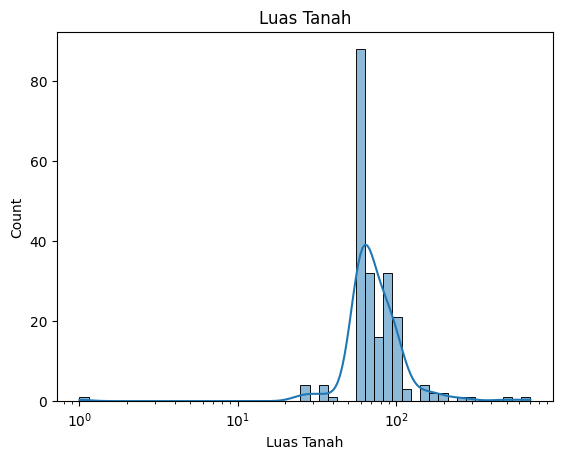

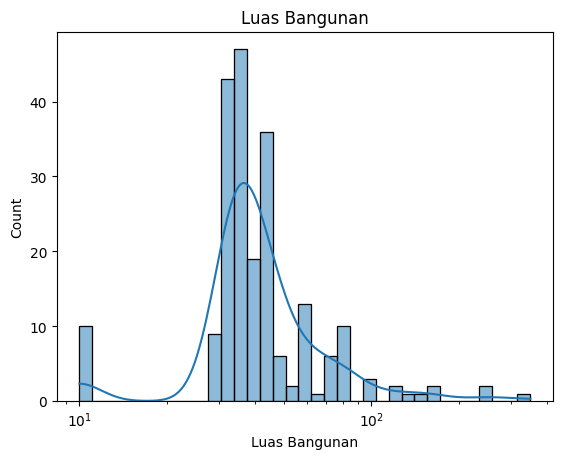

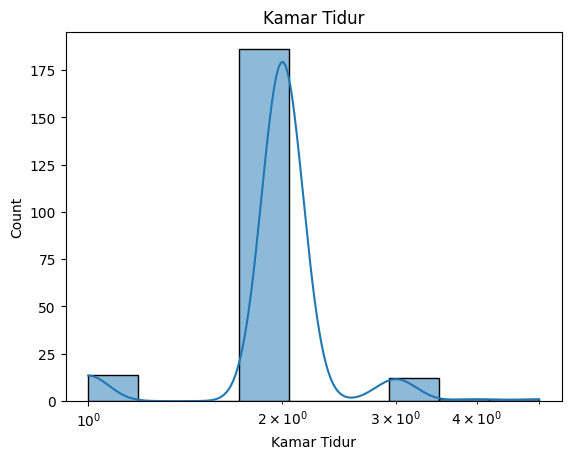

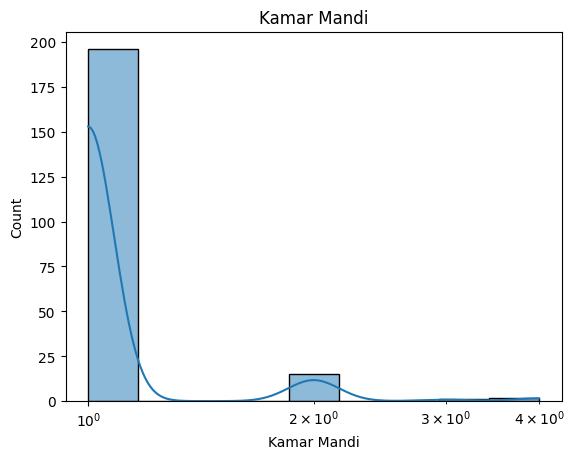

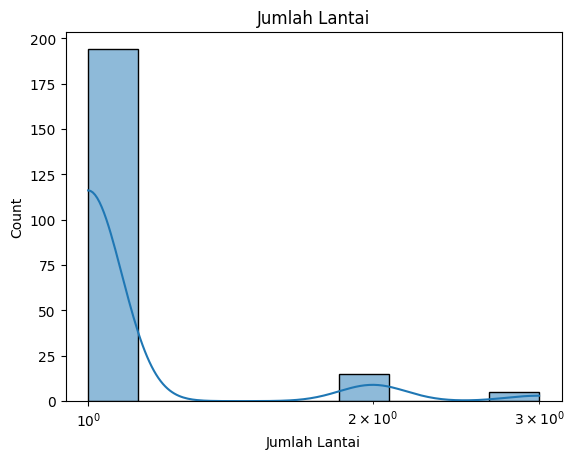

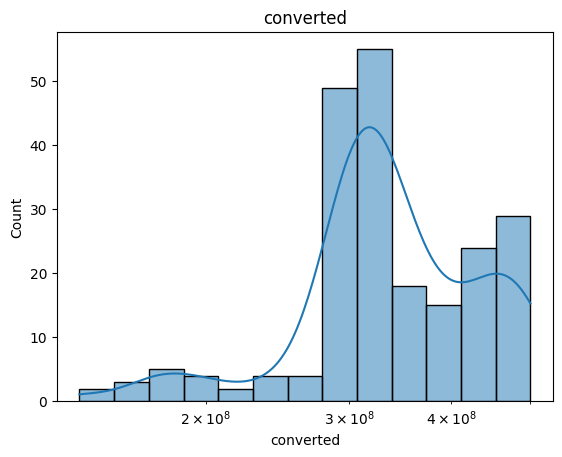

In [ ]:
get_histplot(bali_low2, log_scale=True)

In [ ]:
get_iqr(bali_low2)

{'Luas Tanah': [np.float64(15.0), np.float64(135.0)],
 'Luas Bangunan': [np.float64(15.0), np.float64(63.0)],
 'Kamar Tidur': [np.float64(2.0), np.float64(2.0)],
 'Kamar Mandi': [1, np.float64(1.0)],
 'Jumlah Lantai': [1, np.float64(1.0)],
 'converted': [np.float64(136375000.0), np.float64(559375000.0)]}

In [ ]:
get_outlier(bali_low2)

Luas Tanah -- found outliers: 13 
Luas Bangunan -- found outliers: 39 
Kamar Tidur -- found outliers: 28 
Kamar Mandi -- found outliers: 18 
Jumlah Lantai -- found outliers: 20 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
0            60             60            2            1              2   
4           100             30            1            1              2   
6           706             10            1            1              2   
7            60             33            2            1              2   
9            80             80            2            2              1   
..          ...            ...          ...          ...            ...   
176          77             10            2            1              1   
182          72            120            2            1              1   
184          60             42            2            2              1   
212         155      

In [ ]:
bali_low_cleaned = replace_outlier(bali_low2)

In [ ]:
bali_low_cleaned.shape

(214, 10)

In [ ]:
bali_low_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,214.000000,214.000000,214.0,214.0,214.0,214.000000,2.140000e+02
mean,74.878505,41.514019,2.0,1.0,1.0,346.322430,3.463224e+08
std,22.975476,12.183930,0.0,0.0,0.0,82.976912,8.297691e+07
min,15.000000,15.000000,2.0,1.0,1.0,140.000000,1.400000e+08
25%,60.000000,33.000000,2.0,1.0,1.0,295.000000,2.950000e+08
50%,70.000000,36.000000,2.0,1.0,1.0,328.000000,3.280000e+08
75%,90.000000,45.000000,2.0,1.0,1.0,400.750000,4.007500e+08
max,135.000000,63.000000,2.0,1.0,1.0,500.000000,5.000000e+08


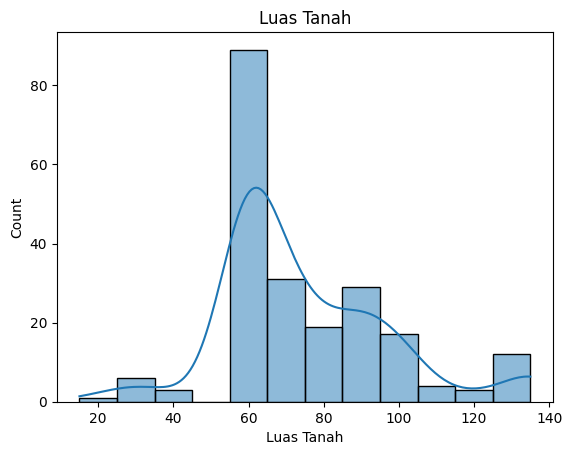

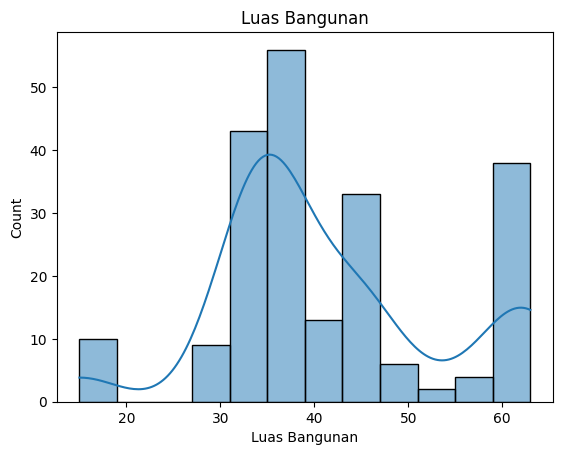

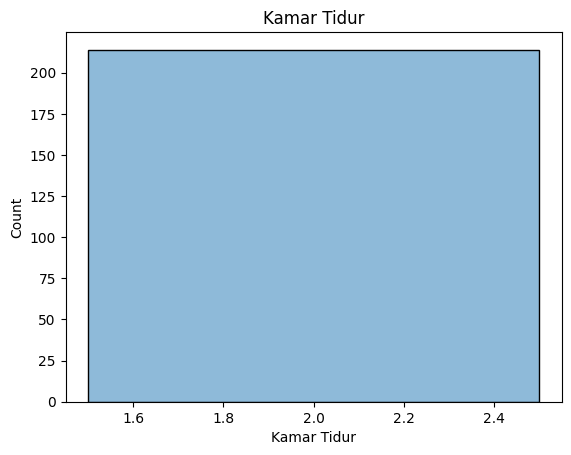

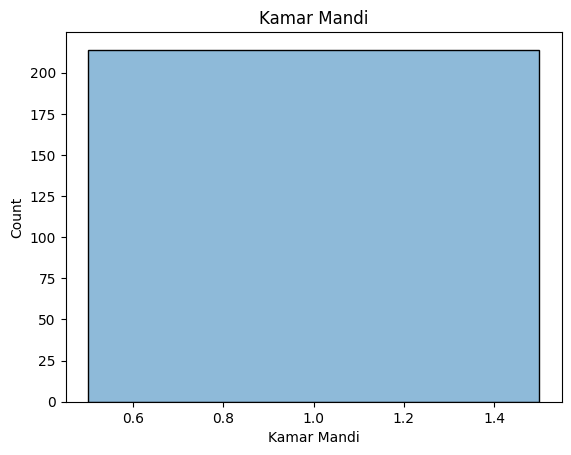

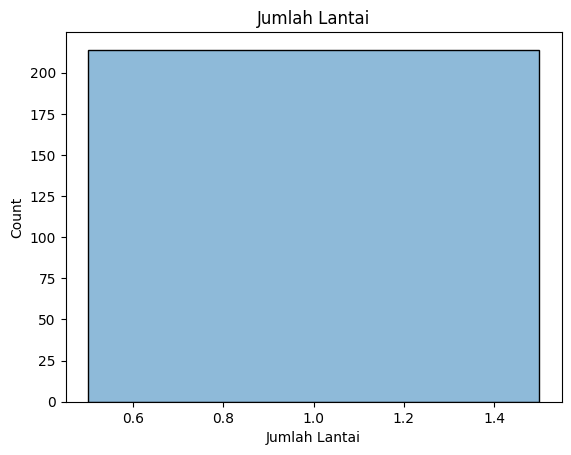

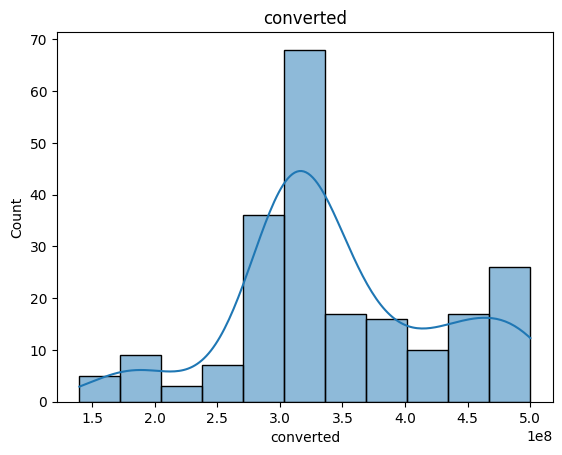

In [ ]:
get_histplot(bali_low_cleaned)

<Axes: >

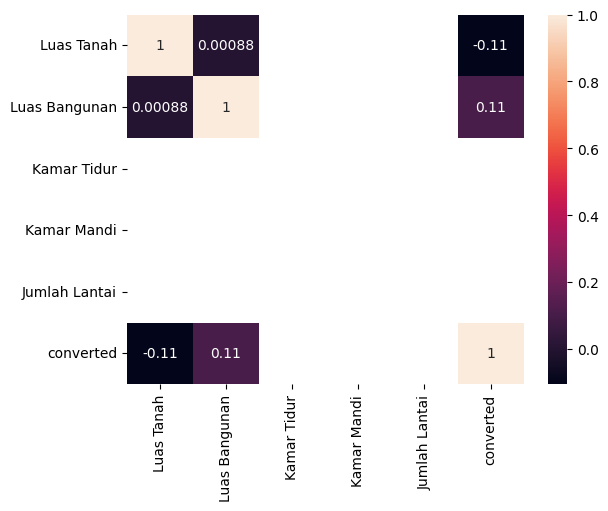

In [ ]:
get_corr(bali_low_cleaned)

<Axes: >

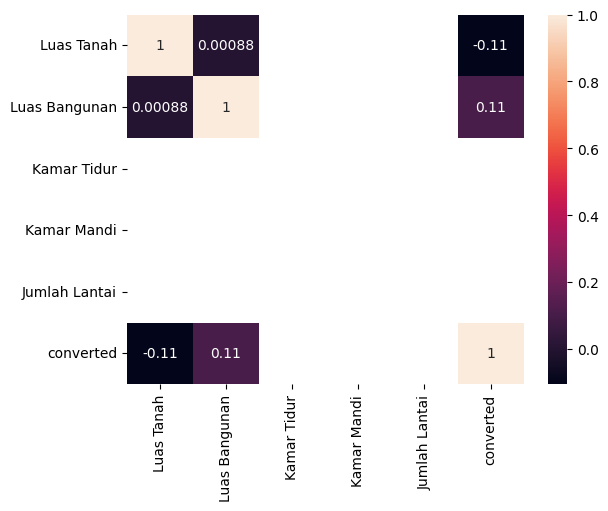

In [ ]:
get_corr(bali_low_cleaned)

#### bali_low_mid

In [ ]:
bali_low_mid2 = convert_pipeline(bali_low_mid)

In [ ]:
bali_low_mid.shape

(342, 15)

In [ ]:
bali_low_mid2.shape

(340, 10)

In [ ]:
bali_low_mid2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,2
satuan,2
converted,2


In [ ]:
(bali_low_mid2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,2
Kamar Tidur,1
Kamar Mandi,3
Jumlah Lantai,79
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
bali_low_mid2.dropna(inplace=True)

In [ ]:
bali_low_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,3.380000e+02
mean,108.991124,70.976331,2.485207,1.523669,0.961538,750.263314,8.093757e+08
std,89.335247,51.160184,0.925129,0.990025,0.654816,229.814514,1.403361e+08
min,45.000000,0.000000,0.000000,0.000000,0.000000,1.000000,5.000000e+08
25%,75.000000,45.000000,2.000000,1.000000,1.000000,670.000000,7.000000e+08
50%,100.000000,60.000000,2.000000,1.000000,1.000000,814.000000,8.500000e+08
75%,105.000000,80.000000,3.000000,2.000000,1.000000,900.000000,9.235000e+08
max,915.000000,700.000000,12.000000,12.000000,2.000000,999.000000,1.000000e+09


In [ ]:
bali_low_mid2 = replace_zero(bali_low_mid2)

In [ ]:
bali_low_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,3.380000e+02
mean,108.991124,71.331361,2.491124,1.532544,1.195266,750.263314,8.093757e+08
std,89.335247,50.872940,0.915533,0.980737,0.396993,229.814514,1.403361e+08
min,45.000000,20.000000,1.000000,1.000000,1.000000,1.000000,5.000000e+08
25%,75.000000,45.000000,2.000000,1.000000,1.000000,670.000000,7.000000e+08
50%,100.000000,60.000000,2.000000,1.000000,1.000000,814.000000,8.500000e+08
75%,105.000000,80.000000,3.000000,2.000000,1.000000,900.000000,9.235000e+08
max,915.000000,700.000000,12.000000,12.000000,2.000000,999.000000,1.000000e+09


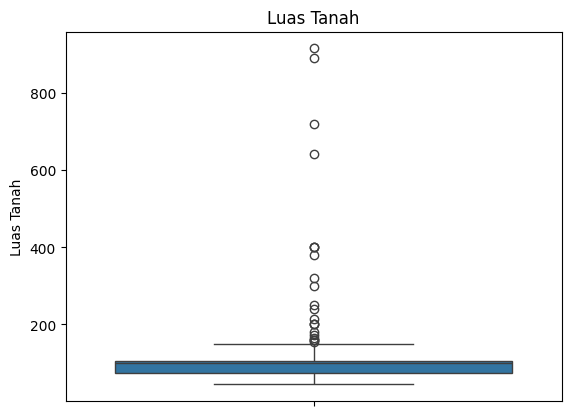

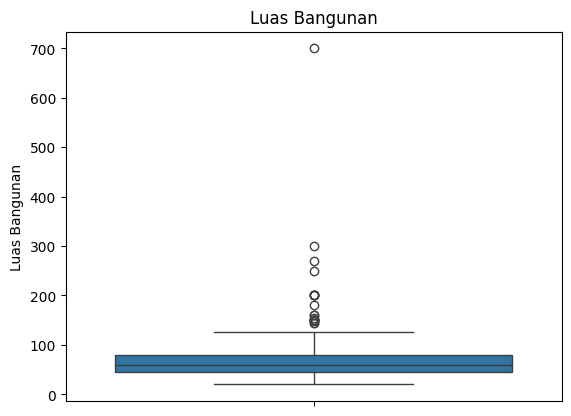

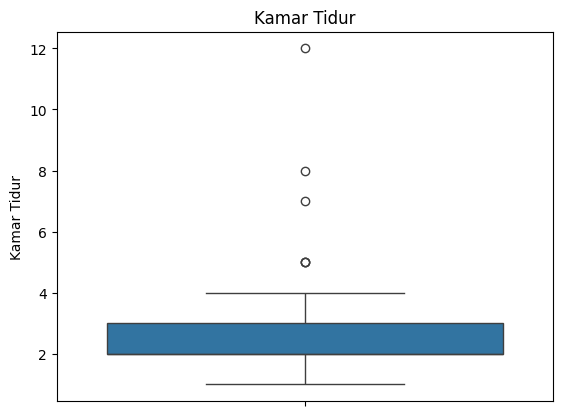

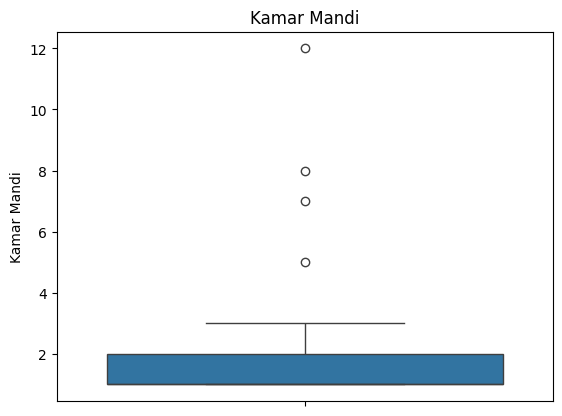

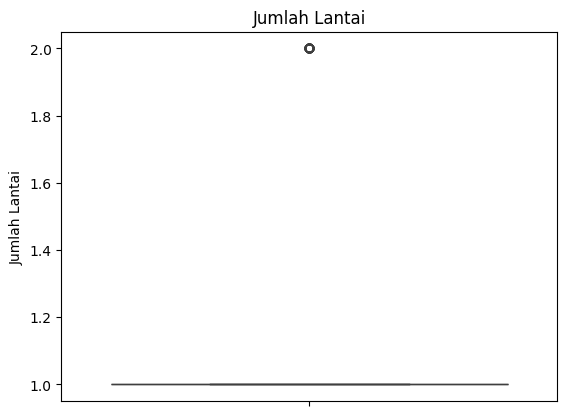

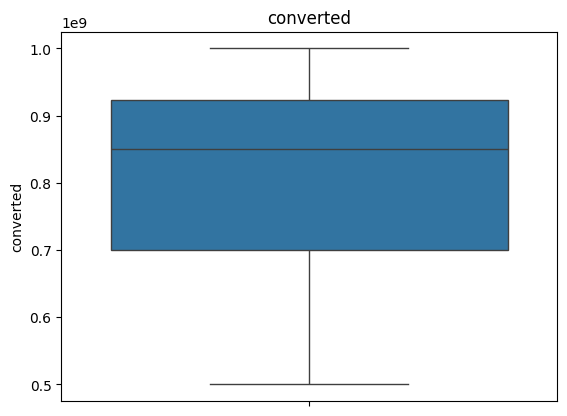

In [ ]:
get_boxplot(bali_low_mid2)

In [ ]:
get_iqr(bali_low_mid2)

{'Luas Tanah': [np.float64(30.0), np.float64(150.0)],
 'Luas Bangunan': [1, np.float64(133.0)],
 'Kamar Tidur': [1, np.float64(5.0)],
 'Kamar Mandi': [1, np.float64(4.0)],
 'Jumlah Lantai': [1, np.float64(1.0)],
 'converted': [np.float64(364750000.0), np.float64(1258750000.0)]}

In [ ]:
get_outlier(bali_low_mid2)

Luas Tanah -- found outliers: 23 
Luas Bangunan -- found outliers: 22 
Kamar Tidur -- found outliers: 3 
Kamar Mandi -- found outliers: 4 
Jumlah Lantai -- found outliers: 66 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
4           135            100            3            3              2   
5            60            120            3            2              2   
6           120             90            2            2              2   
8           915            200            3            2              1   
10          250            145            4            3              1   
..          ...            ...          ...          ...            ...   
311         180             50            2            2              1   
319         100            200            4            2              1   
321         400             60            3            1              1   
327          80        

In [ ]:
bali_low_mid_cleaned = remove_outlier(bali_low_mid2)

In [ ]:
bali_low_mid_cleaned.shape

(242, 10)

In [ ]:
bali_low_mid_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,242.000000,242.000000,242.000000,242.000000,242.0,242.000000,2.420000e+02
mean,91.355372,62.000000,2.367769,1.442149,1.0,740.991736,8.070413e+08
std,23.345452,22.062717,0.577118,0.616812,0.0,235.471347,1.384396e+08
min,45.000000,20.000000,1.000000,1.000000,1.0,1.000000,5.000000e+08
25%,73.250000,45.000000,2.000000,1.000000,1.0,662.250000,7.000000e+08
50%,95.000000,60.000000,2.000000,1.000000,1.0,806.500000,8.500000e+08
75%,100.000000,75.000000,3.000000,2.000000,1.0,895.000000,9.000000e+08
max,150.000000,125.000000,4.000000,3.000000,1.0,999.000000,1.000000e+09


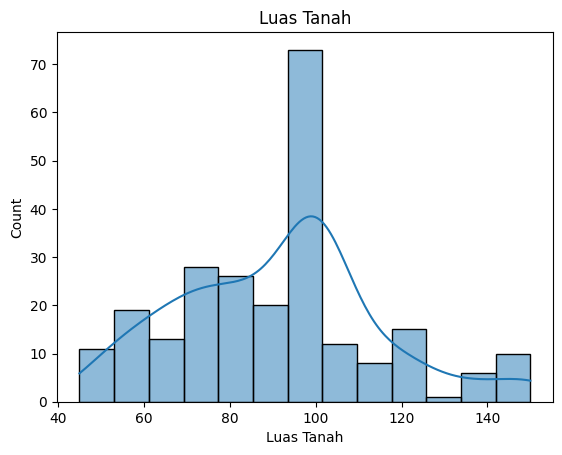

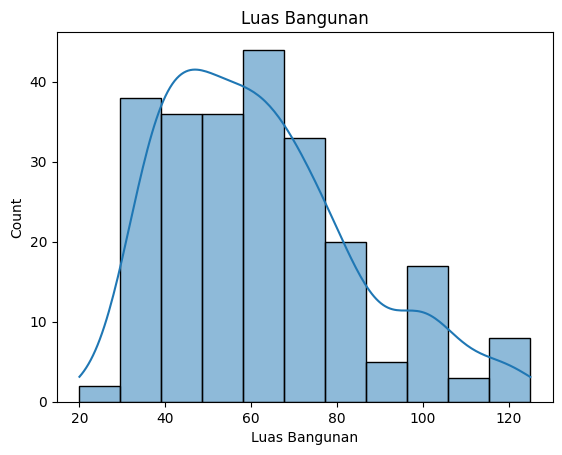

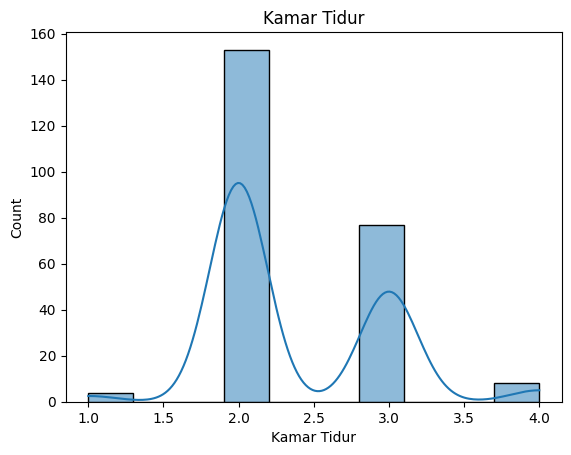

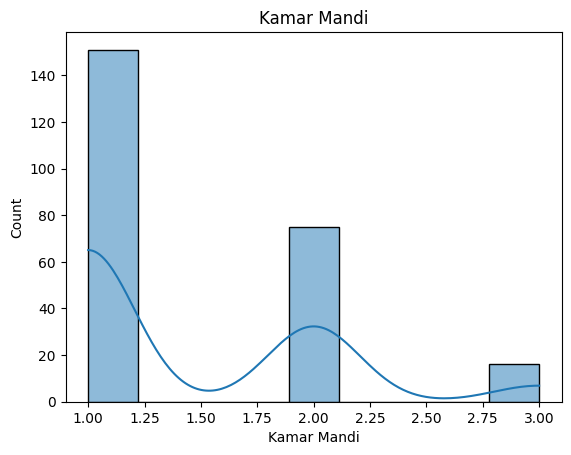

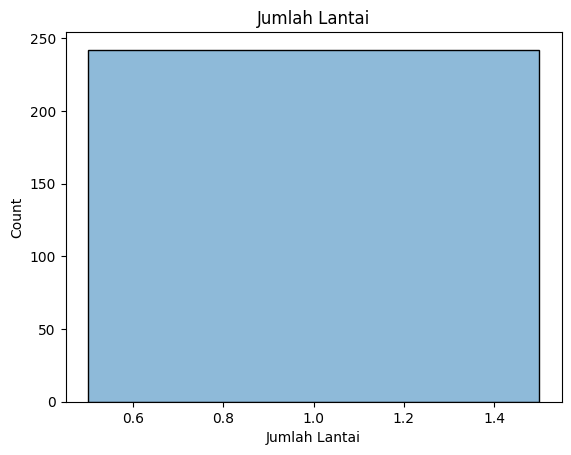

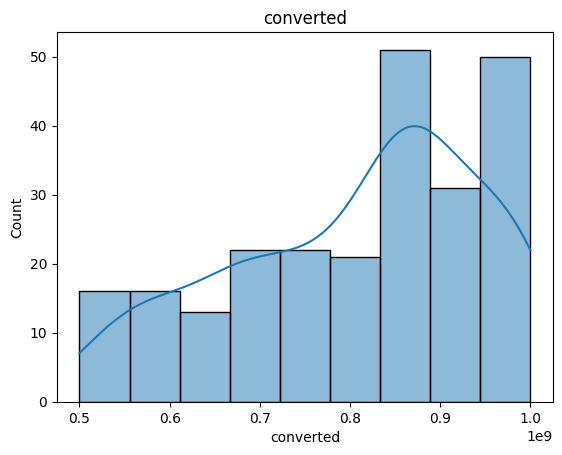

In [ ]:
get_histplot(bali_low_mid_cleaned)

<Axes: >

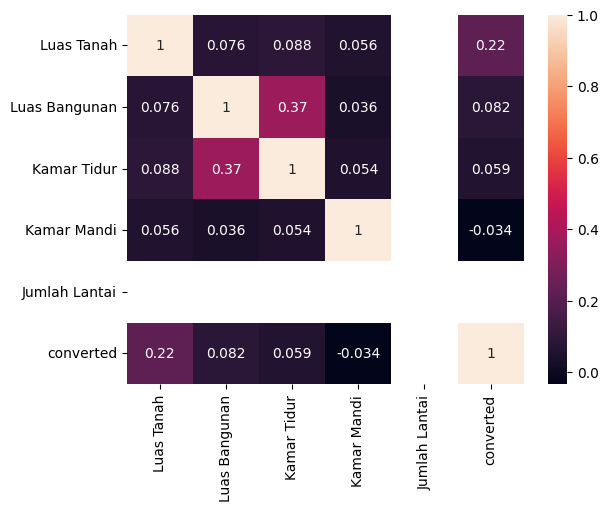

In [ ]:
get_corr(bali_low_mid_cleaned)

#### bali_up_mid

In [ ]:
bali_up_mid2 = convert_pipeline(bali_up_mid)

In [ ]:
bali_up_mid.shape

(276, 15)

In [ ]:
bali_up_mid2.shape

(276, 10)

In [ ]:
bali_up_mid2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,22
satuan,22
converted,22


In [ ]:
(bali_up_mid2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,3
Kamar Mandi,2
Jumlah Lantai,17
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
bali_up_mid2.dropna(inplace=True)

In [ ]:
bali_up_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,254.000000,254.000000,254.000000,254.000000,254.000000,254.000000,2.540000e+02
mean,141.944882,122.669291,2.748031,2.452756,1.625984,2.024882,2.024882e+09
std,122.805853,52.694294,1.005664,0.817141,0.651749,0.587632,5.876319e+08
min,8.000000,36.000000,0.000000,0.000000,0.000000,1.000000,1.000000e+09
25%,100.000000,81.250000,2.000000,2.000000,1.000000,1.527500,1.527500e+09
50%,109.000000,113.500000,3.000000,2.000000,2.000000,1.885000,1.885000e+09
75%,136.750000,150.000000,3.000000,3.000000,2.000000,2.600000,2.600000e+09
max,1311.000000,350.000000,12.000000,7.000000,3.000000,3.000000,3.000000e+09


In [ ]:
bali_up_mid2 = replace_zero(bali_up_mid2)

In [ ]:
bali_up_mid2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,254.000000,254.000000,254.000000,254.000000,254.000000,254.000000,2.540000e+02
mean,141.944882,122.669291,2.783465,2.468504,1.759843,2.024882,2.024882e+09
std,122.805853,52.694294,0.959847,0.788374,0.488405,0.587632,5.876319e+08
min,8.000000,36.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+09
25%,100.000000,81.250000,2.000000,2.000000,1.000000,1.527500,1.527500e+09
50%,109.000000,113.500000,3.000000,2.000000,2.000000,1.885000,1.885000e+09
75%,136.750000,150.000000,3.000000,3.000000,2.000000,2.600000,2.600000e+09
max,1311.000000,350.000000,12.000000,7.000000,3.000000,3.000000,3.000000e+09


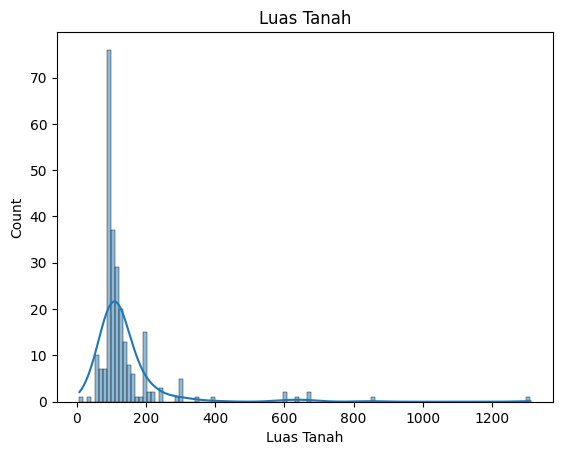

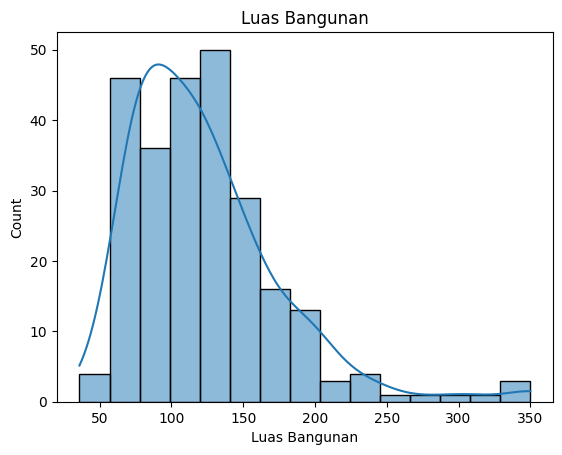

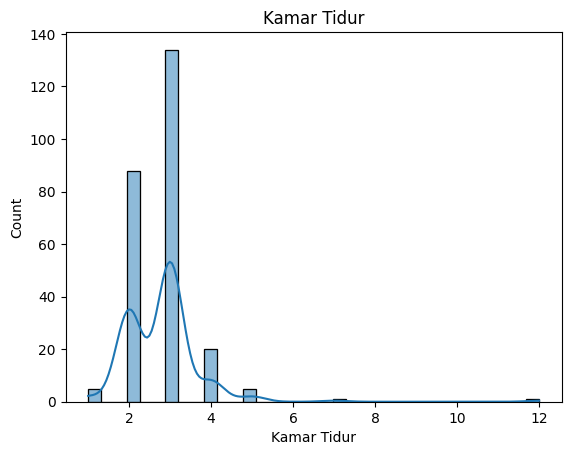

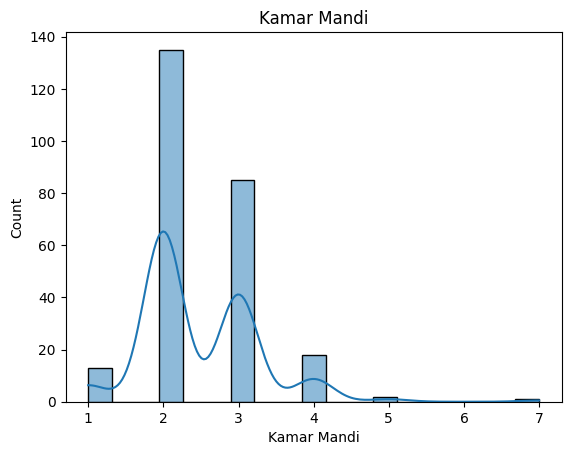

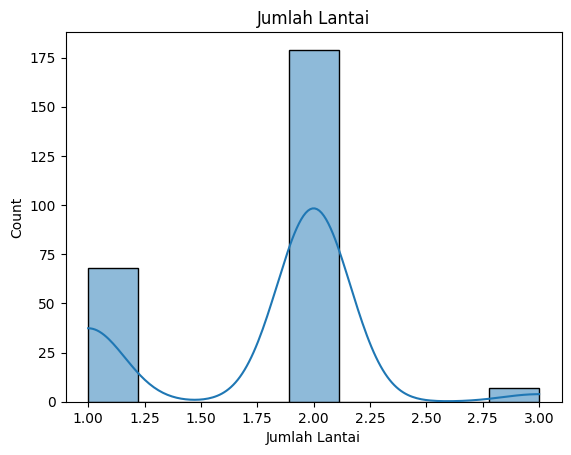

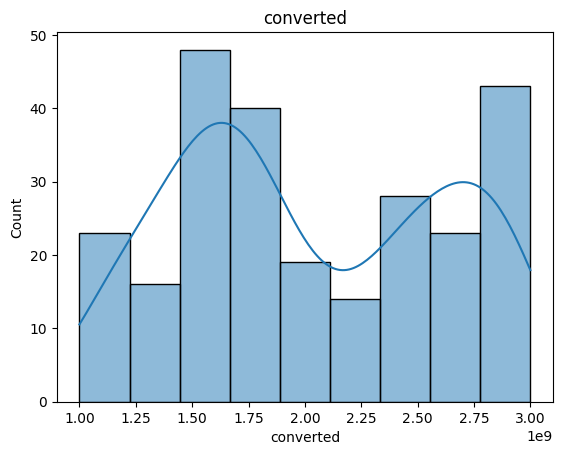

In [ ]:
get_histplot(bali_up_mid2)

In [ ]:
get_iqr(bali_up_mid2)

{'Luas Tanah': [np.float64(44.0), np.float64(192.0)],
 'Luas Bangunan': [1, np.float64(254.0)],
 'Kamar Tidur': [1, np.float64(5.0)],
 'Kamar Mandi': [1, np.float64(5.0)],
 'Jumlah Lantai': [1, np.float64(4.0)],
 'converted': [np.float64(-81250000.0), np.float64(4208750000.0)]}

In [ ]:
get_outlier(bali_up_mid2)

Luas Tanah -- found outliers: 39 
Luas Bangunan -- found outliers: 6 
Kamar Tidur -- found outliers: 2 
Kamar Mandi -- found outliers: 1 
Jumlah Lantai -- found outliers: 0 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
256         200            170            3            3              2   
1           200            150            2            2              2   
259         200            350            3            3              2   
264         200            200            4            2              2   
9           400            100            2            2              1   
267         200            100            2            3              2   
12          206            120            3            3              2   
140         200            120           12            2              2   
142         600            150            1            2              2   
18          200          

In [ ]:
bali_up_mid_cleaned = remove_outlier(bali_up_mid2)

In [ ]:
bali_up_mid_cleaned.shape

(214, 10)

In [ ]:
bali_up_mid_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,2.140000e+02
mean,109.509346,111.607477,2.714953,2.453271,1.771028,1.990981,1.990981e+09
std,22.615741,37.651792,0.710789,0.747555,0.493052,0.590361,5.903611e+08
min,60.000000,36.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+09
25%,100.000000,80.000000,2.000000,2.000000,1.000000,1.500000,1.500000e+09
50%,103.500000,101.000000,3.000000,2.000000,2.000000,1.850000,1.850000e+09
75%,121.500000,130.000000,3.000000,3.000000,2.000000,2.587500,2.587500e+09
max,185.000000,240.000000,5.000000,5.000000,3.000000,3.000000,3.000000e+09


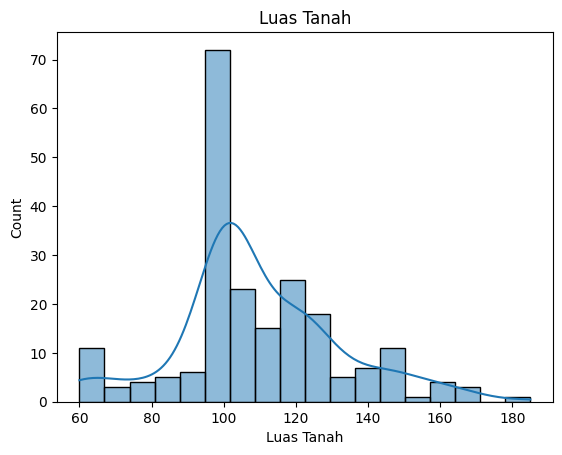

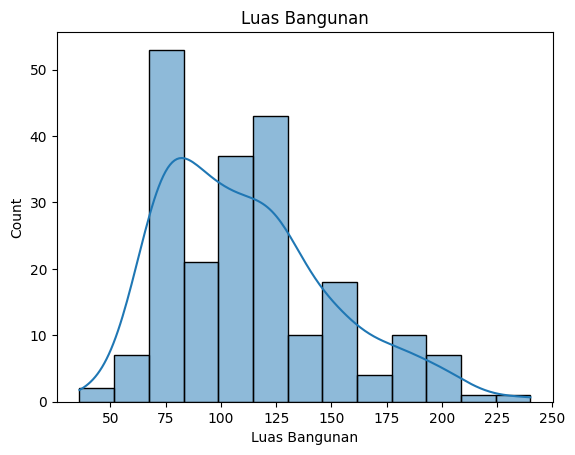

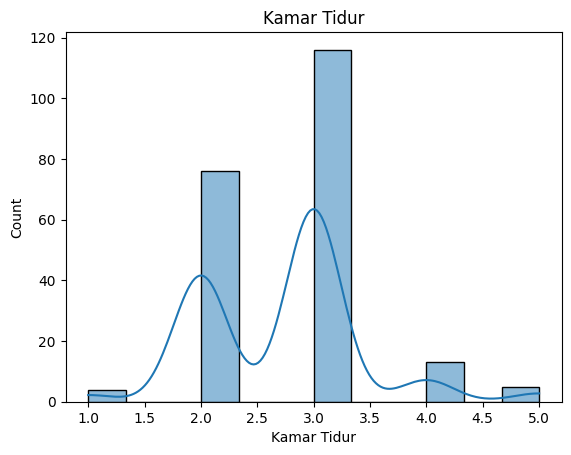

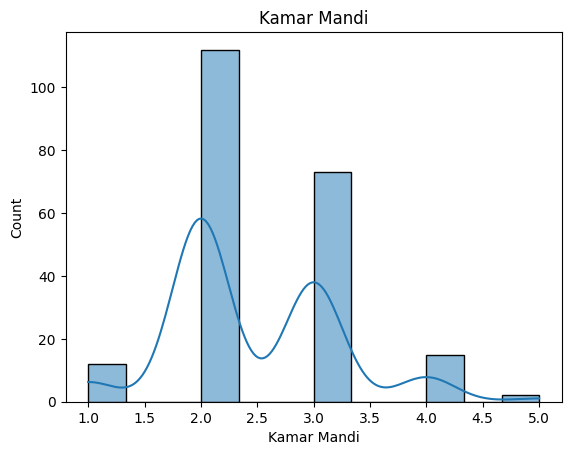

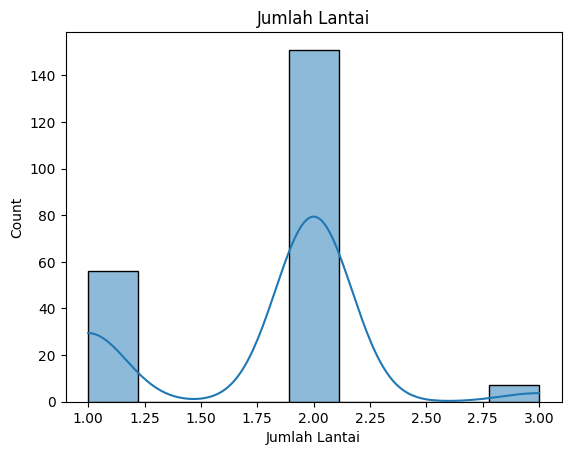

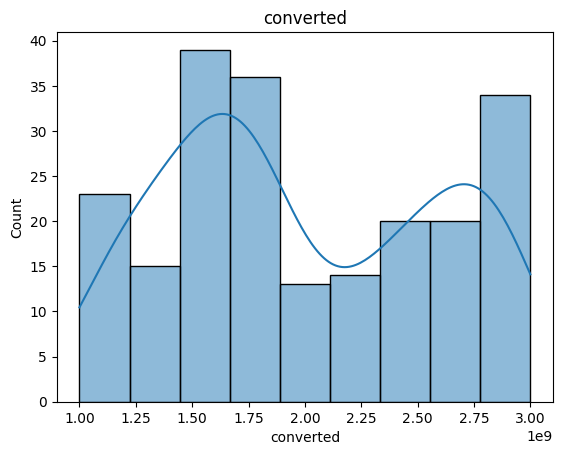

In [ ]:
get_histplot(bali_up_mid_cleaned)

<Axes: >

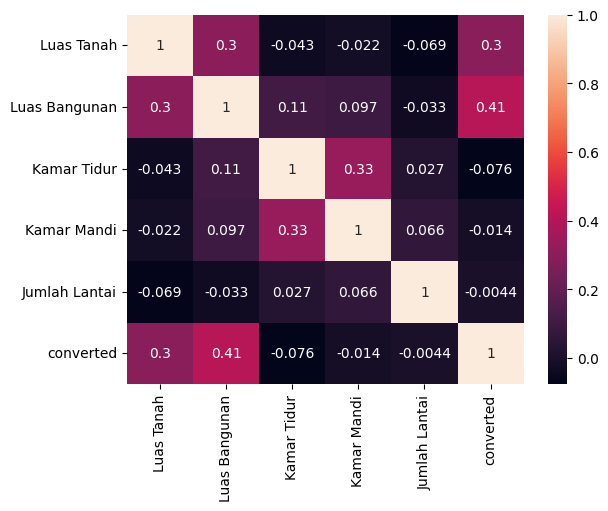

In [ ]:
get_corr(bali_up_mid_cleaned)

#### bali_high

In [ ]:
bali_high2 = convert_pipeline(bali_high)

In [ ]:
bali_high.shape

(334, 15)

In [ ]:
bali_high2.shape

(334, 10)

In [ ]:
bali_high2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,16
satuan,16
converted,16


In [ ]:
(bali_high2 == 0).sum()

,0
Luas Tanah,1
Luas Bangunan,1
Kamar Tidur,5
Kamar Mandi,4
Jumlah Lantai,23
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
bali_high2.dropna(inplace=True)

In [ ]:
bali_high2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,318.00000,318.000000,318.000000,318.000000,318.000000,318.000000,3.180000e+02
mean,251.91195,221.795597,3.141509,3.144654,1.726415,4.595881,4.595881e+09
std,219.23657,123.454863,1.443611,1.361186,0.676785,1.207080,1.207080e+09
min,0.00000,0.000000,0.000000,0.000000,0.000000,3.000000,3.000000e+09
25%,140.25000,144.000000,2.000000,2.000000,1.250000,3.500000,3.500000e+09
50%,200.00000,186.500000,3.000000,3.000000,2.000000,4.500000,4.500000e+09
75%,285.00000,258.000000,4.000000,4.000000,2.000000,5.500000,5.500000e+09
max,2500.00000,1000.000000,16.000000,16.000000,4.000000,7.000000,7.000000e+09


In [ ]:
bali_high2 = replace_zero(bali_high2)

In [ ]:
bali_high2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,318.000000,318.000000,318.000000,318.000000,318.000000,318.000000,3.180000e+02
mean,252.540881,222.380503,3.188679,3.182390,1.871069,4.595881,4.595881e+09
std,218.798057,122.839807,1.387960,1.314109,0.475633,1.207080,1.207080e+09
min,80.000000,10.000000,1.000000,1.000000,1.000000,3.000000,3.000000e+09
25%,141.000000,147.000000,2.000000,2.000000,2.000000,3.500000,3.500000e+09
50%,200.000000,187.000000,3.000000,3.000000,2.000000,4.500000,4.500000e+09
75%,285.000000,258.000000,4.000000,4.000000,2.000000,5.500000,5.500000e+09
max,2500.000000,1000.000000,16.000000,16.000000,4.000000,7.000000,7.000000e+09


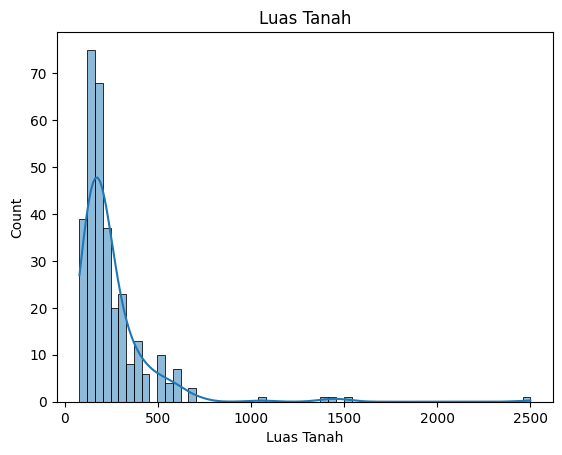

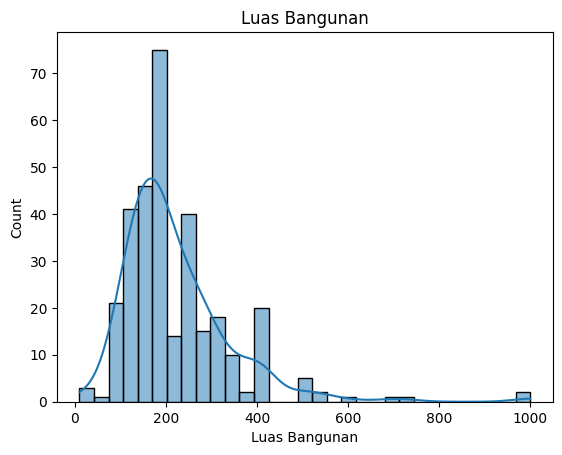

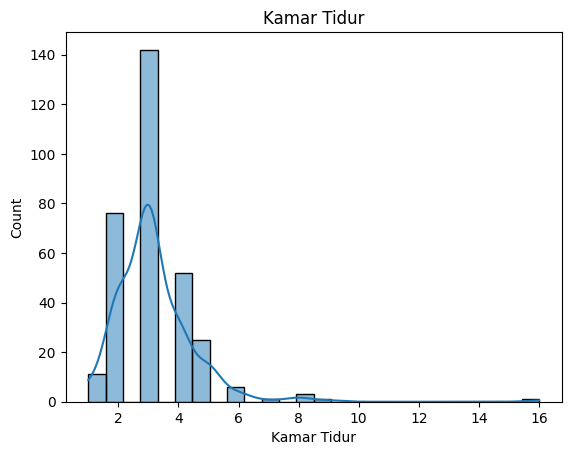

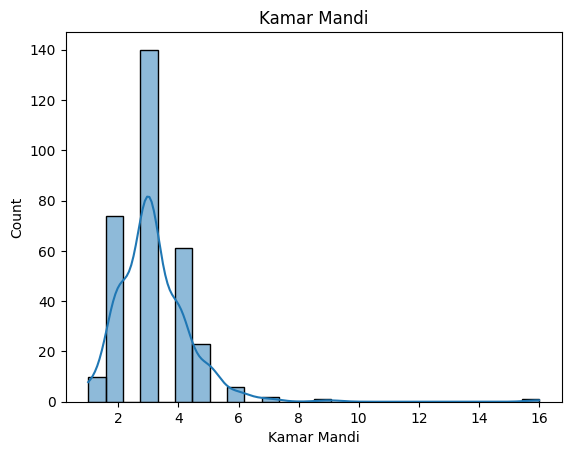

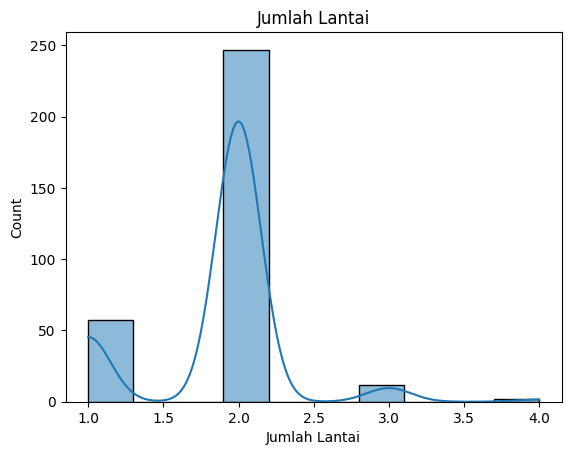

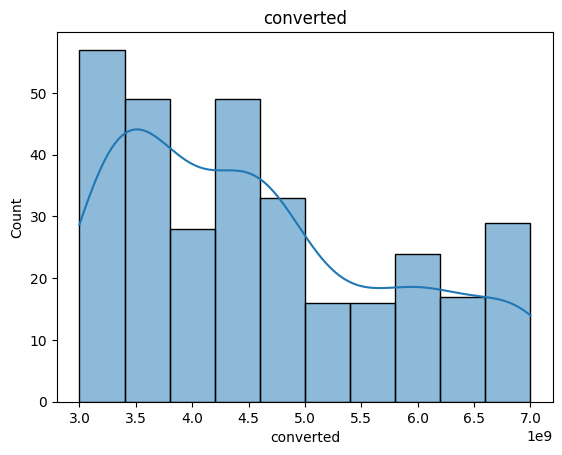

In [ ]:
get_histplot(bali_high2)

In [ ]:
get_iqr(bali_high2)

{'Luas Tanah': [1, np.float64(501.0)],
 'Luas Bangunan': [1, np.float64(425.0)],
 'Kamar Tidur': [1, np.float64(7.0)],
 'Kamar Mandi': [1, np.float64(7.0)],
 'Jumlah Lantai': [np.float64(2.0), np.float64(2.0)],
 'converted': [np.float64(500000000.0), np.float64(8500000000.0)]}

In [ ]:
get_outlier(bali_high2)

Luas Tanah -- found outliers: 20 
Luas Bangunan -- found outliers: 12 
Kamar Tidur -- found outliers: 5 
Kamar Mandi -- found outliers: 2 
Jumlah Lantai -- found outliers: 71 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
7           119             96            2            2              1   
21          119             96            2            2              1   
23          210            170            2            2              1   
24          200            188            3            3              1   
25          431            725            4            5              2   
..          ...            ...          ...          ...            ...   
304         210            180            3            2              1   
305         575            400            4            3              2   
306         370            331            3            4              1   
307          84        

In [ ]:
bali_high_cleaned = remove_outlier(bali_high2)

In [ ]:
bali_high_cleaned.shape

(225, 10)

In [ ]:
bali_high_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,225.000000,225.000000,225.000000,225.000000,225.0,225.000000,2.250000e+02
mean,209.351111,201.097778,3.017778,3.022222,2.0,4.504756,4.504756e+09
std,94.197439,81.068860,0.986355,0.979452,0.0,1.184875,1.184875e+09
min,80.000000,10.000000,1.000000,1.000000,2.0,3.000000,3.000000e+09
25%,141.000000,140.000000,2.000000,2.000000,2.0,3.500000,3.500000e+09
50%,199.000000,180.000000,3.000000,3.000000,2.0,4.350000,4.350000e+09
75%,242.000000,250.000000,3.000000,3.000000,2.0,5.300000,5.300000e+09
max,500.000000,425.000000,7.000000,7.000000,2.0,7.000000,7.000000e+09


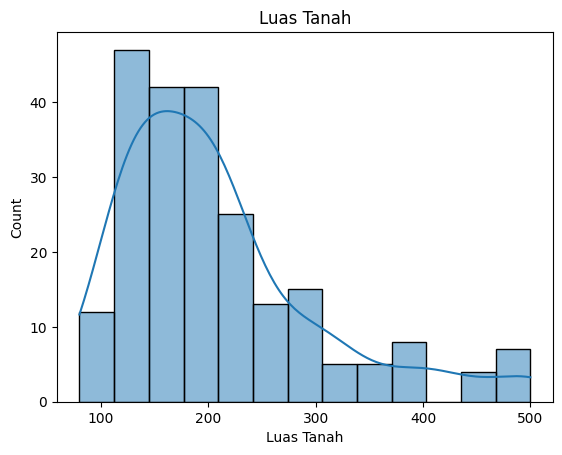

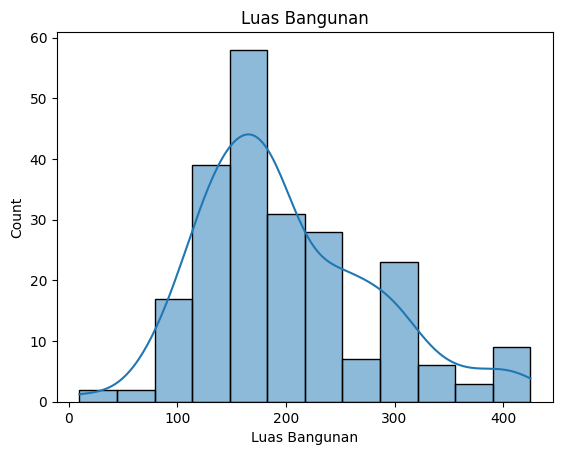

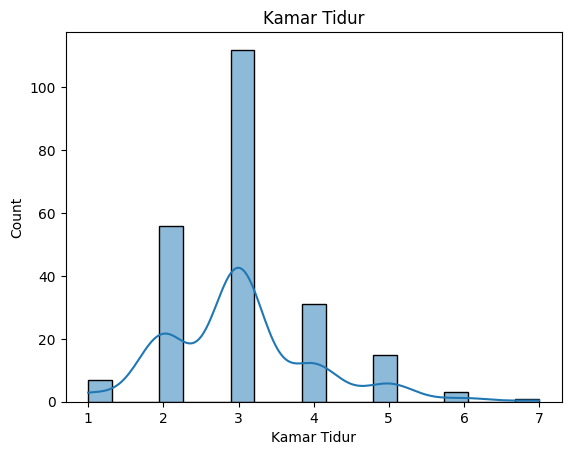

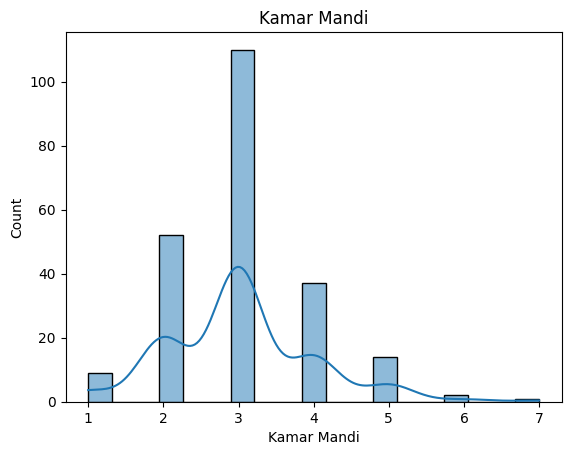

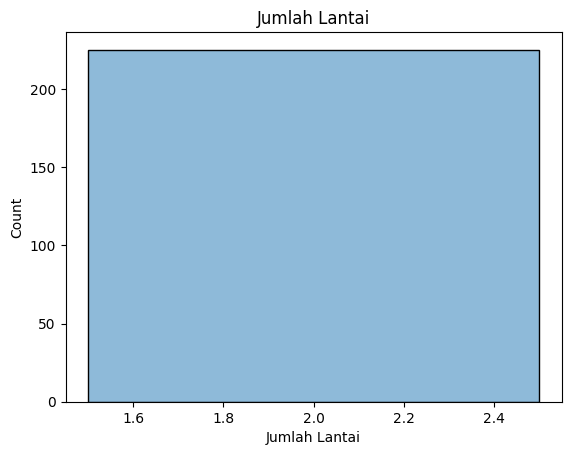

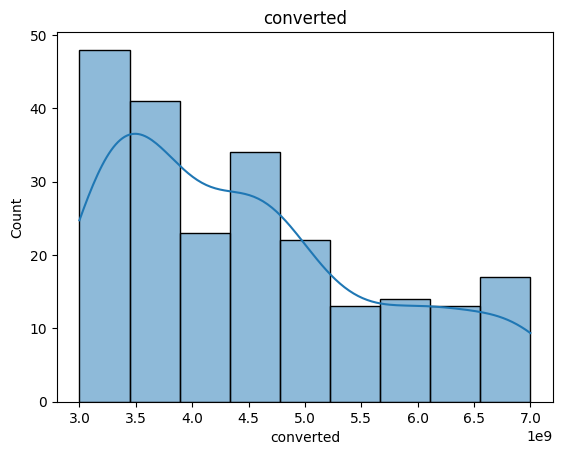

In [ ]:
get_histplot(bali_high_cleaned)

<Axes: >

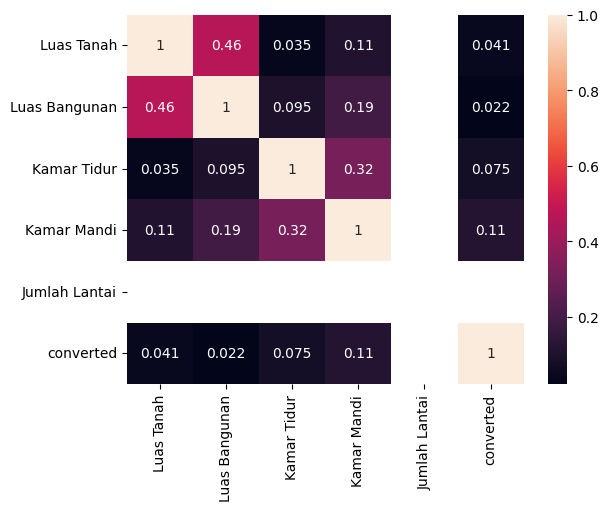

In [ ]:
get_corr(bali_high_cleaned)

#### bali_luxury

In [ ]:
bali_luxury2 = convert_pipeline(bali_luxury)

In [ ]:
bali_luxury.shape

(780, 15)

In [ ]:
bali_luxury2.shape

(769, 10)

In [ ]:
bali_luxury2.isna().sum()

,0
Luas Tanah,0
Luas Bangunan,0
Kamar Tidur,0
Kamar Mandi,0
Jumlah Lantai,0
Category,0
Harga,0
nominal,18
satuan,18
converted,18


In [ ]:
(bali_luxury2 == 0).sum()

,0
Luas Tanah,0
Luas Bangunan,1
Kamar Tidur,30
Kamar Mandi,28
Jumlah Lantai,63
Category,0
Harga,0
nominal,0
satuan,0
converted,0


In [ ]:
bali_luxury2.dropna(inplace=True)

In [ ]:
bali_luxury2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,751.000000,751.000000,751.000000,751.000000,751.000000,751.000000,7.510000e+02
mean,780.507324,580.509987,4.359521,4.402130,1.786951,11.521372,1.152137e+10
std,3000.947443,2291.550234,3.367874,2.771415,0.803253,3.681880,3.681880e+09
min,1.000000,0.000000,0.000000,0.000000,0.000000,7.000000,7.000000e+09
25%,325.000000,284.500000,3.000000,3.000000,1.000000,8.200000,8.200000e+09
50%,480.000000,400.000000,4.000000,4.000000,2.000000,11.000000,1.100000e+10
75%,675.000000,554.000000,5.000000,5.000000,2.000000,15.000000,1.500000e+10
max,73800.000000,46000.000000,55.000000,30.000000,5.000000,20.000000,2.000000e+10


In [ ]:
filt = (bali_luxury2 == 0).any(axis=1)
bali_luxury2.loc[filt]

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
717,500,650,4,5,0,Luxury,"Rp 7,5 Miliar",7.5,Miliar,7.500000e+09
718,550,211,6,11,0,Luxury,"Rp 13,5 Miliar",13.5,Miliar,1.350000e+10
719,285,250,4,4,0,Luxury,Rp 7 Miliar,7.0,Miliar,7.000000e+09
720,200,300,3,3,0,Luxury,"Rp 8,8 Miliar",8.8,Miliar,8.800000e+09
721,500,154,3,5,0,Luxury,Rp 15 Miliar,15.0,Miliar,1.500000e+10
...,...,...,...,...,...,...,...,...,...,...
775,303,300,0,0,0,Luxury,Rp 9 Miliar,9.0,Miliar,9.000000e+09
776,500,400,0,0,0,Luxury,"Rp 12,1 Miliar",12.1,Miliar,1.210000e+10
777,520,150,0,0,0,Luxury,"Rp 18,9 Miliar",18.9,Miliar,1.890000e+10
778,144,239,0,0,0,Luxury,"Rp 8,9 Miliar",8.9,Miliar,8.900000e+09


In [ ]:
bali_luxury2 = bali_luxury2[~filt]

In [ ]:
bali_luxury2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,688.000000,688.000000,688.000000,688.000000,688.000000,688.000000,6.880000e+02
mean,805.392442,595.161337,4.555233,4.585756,1.950581,11.536439,1.153644e+10
std,3132.625456,2392.507117,3.377703,2.719529,0.620278,3.701040,3.701040e+09
min,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000,7.000000e+09
25%,330.000000,286.500000,3.000000,3.000000,2.000000,8.187500,8.187500e+09
50%,490.000000,400.000000,4.000000,4.000000,2.000000,11.000000,1.100000e+10
75%,676.250000,558.500000,5.000000,5.000000,2.000000,15.000000,1.500000e+10
max,73800.000000,46000.000000,55.000000,30.000000,5.000000,20.000000,2.000000e+10


In [ ]:
bali_luxury2

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
1,1000,370,7,7,1,Luxury,"Rp 12,9 Miliar",12.90,Miliar,1.290000e+10
2,1000,800,5,5,2,Luxury,Rp 8 Miliar,8.00,Miliar,8.000000e+09
3,5500,770,6,7,2,Luxury,Rp 14 Miliar,14.00,Miliar,1.400000e+10
5,400,400,4,4,2,Luxury,"Rp 16,8 Miliar",16.80,Miliar,1.680000e+10
6,500,300,5,5,2,Luxury,Rp 10 Miliar,10.00,Miliar,1.000000e+10
...,...,...,...,...,...,...,...,...,...,...
712,350,436,4,2,2,Luxury,Rp 16 Miliar,16.00,Miliar,1.600000e+10
713,405,600,4,4,2,Luxury,"Rp 8,8 Miliar",8.80,Miliar,8.800000e+09
714,375,133,4,3,2,Luxury,Rp 16 Miliar,16.00,Miliar,1.600000e+10
715,266,250,6,4,2,Luxury,Rp 8 Miliar,8.00,Miliar,8.000000e+09


In [ ]:
bali_luxury2.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,688.000000,688.000000,688.000000,688.000000,688.000000,688.000000,6.880000e+02
mean,805.392442,595.161337,4.555233,4.585756,1.950581,11.536439,1.153644e+10
std,3132.625456,2392.507117,3.377703,2.719529,0.620278,3.701040,3.701040e+09
min,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000,7.000000e+09
25%,330.000000,286.500000,3.000000,3.000000,2.000000,8.187500,8.187500e+09
50%,490.000000,400.000000,4.000000,4.000000,2.000000,11.000000,1.100000e+10
75%,676.250000,558.500000,5.000000,5.000000,2.000000,15.000000,1.500000e+10
max,73800.000000,46000.000000,55.000000,30.000000,5.000000,20.000000,2.000000e+10


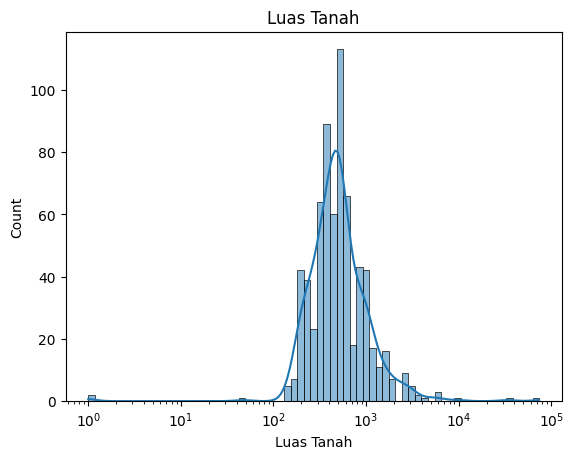

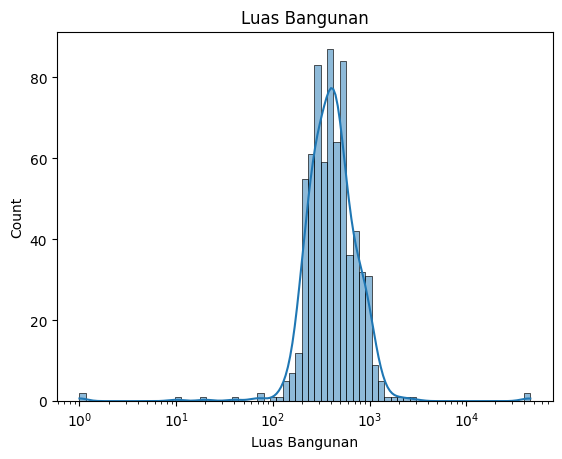

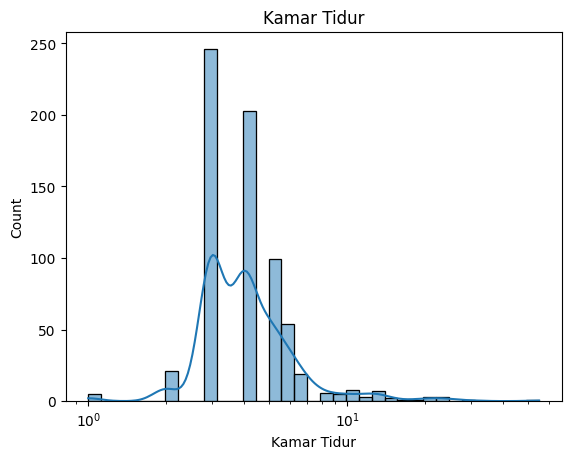

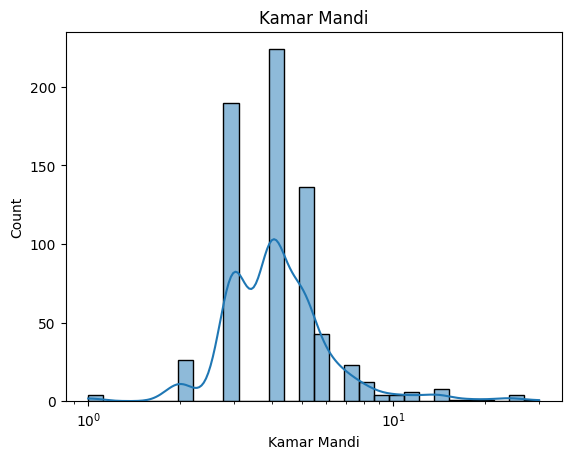

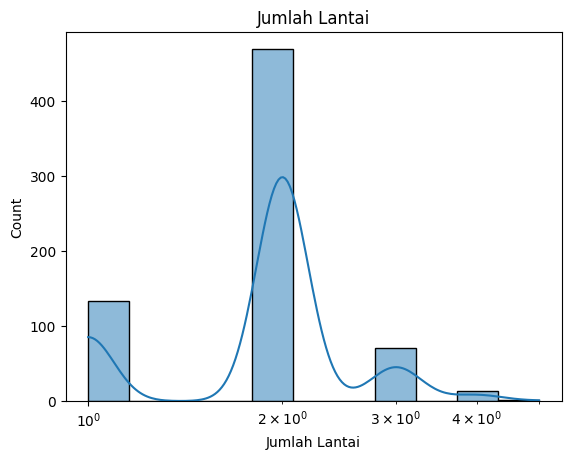

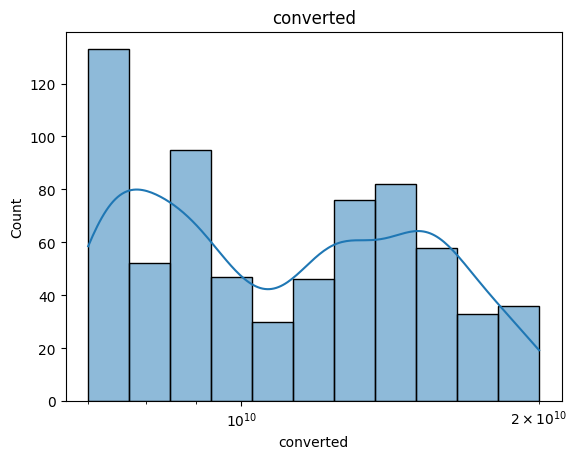

In [ ]:
get_histplot(bali_luxury2, log_scale=True)

In [ ]:
get_iqr(bali_luxury2)

{'Luas Tanah': [1, np.float64(1196.0)],
 'Luas Bangunan': [1, np.float64(967.0)],
 'Kamar Tidur': [1, np.float64(8.0)],
 'Kamar Mandi': [1, np.float64(8.0)],
 'Jumlah Lantai': [np.float64(2.0), np.float64(2.0)],
 'converted': [np.float64(-2031250000.0000029), np.float64(25218750000.0)]}

In [ ]:
get_outlier(bali_luxury2)

Luas Tanah -- found outliers: 65 
Luas Bangunan -- found outliers: 42 
Kamar Tidur -- found outliers: 35 
Kamar Mandi -- found outliers: 30 
Jumlah Lantai -- found outliers: 219 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
1          1000            370            7            7              1   
3          5500            770            6            7              2   
7           500            300            3            3              1   
10          400            450            3            3              1   
14          490            265            4            4              1   
..          ...            ...          ...          ...            ...   
707         250            420            3            3              3   
708         443            204           14            4              2   
709         204            360            3            3              3   
710         550     

In [ ]:
bali_luxury_cleaned = remove_outlier(bali_luxury2)

In [ ]:
bali_luxury_cleaned.shape

(371, 10)

In [ ]:
bali_luxury_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,371.000000,371.000000,371.000000,371.000000,371.0,371.000000,3.710000e+02
mean,480.506739,419.471698,3.983827,4.088949,2.0,11.263073,1.126307e+10
std,229.352595,188.624068,1.185387,1.212619,0.0,3.467980,3.467980e+09
min,1.000000,1.000000,1.000000,1.000000,2.0,7.000000,7.000000e+09
25%,300.000000,285.000000,3.000000,3.000000,2.0,8.020000,8.020000e+09
50%,460.000000,400.000000,4.000000,4.000000,2.0,10.500000,1.050000e+10
75%,600.000000,500.000000,5.000000,5.000000,2.0,14.500000,1.450000e+10
max,1190.000000,950.000000,8.000000,8.000000,2.0,20.000000,2.000000e+10


In [ ]:
filt = (bali_luxury_cleaned['Luas Tanah'] ==  1) | (bali_luxury_cleaned['Luas Bangunan'] == 1)
bali_luxury_cleaned[filt]

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
272,330,1,3,3,2,Luxury,Rp 7 Miliar,7.00,Miliar,7.000000e+09
433,1,408,3,4,2,Luxury,"Rp 7,28 Miliar",7.28,Miliar,7.280000e+09
661,402,1,4,4,2,Luxury,Rp 15 Miliar,15.00,Miliar,1.500000e+10


In [ ]:
bali_luxury_cleaned.drop(bali_luxury_cleaned[filt].index, inplace=True)

In [ ]:
bali_luxury_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,368.000000,368.000000,368.000000,368.000000,368.0,368.000000,3.680000e+02
mean,482.432065,421.777174,3.989130,4.092391,2.0,11.275326,1.127533e+10
std,228.744115,186.841813,1.187992,1.216215,0.0,3.463272,3.463272e+09
min,150.000000,20.000000,1.000000,1.000000,2.0,7.000000,7.000000e+09
25%,300.000000,285.000000,3.000000,3.000000,2.0,8.122500,8.122500e+09
50%,460.000000,400.000000,4.000000,4.000000,2.0,10.500000,1.050000e+10
75%,600.000000,500.000000,5.000000,5.000000,2.0,14.500000,1.450000e+10
max,1190.000000,950.000000,8.000000,8.000000,2.0,20.000000,2.000000e+10


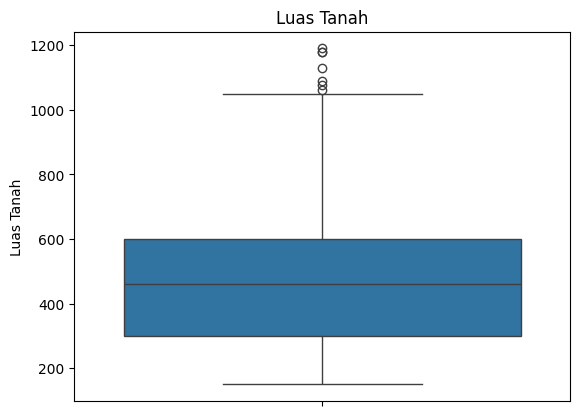

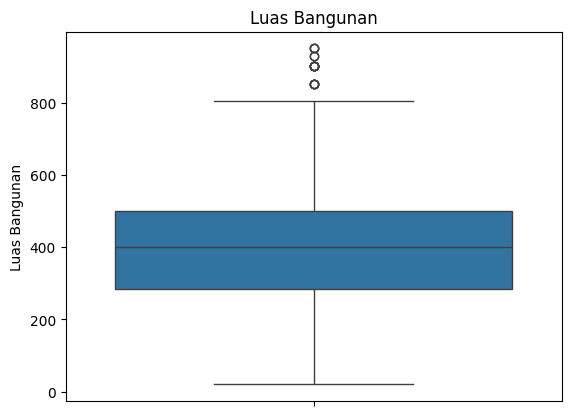

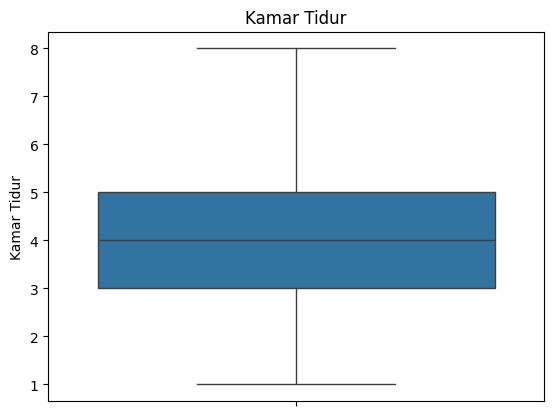

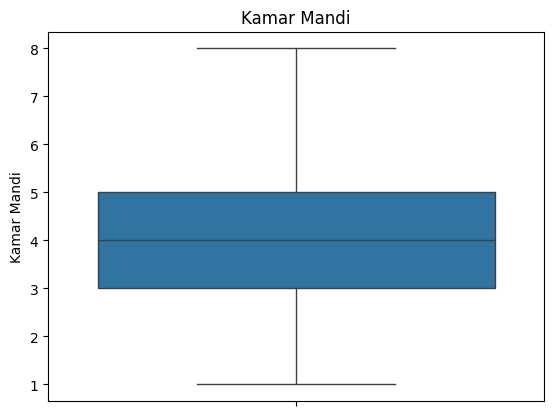

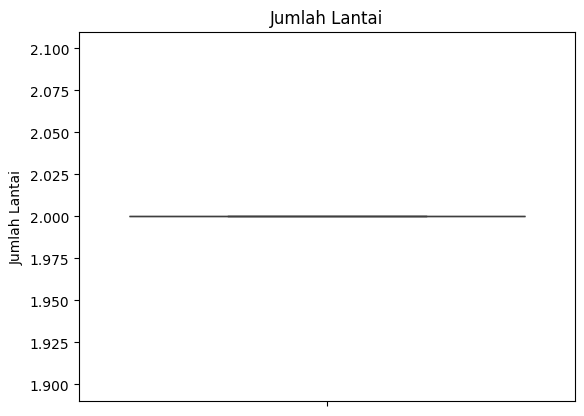

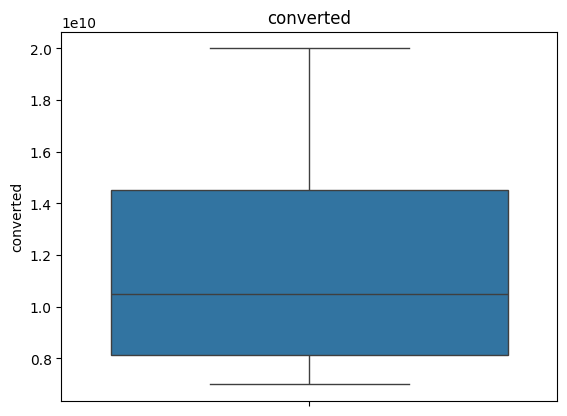

In [ ]:
get_boxplot(bali_luxury_cleaned)

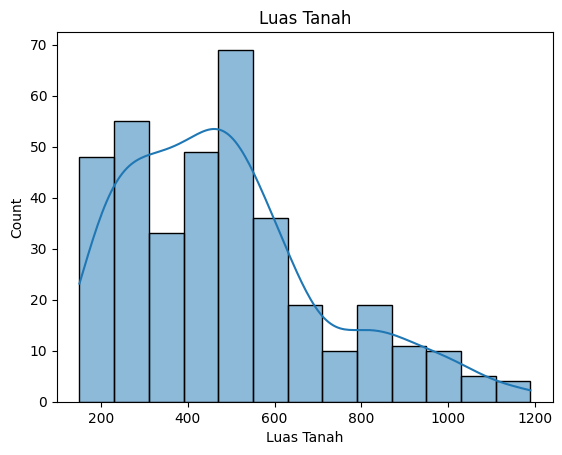

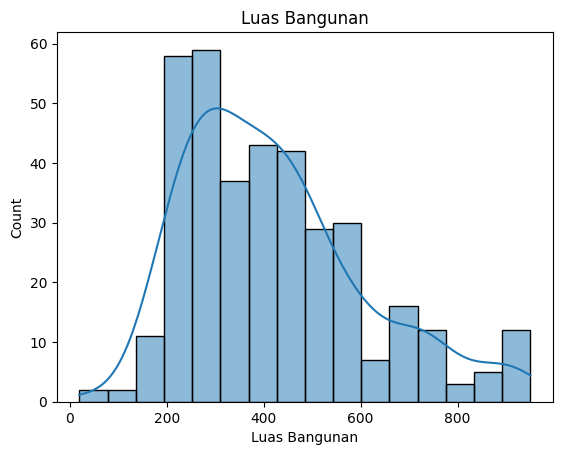

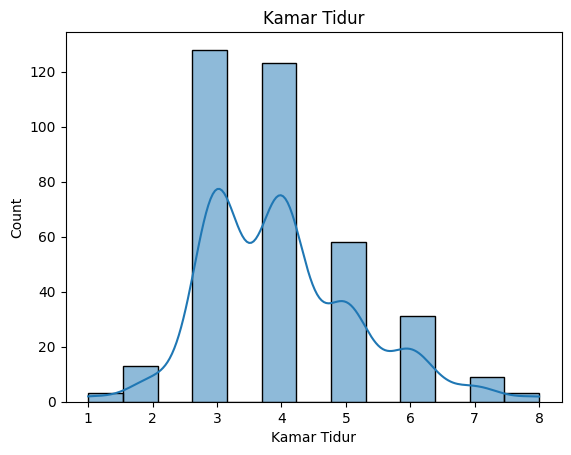

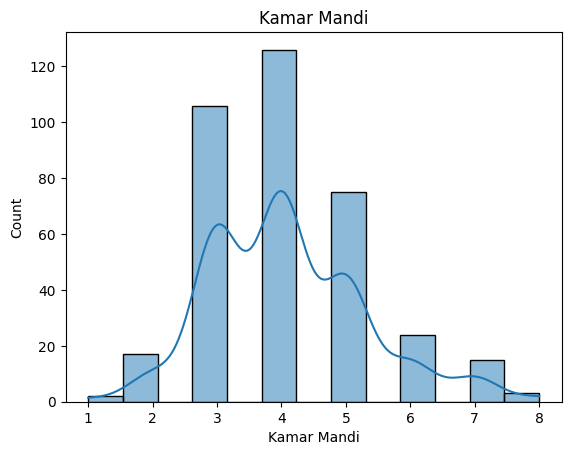

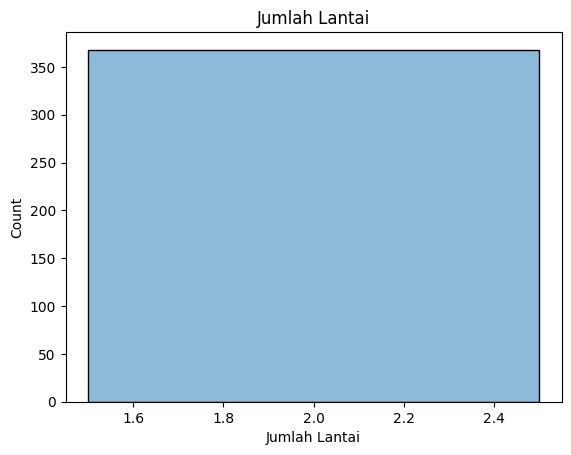

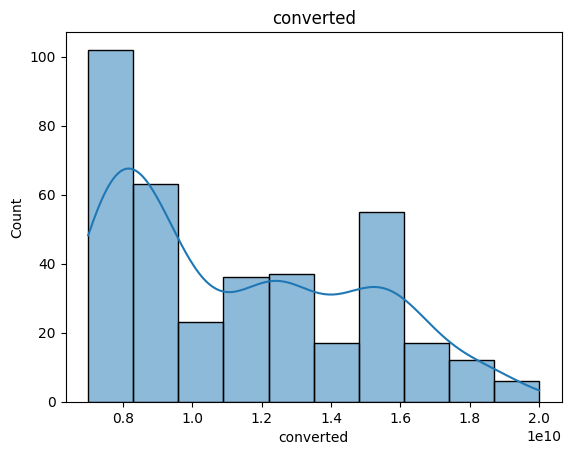

In [ ]:
get_histplot(bali_luxury_cleaned)

In [ ]:
bali_luxury_cleaned.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,368.000000,368.000000,368.000000,368.000000,368.0,368.000000,3.680000e+02
mean,482.432065,421.777174,3.989130,4.092391,2.0,11.275326,1.127533e+10
std,228.744115,186.841813,1.187992,1.216215,0.0,3.463272,3.463272e+09
min,150.000000,20.000000,1.000000,1.000000,2.0,7.000000,7.000000e+09
25%,300.000000,285.000000,3.000000,3.000000,2.0,8.122500,8.122500e+09
50%,460.000000,400.000000,4.000000,4.000000,2.0,10.500000,1.050000e+10
75%,600.000000,500.000000,5.000000,5.000000,2.0,14.500000,1.450000e+10
max,1190.000000,950.000000,8.000000,8.000000,2.0,20.000000,2.000000e+10


In [ ]:
get_iqr(bali_luxury_cleaned)

{'Luas Tanah': [1, np.float64(1050.0)],
 'Luas Bangunan': [1, np.float64(823.0)],
 'Kamar Tidur': [1, np.float64(8.0)],
 'Kamar Mandi': [1, np.float64(8.0)],
 'Jumlah Lantai': [np.float64(2.0), np.float64(2.0)],
 'converted': [np.float64(-1443750000.0), np.float64(24066250000.0)]}

In [ ]:
get_outlier(bali_luxury_cleaned)

Luas Tanah -- found outliers: 7 
Luas Bangunan -- found outliers: 17 
Kamar Tidur -- found outliers: 0 
Kamar Mandi -- found outliers: 0 
Jumlah Lantai -- found outliers: 0 
converted -- found outliers: 0 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
147        1060            350            4            4              2   
284         300            950            4            4              2   
287        1075            506            3            4              2   
417         638            850            7            6              2   
165         250            850            4            4              2   
38          556            930            6            6              2   
166         635            850            4            4              2   
304        1190            420            4            5              2   
305         332            950            4            5              2   
689         500          

In [ ]:
filt = (bali_luxury_cleaned['Luas Tanah'] <  1)  | (bali_luxury_cleaned['Luas Tanah'] > 1050.0) | (bali_luxury_cleaned['Luas Bangunan'] <  1)  | (bali_luxury_cleaned['Luas Bangunan'] > 823.0)
bali_luxury_cleaned[filt]

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
38,556,930,6,6,2,Luxury,Rp 11 Miliar,11.00,Miliar,1.100000e+10
53,480,900,6,6,2,Luxury,"Rp 10,5 Miliar",10.50,Miliar,1.050000e+10
70,300,930,3,3,2,Luxury,"Rp 7,25 Miliar",7.25,Miliar,7.250000e+09
94,1130,250,3,3,2,Luxury,Rp 15 Miliar,15.00,Miliar,1.500000e+10
111,761,850,4,4,2,Luxury,Rp 18 Miliar,18.00,Miliar,1.800000e+10
120,1180,420,4,5,2,Luxury,Rp 15 Miliar,15.00,Miliar,1.500000e+10
126,1180,363,3,7,2,Luxury,Rp 15 Miliar,15.00,Miliar,1.500000e+10
147,1060,350,4,4,2,Luxury,Rp 16 Miliar,16.00,Miliar,1.600000e+10
165,250,850,4,4,2,Luxury,Rp 7 Miliar,7.00,Miliar,7.000000e+09
166,635,850,4,4,2,Luxury,"Rp 12,8 Miliar",12.80,Miliar,1.280000e+10


In [ ]:
bali_luxury_cleaned.shape

(368, 10)

<Axes: >

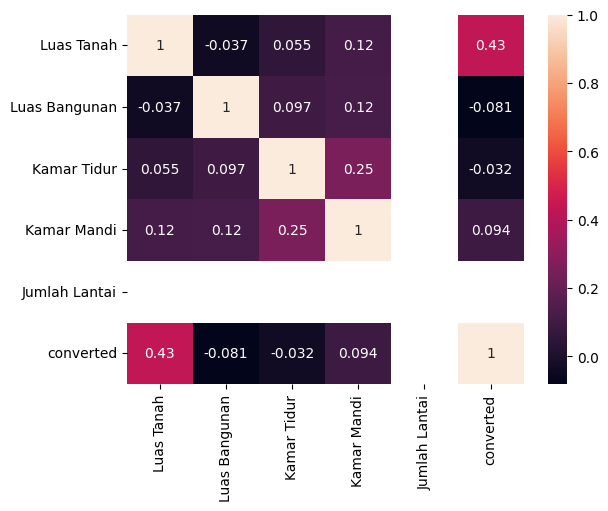

In [ ]:
get_corr(bali_luxury_cleaned)

#### merged

In [ ]:
bali_merged = pd.concat([bali_low_cleaned, bali_low_mid_cleaned, bali_up_mid_cleaned, bali_high_cleaned, bali_luxury_cleaned])

In [ ]:
bali_merged.shape

(1263, 10)

In [ ]:
bali_merged.head()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
0,60,60,2,1,1,Low,Rp 328 Juta,328.0,Juta,328000000.0
1,60,33,2,1,1,Low,Rp 328 Juta,328.0,Juta,328000000.0
3,80,45,2,1,1,Low,Rp 315 Juta,315.0,Juta,315000000.0
4,100,30,2,1,1,Low,Rp 350 Juta,350.0,Juta,350000000.0
5,90,36,2,1,1,Low,Rp 180 Juta,180.0,Juta,180000000.0


In [ ]:
bali_merged.describe()

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,nominal,converted
count,1263.000000,1263.000000,1263.000000,1263.000000,1263.000000,1263.000000,1.263000e+03
mean,226.608076,196.542359,2.952494,2.592241,1.600158,205.084687,4.638462e+09
std,214.347358,187.730122,1.129194,1.464044,0.501250,308.755481,4.876058e+09
min,15.000000,10.000000,1.000000,1.000000,1.000000,1.000000,1.400000e+08
25%,91.000000,60.000000,2.000000,1.000000,1.000000,3.800000,8.000000e+08
50%,125.000000,125.000000,3.000000,2.000000,2.000000,10.000000,2.700000e+09
75%,300.000000,286.000000,3.000000,3.000000,2.000000,328.000000,7.500000e+09
max,1190.000000,950.000000,8.000000,8.000000,3.000000,999.000000,2.000000e+10


In [ ]:
filt = (bali_merged['Luas Tanah'] ==  1) | (bali_merged['Luas Bangunan'] == 1)
bali_merged[filt]

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted


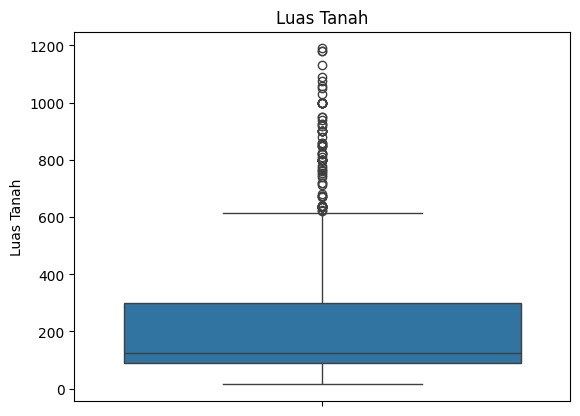

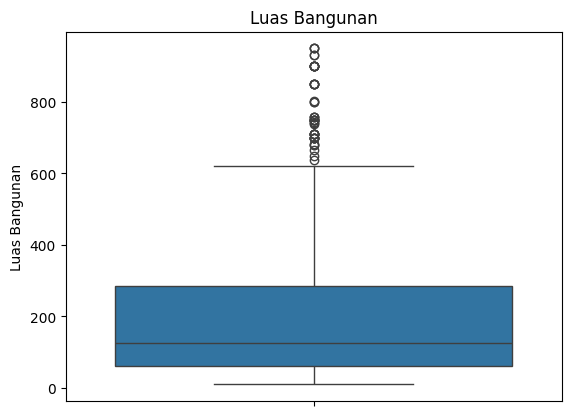

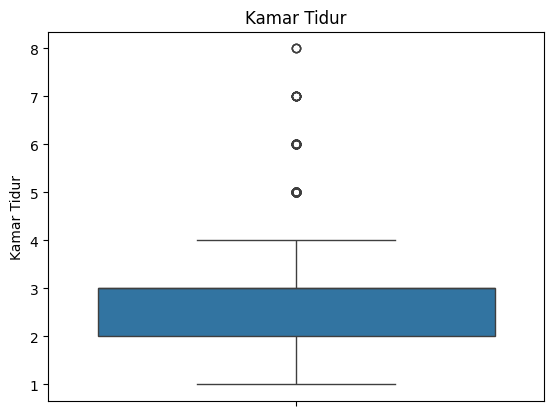

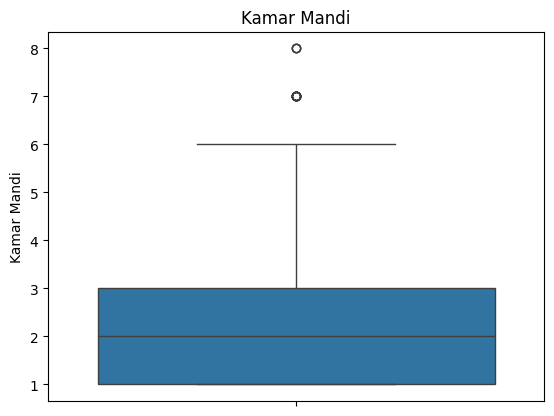

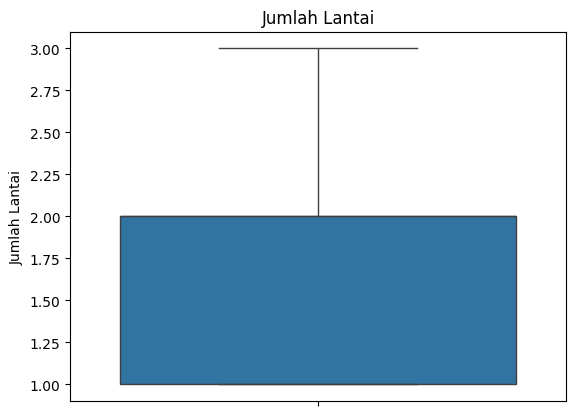

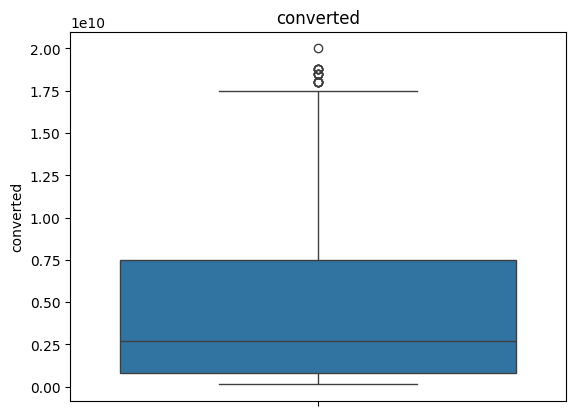

In [ ]:
get_boxplot(bali_merged)

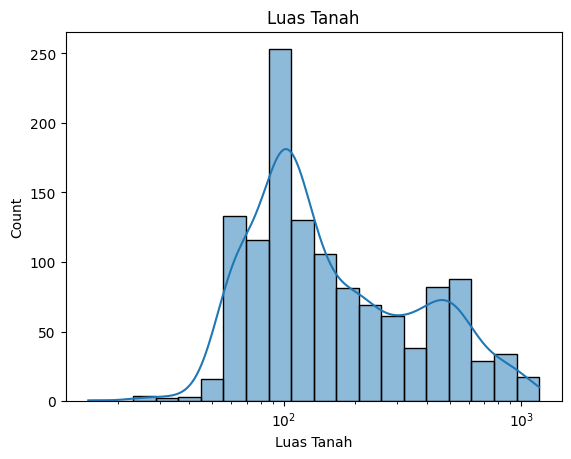

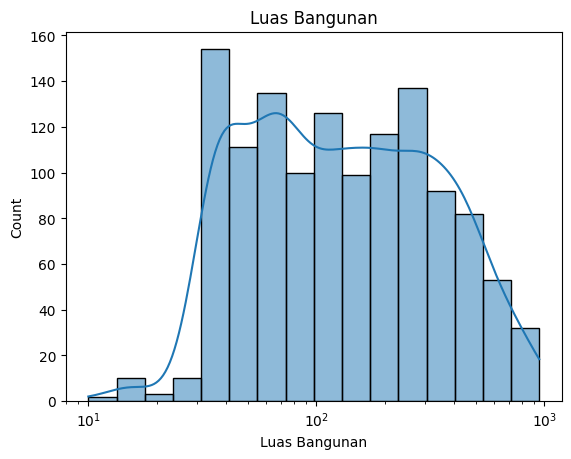

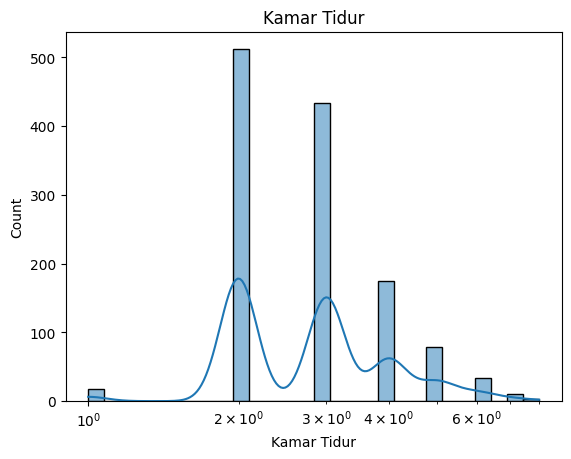

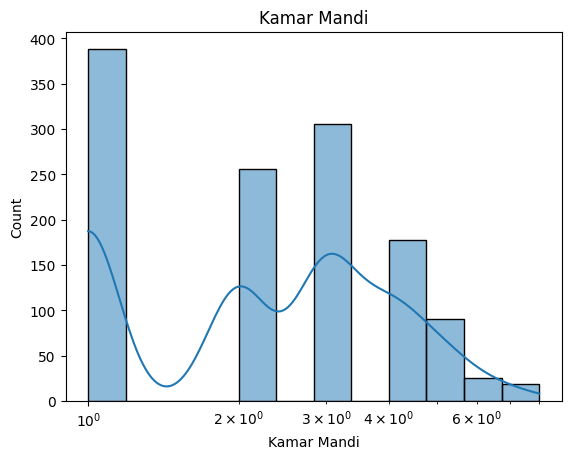

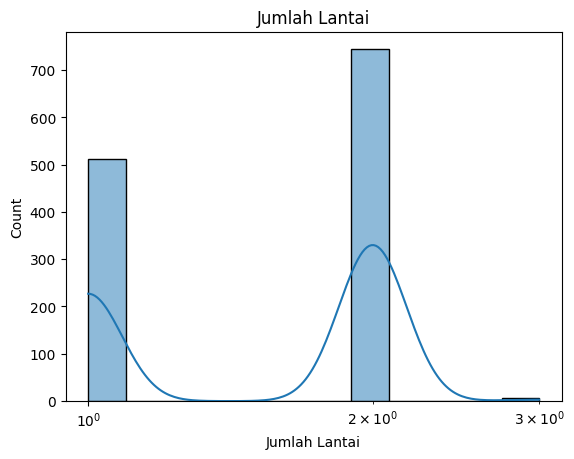

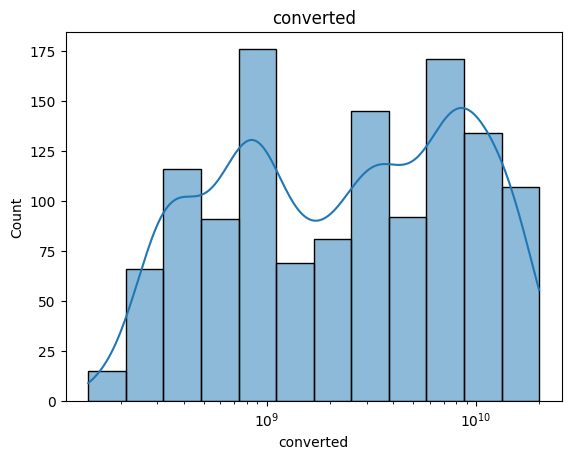

In [ ]:
get_histplot(bali_merged, log_scale=True)

<Axes: >

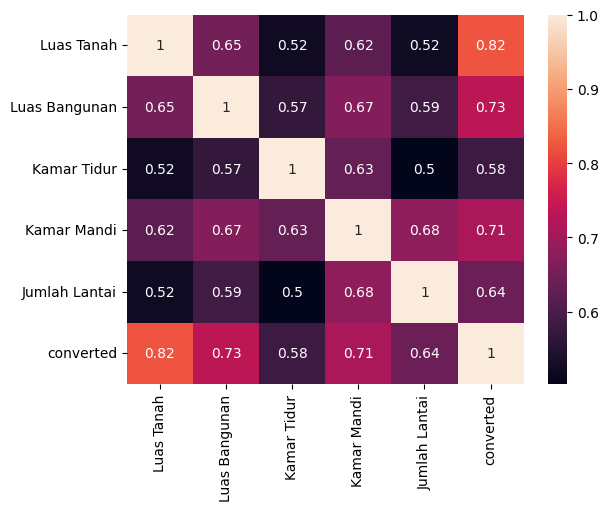

In [ ]:
get_corr(bali_merged)

In [ ]:
bali_merged.to_csv('Bali_merged.csv', index=False)

In [ ]:
get_outlier(bali_merged)

Luas Tanah -- found outliers: 80 
Luas Bangunan -- found outliers: 50 
Kamar Tidur -- found outliers: 47 
Kamar Mandi -- found outliers: 19 
Jumlah Lantai -- found outliers: 0 
converted -- found outliers: 17 


df with outliers
     Luas Tanah  Luas Bangunan  Kamar Tidur  Kamar Mandi  Jumlah Lantai  \
2           100             85            3            3              2   
2           300            290            3            3              2   
2          1000            800            5            5              2   
515         800            445            4            4              2   
517         800            378            2            7              2   
..          ...            ...          ...          ...            ...   
499         188            680            3            6              2   
505         524            270            5            7              2   
506         230            550            6            5              2   
507         420      

In [ ]:
X = bali_merged.drop(columns=['converted', 'Category', 'Harga', 'nominal', 'satuan'])
y = bali_merged['converted']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
xgb_bali = XGBRegressor(random_state=42)

In [ ]:
xgb_bali.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
get_model_summary(xgb_bali, X_test, y_test)

MAE: 1345514958.0395257
MSE: 5.575844086453506e+18
R-squared: 0.752207149717767

Error for cheapest house: 9647840.0
Error for most expensive house: 11969391104.0

MAPE: 33.22%


In [ ]:
bali_merged.sample(3)

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
203,65,30,2,1,1,Low,Rp 370 Juta,370.0,Juta,3.700000e+08
302,87,100,2,1,1,Low-Mid,Rp 850 Juta,850.0,Juta,8.500000e+08
227,940,350,4,4,2,Luxury,"Rp 8,5 Miliar",8.5,Miliar,8.500000e+09


In [ ]:
xgb_bali.predict([[80,	38,	2,	1,	1]])[0]

np.float32(466982400.0)

In [ ]:
xgb_bali.predict([[250,	400,	3,	4,	2]])[0]

np.float32(7410925000.0)

In [ ]:
X_test.sample(3)

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai
114,108,63,2,1,1
9,500,370,3,3,2
714,375,133,4,3,2


In [ ]:
bali_merged.loc[199]

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
199,120,60,2,1,1,Low,Rp 328 Juta,328.0,Juta,3.280000e+08
199,96,36,2,2,1,Low-Mid,Rp 813 Juta,813.0,Juta,8.130000e+08
199,105,80,3,2,1,Up-Mid,"Rp 2,7 Miliar",2.7,Miliar,2.700000e+09
199,280,200,6,4,2,High,"Rp 3,5 Miliar",3.5,Miliar,3.500000e+09


In [ ]:
xgb_bali.predict([[120,	60,	2,	1,	1]])[0]

np.float32(730630700.0)

In [ ]:
bali_robust = RobustScaler()
bali_minmax = MinMaxScaler()

In [ ]:
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = split_scaled(bali_merged, bali_robust, bali_minmax)

In [ ]:
xgb_bali_scaled = XGBRegressor(random_state=42)

In [ ]:
xgb_bali_scaled.fit(X_train_scaled, y_train_scaled)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
get_model_summary_scaled(xgb_bali_scaled, X_test_scaled, y_test_scaled)

MAE: 1364691087.367588
MSE: 6.090577749388357e+18
R-squared: 0.7293321698049108

Error for cheapest house: 224127.99999946356
Error for most expensive house: 10663530495.99997

MAPE: 30.69%


In [ ]:
X_test_scaled.sample(3)

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai
200,-0.311005,-0.326087,0.142857,0.000000,0.0
50,-0.239234,-0.378261,0.142857,0.000000,0.0
305,0.990431,3.586957,0.428571,0.571429,0.5


In [ ]:
X_test_scaled.loc[130]

,130
Luas Tanah,-0.358852
Luas Bangunan,-0.282609
Kamar Tidur,0.142857
Kamar Mandi,0.000000
Jumlah Lantai,0.000000


In [ ]:
y_test_scaled.sample(3)

,converted
44,21.253894
187,21.787977
204,22.023457


In [ ]:
bali_merged.loc[206]

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai,Category,Harga,nominal,satuan,converted
206,91,36,2,1,1,Low,Rp 295 Juta,295.00,Juta,2.950000e+08
206,127,150,3,3,2,Up-Mid,"Rp 2,2 Miliar",2.20,Miliar,2.200000e+09
206,200,200,3,5,2,High,"Rp 3,33 Miliar",3.33,Miliar,3.330000e+09
206,400,250,2,2,2,Luxury,Rp 15 Miliar,15.00,Miliar,1.500000e+10


In [ ]:
inverse_scale_feature(bali_robust, bali_minmax, [0.009569,	0.103672,	0.285714,	0.285714,	0.5])

,Luas Tanah,Luas Bangunan,Kamar Tidur,Kamar Mandi,Jumlah Lantai
0,126.999921,148.84456,2.999998,2.999998,2.0


In [ ]:
test_scaled = [0.009569,	0.103672,	0.285714,	0.285714,	0.5]
y_pred_log = xgb_bali_scaled.predict([test_scaled])[0]

In [ ]:
y_pred_log

np.float32(21.829268)

In [ ]:
np.expm1(y_pred_log)

np.float32(3022250200.0)

In [ ]:
bali_robust = RobustScaler()
bali_minmax = MinMaxScaler()

In [ ]:
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = split_scaled(bali_merged, bali_robust, bali_minmax)

In [ ]:
xgb_bali_scaled = XGBRegressor(objective='reg:squarederror', random_state=42)

In [ ]:
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 1]
}

In [ ]:
bali_grid_search_scaled = GridSearchCV(estimator=xgb_bali_scaled,
                           param_grid=param_grid,
                           cv=10,
                           scoring='neg_mean_squared_error',
                           n_jobs=-1,
                           verbose=2)

In [ ]:
bali_grid_search_scaled.fit(X_train_scaled, y_train_scaled)

Fitting 10 folds for each of 24 candidates, totalling 240 fits


GridSearchCV(cv=10,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None,...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=42, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1], 'max_depth': [3, 5, 7],
                         'n_estimators': [100, 200], 'subsample': [0.8, 1]},
             scoring='neg_mean_squared_error', verbose=2)

In [ ]:
bali_best_model_scaled = bali_grid_search_scaled.best_estimator_

In [ ]:
get_model_summary_scaled(bali_best_model_scaled, X_test_scaled, y_test_scaled)

MAE: 1312058391.2094853
MSE: 5.321511121346149e+18
R-squared: 0.763509813380439

Error for cheapest house: 222720.0000013113
Error for most expensive house: 9564387839.99997

MAPE: 30.50%


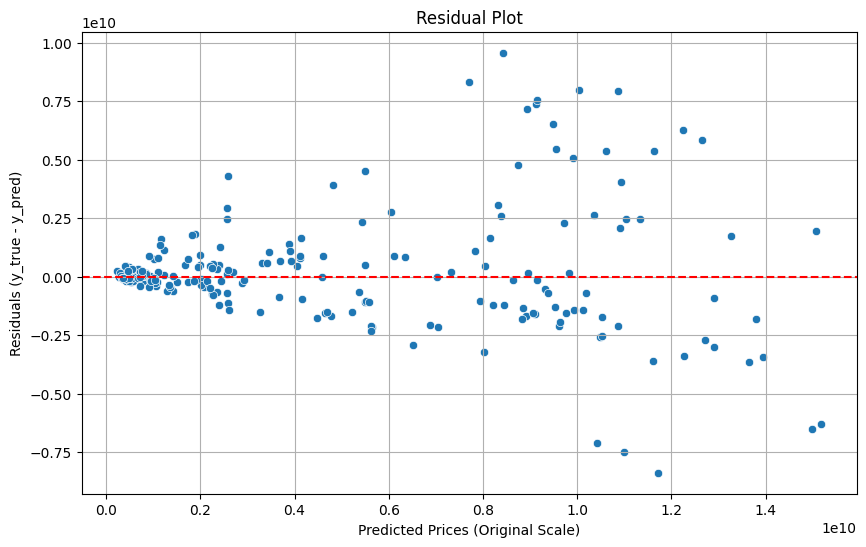

In [ ]:
# Predict log values
y_pred_log = bali_best_model_scaled.predict(X_test_scaled)

# Convert to original scale
y_test_conv = np.expm1(y_test_scaled)
y_pred = np.expm1(y_pred_log)

# Residuals
residuals = y_test_conv - y_pred

# Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_pred, y=residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Predicted Prices (Original Scale)')
plt.ylabel('Residuals (y_true - y_pred)')
plt.title('Residual Plot')
plt.grid(True)
plt.show()

In [ ]:
for true_val, pred_val in zip(y_test_conv[:10], y_pred[:10]):
    print(f"True: {true_val:.2f}, Pred: {pred_val:.2f}")

True: 7000000000.00, Pred: 6115520512.00
True: 3500000000.00, Pred: 10987307008.00
True: 1450000000.00, Pred: 2584466176.00
True: 865000000.00, Pred: 417427232.00
True: 857000000.00, Pred: 1033593728.00
True: 3350000000.00, Pred: 11722728448.00
True: 418000000.00, Pred: 435122464.00
True: 3100000000.00, Pred: 4782754304.00
True: 295000000.00, Pred: 336996768.00
True: 4700000000.00, Pred: 5364067840.00


<Axes: xlabel='Luas Bangunan', ylabel='converted'>

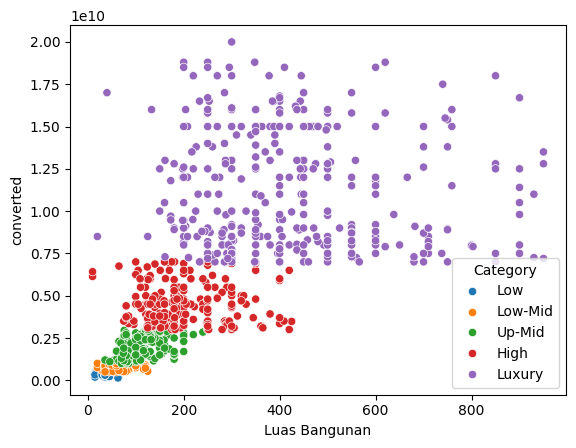

In [ ]:
sns.scatterplot(data=bali_merged, x='Luas Bangunan', y='converted', hue='Category')